<a href="https://colab.research.google.com/github/nailanurulanisah/Tugas5_DLL_GAN/blob/main/Tugas5_DLL_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Nama : Naila Nurul Anisah**
# **NIM : 41236626**
# **Kelas : TI 2023 KIP C1**

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

# Konfigurasi agar GPU digunakan secara efisien
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU Terdeteksi: ", physical_devices[0])
else:
    print("Peringatan: GPU tidak terdeteksi. Training akan lambat.")

GPU Terdeteksi:  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [2]:
# Create the .kaggle directory if it doesn't exist
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the .kaggle directory
# IMPORTANT: Make sure you have uploaded kaggle.json to your Colab session's /content/ directory first.
# If you uploaded it somewhere else, adjust the source path accordingly.
!mv /content/kaggle.json ~/.kaggle/

# Set read-only permissions for the kaggle.json file for security
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle API credentials set up successfully!")

Kaggle API credentials set up successfully!


In [3]:
# Install kaggle if not already installed
!pip install -q kaggle

# Make sure your Kaggle API credentials (kaggle.json) are set up in ~/.kaggle/
# If you haven't done this, please refer to the previous instructions.

# Download the dataset
!kaggle datasets download -d joosthazelzet/lego-brick-images

# Unzip the downloaded dataset to the specified directory
# The zip file will be downloaded to the current working directory (/content/)
!unzip -q /content/lego-brick-images.zip -d /content/dataset/

# Clean up the zip file after extraction
!rm /content/lego-brick-images.zip

print("Dataset downloaded and extracted to /content/dataset/")

Dataset URL: https://www.kaggle.com/datasets/joosthazelzet/lego-brick-images
License(s): GPL-2.0
 97% 991M/1.00G [00:05<00:00, 132MB/s]
100% 1.00G/1.00G [00:05<00:00, 202MB/s]
Dataset downloaded and extracted to /content/dataset/


In [4]:
# Parameter Konfigurasi
BATCH_SIZE = 64
IMG_HEIGHT = 64  # Menggunakan 64x64 agar detail LEGO cukup terlihat
IMG_WIDTH = 64
CHANNELS = 3     # RGB


# --- OPSI B: Membuat Dataset Loader ---
# Ganti 'path/to/images' dengan path folder dataset Anda
dataset_dir = '/content/dataset/LEGO brick images v1'

# Jika folder kosong/tidak ada, kita buat dummy data agar kode tetap jalan (untuk testing)
if not os.path.exists(dataset_dir) or not os.listdir(dataset_dir):
    print("Dataset tidak ditemukan. Membuat data dummy untuk demonstrasi struktur kode.")
    os.makedirs(dataset_dir, exist_ok=True)
    # Membuat 100 gambar random noise sebagai placeholder
    for i in range(100):
        img = np.random.randint(0, 255, (64, 64, 3), dtype=np.uint8)
        tf.keras.utils.save_img(f"{dataset_dir}/dummy_{i}.png", img)

# Memuat dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_dir,
    label_mode=None, # Kita tidak butuh label untuk GAN
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE
)

# Normalisasi ke [-1, 1]
train_dataset = train_dataset.map(lambda x: (x - 127.5) / 127.5)

# Optimasi performa (Caching & Prefetching)
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 6379 files.


In [5]:
latent_dim = 128

def build_generator():
    model = keras.Sequential(name="generator")

    # Input: Latent Vector
    # Mulai dengan dense layer yang cukup besar untuk di-reshape
    # Kita ingin mulai dari ukuran 8x8 dengan 512 filter
    model.add(layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Reshape menjadi tensor 3D
    model.add(layers.Reshape((8, 8, 512)))

    # Upsampling 1: 8x8 -> 16x16
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 2: 16x16 -> 32x32
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 3: 32x32 -> 64x64
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Output Layer: 64x64 -> 64x64x3 (RGB)
    # Aktivasi TANH penting agar output di range [-1, 1]
    model.add(layers.Conv2D(CHANNELS, (3, 3), padding='same', activation='tanh'))

    return model

def build_discriminator():
    model = keras.Sequential(name="discriminator")

    # Input: Gambar 64x64x3
    # Downsampling 1: 64 -> 32
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 2: 32 -> 16
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 3: 16 -> 8
    model.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten dan Output
    model.add(layers.Flatten())
    model.add(layers.Dense(1)) # Output berupa logit (skor real/fake)

    return model

# Inisialisasi Model
generator = build_generator()
discriminator = build_discriminator()

generator.summary()
# discriminator.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32768)          │     4,194,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32768)          │       131,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 3)      │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,081,411 (27.01 MB)

 Trainable params: 7,014,979 (26.76 MB)

 Non-trainable params: 66,432 (259.50 KB)

In [6]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        # Metric trackers
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # 1. Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 2. Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # 3. Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # 4. Assemble labels discriminating real from fake images
        # Label 1 untuk fake, 0 untuk real (atau sebaliknya, teknik ini menggunakan label smoothing)
        # Di sini kita pakai standar: 1=Real, 0=Fake.
        # Namun, karena kita concat [Fake, Real], maka labelnya: [0...0, 1...1]
        labels = tf.concat(
            [tf.zeros((batch_size, 1)), tf.ones((batch_size, 1))], axis=0
        )

        # Tambahkan sedikit noise pada label (Label Smoothing) untuk stabilitas
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # 5. Train the Discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)

        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # 6. Sample random points in the latent space (lagi, untuk Generator)
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 7. Assemble labels that say "all real images" (We want to fool the discriminator)
        misleading_labels = tf.ones((batch_size, 1))

        # 8. Train the Generator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)

        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [7]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 127.5
        generated_images += 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(10, 4))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show() # Tampilkan inline di Colab

        # Opsional: Simpan ke file
        # plt.savefig(f"generated_lego_epoch_{epoch}.png")
        # plt.close()

Mulai Training...
Epoch 1/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - d_loss: 0.4759 - g_loss: 0.7327

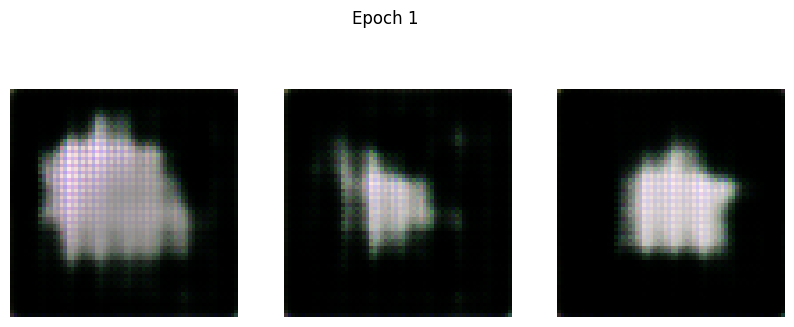

100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 205ms/step - d_loss: 0.4765 - g_loss: 0.7331
Epoch 2/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 0.6675 - g_loss: 0.7534

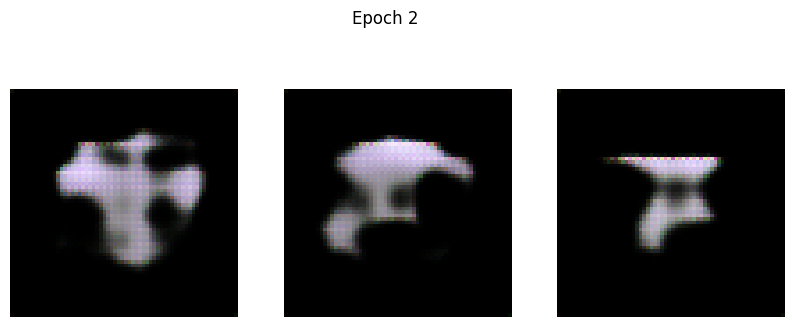

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.6676 - g_loss: 0.7534
Epoch 3/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.6719 - g_loss: 0.7273

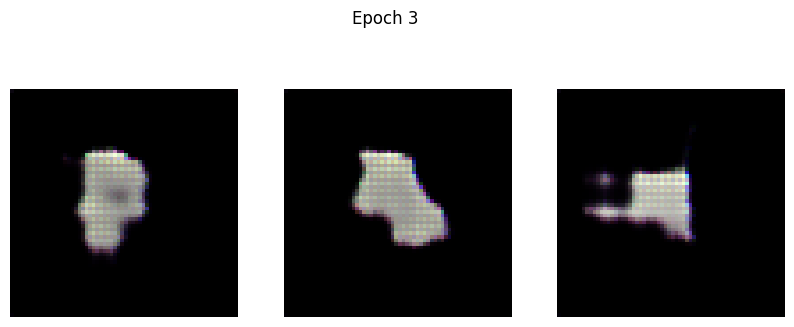

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6718 - g_loss: 0.7274
Epoch 4/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6503 - g_loss: 0.7832

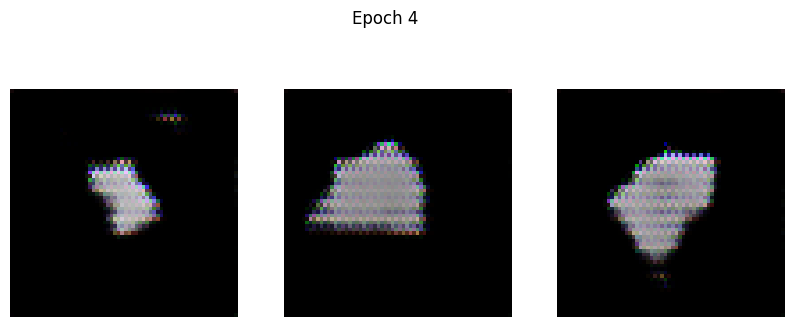

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6504 - g_loss: 0.7833
Epoch 5/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6347 - g_loss: 0.8364

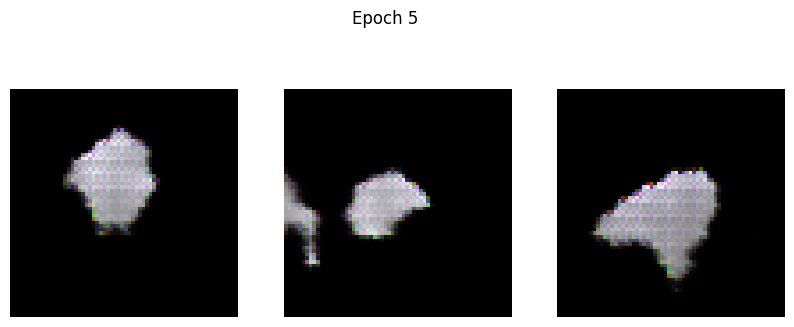

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.6348 - g_loss: 0.8363
Epoch 6/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6310 - g_loss: 0.8485

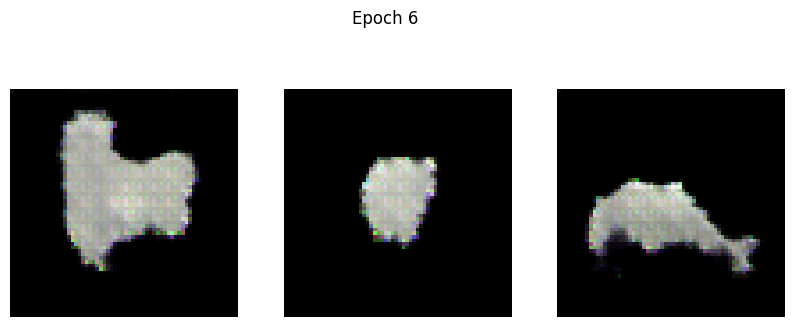

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6311 - g_loss: 0.8485
Epoch 7/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.6542 - g_loss: 0.7934

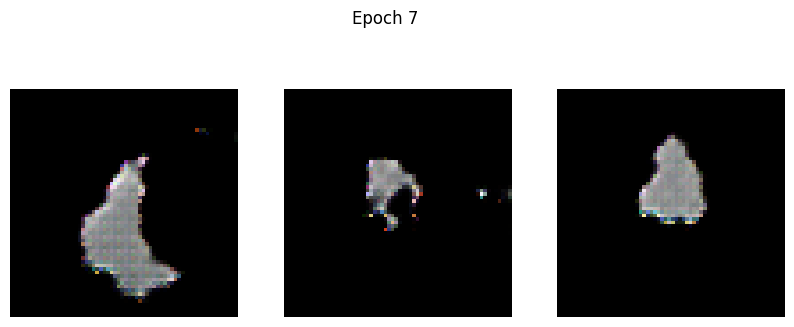

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.6542 - g_loss: 0.7937
Epoch 8/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.6392 - g_loss: 0.7960

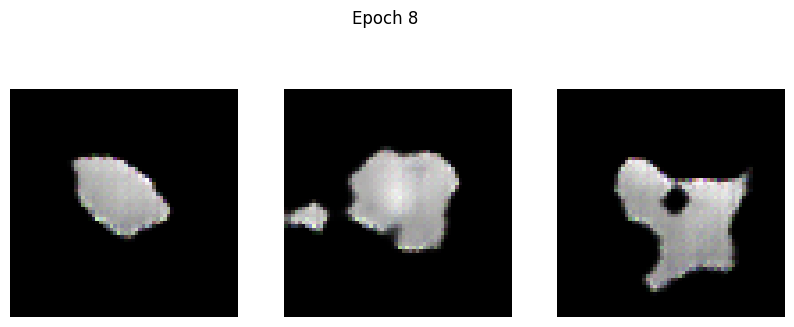

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.6392 - g_loss: 0.7957
Epoch 9/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.6526 - g_loss: 0.7568

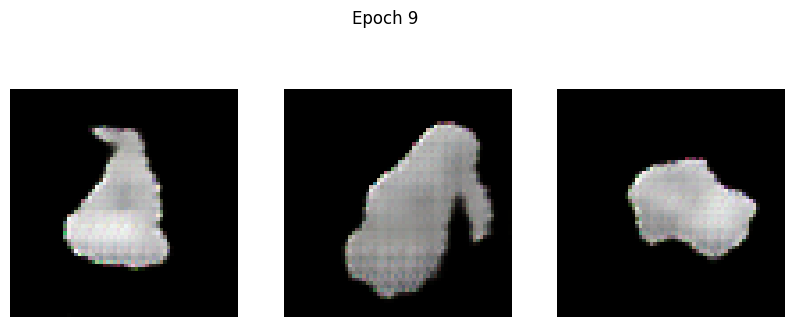

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.6526 - g_loss: 0.7569
Epoch 10/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.6466 - g_loss: 0.7855

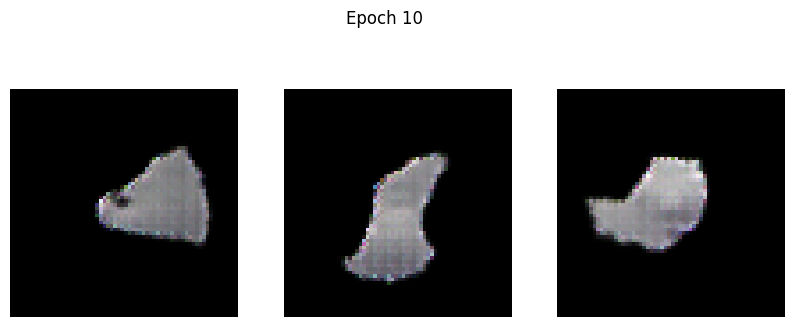

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.6466 - g_loss: 0.7856
Epoch 11/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6419 - g_loss: 0.7920

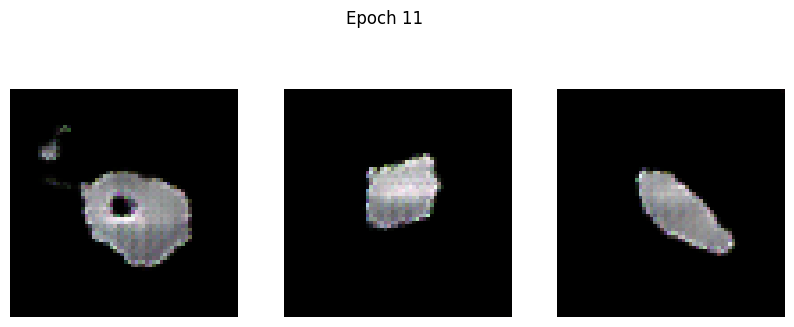

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6419 - g_loss: 0.7922
Epoch 12/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6285 - g_loss: 0.7994

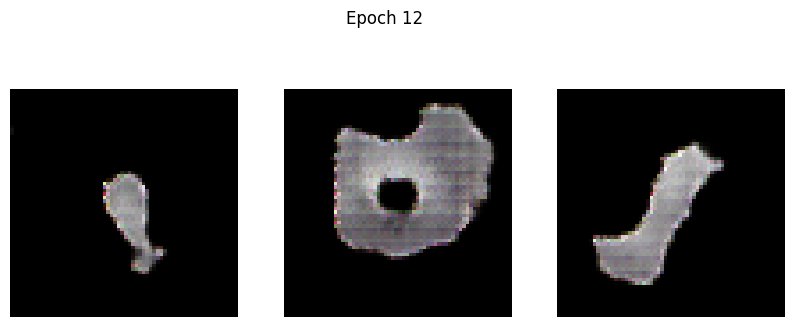

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6285 - g_loss: 0.7997
Epoch 13/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.6285 - g_loss: 0.8277

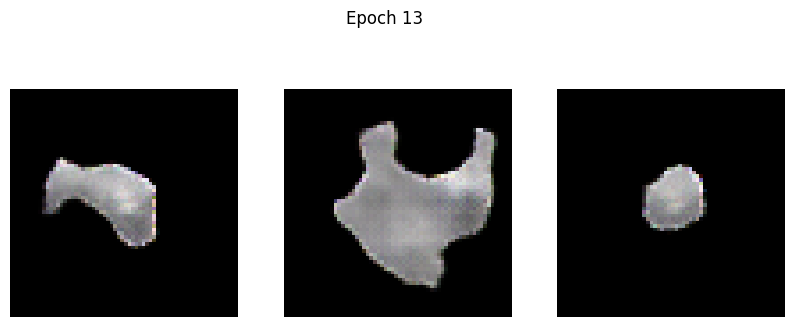

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6284 - g_loss: 0.8277
Epoch 14/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6116 - g_loss: 0.8624

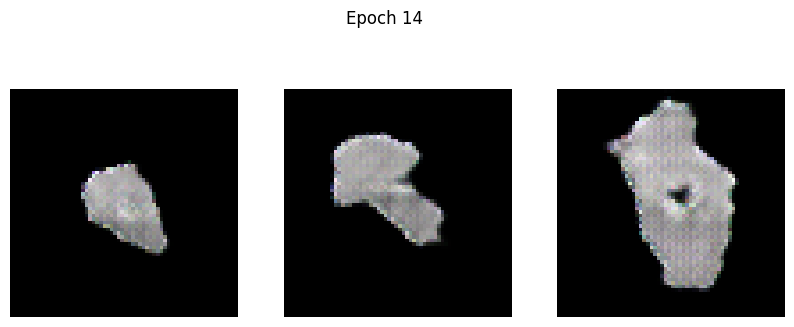

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - d_loss: 0.6116 - g_loss: 0.8626
Epoch 15/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.5999 - g_loss: 0.9274

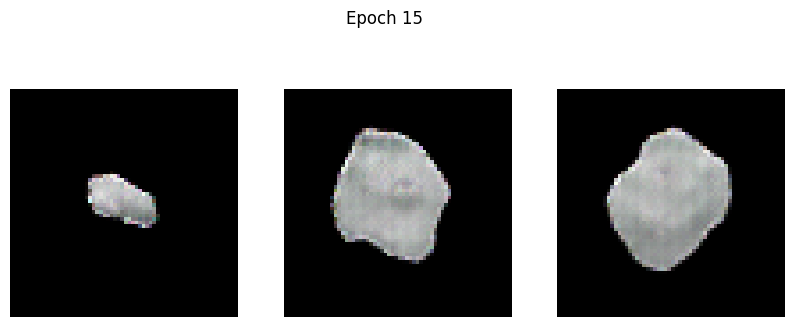

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.5999 - g_loss: 0.9272
Epoch 16/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.5818 - g_loss: 0.8982

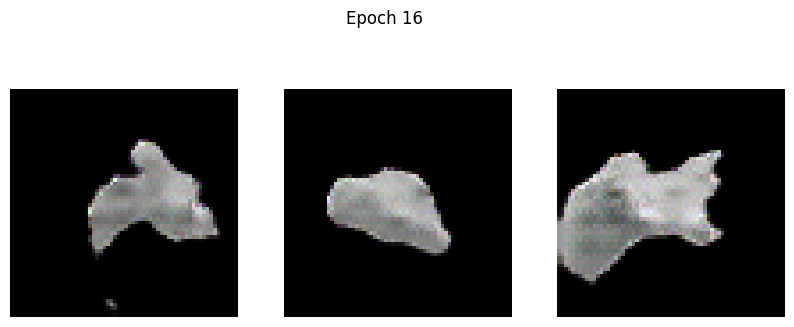

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.5818 - g_loss: 0.8984
Epoch 17/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.5764 - g_loss: 0.9354

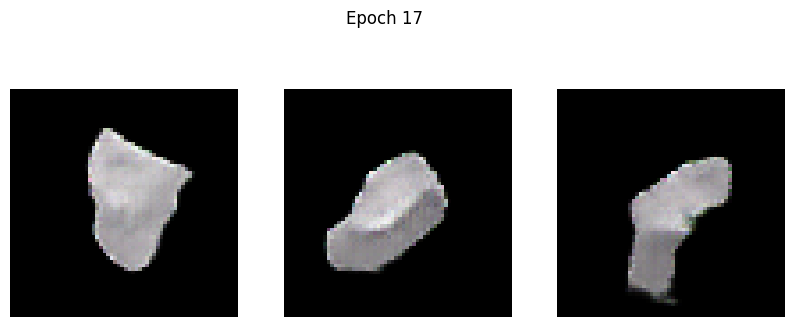

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.5765 - g_loss: 0.9354
Epoch 18/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.5639 - g_loss: 0.9224

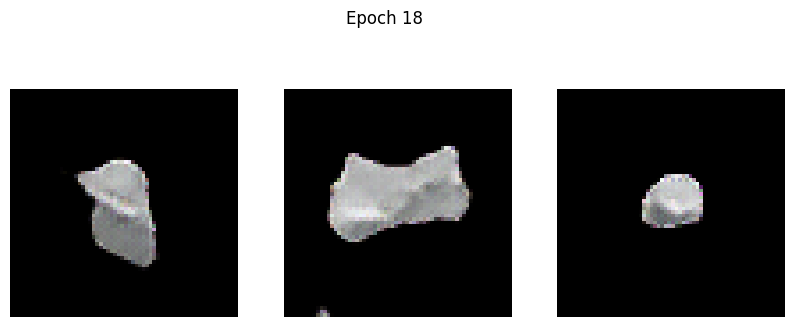

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.5639 - g_loss: 0.9227
Epoch 19/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.5553 - g_loss: 0.9772

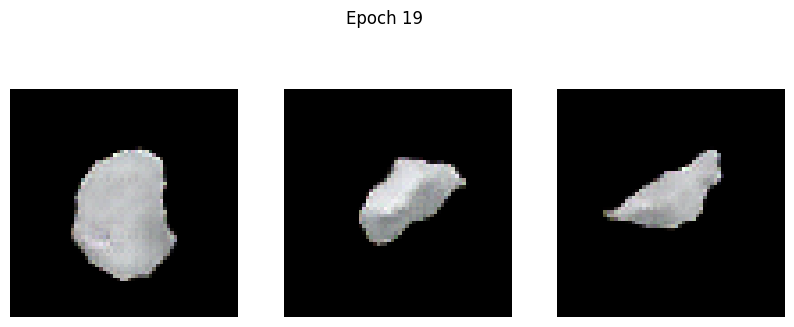

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.5553 - g_loss: 0.9773
Epoch 20/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.5346 - g_loss: 1.0221

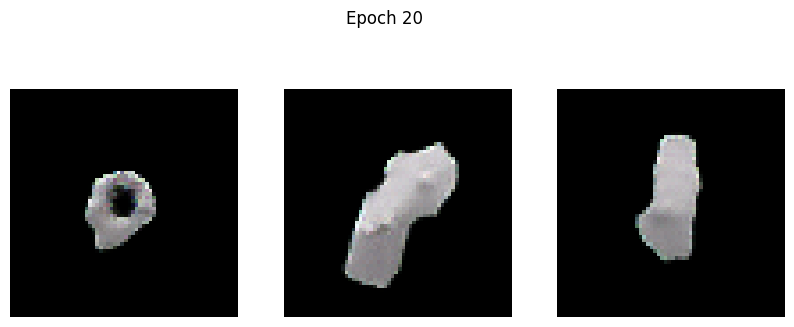

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.5346 - g_loss: 1.0223
Epoch 21/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.5294 - g_loss: 1.0656

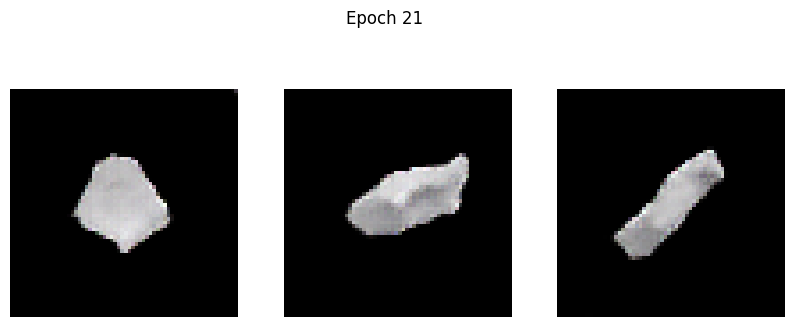

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.5294 - g_loss: 1.0657
Epoch 22/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.5279 - g_loss: 1.1148

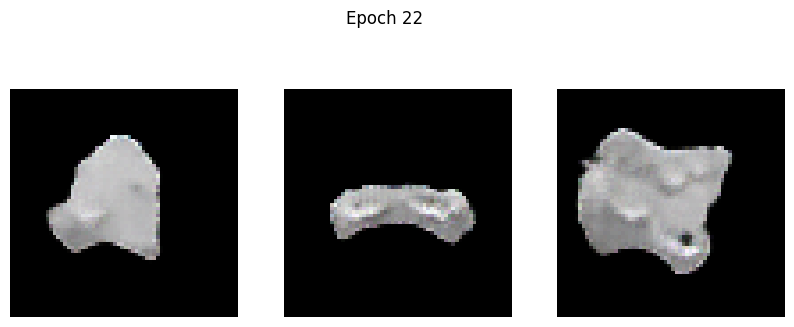

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.5280 - g_loss: 1.1148
Epoch 23/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.5038 - g_loss: 1.1265

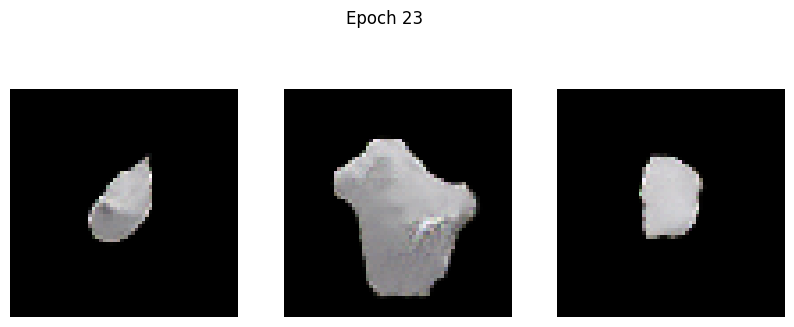

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.5038 - g_loss: 1.1266
Epoch 24/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4841 - g_loss: 1.1894

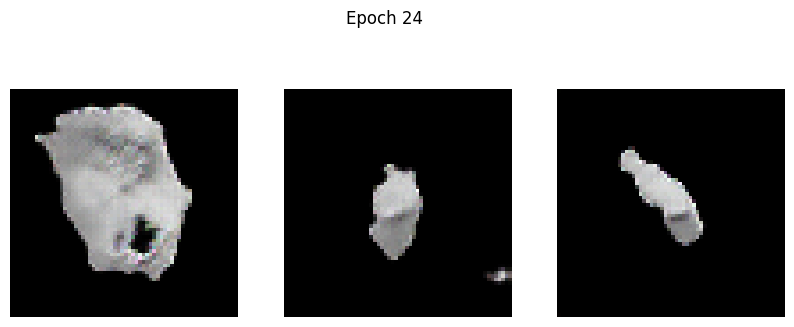

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.4843 - g_loss: 1.1894
Epoch 25/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4703 - g_loss: 1.1649

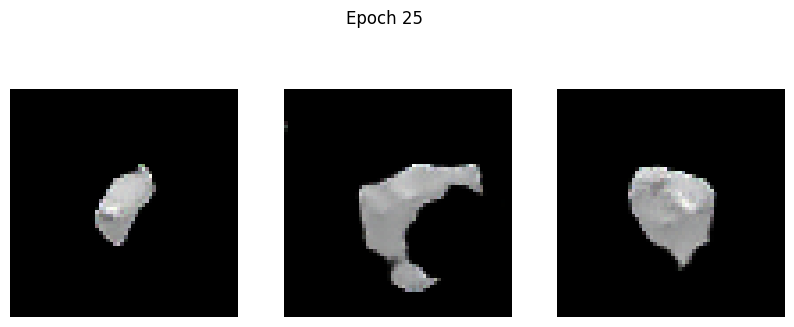

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.4704 - g_loss: 1.1650
Epoch 26/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4894 - g_loss: 1.2532

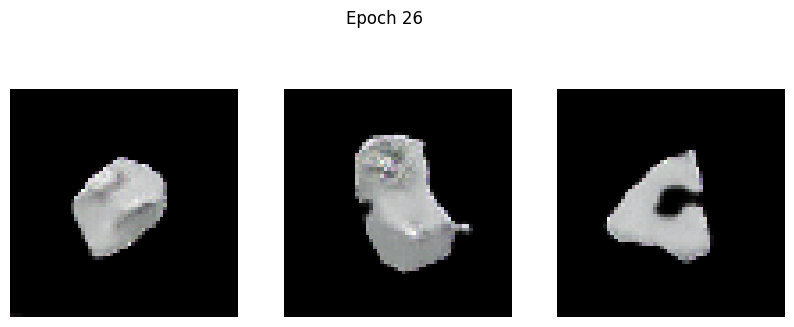

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.4892 - g_loss: 1.2531
Epoch 27/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4437 - g_loss: 1.2964

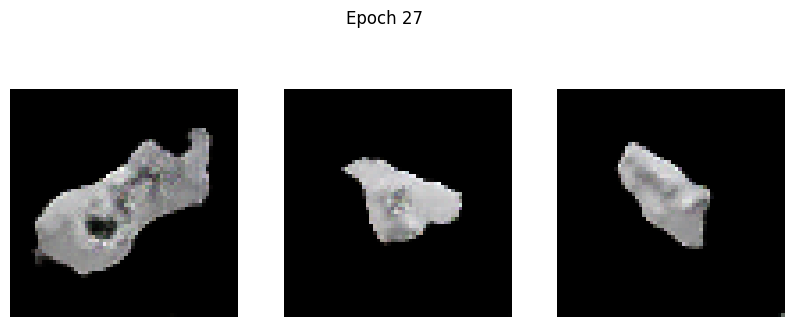

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.4440 - g_loss: 1.2964
Epoch 28/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4373 - g_loss: 1.2270

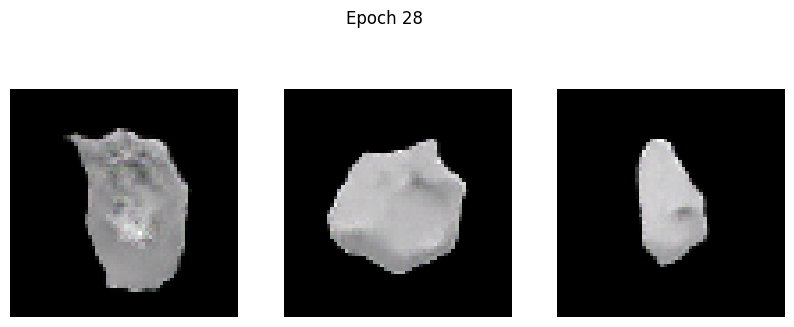

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.4373 - g_loss: 1.2276
Epoch 29/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4456 - g_loss: 1.3882

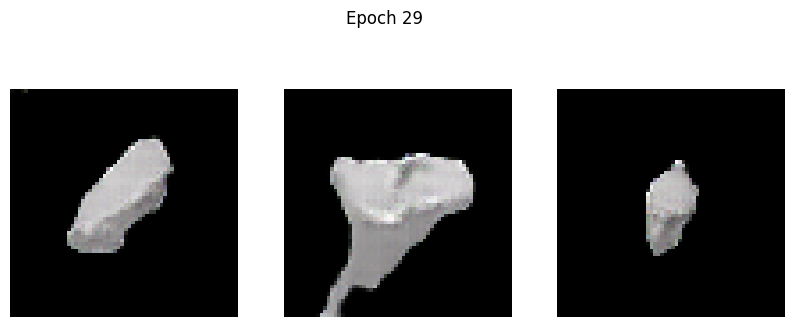

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.4456 - g_loss: 1.3881
Epoch 30/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4461 - g_loss: 1.3497

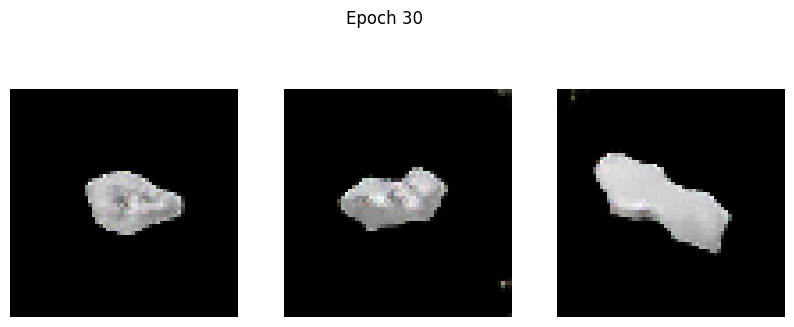

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.4465 - g_loss: 1.3498
Epoch 31/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4410 - g_loss: 1.2271

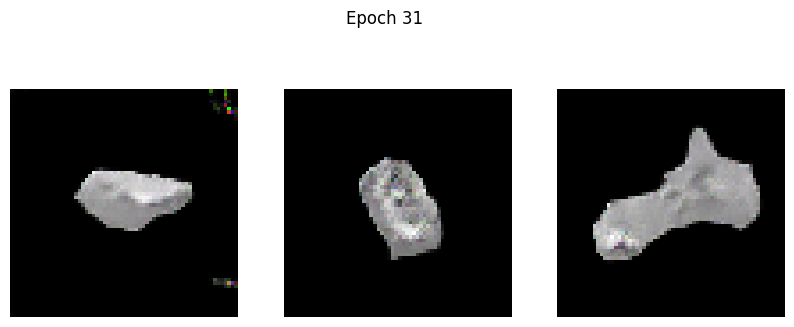

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.4409 - g_loss: 1.2276
Epoch 32/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4259 - g_loss: 1.3536

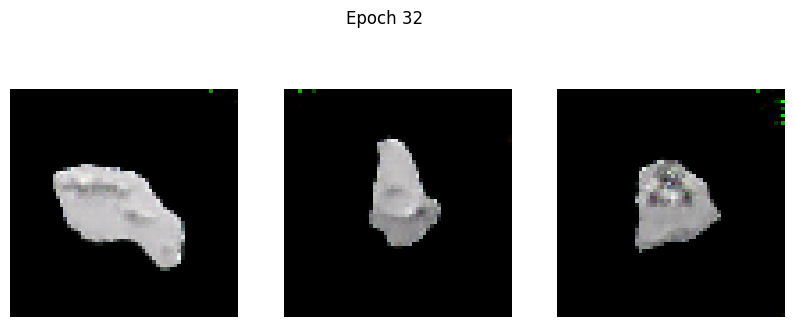

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.4259 - g_loss: 1.3538
Epoch 33/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4172 - g_loss: 1.4264

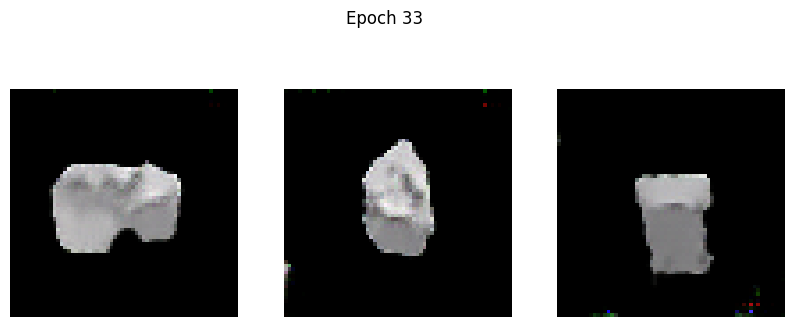

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.4174 - g_loss: 1.4265
Epoch 34/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4248 - g_loss: 1.4285

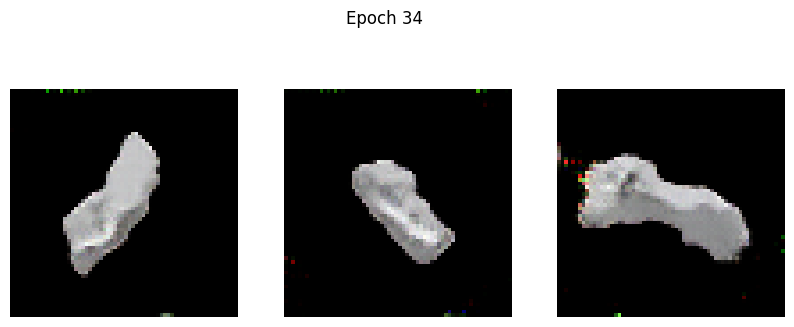

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.4248 - g_loss: 1.4284
Epoch 35/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4133 - g_loss: 1.4766

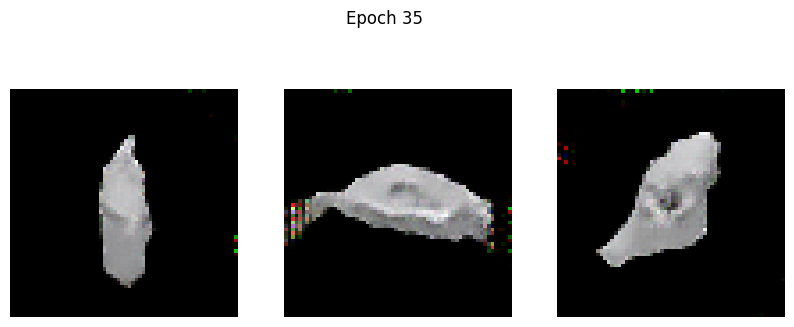

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.4136 - g_loss: 1.4769
Epoch 36/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3826 - g_loss: 1.4180

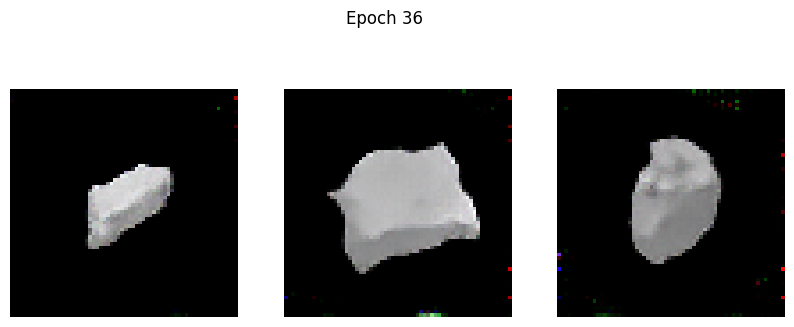

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3827 - g_loss: 1.4182
Epoch 37/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4061 - g_loss: 1.5456

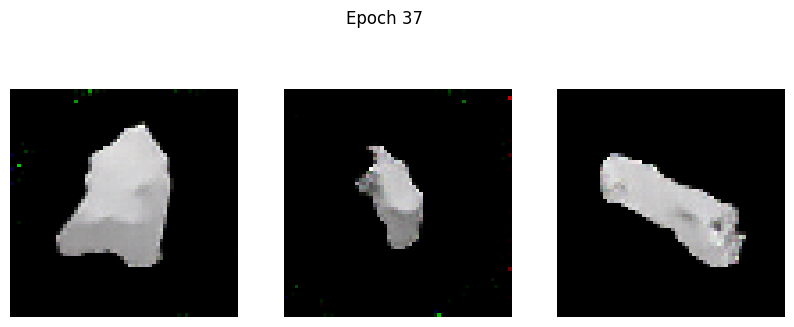

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.4064 - g_loss: 1.5460
Epoch 38/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3678 - g_loss: 1.4365

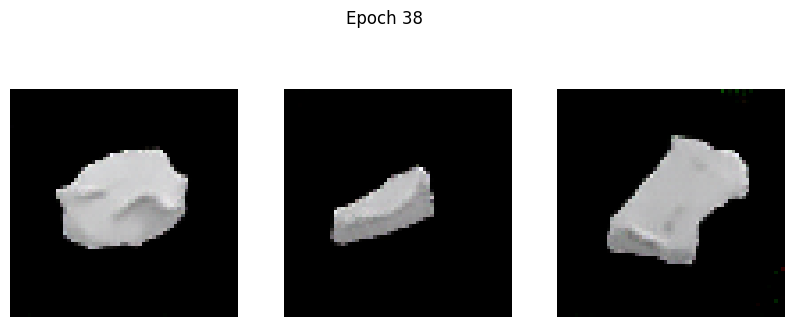

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3679 - g_loss: 1.4368
Epoch 39/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3999 - g_loss: 1.5654

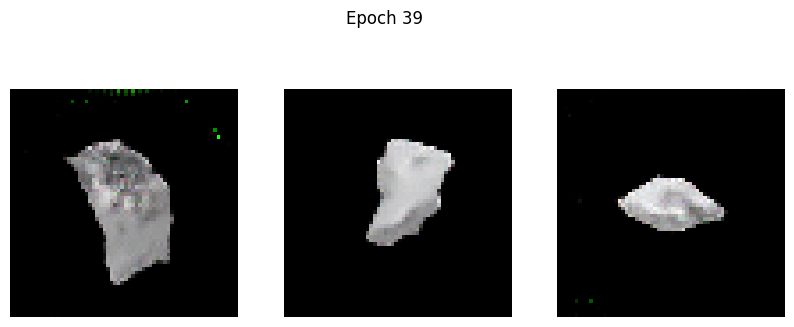

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3997 - g_loss: 1.5651
Epoch 40/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3654 - g_loss: 1.5917

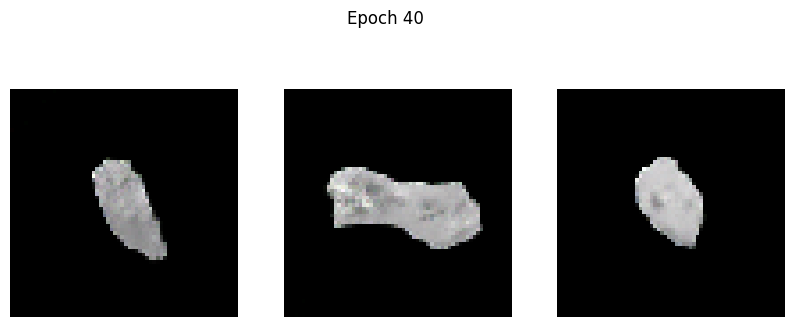

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3654 - g_loss: 1.5915
Epoch 41/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4000 - g_loss: 1.6083

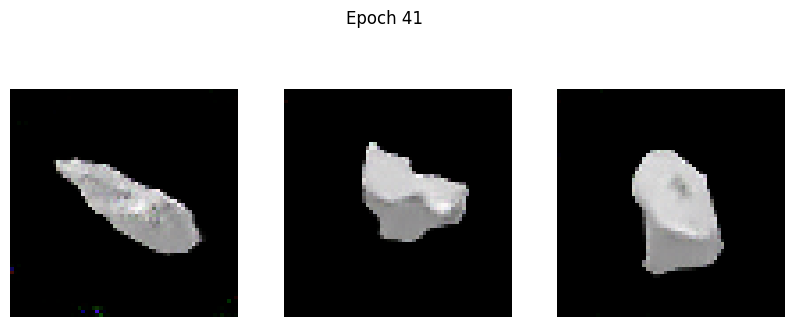

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3998 - g_loss: 1.6081
Epoch 42/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.3831 - g_loss: 1.6742

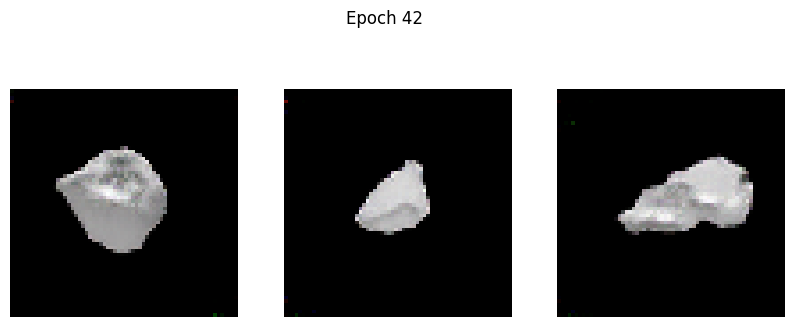

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3831 - g_loss: 1.6741
Epoch 43/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.3461 - g_loss: 1.6668

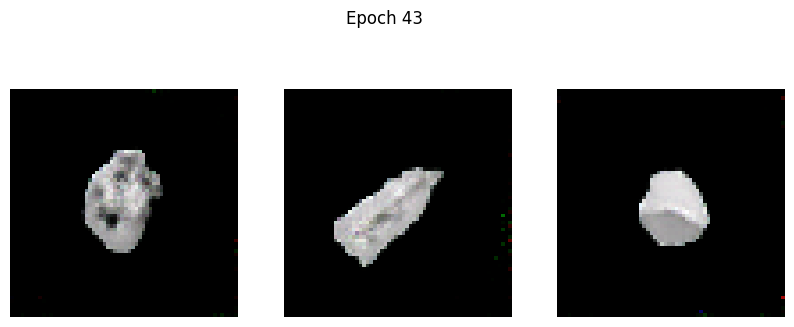

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3464 - g_loss: 1.6670
Epoch 44/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3597 - g_loss: 1.7221

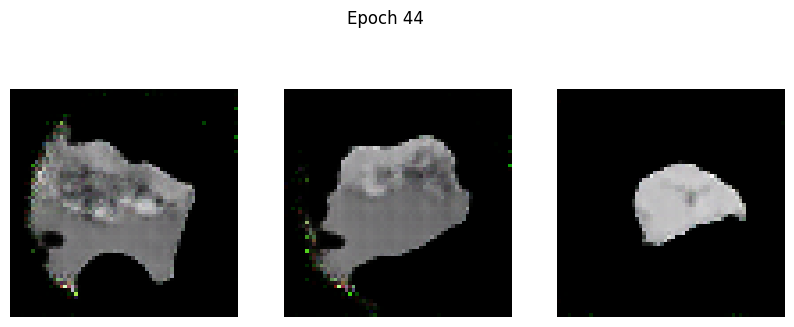

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3597 - g_loss: 1.7218
Epoch 45/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3612 - g_loss: 1.7134

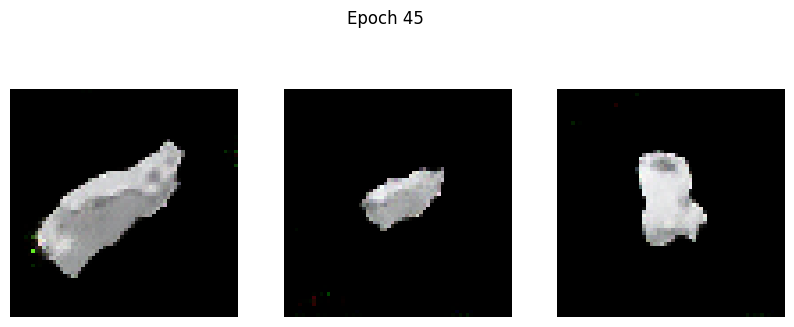

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3611 - g_loss: 1.7129
Epoch 46/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3318 - g_loss: 1.7369

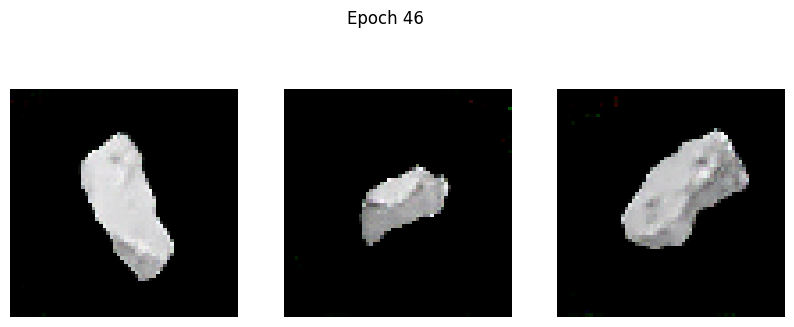

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3319 - g_loss: 1.7370
Epoch 47/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3534 - g_loss: 1.6933

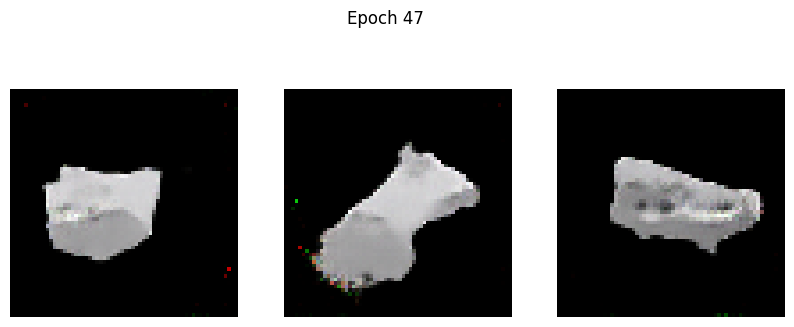

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3533 - g_loss: 1.6934
Epoch 48/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.3624 - g_loss: 1.8132

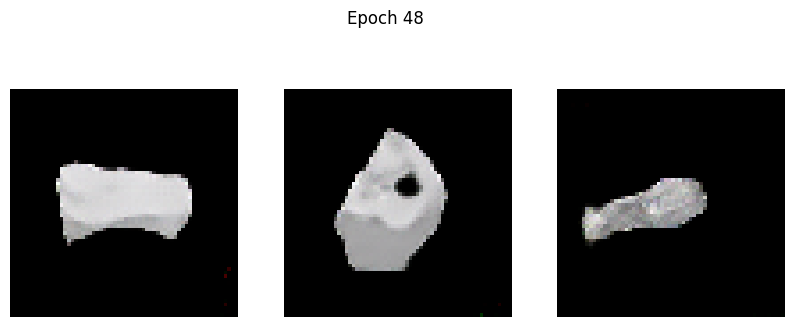

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - d_loss: 0.3624 - g_loss: 1.8127
Epoch 49/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3139 - g_loss: 1.7708

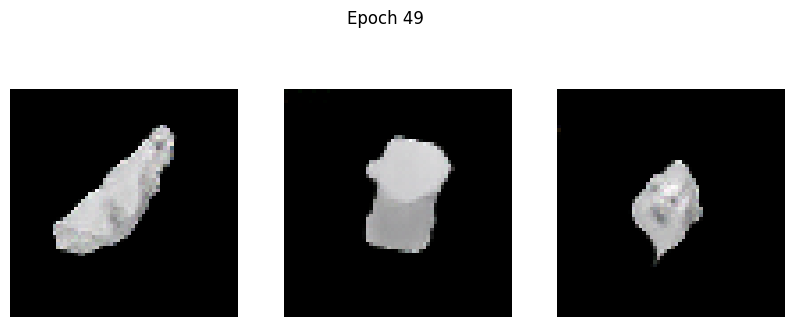

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3141 - g_loss: 1.7710
Epoch 50/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3535 - g_loss: 1.8265

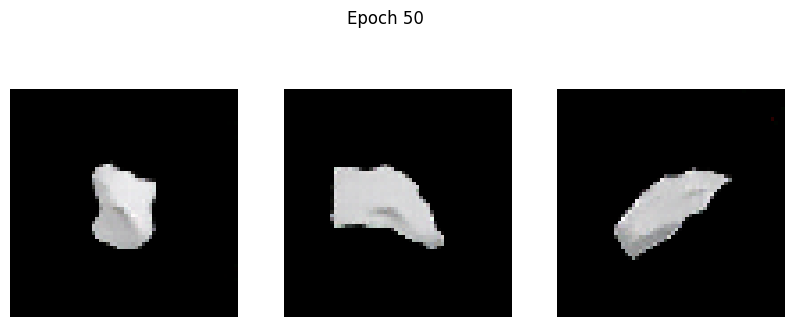

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3535 - g_loss: 1.8264
Epoch 51/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3236 - g_loss: 1.7756

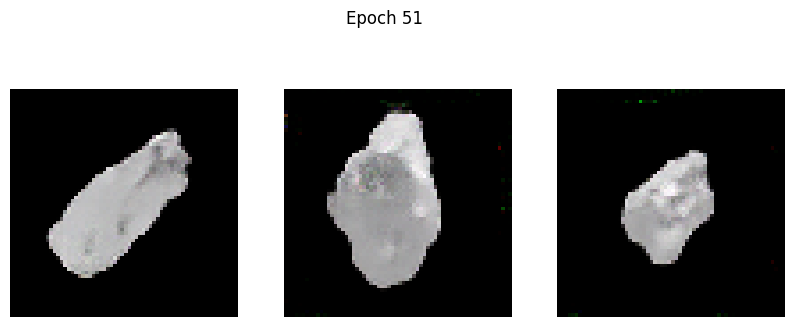

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3235 - g_loss: 1.7757
Epoch 52/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.3523 - g_loss: 1.8577

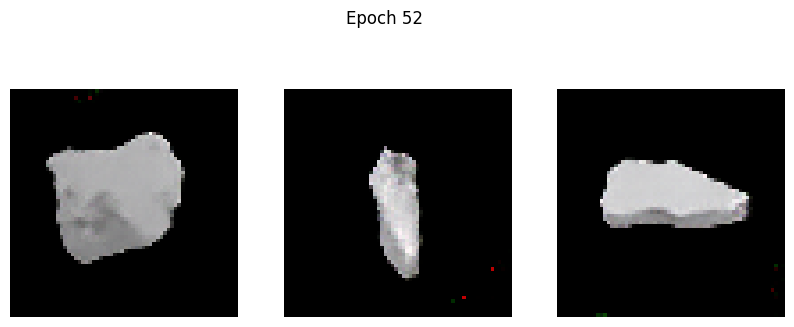

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.3521 - g_loss: 1.8576
Epoch 53/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.3535 - g_loss: 1.9373

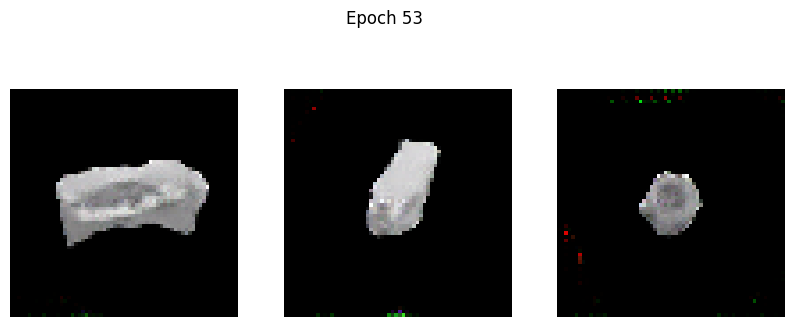

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.3535 - g_loss: 1.9366
Epoch 54/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.3024 - g_loss: 1.8635

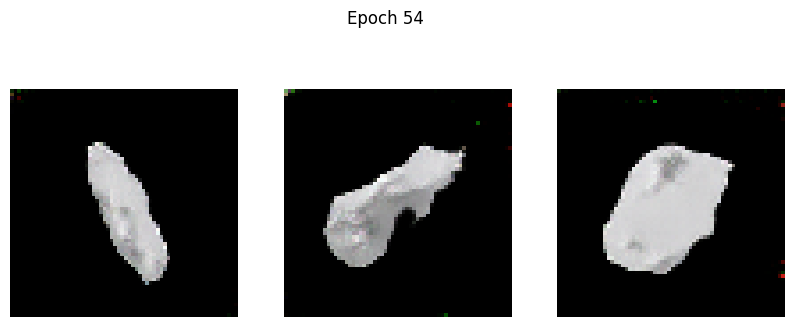

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.3024 - g_loss: 1.8635
Epoch 55/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.3406 - g_loss: 1.9394

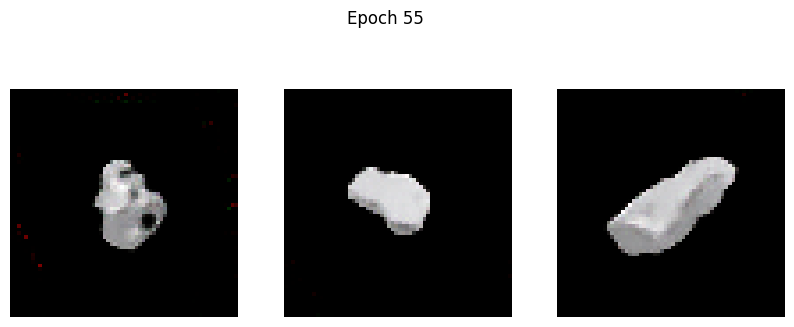

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3406 - g_loss: 1.9391
Epoch 56/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3819 - g_loss: 1.9257

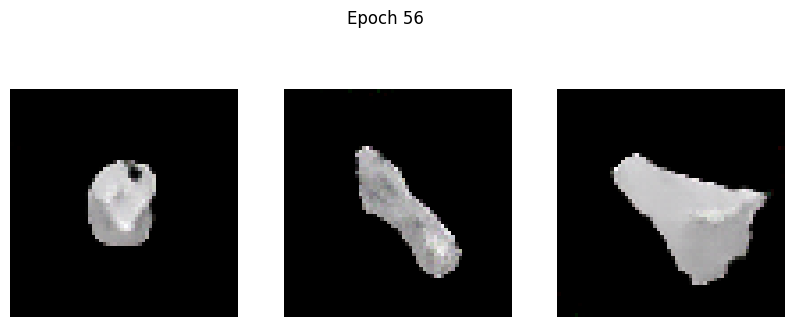

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3816 - g_loss: 1.9251
Epoch 57/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3260 - g_loss: 1.9371

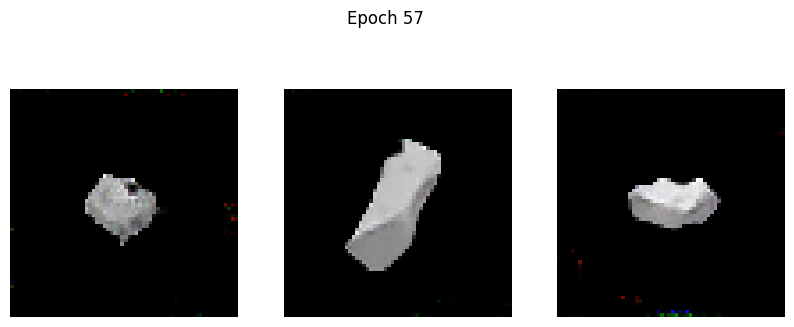

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3259 - g_loss: 1.9368
Epoch 58/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3113 - g_loss: 1.9759

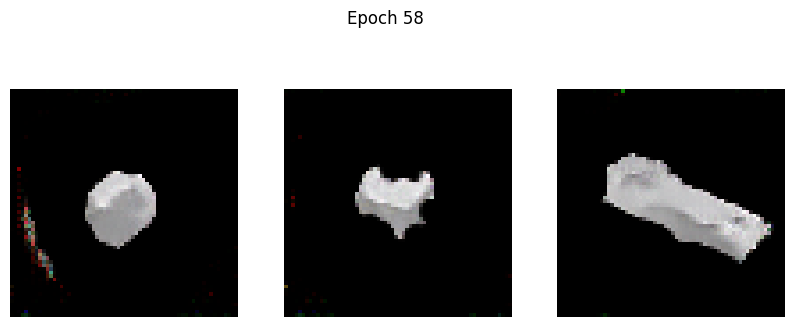

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3115 - g_loss: 1.9757
Epoch 59/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2827 - g_loss: 1.8735

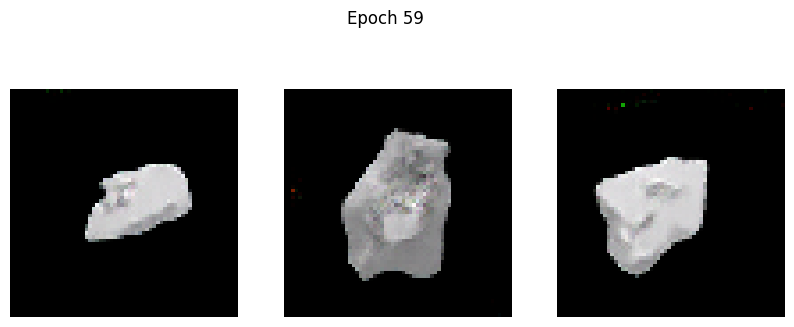

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2827 - g_loss: 1.8741
Epoch 60/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.3567 - g_loss: 1.9874

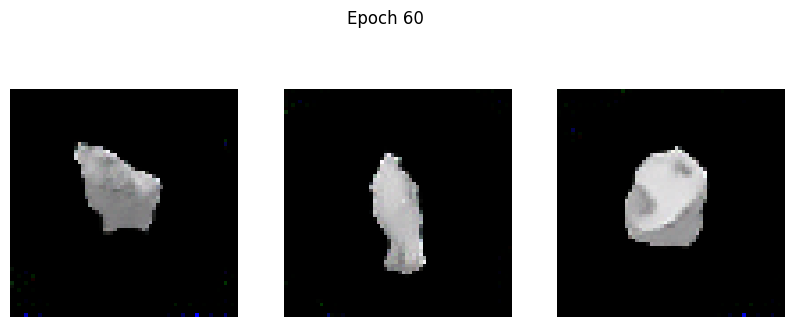

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.3566 - g_loss: 1.9874
Epoch 61/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2947 - g_loss: 1.9682

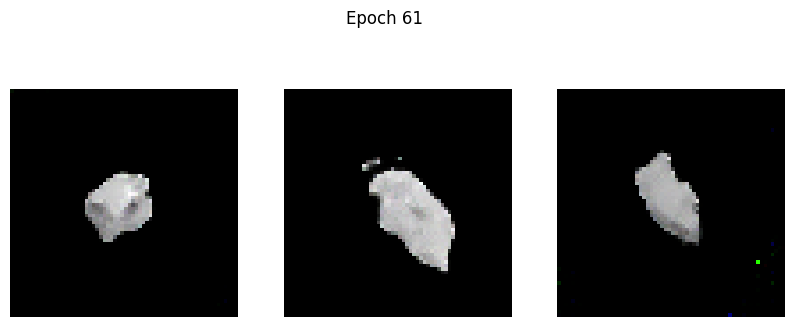

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2949 - g_loss: 1.9681
Epoch 62/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3469 - g_loss: 2.0193

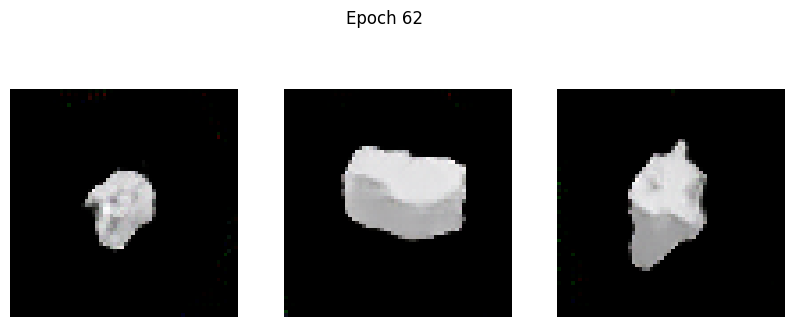

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3473 - g_loss: 2.0195
Epoch 63/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2762 - g_loss: 1.9461

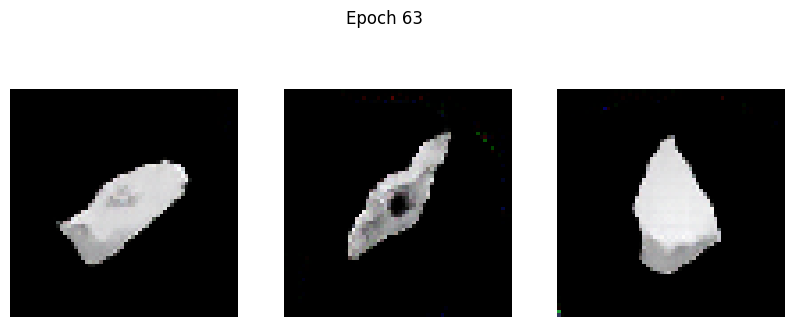

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2762 - g_loss: 1.9460
Epoch 64/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2845 - g_loss: 1.9724

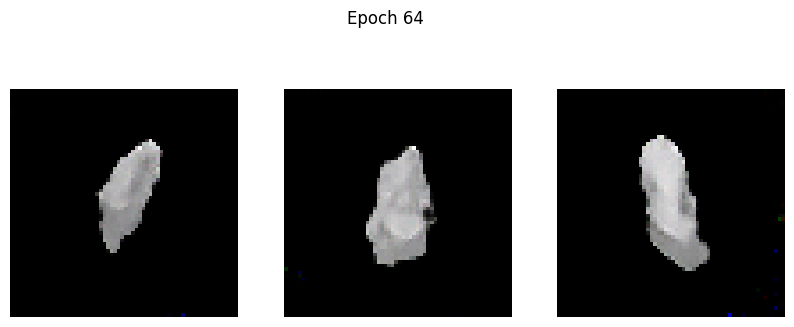

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2846 - g_loss: 1.9726
Epoch 65/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2741 - g_loss: 2.0100

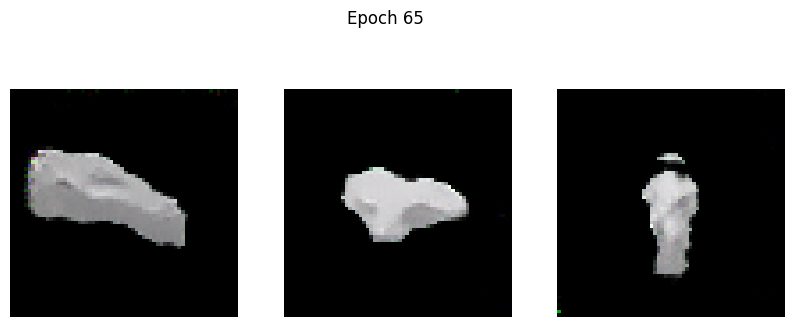

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2744 - g_loss: 2.0102
Epoch 66/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2940 - g_loss: 2.1028

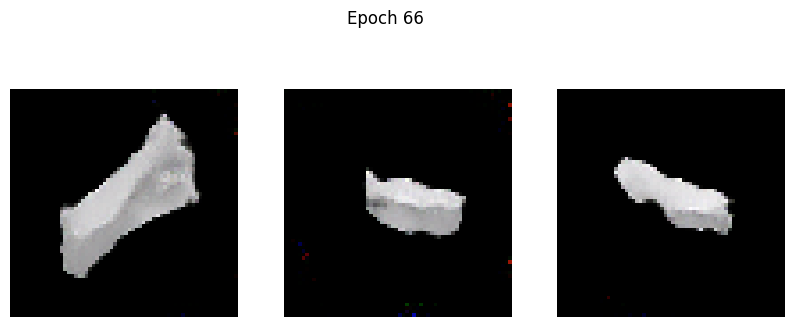

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - d_loss: 0.2939 - g_loss: 2.1020
Epoch 67/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2760 - g_loss: 2.0231

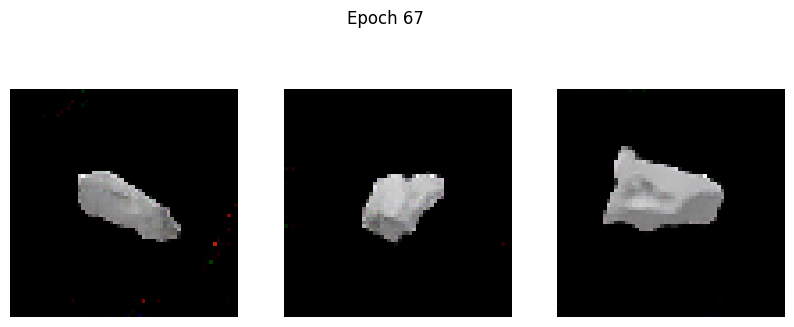

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2761 - g_loss: 2.0234
Epoch 68/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2955 - g_loss: 2.0398

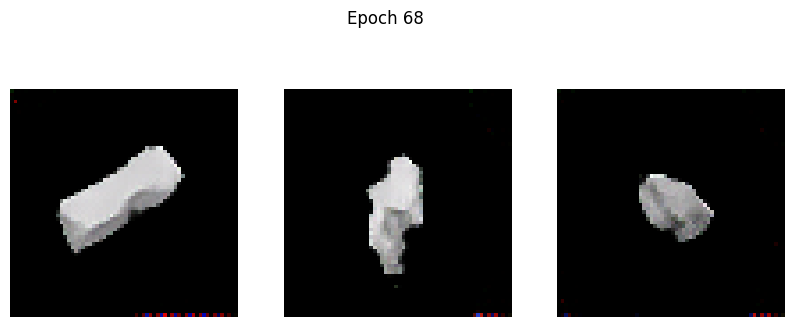

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2956 - g_loss: 2.0402
Epoch 69/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.5906 - g_loss: 2.5899

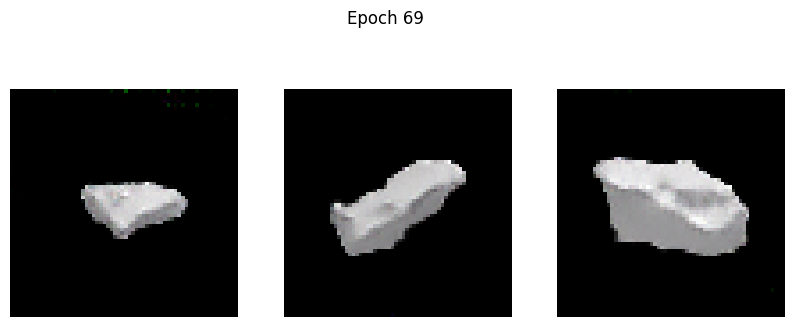

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.5908 - g_loss: 2.5896
Epoch 70/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2948 - g_loss: 1.7808

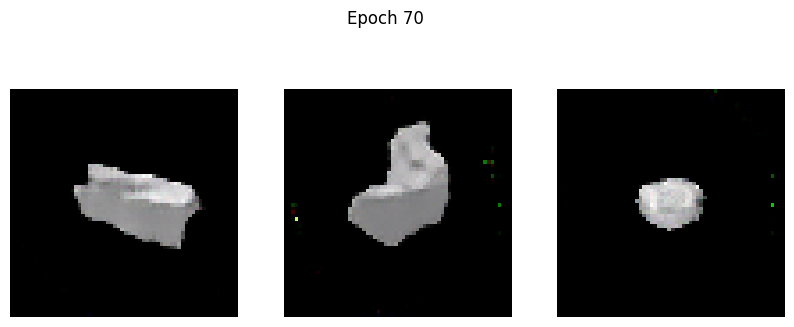

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.2947 - g_loss: 1.7809
Epoch 71/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2705 - g_loss: 1.8981

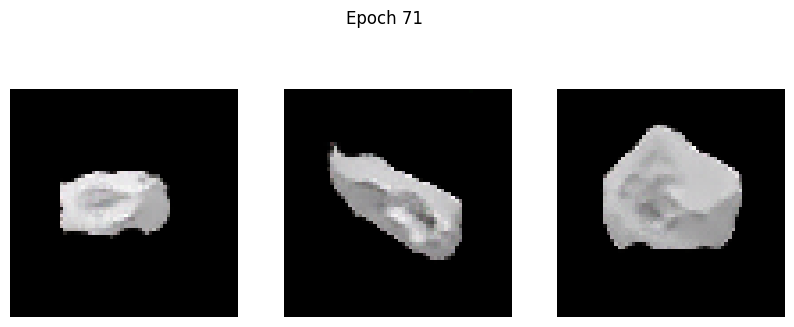

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.2706 - g_loss: 1.8982
Epoch 72/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2696 - g_loss: 1.9767

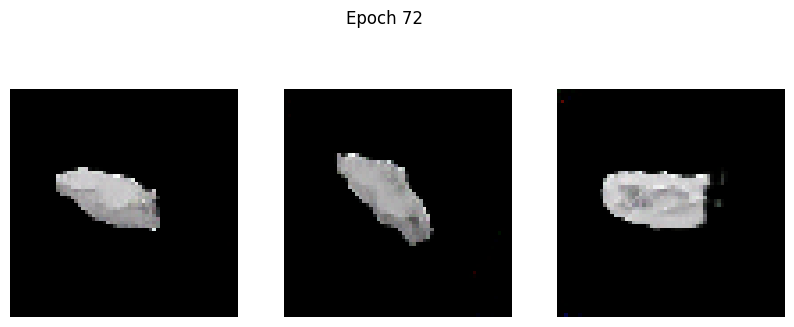

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.2696 - g_loss: 1.9765
Epoch 73/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2712 - g_loss: 1.9883

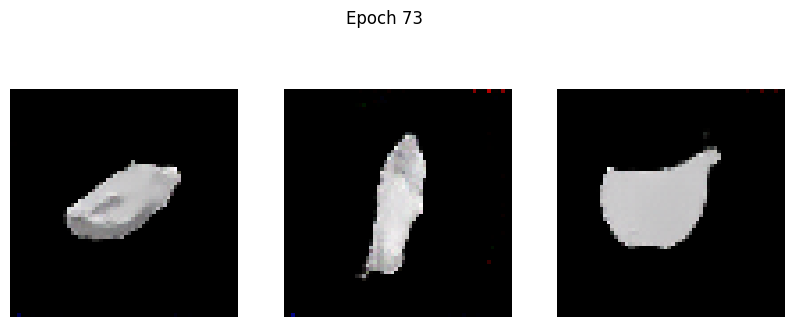

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2712 - g_loss: 1.9885
Epoch 74/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2616 - g_loss: 2.1030

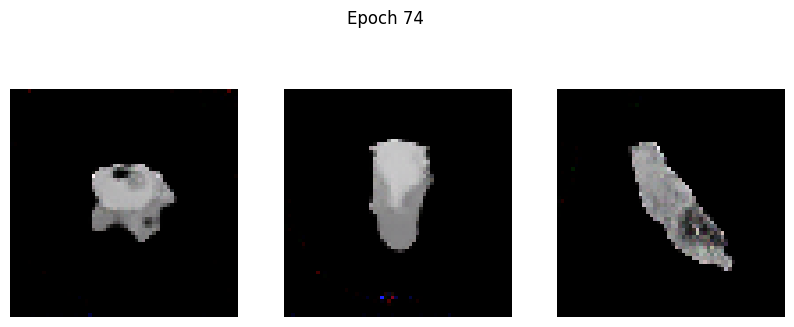

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2618 - g_loss: 2.1030
Epoch 75/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2667 - g_loss: 2.0313

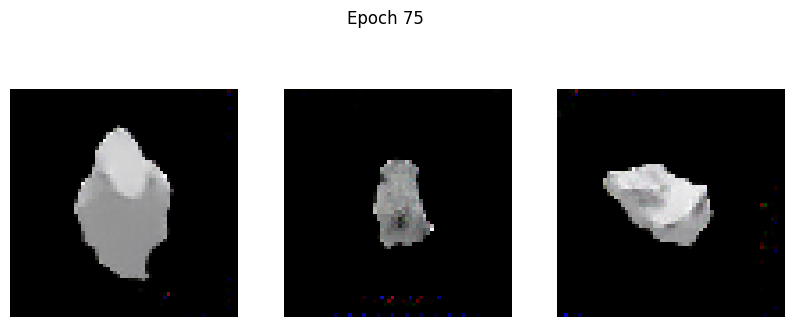

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2668 - g_loss: 2.0317
Epoch 76/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2497 - g_loss: 2.0703

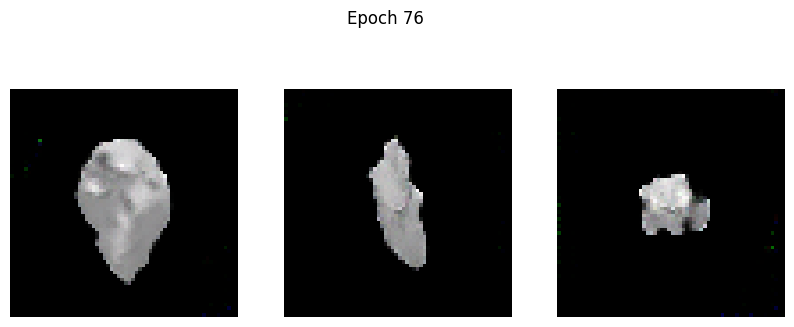

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.2498 - g_loss: 2.0707
Epoch 77/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2740 - g_loss: 2.1330

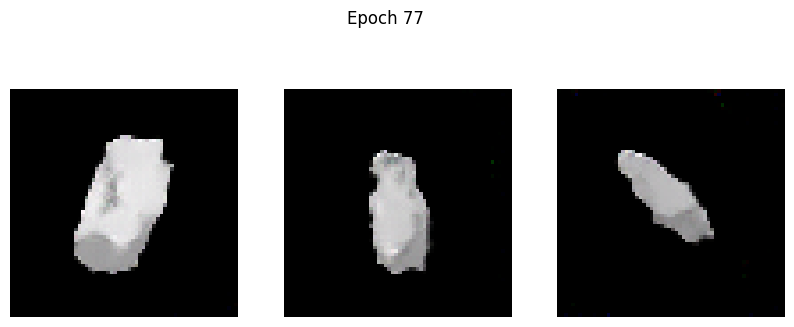

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2740 - g_loss: 2.1330
Epoch 78/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2609 - g_loss: 2.1559

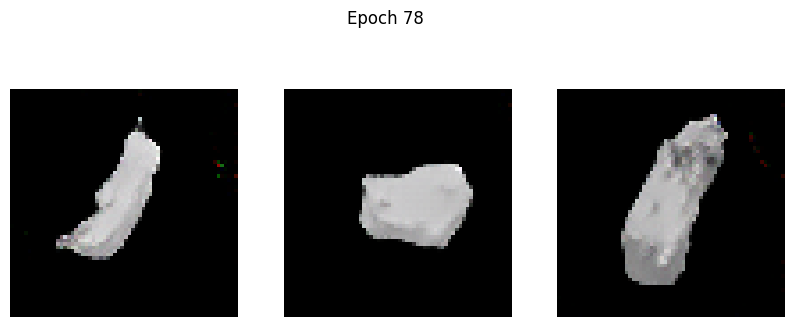

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2612 - g_loss: 2.1559
Epoch 79/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3203 - g_loss: 2.1801

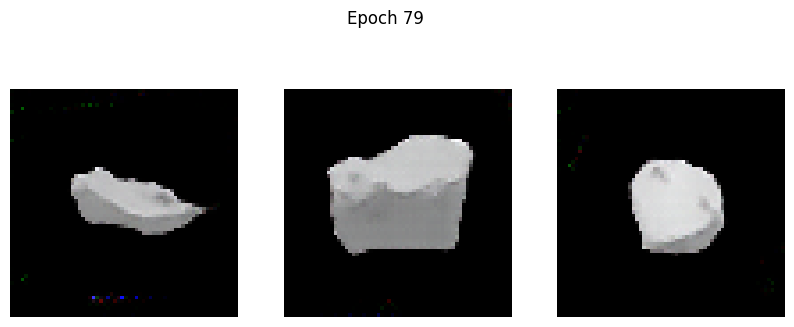

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3199 - g_loss: 2.1797
Epoch 80/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2647 - g_loss: 2.1920

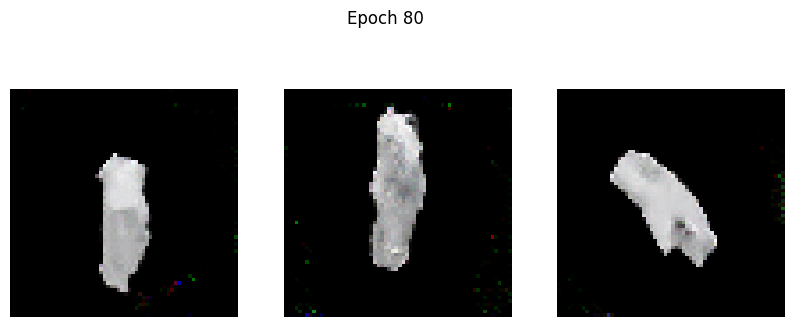

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2651 - g_loss: 2.1924
Epoch 81/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2447 - g_loss: 2.1616

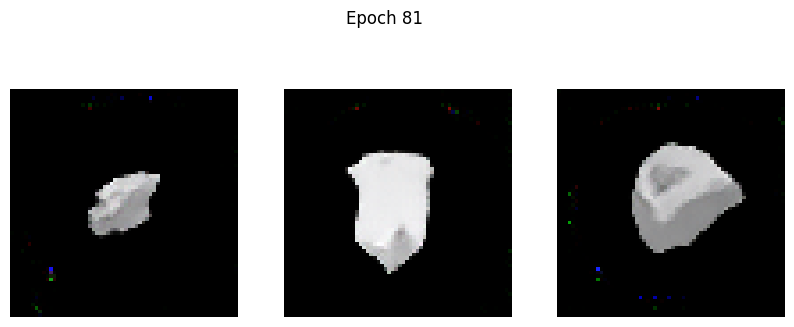

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2446 - g_loss: 2.1615
Epoch 82/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3623 - g_loss: 2.3936

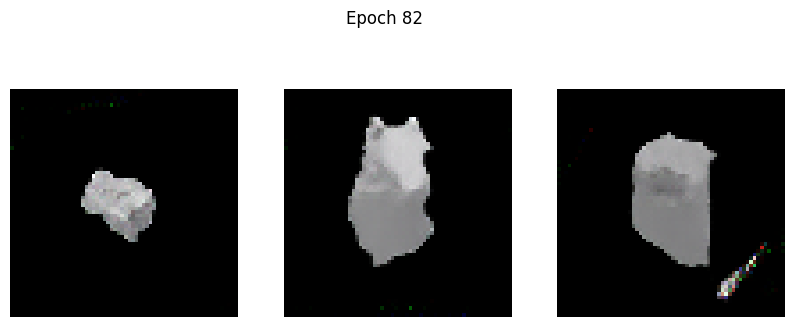

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3620 - g_loss: 2.3925
Epoch 83/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2656 - g_loss: 2.1445

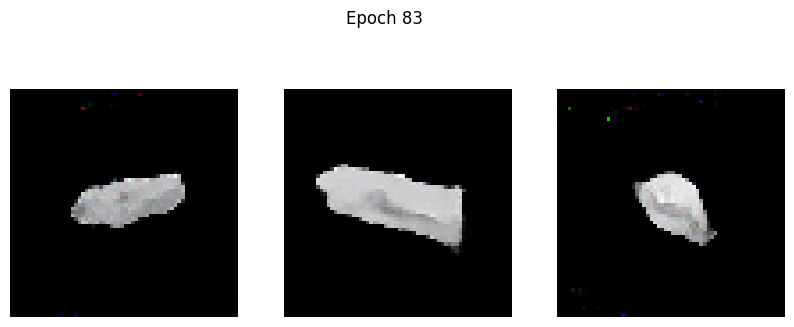

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2656 - g_loss: 2.1447
Epoch 84/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2383 - g_loss: 2.1904

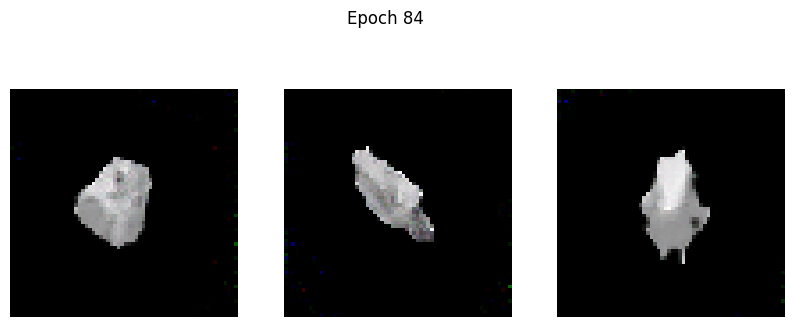

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2384 - g_loss: 2.1903
Epoch 85/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2615 - g_loss: 2.2385

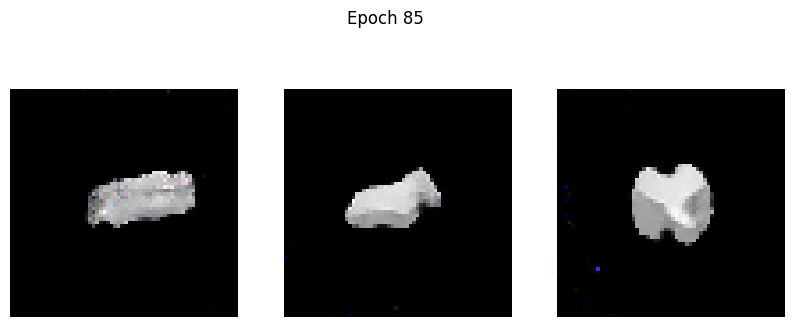

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2615 - g_loss: 2.2387
Epoch 86/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2505 - g_loss: 2.2688

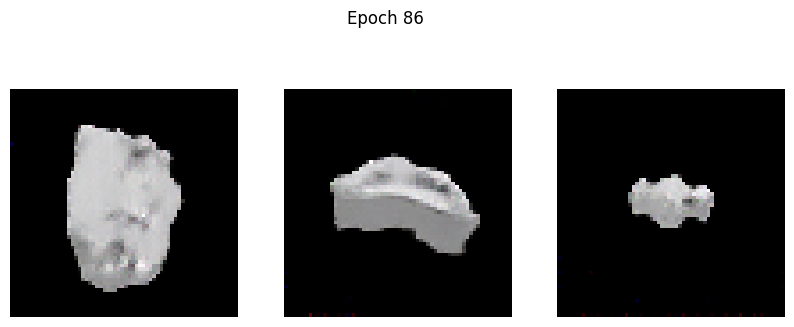

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2505 - g_loss: 2.2686
Epoch 87/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2957 - g_loss: 2.2983

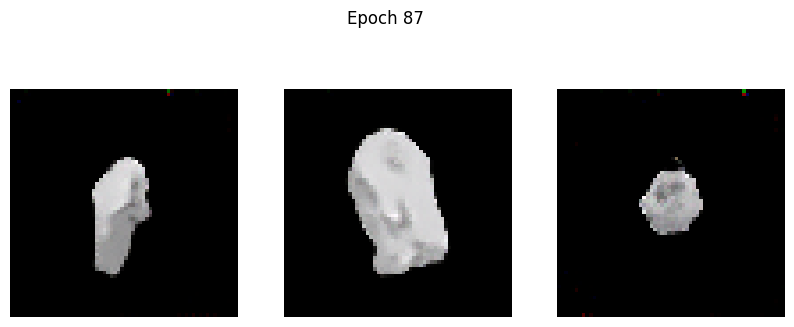

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2954 - g_loss: 2.2980
Epoch 88/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2711 - g_loss: 2.2641

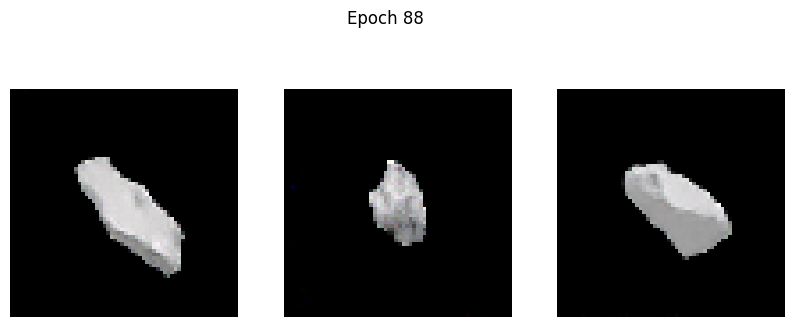

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2712 - g_loss: 2.2642
Epoch 89/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2599 - g_loss: 2.3290

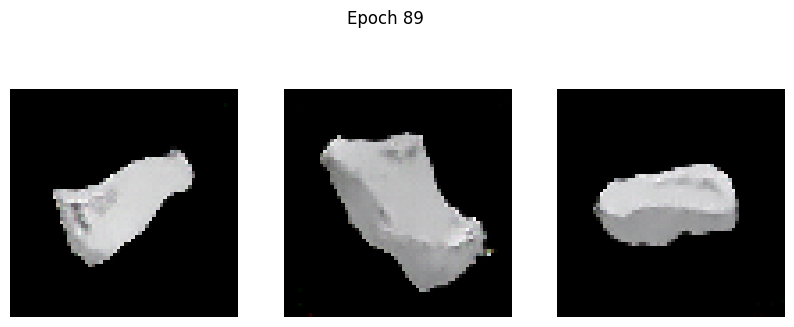

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2598 - g_loss: 2.3290
Epoch 90/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2216 - g_loss: 2.2779

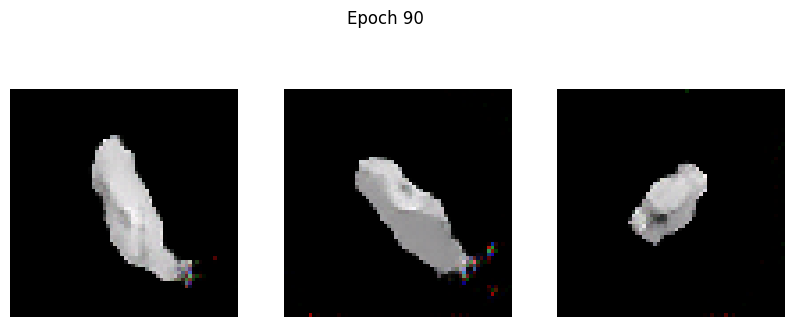

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2218 - g_loss: 2.2782
Epoch 91/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2512 - g_loss: 2.3314

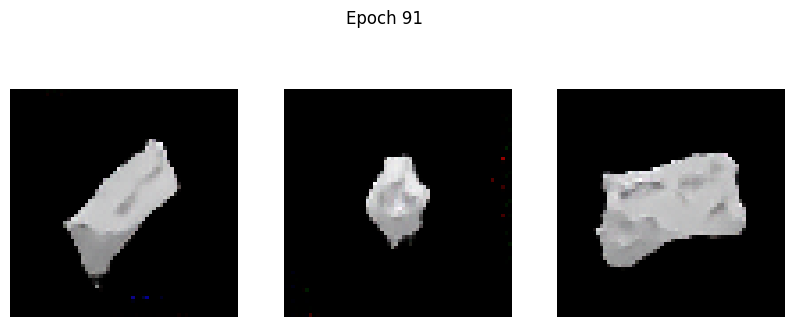

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2511 - g_loss: 2.3313
Epoch 92/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3087 - g_loss: 2.4219

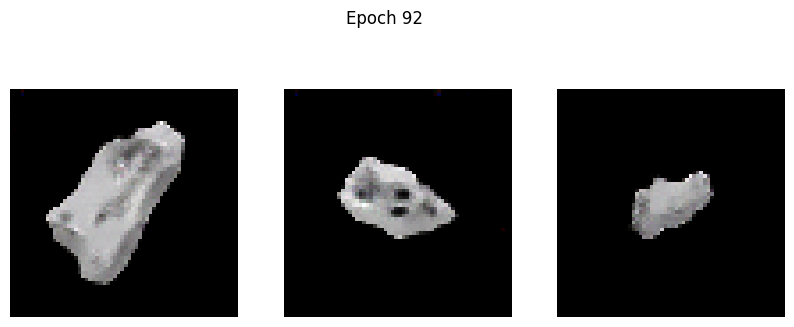

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3084 - g_loss: 2.4215
Epoch 93/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2874 - g_loss: 2.4050

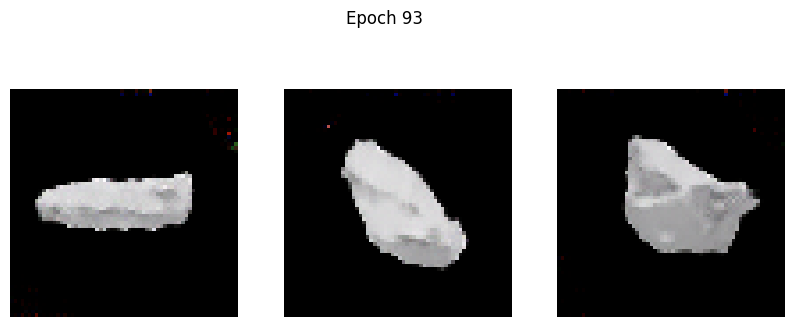

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2884 - g_loss: 2.4061
Epoch 94/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2219 - g_loss: 2.2319

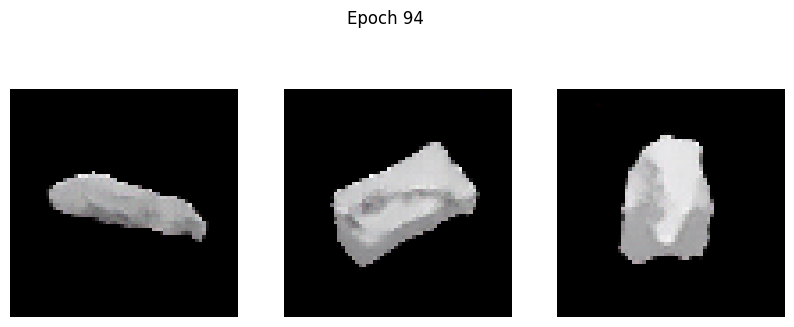

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2218 - g_loss: 2.2318
Epoch 95/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2267 - g_loss: 2.3182

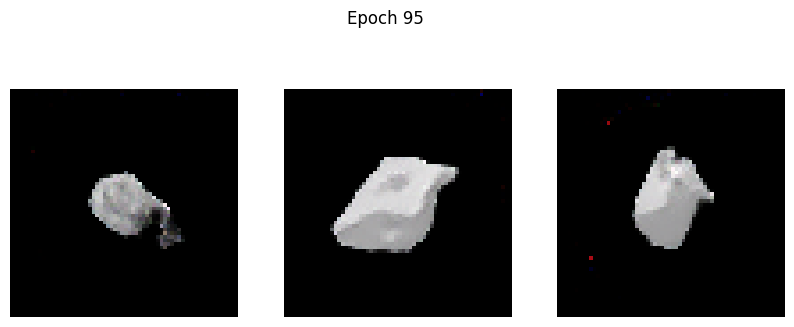

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2267 - g_loss: 2.3182
Epoch 96/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2304 - g_loss: 2.4468

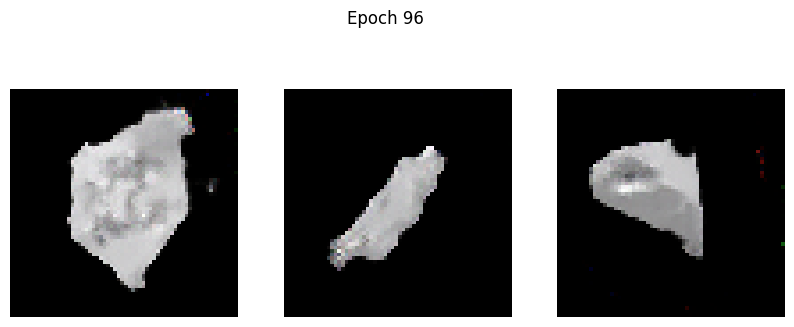

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - d_loss: 0.2307 - g_loss: 2.4460
Epoch 97/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2150 - g_loss: 2.3263

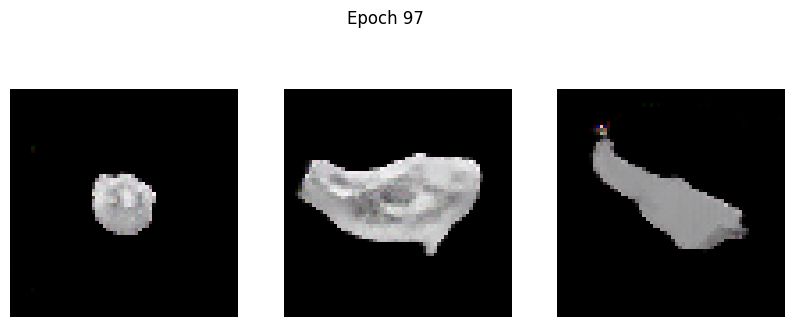

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2151 - g_loss: 2.3263
Epoch 98/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2805 - g_loss: 2.4359

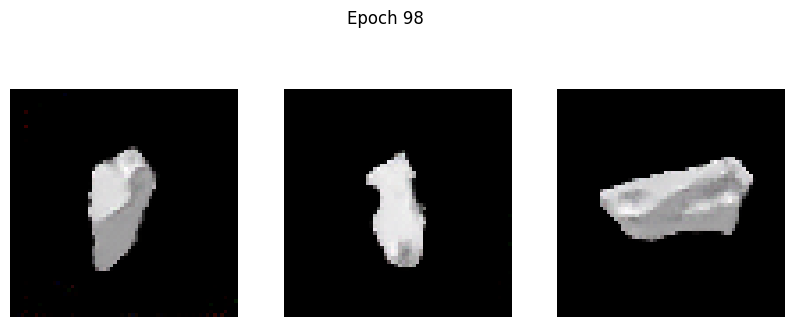

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.2801 - g_loss: 2.4359
Epoch 99/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2538 - g_loss: 2.4598

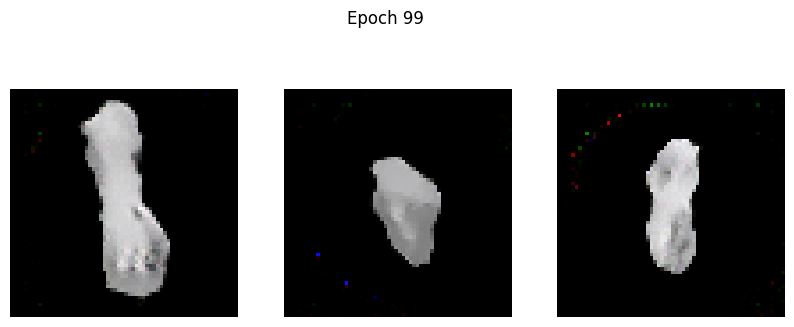

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2536 - g_loss: 2.4597
Epoch 100/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2206 - g_loss: 2.4522

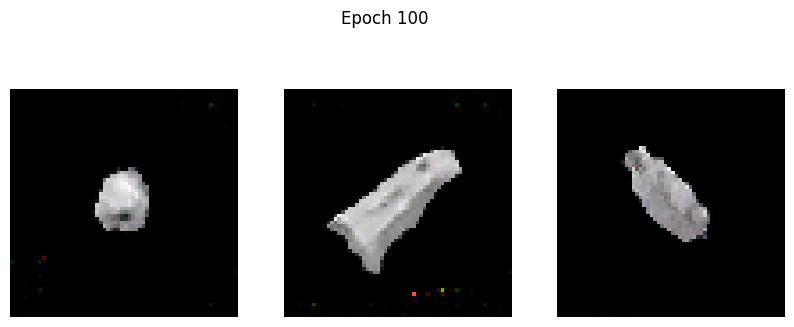

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2207 - g_loss: 2.4521
Epoch 101/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2672 - g_loss: 2.4651

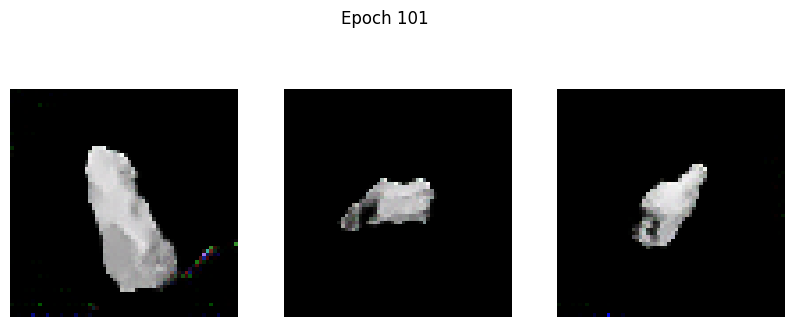

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.2671 - g_loss: 2.4651
Epoch 102/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2256 - g_loss: 2.5144

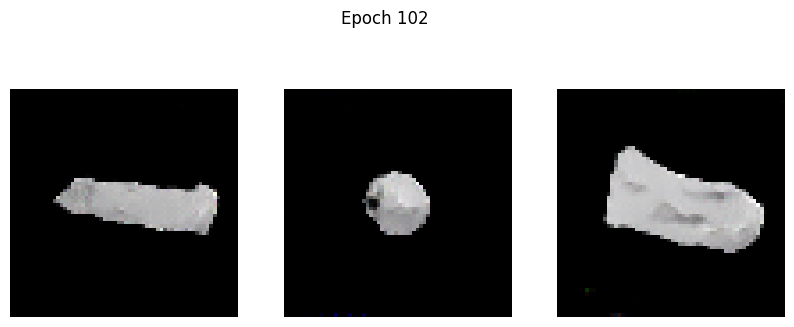

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.2261 - g_loss: 2.5144
Epoch 103/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1979 - g_loss: 2.4049

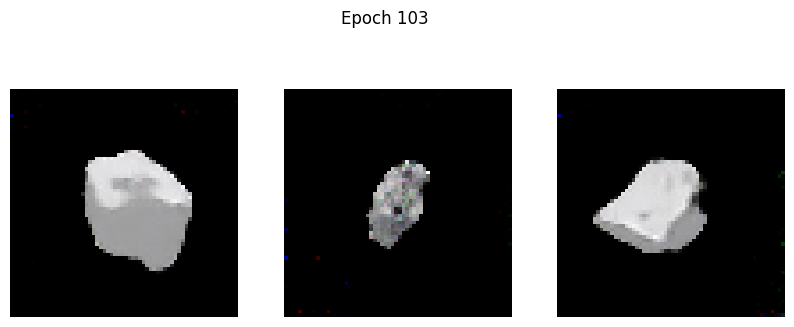

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1982 - g_loss: 2.4048
Epoch 104/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2099 - g_loss: 2.4954

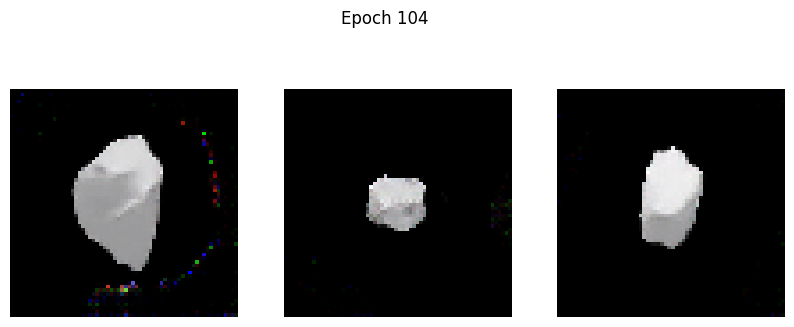

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2099 - g_loss: 2.4951
Epoch 105/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2169 - g_loss: 2.5350

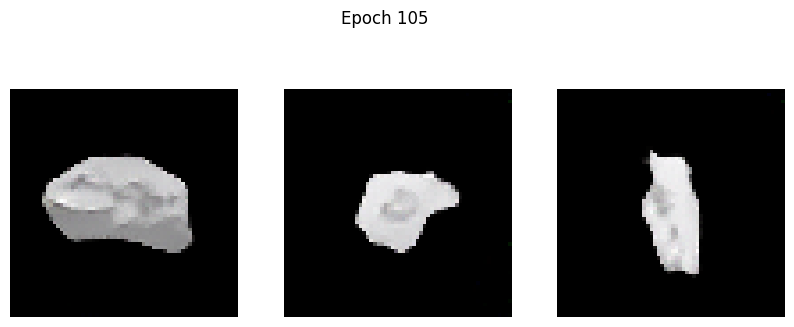

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2169 - g_loss: 2.5345
Epoch 106/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2392 - g_loss: 2.5743

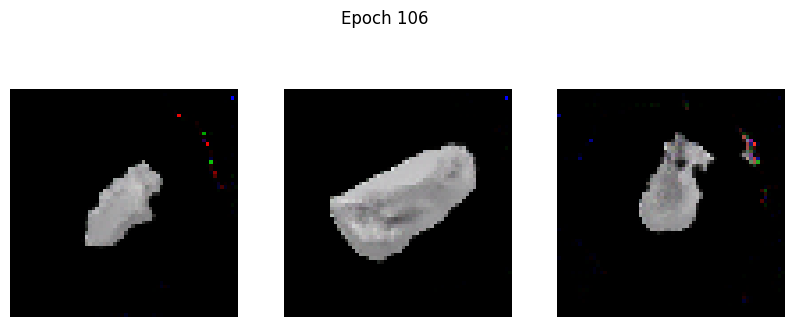

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2392 - g_loss: 2.5738
Epoch 107/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3006 - g_loss: 2.6660

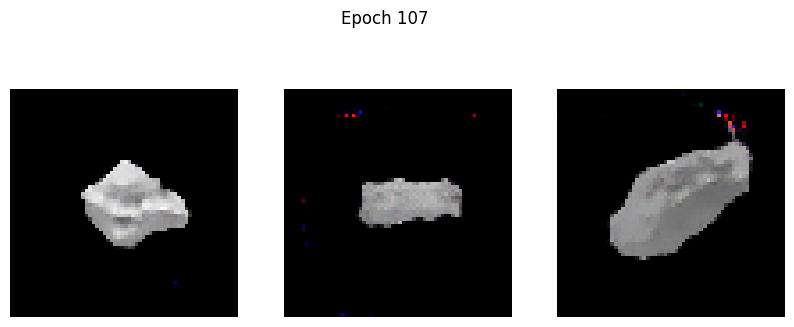

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.3010 - g_loss: 2.6655
Epoch 108/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2027 - g_loss: 2.4221

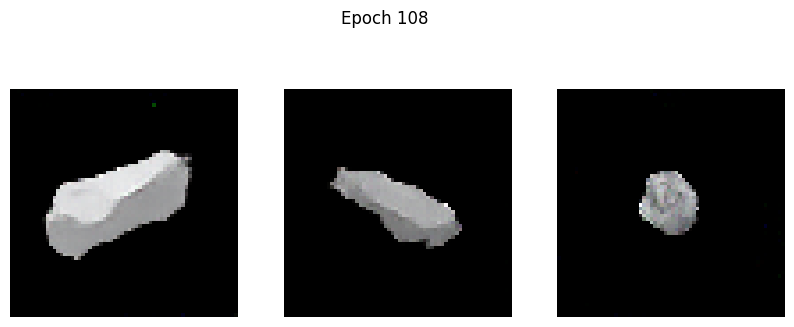

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2028 - g_loss: 2.4226
Epoch 109/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2162 - g_loss: 2.4972

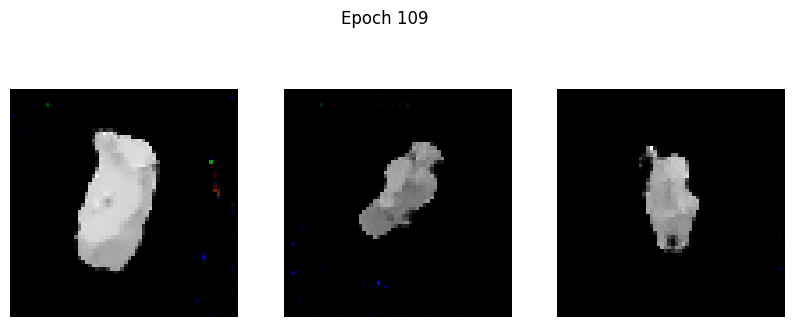

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2164 - g_loss: 2.4977
Epoch 110/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2089 - g_loss: 2.4982

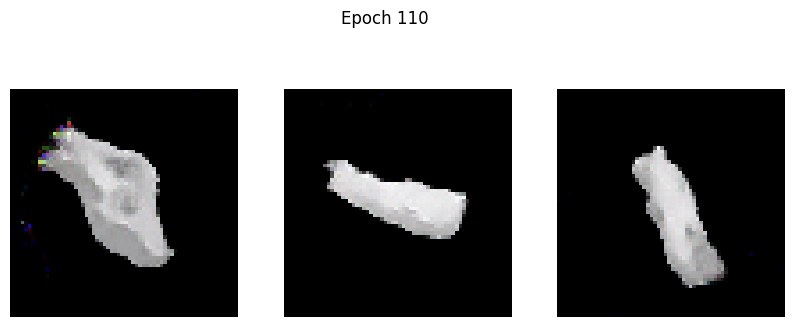

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2091 - g_loss: 2.4985
Epoch 111/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2142 - g_loss: 2.5512

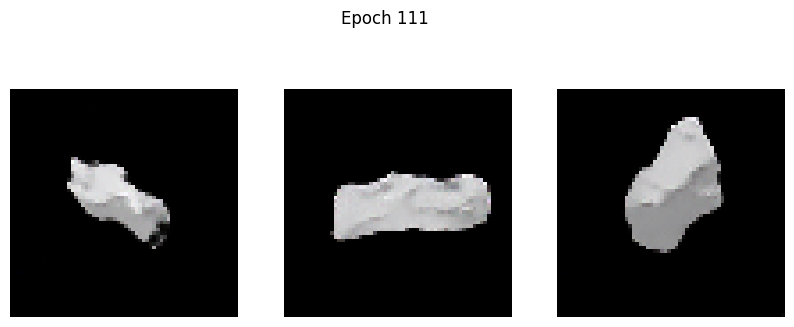

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2142 - g_loss: 2.5511
Epoch 112/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2080 - g_loss: 2.6018

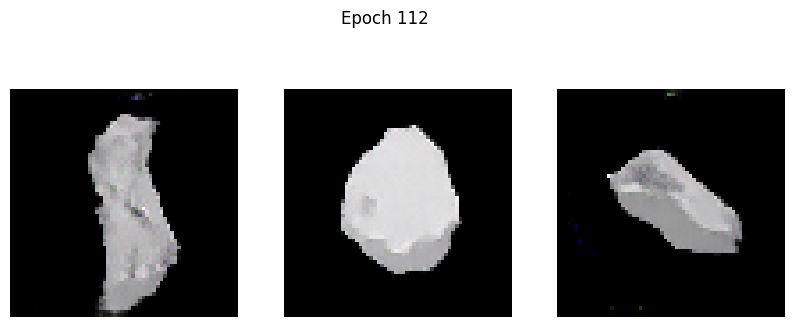

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2085 - g_loss: 2.6023
Epoch 113/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2299 - g_loss: 2.5079

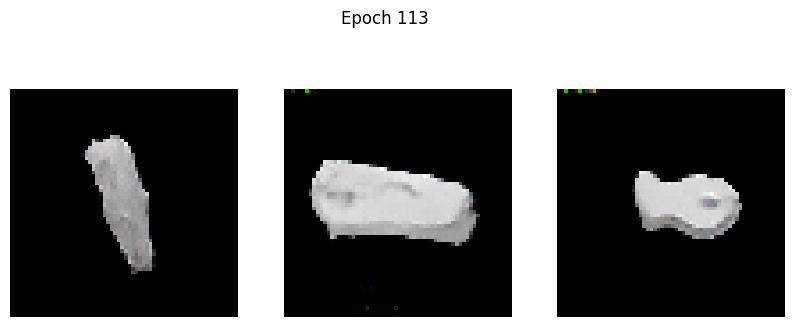

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2296 - g_loss: 2.5078
Epoch 114/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1901 - g_loss: 2.6168

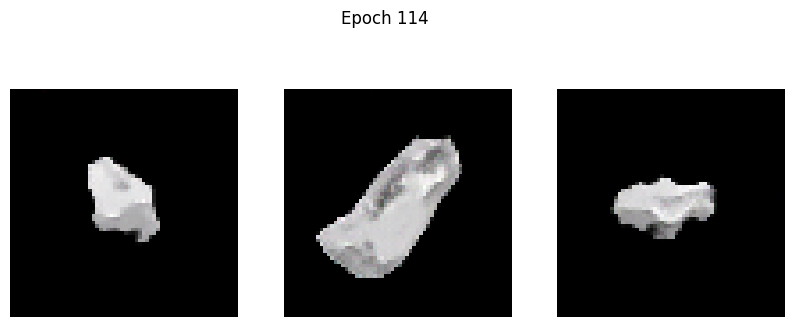

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1901 - g_loss: 2.6166
Epoch 115/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2481 - g_loss: 2.6514

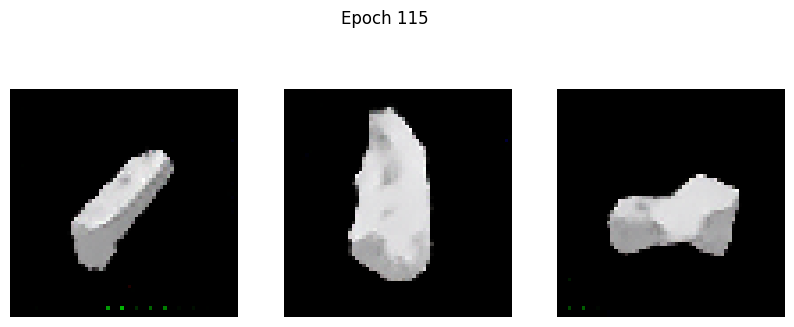

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2478 - g_loss: 2.6514
Epoch 116/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2137 - g_loss: 2.6474

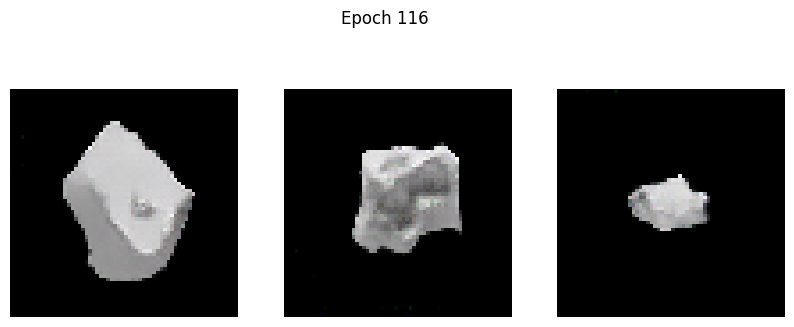

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2137 - g_loss: 2.6475
Epoch 117/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2048 - g_loss: 2.7418

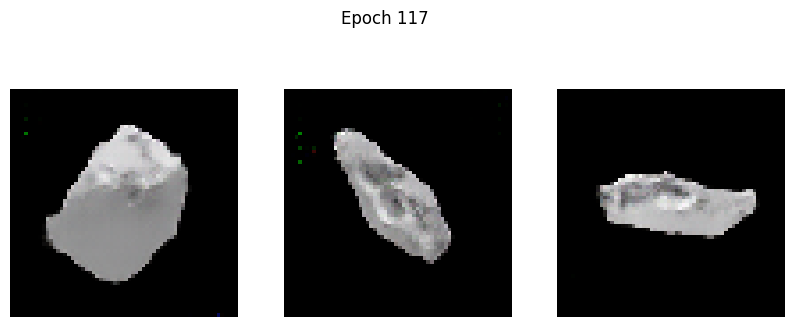

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2049 - g_loss: 2.7411
Epoch 118/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1712 - g_loss: 2.6447

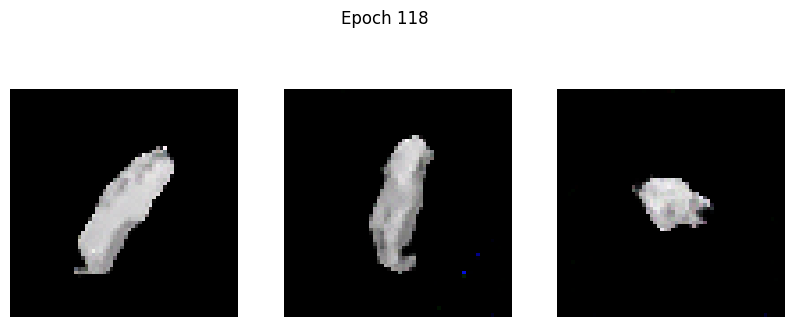

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1713 - g_loss: 2.6448
Epoch 119/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2514 - g_loss: 2.8163

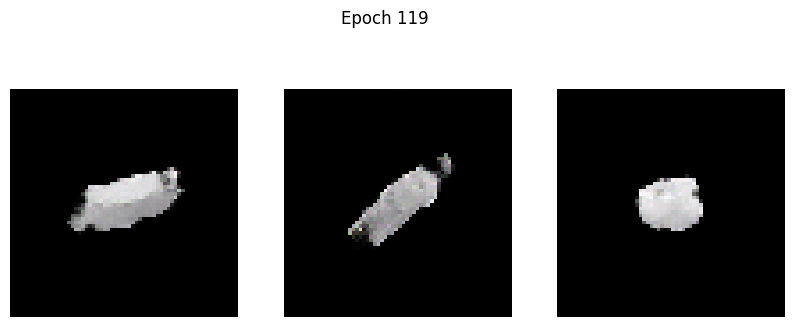

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2514 - g_loss: 2.8162
Epoch 120/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2214 - g_loss: 2.6644

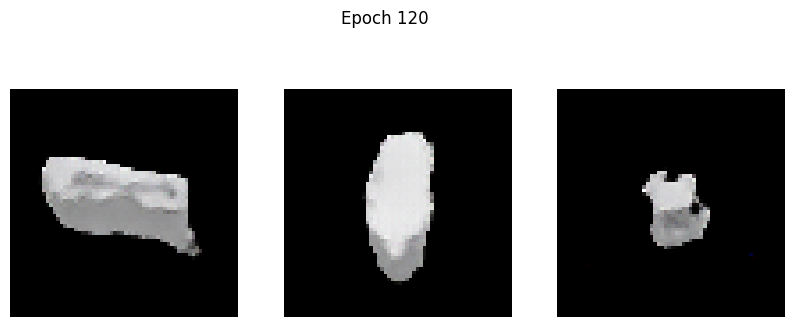

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2214 - g_loss: 2.6645
Epoch 121/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1862 - g_loss: 2.7619

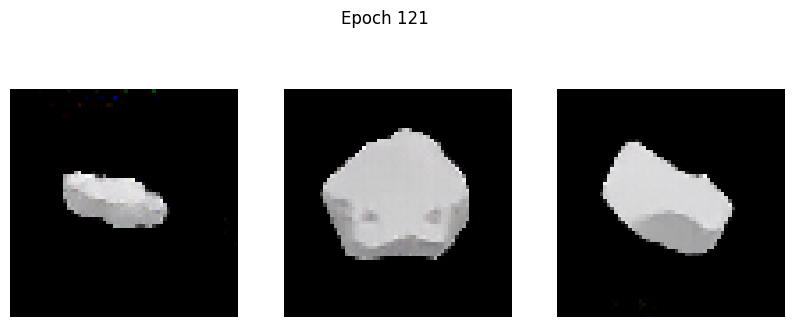

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1863 - g_loss: 2.7615
Epoch 122/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2204 - g_loss: 2.7441

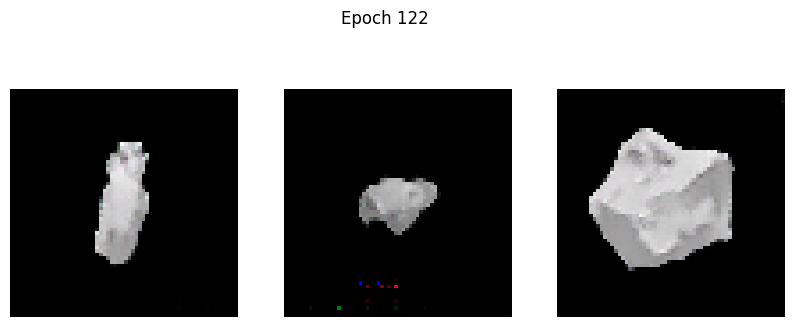

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2204 - g_loss: 2.7441
Epoch 123/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1851 - g_loss: 2.7298

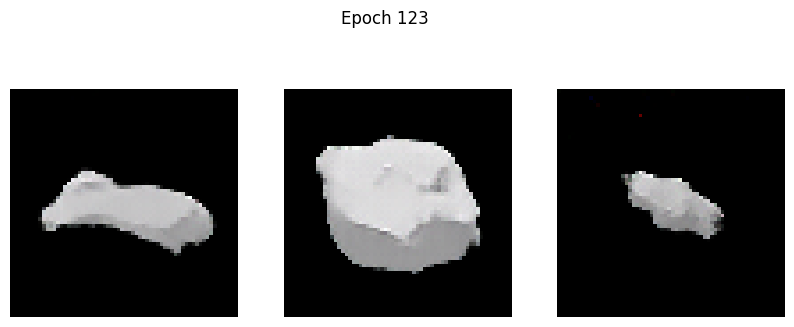

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1851 - g_loss: 2.7296
Epoch 124/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2169 - g_loss: 2.8928

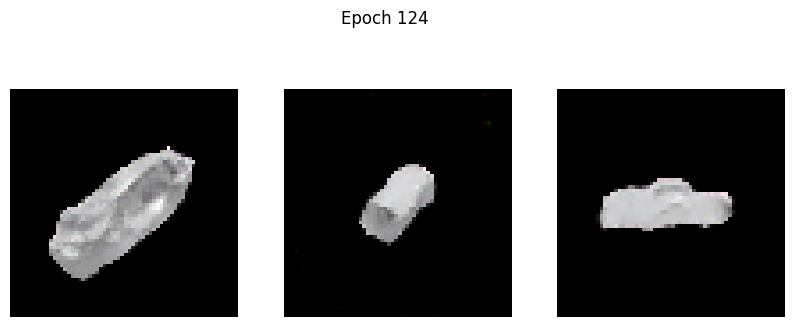

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2166 - g_loss: 2.8917
Epoch 125/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.6184 - g_loss: 3.3072

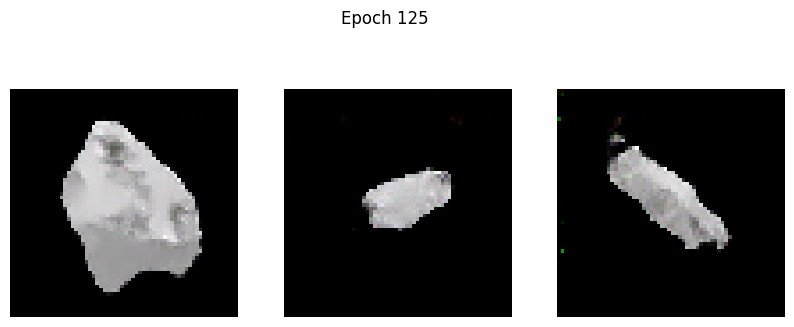

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.6159 - g_loss: 3.3027
Epoch 126/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1688 - g_loss: 2.5804

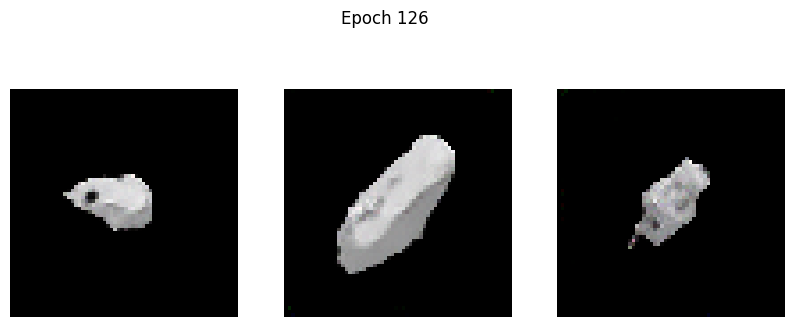

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1688 - g_loss: 2.5810
Epoch 127/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1706 - g_loss: 2.7110

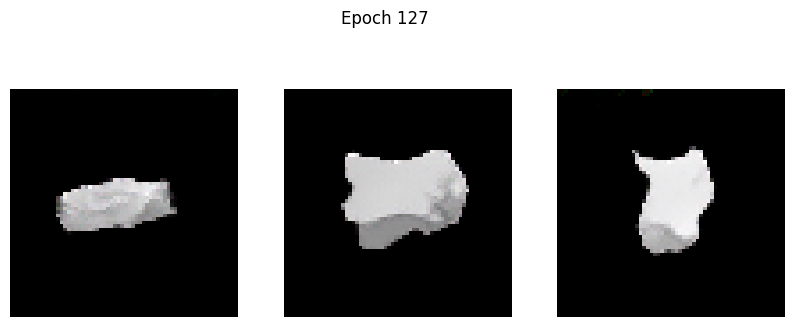

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1706 - g_loss: 2.7110
Epoch 128/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1734 - g_loss: 2.7758

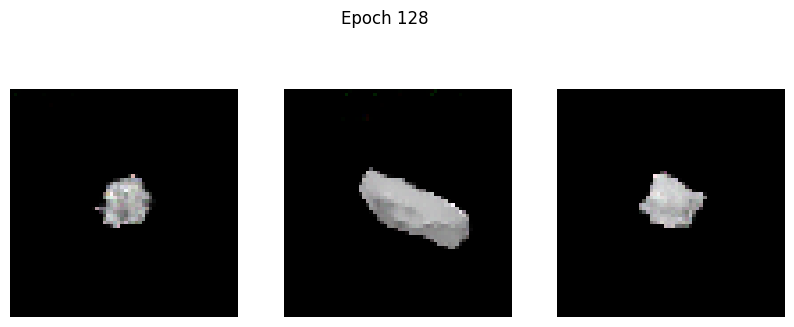

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1735 - g_loss: 2.7760
Epoch 129/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.2949 - g_loss: 2.7766

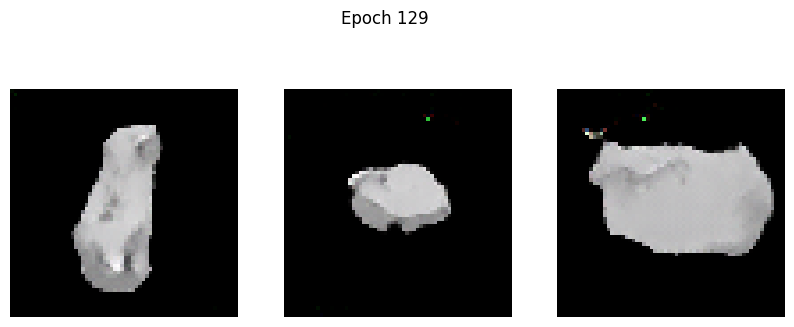

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - d_loss: 0.2942 - g_loss: 2.7772
Epoch 130/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1605 - g_loss: 2.7444

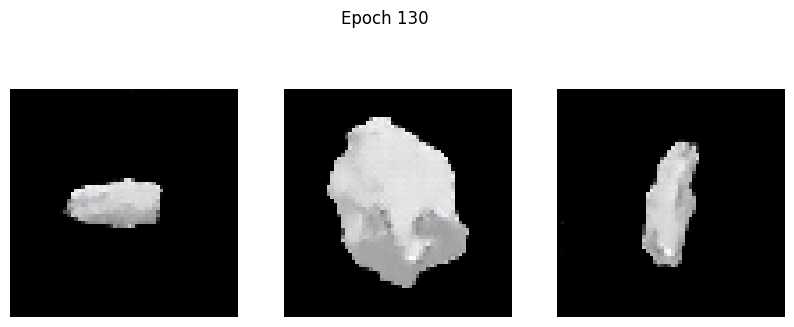

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1607 - g_loss: 2.7449
Epoch 131/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1563 - g_loss: 2.7265

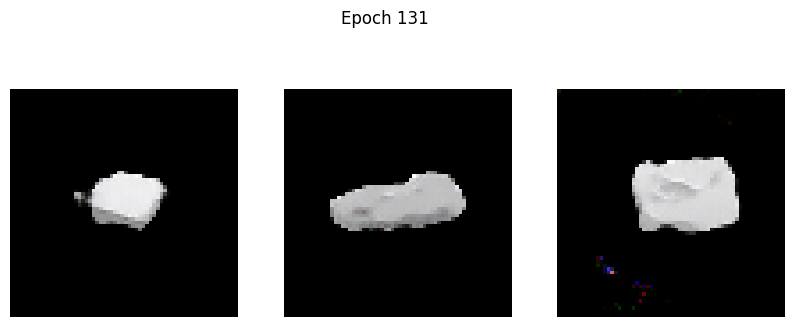

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1565 - g_loss: 2.7269
Epoch 132/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1970 - g_loss: 2.8101

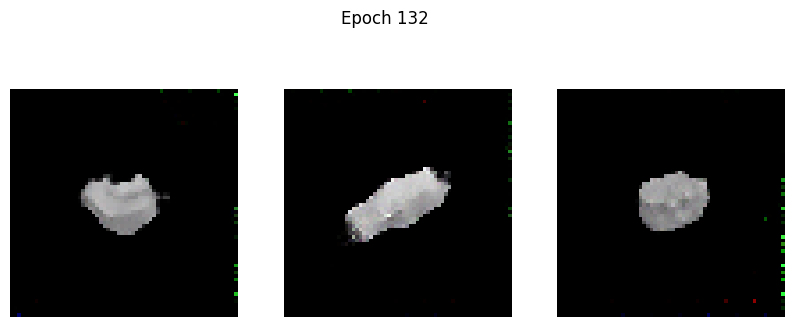

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1970 - g_loss: 2.8103
Epoch 133/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1530 - g_loss: 2.8250

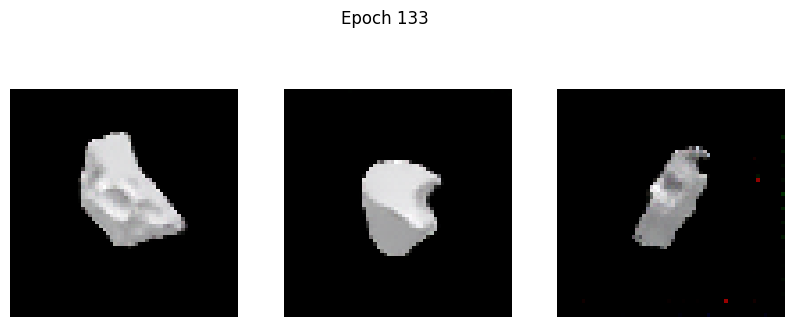

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1530 - g_loss: 2.8250
Epoch 134/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.5932 - g_loss: 3.4731

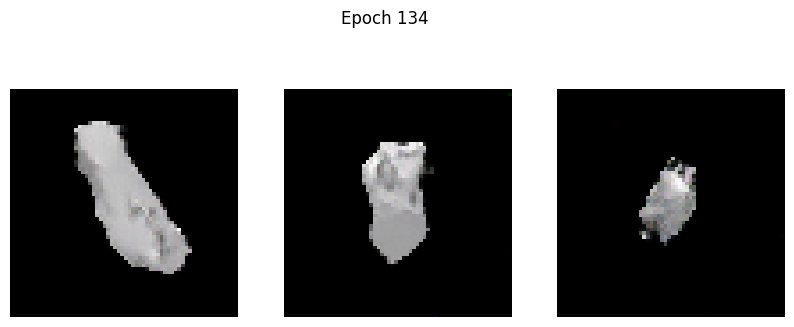

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.5923 - g_loss: 3.4703
Epoch 135/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1723 - g_loss: 2.6584

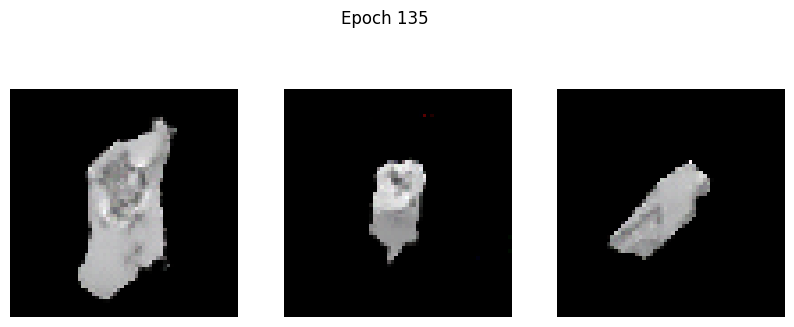

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.1723 - g_loss: 2.6585
Epoch 136/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1592 - g_loss: 2.6751

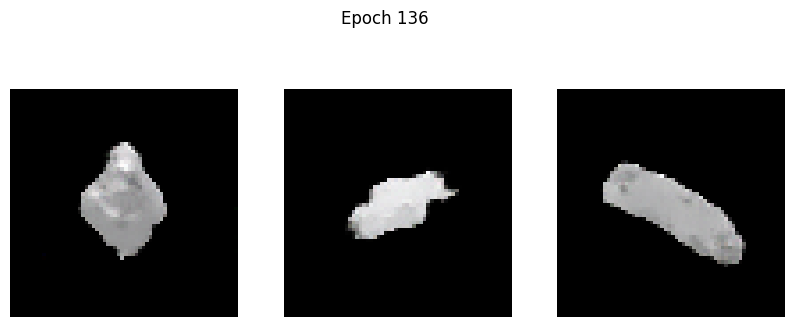

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1592 - g_loss: 2.6753
Epoch 137/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2326 - g_loss: 2.7889

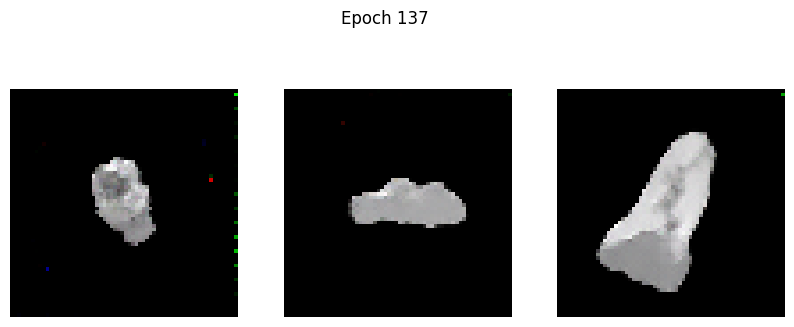

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2323 - g_loss: 2.7888
Epoch 138/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1572 - g_loss: 2.8018

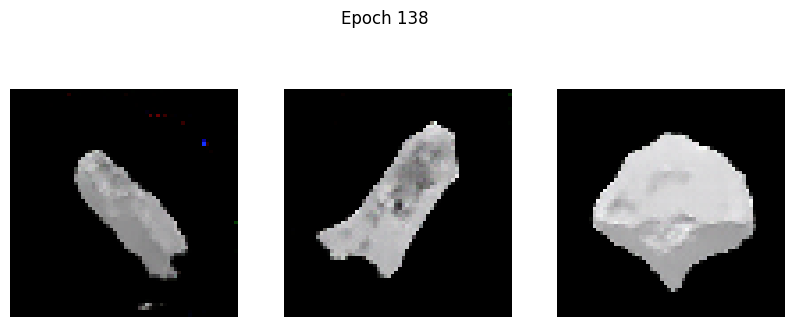

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1573 - g_loss: 2.8017
Epoch 139/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1764 - g_loss: 2.8707

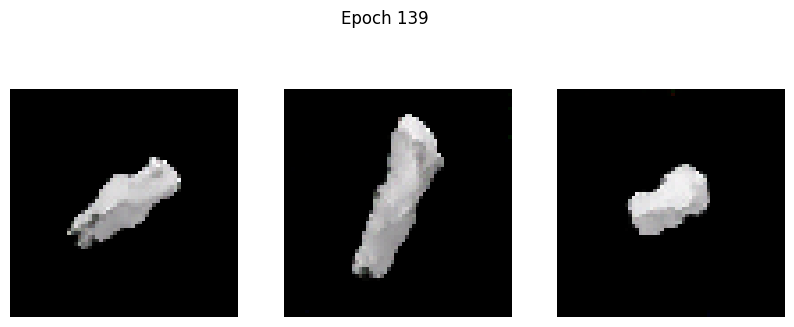

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1768 - g_loss: 2.8708
Epoch 140/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1502 - g_loss: 2.8091

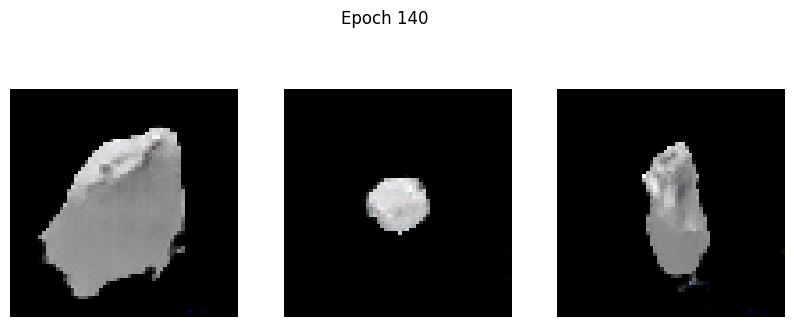

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1504 - g_loss: 2.8089
Epoch 141/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1752 - g_loss: 2.8597

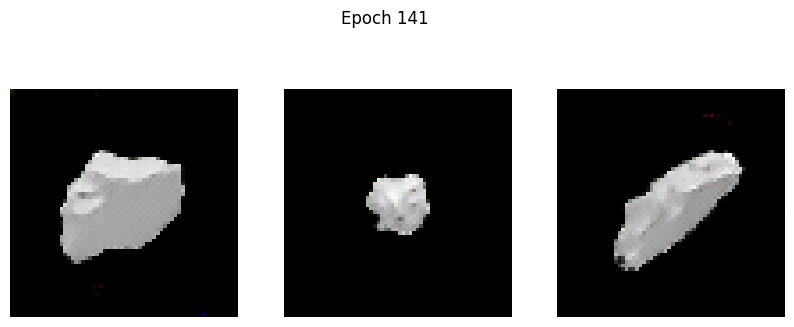

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1767 - g_loss: 2.8621
Epoch 142/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1972 - g_loss: 2.8179

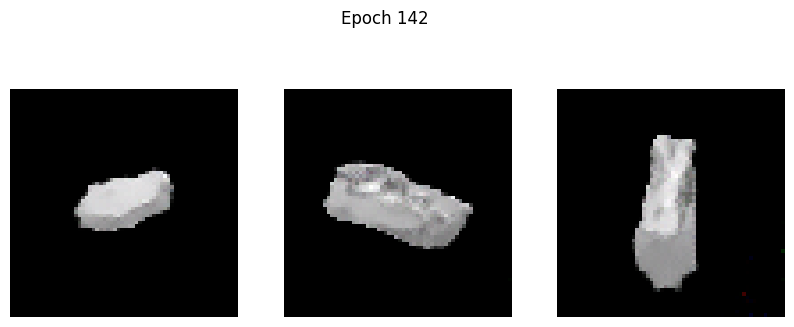

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1969 - g_loss: 2.8174
Epoch 143/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1555 - g_loss: 2.7551

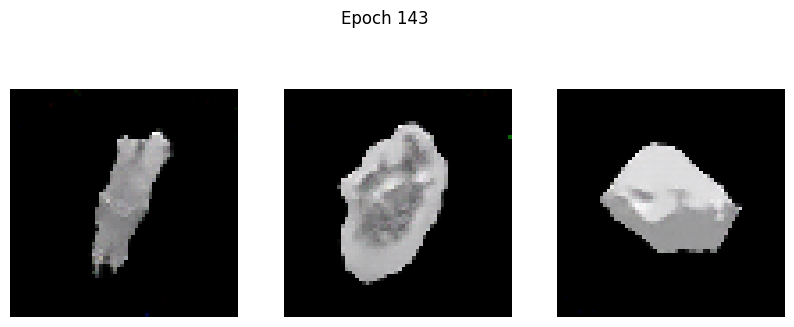

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1556 - g_loss: 2.7560
Epoch 144/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1779 - g_loss: 2.8891

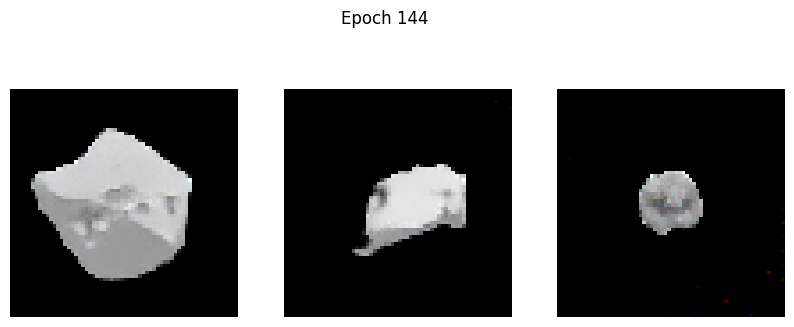

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1780 - g_loss: 2.8890
Epoch 145/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1621 - g_loss: 2.9026

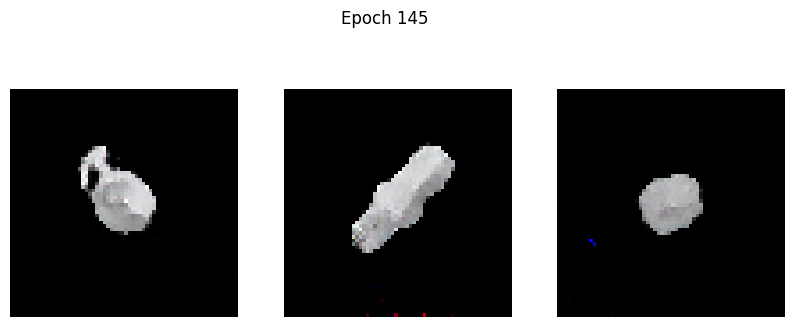

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1620 - g_loss: 2.9022
Epoch 146/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2169 - g_loss: 2.9885

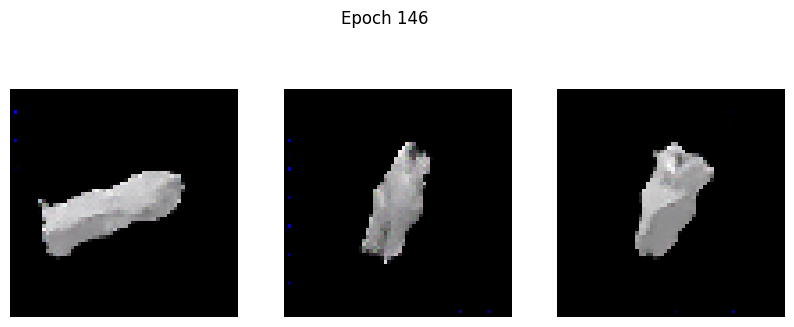

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2172 - g_loss: 2.9885
Epoch 147/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1559 - g_loss: 2.9237

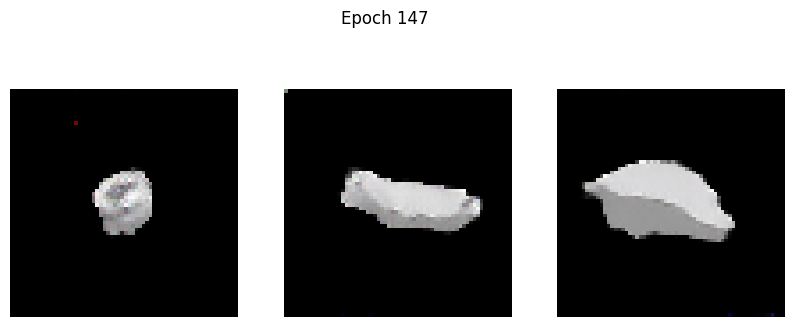

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1559 - g_loss: 2.9234
Epoch 148/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1744 - g_loss: 2.9442

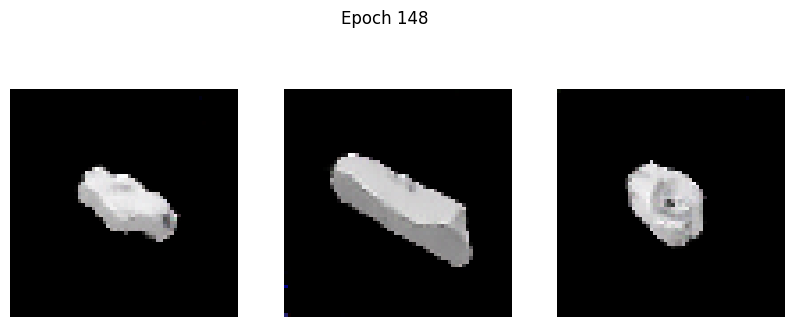

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1743 - g_loss: 2.9439
Epoch 149/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1748 - g_loss: 3.0004

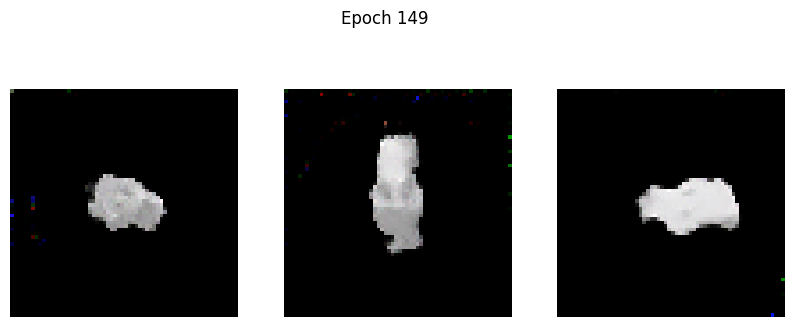

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1752 - g_loss: 3.0008
Epoch 150/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1577 - g_loss: 2.9445

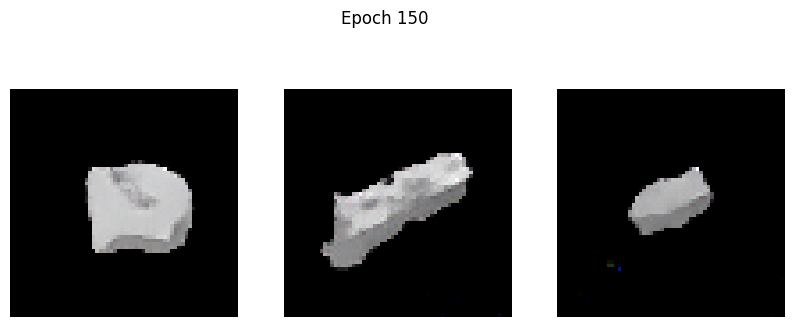

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1578 - g_loss: 2.9443
Epoch 151/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2072 - g_loss: 3.0279

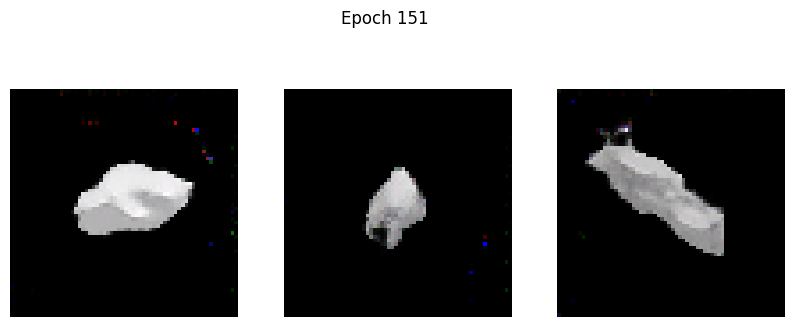

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2076 - g_loss: 3.0276
Epoch 152/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1516 - g_loss: 2.8663

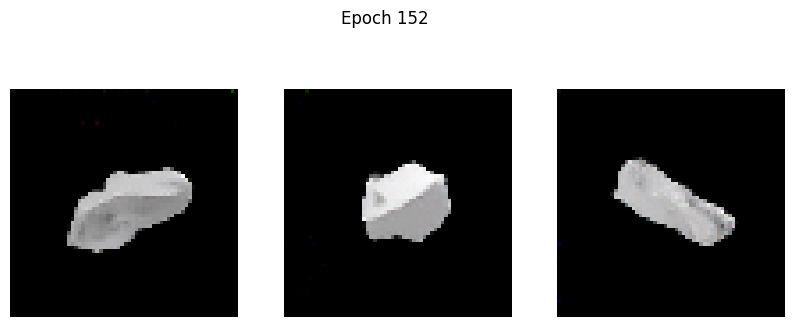

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1516 - g_loss: 2.8665
Epoch 153/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1623 - g_loss: 3.0136

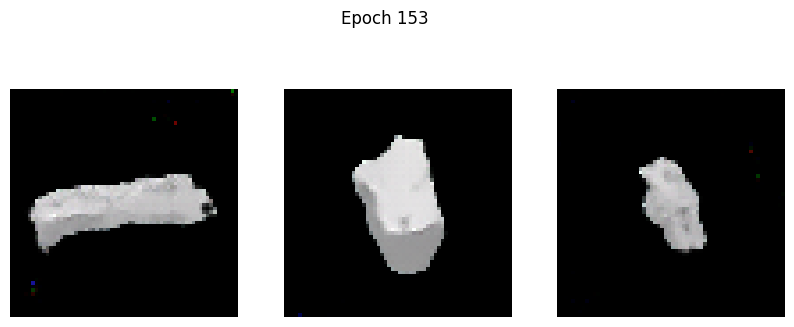

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1625 - g_loss: 3.0138
Epoch 154/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1565 - g_loss: 2.9360

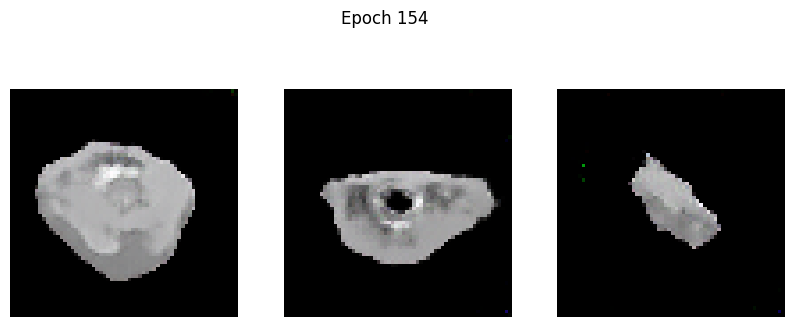

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1565 - g_loss: 2.9365
Epoch 155/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3166 - g_loss: 3.2183

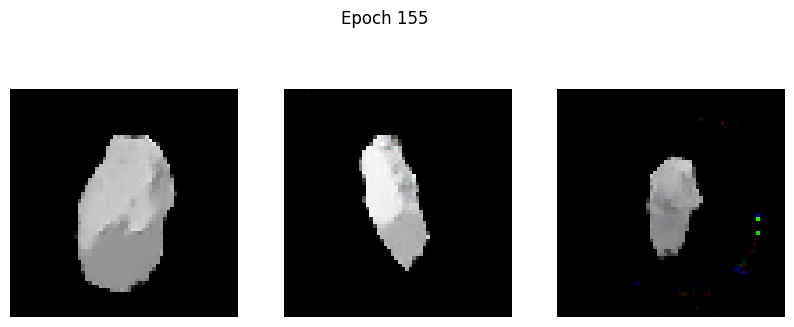

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3156 - g_loss: 3.2163
Epoch 156/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1528 - g_loss: 2.9948

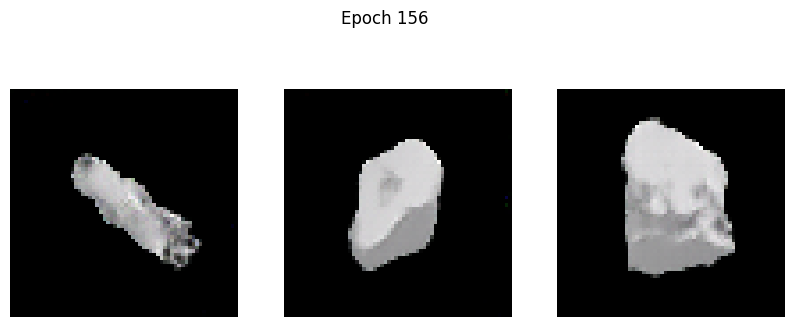

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1527 - g_loss: 2.9949
Epoch 157/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2351 - g_loss: 3.1313

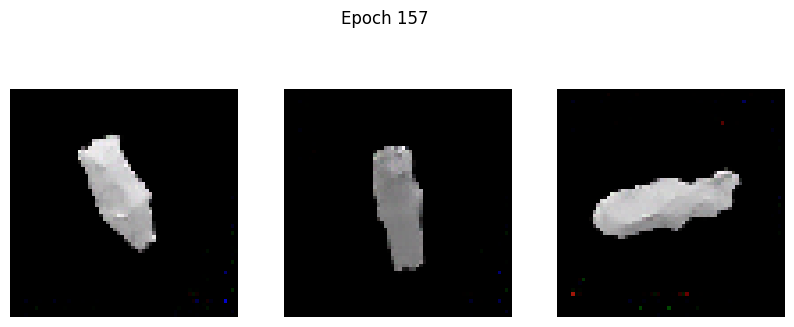

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2349 - g_loss: 3.1311
Epoch 158/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1468 - g_loss: 3.0262

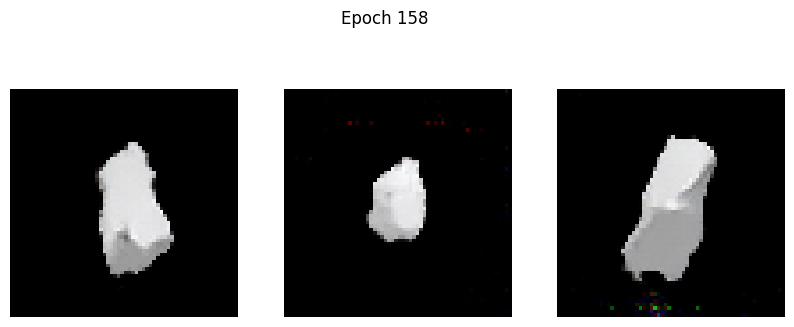

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1469 - g_loss: 3.0265
Epoch 159/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1456 - g_loss: 3.0817

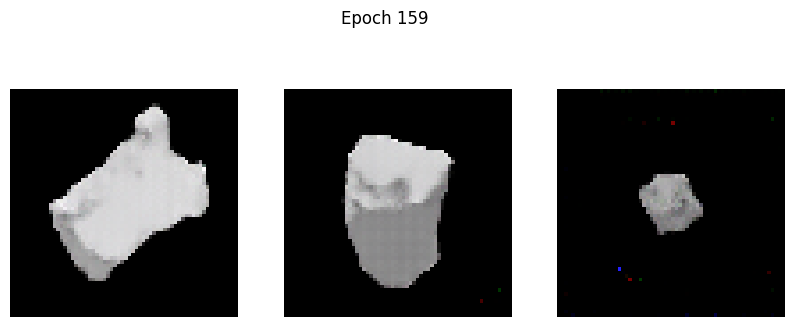

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1459 - g_loss: 3.0820
Epoch 160/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1556 - g_loss: 3.1955

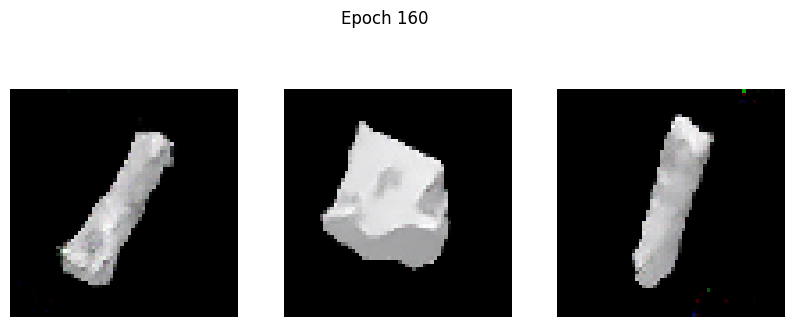

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1556 - g_loss: 3.1951
Epoch 161/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1964 - g_loss: 3.1389

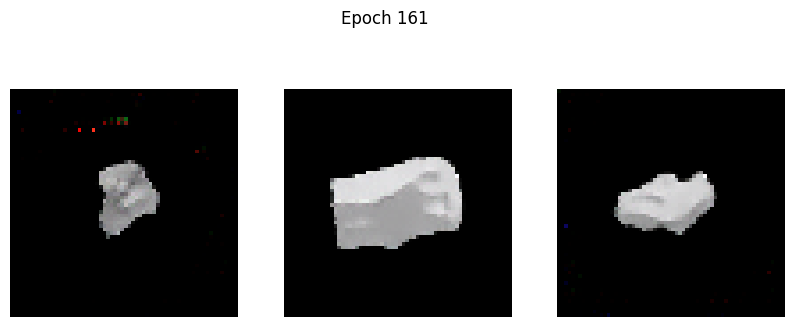

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1966 - g_loss: 3.1388
Epoch 162/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1150 - g_loss: 3.0521

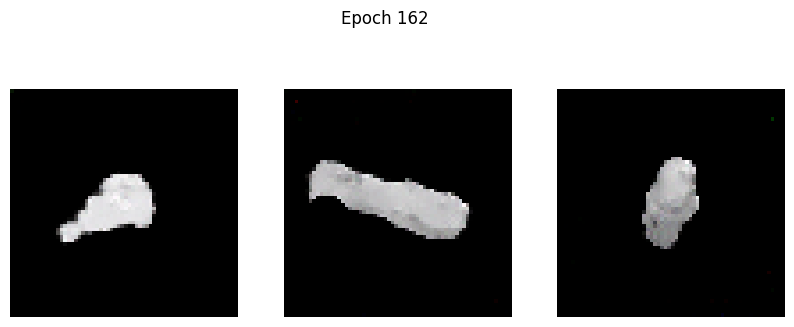

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1151 - g_loss: 3.0522
Epoch 163/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1624 - g_loss: 3.1545

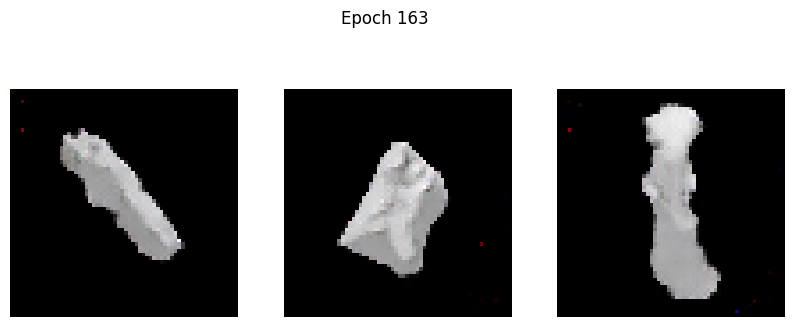

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1630 - g_loss: 3.1549
Epoch 164/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1664 - g_loss: 3.1497

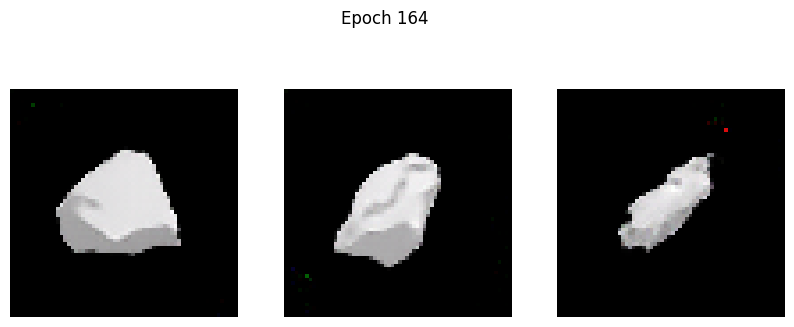

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1663 - g_loss: 3.1494
Epoch 165/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1412 - g_loss: 3.2034

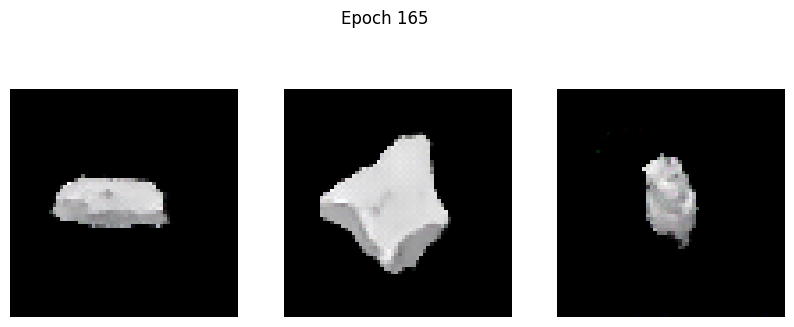

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1417 - g_loss: 3.2038
Epoch 166/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 1.0025 - g_loss: 4.0147

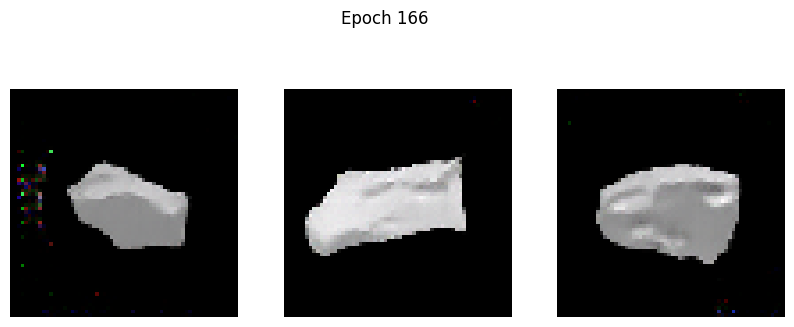

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.9990 - g_loss: 4.0080
Epoch 167/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1574 - g_loss: 2.8366

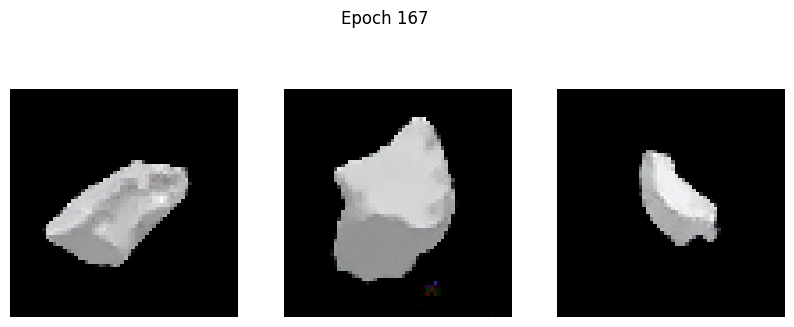

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1573 - g_loss: 2.8364
Epoch 168/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1295 - g_loss: 2.9414

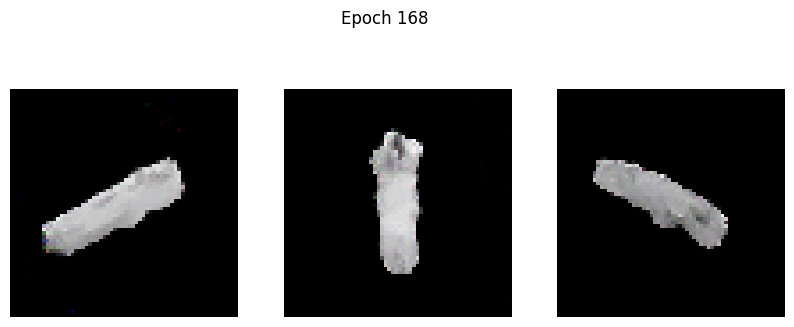

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1296 - g_loss: 2.9414
Epoch 169/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1401 - g_loss: 3.0225

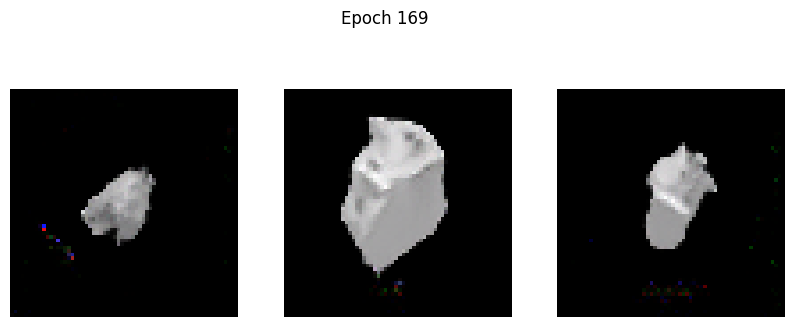

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1401 - g_loss: 3.0224
Epoch 170/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1471 - g_loss: 3.1095

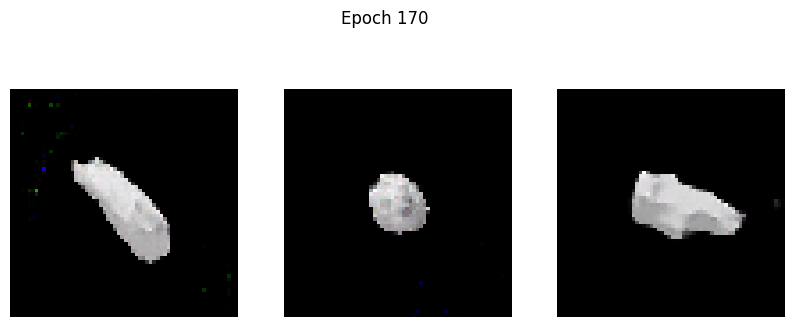

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1471 - g_loss: 3.1096
Epoch 171/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1483 - g_loss: 3.0906

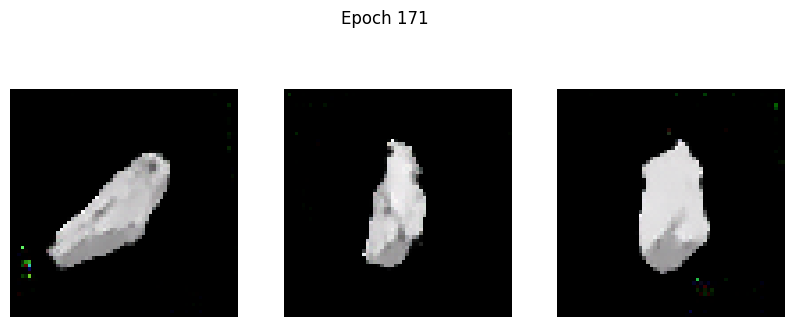

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1482 - g_loss: 3.0909
Epoch 172/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1772 - g_loss: 3.2992

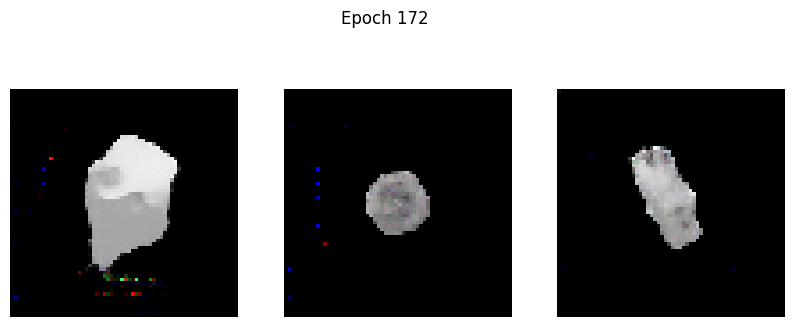

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1781 - g_loss: 3.2993
Epoch 173/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1799 - g_loss: 2.9972

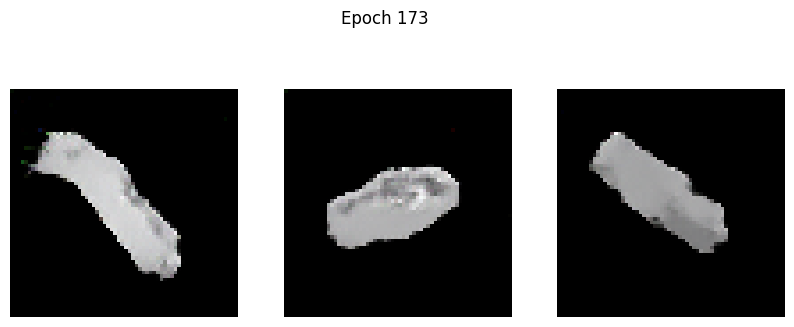

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1798 - g_loss: 2.9978
Epoch 174/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1457 - g_loss: 3.1730

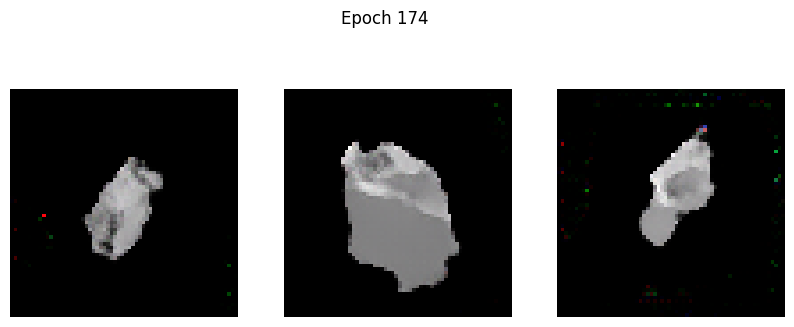

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1457 - g_loss: 3.1727
Epoch 175/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1292 - g_loss: 3.1634

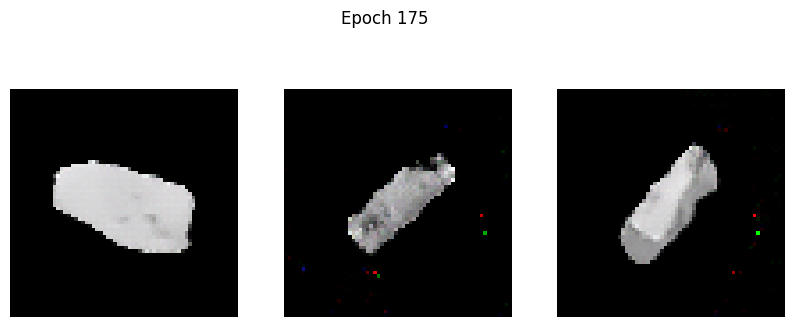

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1293 - g_loss: 3.1635
Epoch 176/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1816 - g_loss: 3.2925

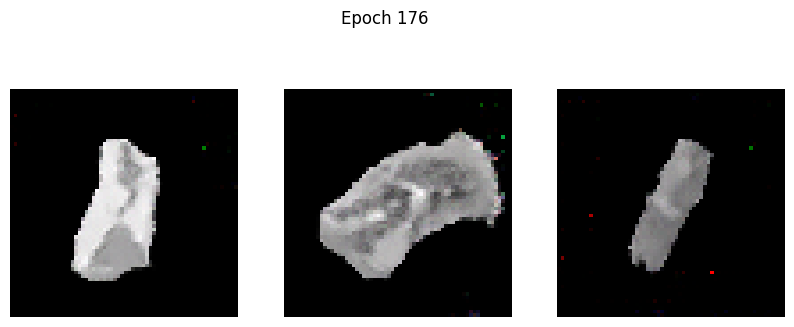

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1821 - g_loss: 3.2927
Epoch 177/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1430 - g_loss: 3.1116

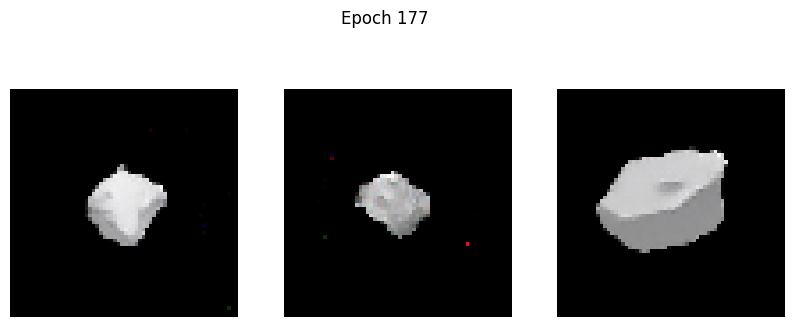

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1429 - g_loss: 3.1118
Epoch 178/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1412 - g_loss: 3.2071

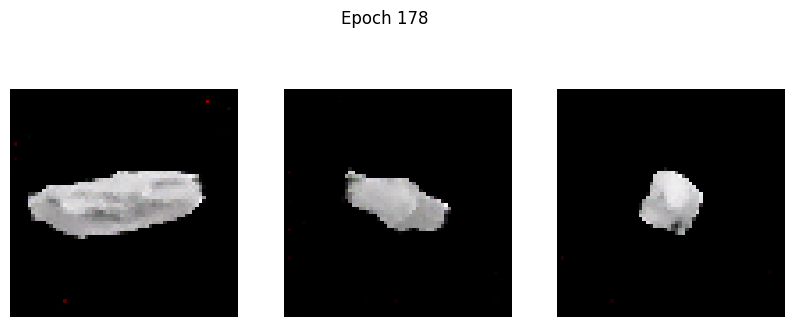

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1411 - g_loss: 3.2070
Epoch 179/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1369 - g_loss: 3.2902

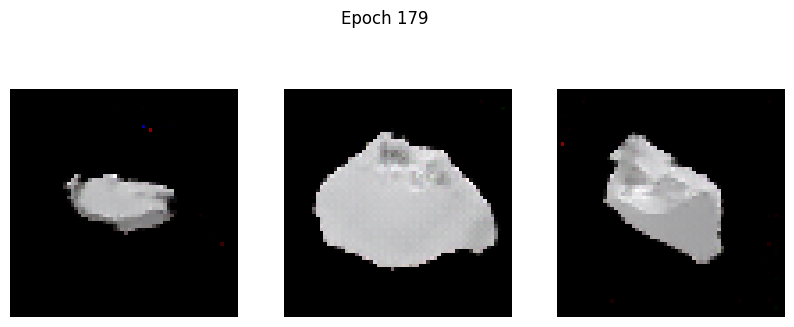

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1371 - g_loss: 3.2898
Epoch 180/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4177 - g_loss: 3.6683

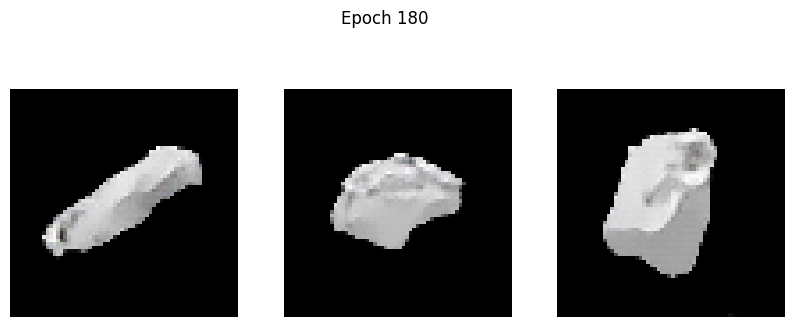

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4159 - g_loss: 3.6645
Epoch 181/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1224 - g_loss: 3.1541

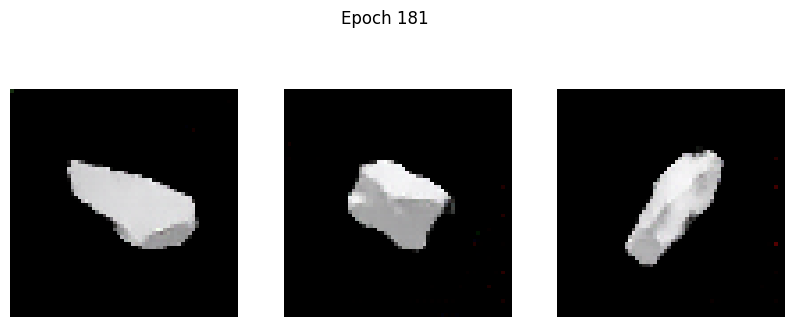

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1225 - g_loss: 3.1543
Epoch 182/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1586 - g_loss: 3.2848

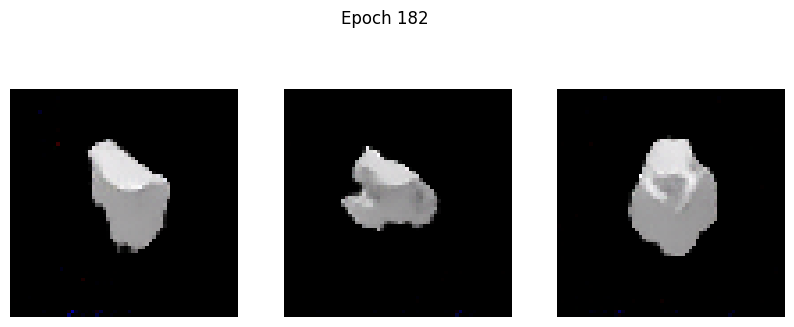

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1588 - g_loss: 3.2848
Epoch 183/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1384 - g_loss: 3.3105

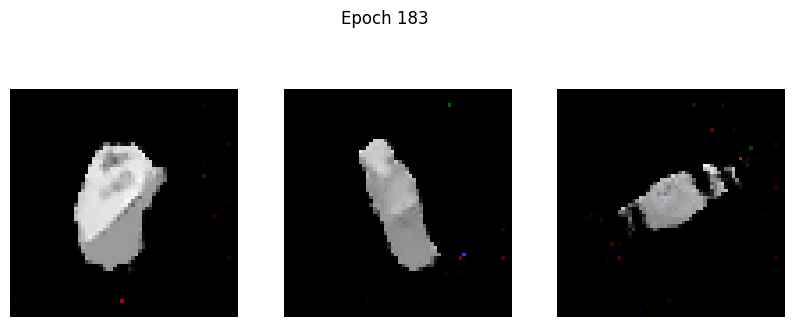

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - d_loss: 0.1385 - g_loss: 3.3101
Epoch 184/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1221 - g_loss: 3.2737

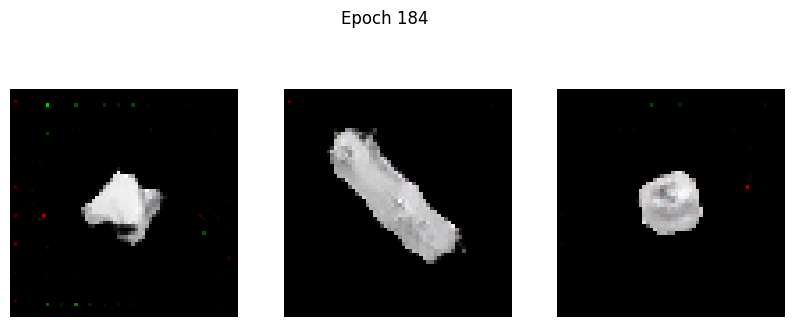

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1224 - g_loss: 3.2739
Epoch 185/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1091 - g_loss: 3.2233

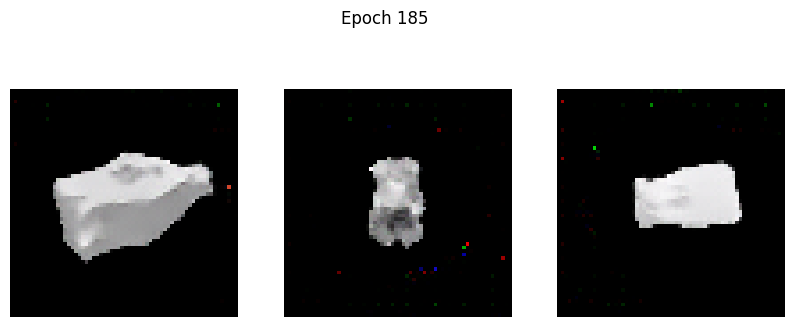

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1092 - g_loss: 3.2239
Epoch 186/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1609 - g_loss: 3.4288

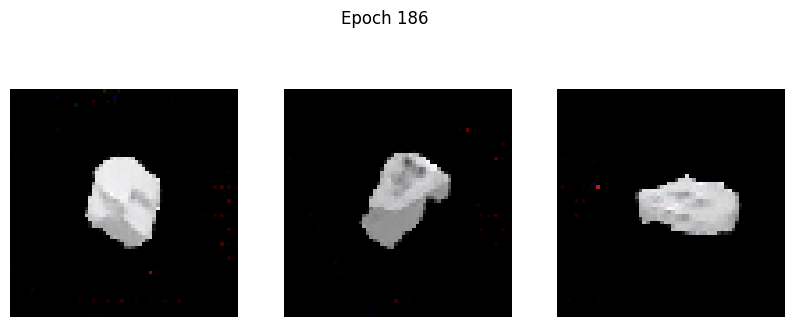

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1610 - g_loss: 3.4282
Epoch 187/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1417 - g_loss: 3.3761

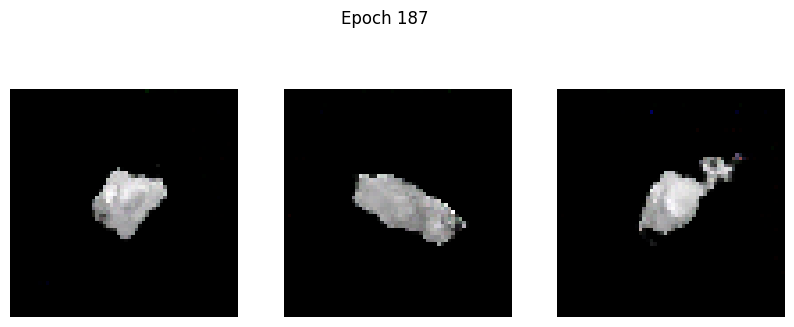

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.1421 - g_loss: 3.3761
Epoch 188/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.4201 - g_loss: 3.5996

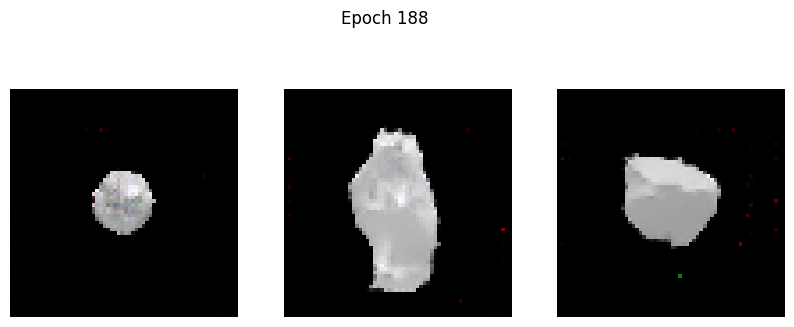

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.4185 - g_loss: 3.5970
Epoch 189/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1311 - g_loss: 3.2648

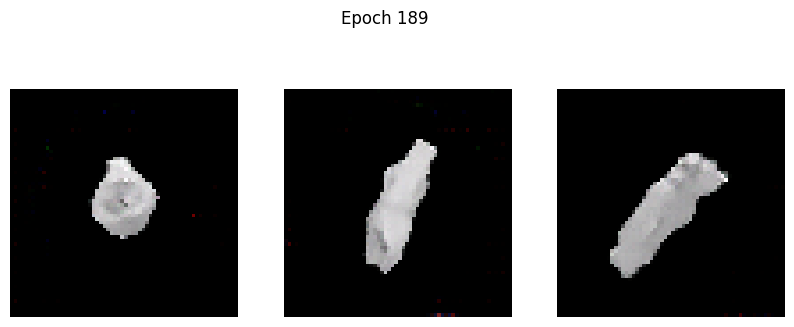

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1313 - g_loss: 3.2647
Epoch 190/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1314 - g_loss: 3.3202

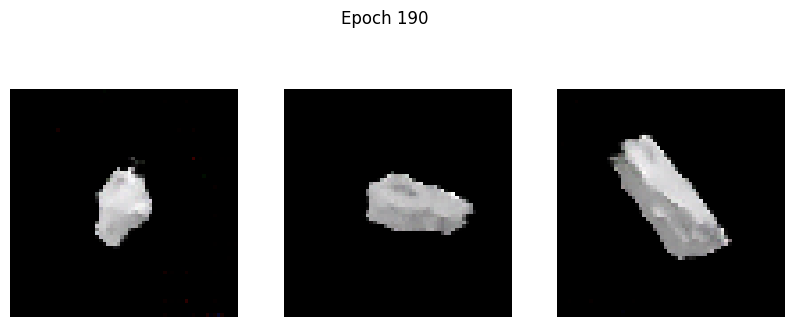

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1314 - g_loss: 3.3202
Epoch 191/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1282 - g_loss: 3.3511

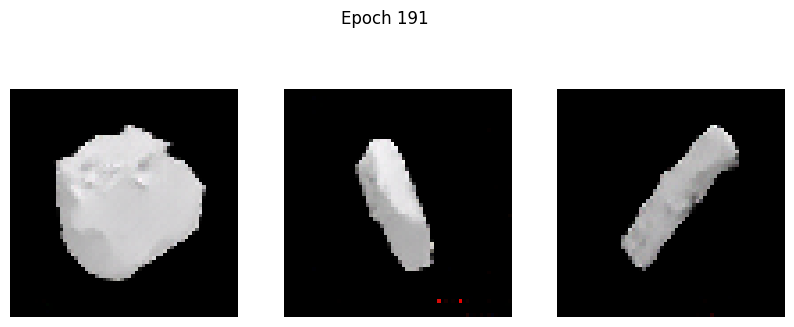

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1283 - g_loss: 3.3512
Epoch 192/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1222 - g_loss: 3.3845

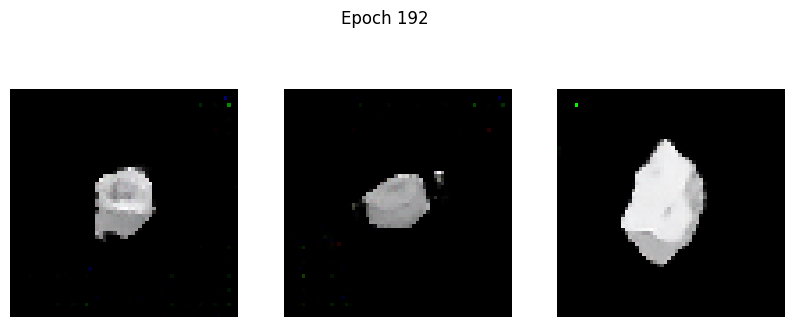

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1221 - g_loss: 3.3844
Epoch 193/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1738 - g_loss: 3.4633

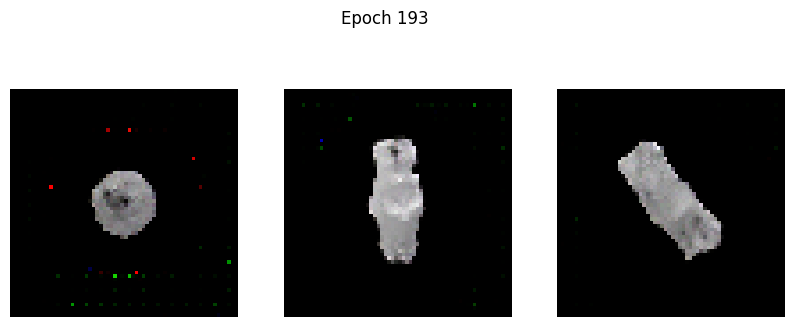

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1740 - g_loss: 3.4633
Epoch 194/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1399 - g_loss: 3.3679

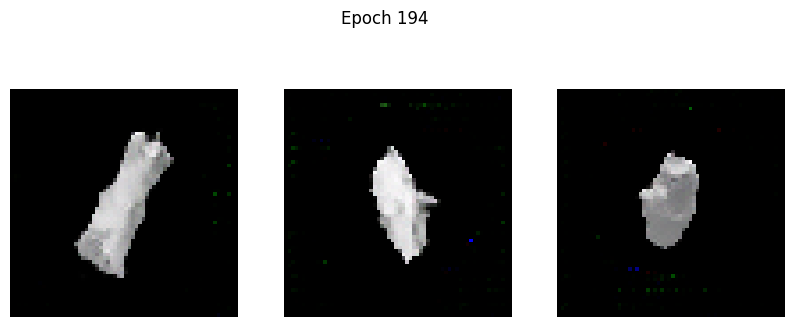

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1399 - g_loss: 3.3676
Epoch 195/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1780 - g_loss: 3.3908

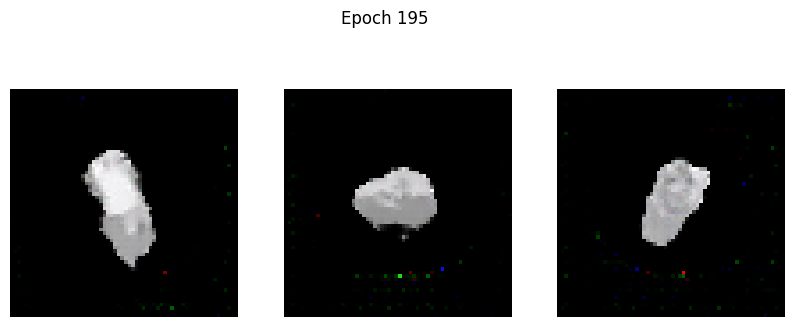

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1779 - g_loss: 3.3908
Epoch 196/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1293 - g_loss: 3.3807

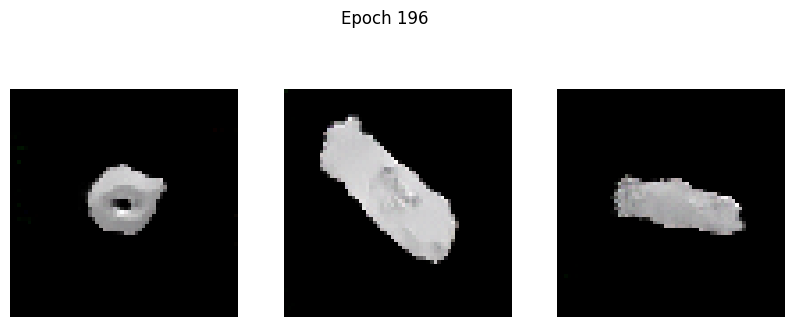

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1294 - g_loss: 3.3805
Epoch 197/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1167 - g_loss: 3.4120

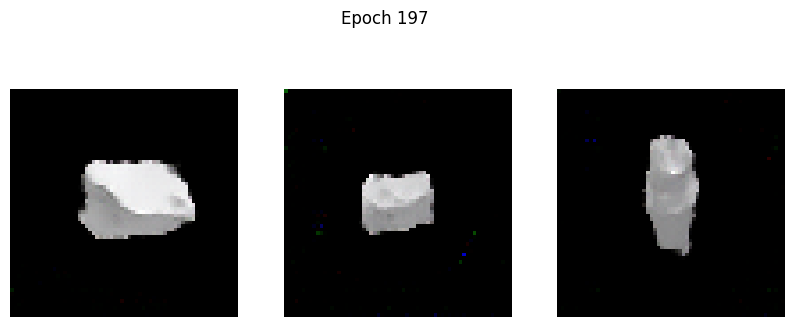

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1168 - g_loss: 3.4122
Epoch 198/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1400 - g_loss: 3.4987

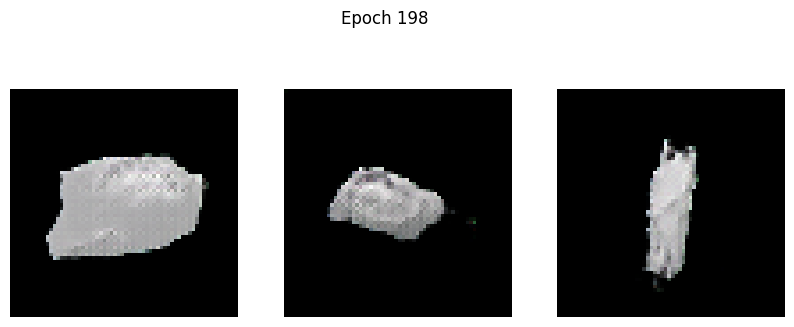

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1419 - g_loss: 3.5014
Epoch 199/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4811 - g_loss: 3.5542

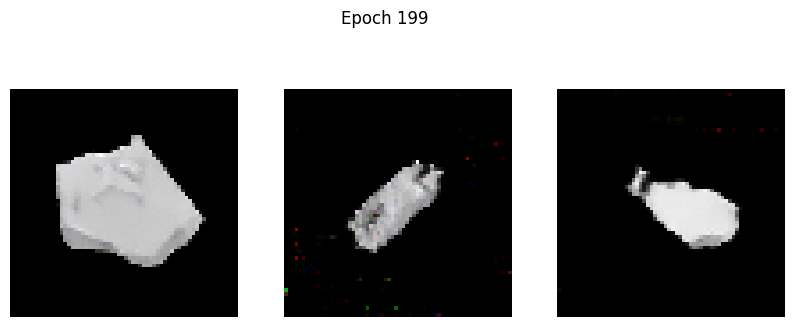

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.4787 - g_loss: 3.5508
Epoch 200/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1219 - g_loss: 3.2298

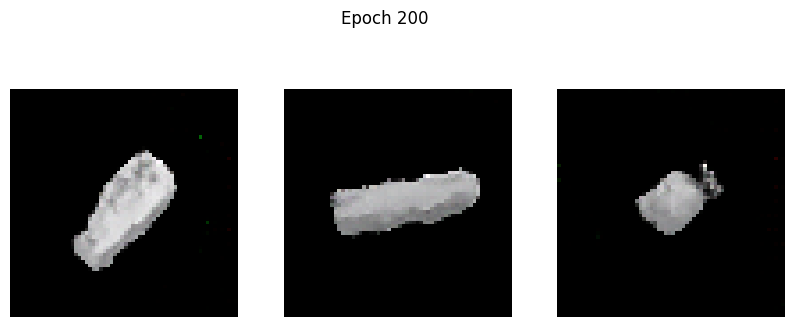

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1218 - g_loss: 3.2298
Epoch 201/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1147 - g_loss: 3.2885

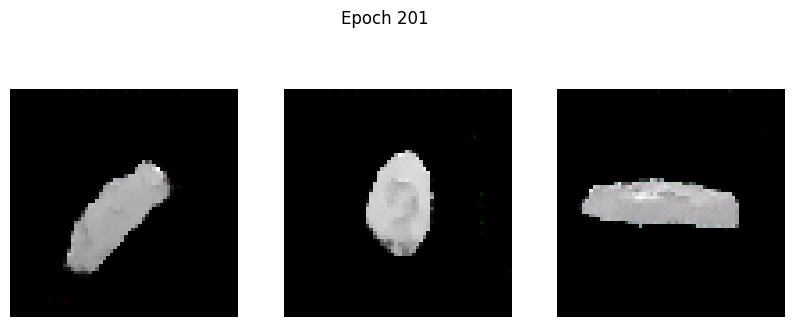

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1147 - g_loss: 3.2886
Epoch 202/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1179 - g_loss: 3.3189

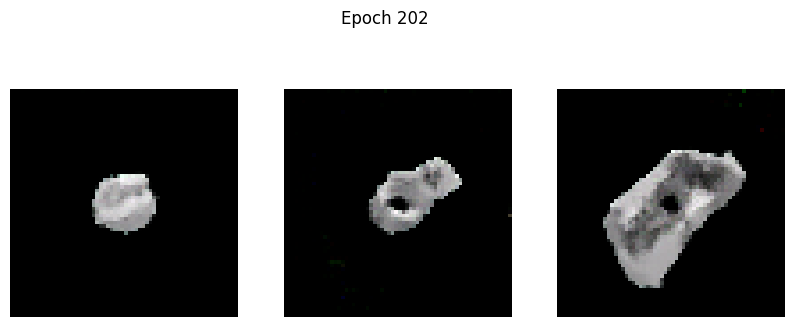

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1180 - g_loss: 3.3191
Epoch 203/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1641 - g_loss: 3.4168

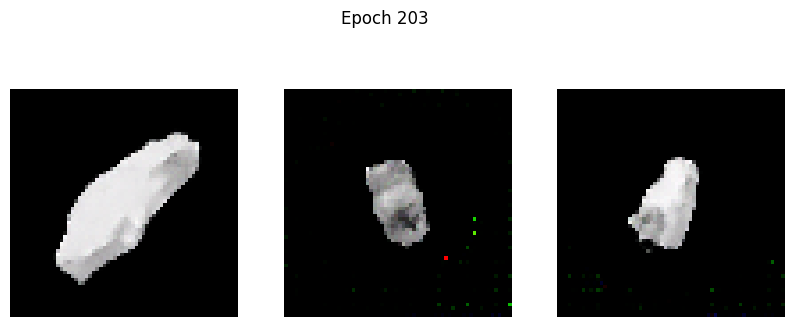

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1638 - g_loss: 3.4164
Epoch 204/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1466 - g_loss: 3.3845

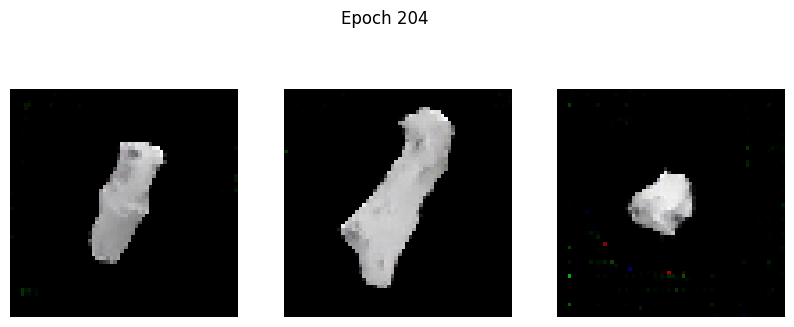

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1466 - g_loss: 3.3849
Epoch 205/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1203 - g_loss: 3.3889

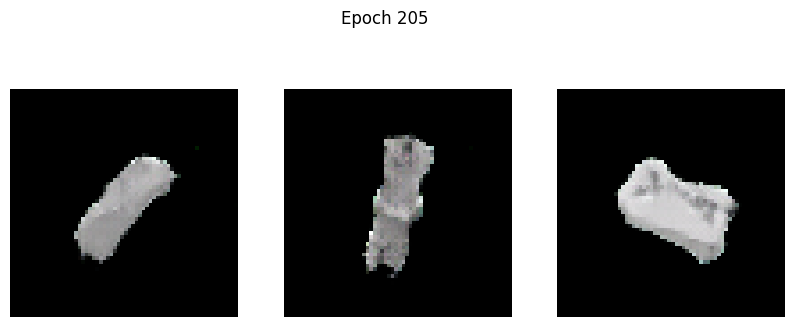

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1208 - g_loss: 3.3908
Epoch 206/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3923 - g_loss: 3.6379

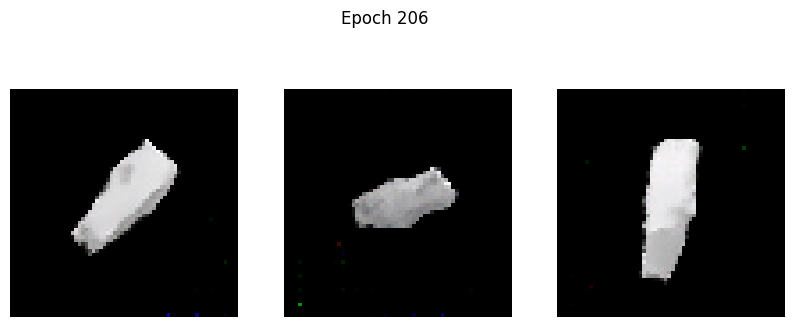

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3903 - g_loss: 3.6360
Epoch 207/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1027 - g_loss: 3.4738

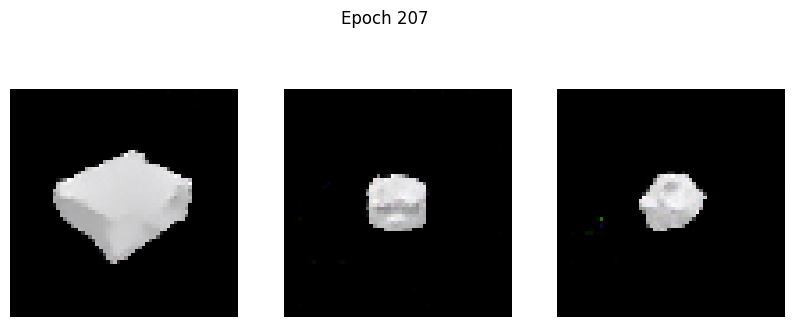

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1028 - g_loss: 3.4737
Epoch 208/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1137 - g_loss: 3.5292

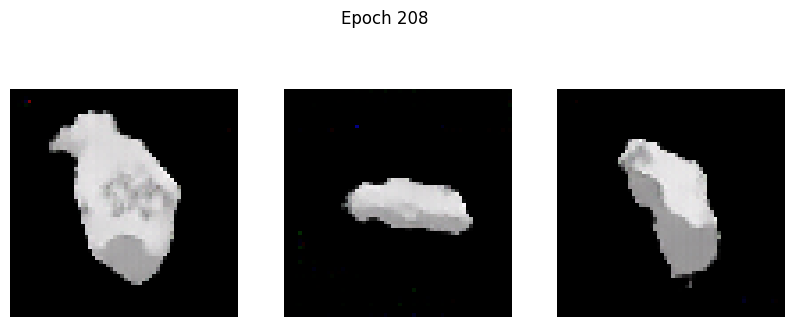

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1137 - g_loss: 3.5293
Epoch 209/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1249 - g_loss: 3.5290

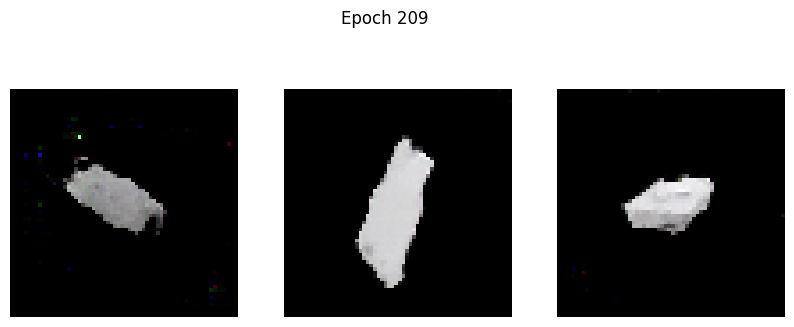

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1248 - g_loss: 3.5290
Epoch 210/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1285 - g_loss: 3.5330

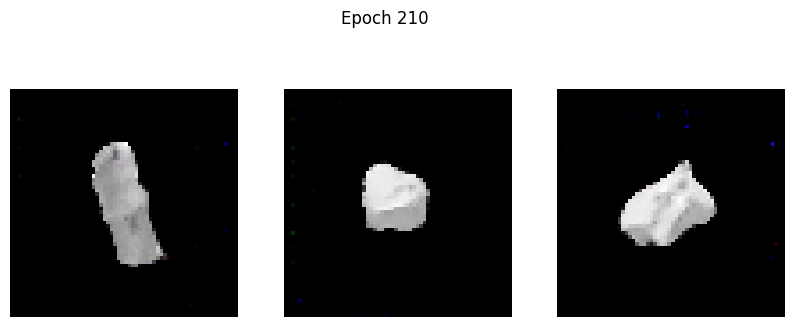

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1286 - g_loss: 3.5331
Epoch 211/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1377 - g_loss: 3.6617

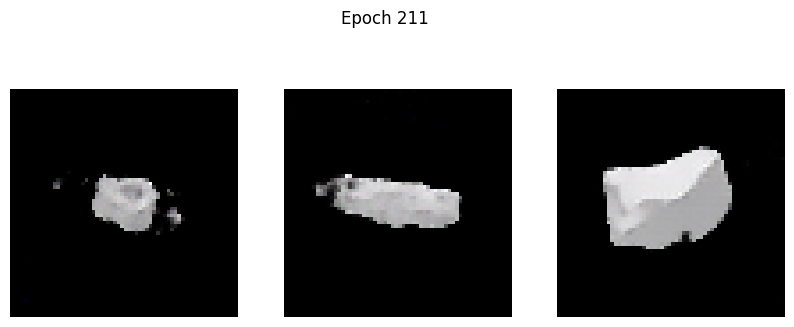

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1375 - g_loss: 3.6610
Epoch 212/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1452 - g_loss: 3.6488

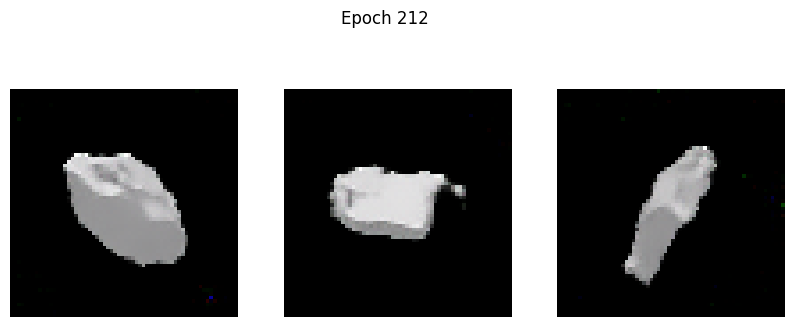

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1456 - g_loss: 3.6488
Epoch 213/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1049 - g_loss: 3.5467

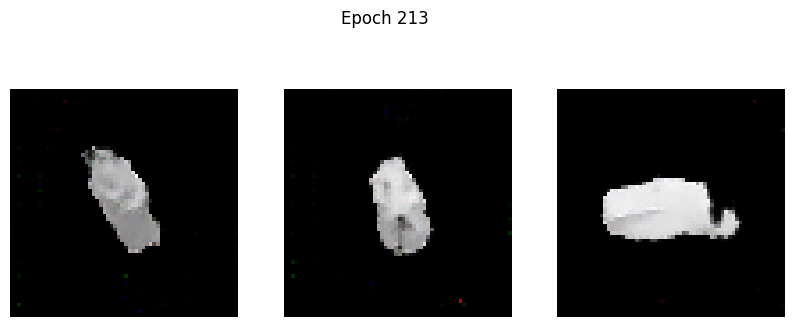

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1049 - g_loss: 3.5463
Epoch 214/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2927 - g_loss: 3.8195

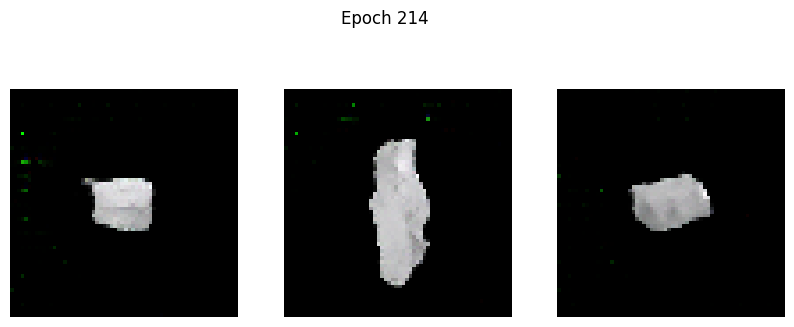

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2926 - g_loss: 3.8182
Epoch 215/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1132 - g_loss: 3.3880

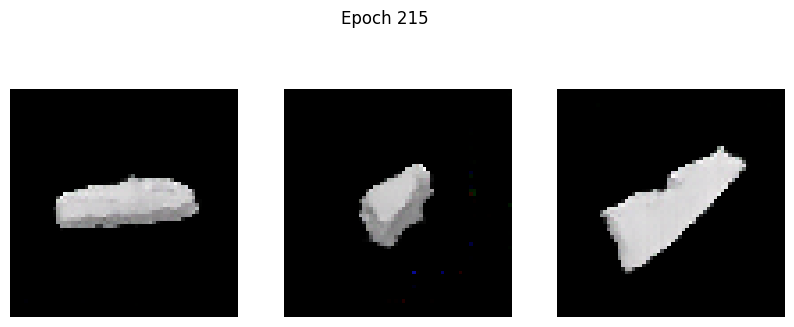

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1132 - g_loss: 3.3886
Epoch 216/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1106 - g_loss: 3.5533

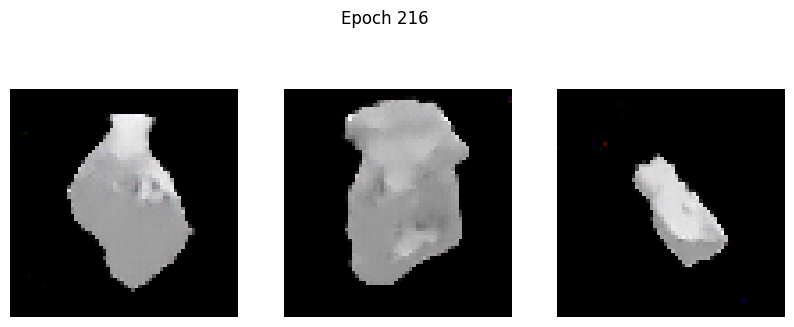

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1108 - g_loss: 3.5532
Epoch 217/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1025 - g_loss: 3.6036

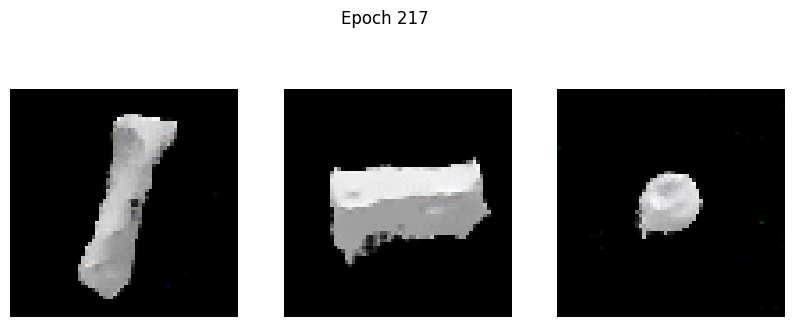

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1026 - g_loss: 3.6036
Epoch 218/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0963 - g_loss: 3.5889

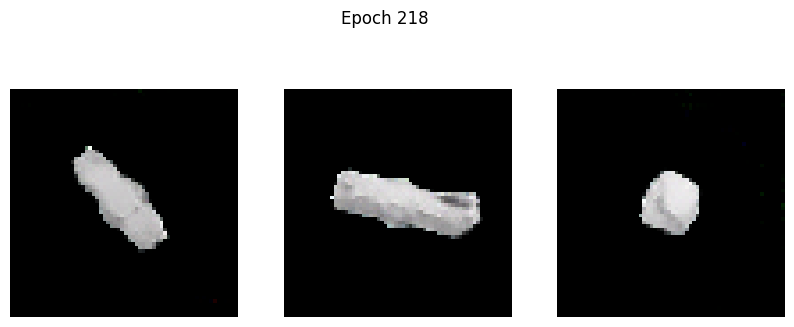

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0965 - g_loss: 3.5893
Epoch 219/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1213 - g_loss: 3.5813

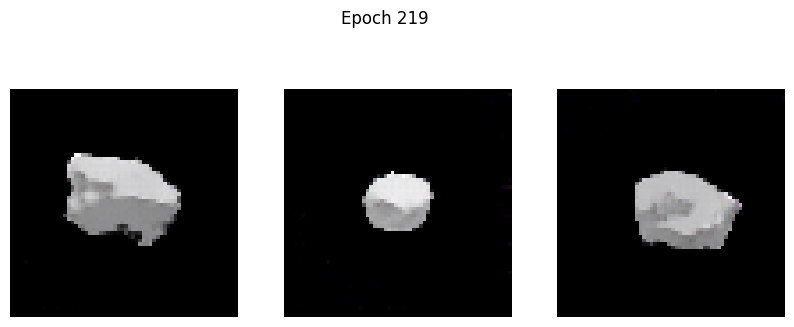

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1214 - g_loss: 3.5813
Epoch 220/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1091 - g_loss: 3.5850

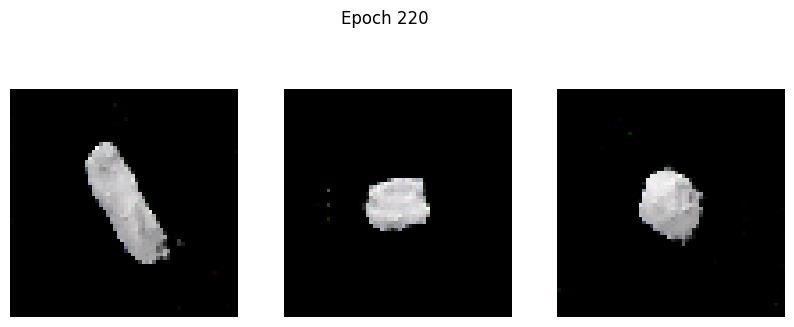

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1098 - g_loss: 3.5865
Epoch 221/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2649 - g_loss: 3.6745

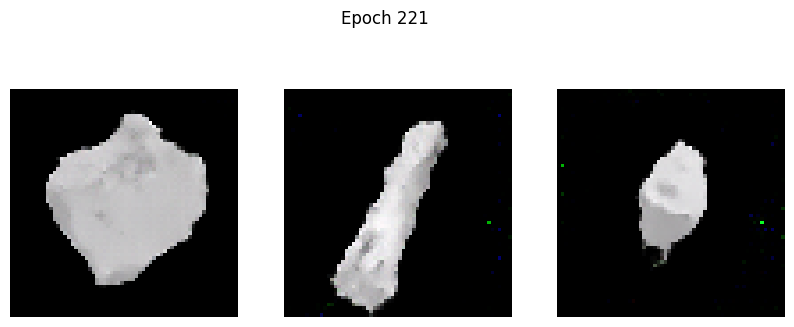

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2639 - g_loss: 3.6735
Epoch 222/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0999 - g_loss: 3.5965

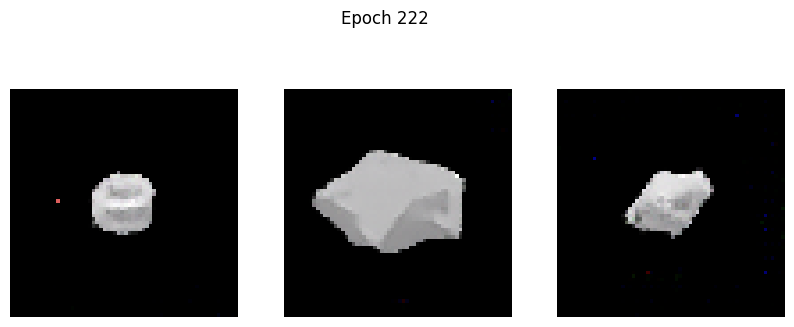

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1002 - g_loss: 3.5967
Epoch 223/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1001 - g_loss: 3.5926

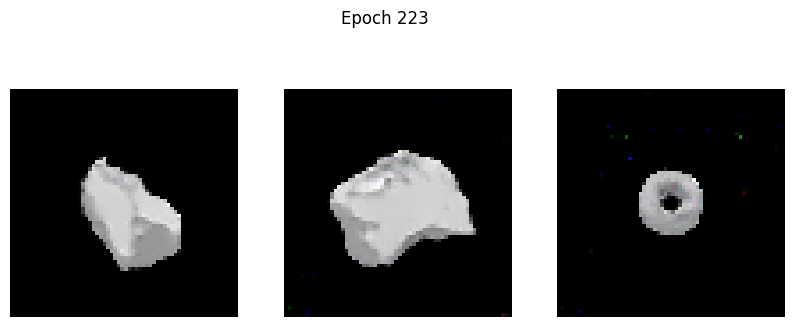

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1001 - g_loss: 3.5925
Epoch 224/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1077 - g_loss: 3.7431

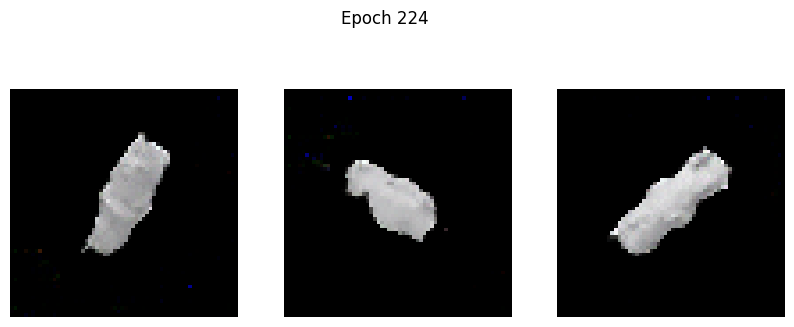

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1076 - g_loss: 3.7423
Epoch 225/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1387 - g_loss: 3.7494

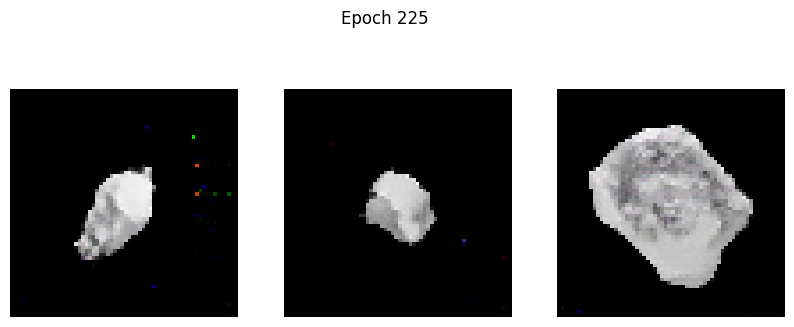

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - d_loss: 0.1390 - g_loss: 3.7495
Epoch 226/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1026 - g_loss: 3.6210

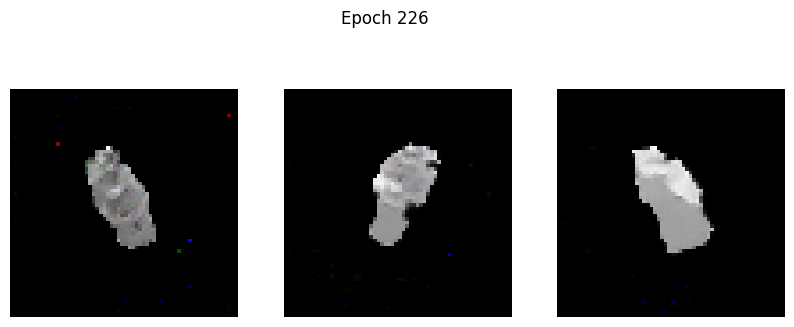

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1026 - g_loss: 3.6212
Epoch 227/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1952 - g_loss: 3.9262

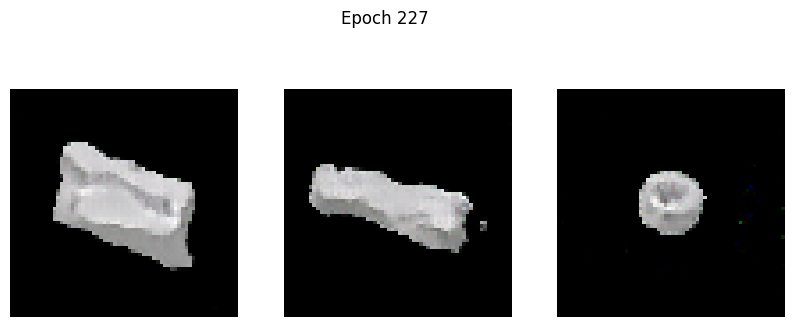

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1974 - g_loss: 3.9297
Epoch 228/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1201 - g_loss: 3.3926

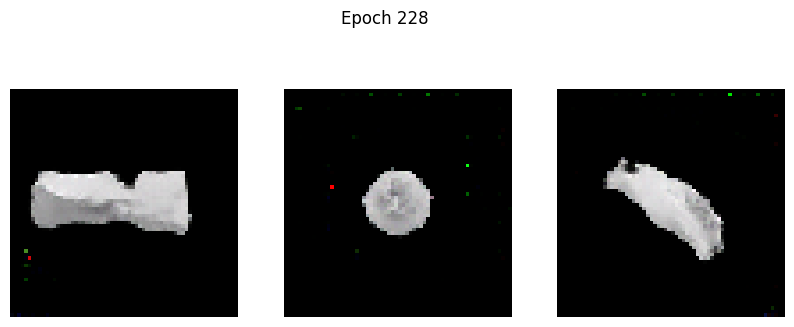

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1200 - g_loss: 3.3931
Epoch 229/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0975 - g_loss: 3.4678

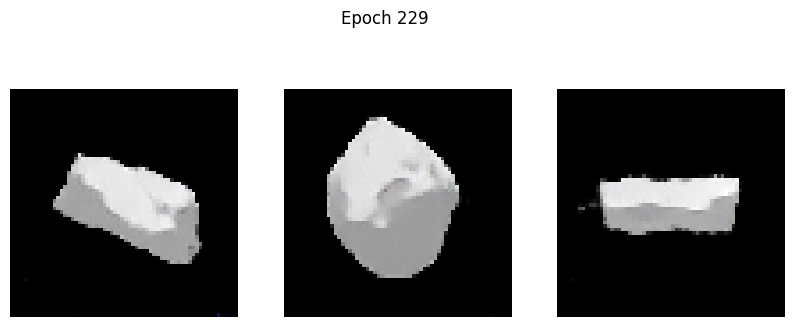

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0976 - g_loss: 3.4684
Epoch 230/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0859 - g_loss: 3.5660

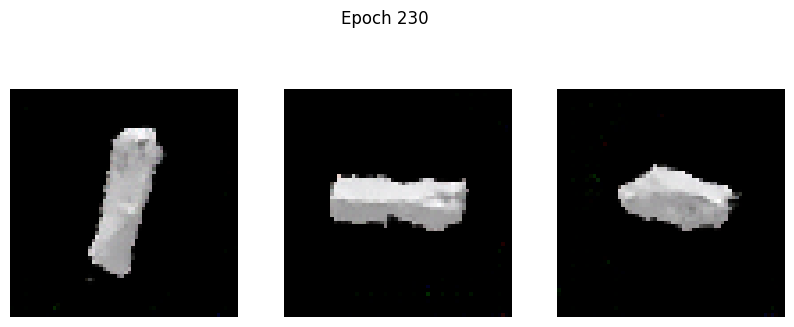

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0860 - g_loss: 3.5659
Epoch 231/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0866 - g_loss: 3.5845

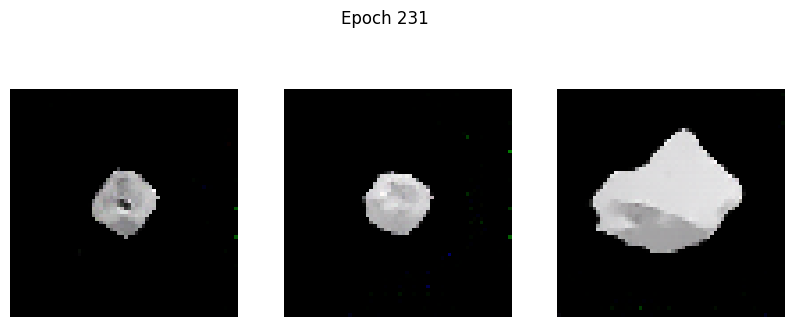

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.0866 - g_loss: 3.5847
Epoch 232/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0835 - g_loss: 3.6474

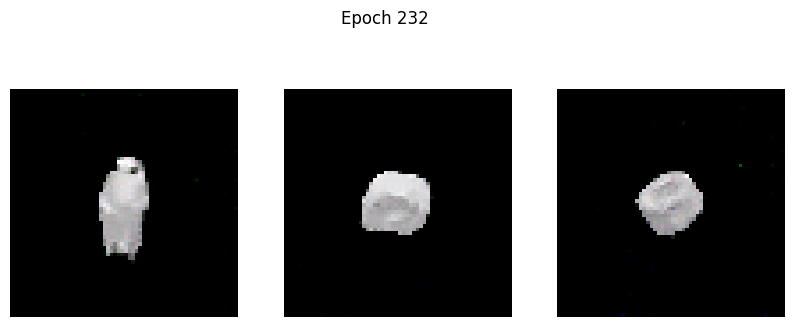

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0835 - g_loss: 3.6469
Epoch 233/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1976 - g_loss: 3.9233

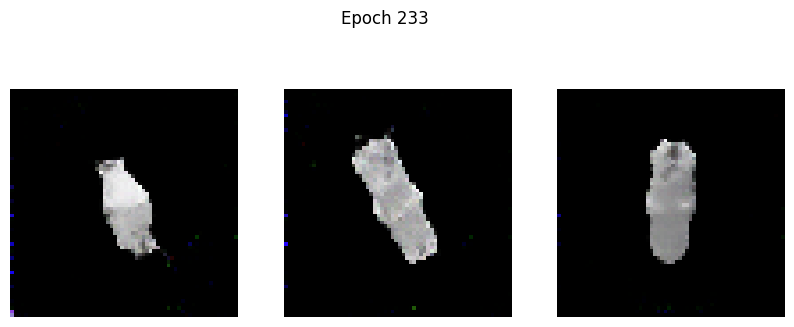

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1973 - g_loss: 3.9225
Epoch 234/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0987 - g_loss: 3.5941

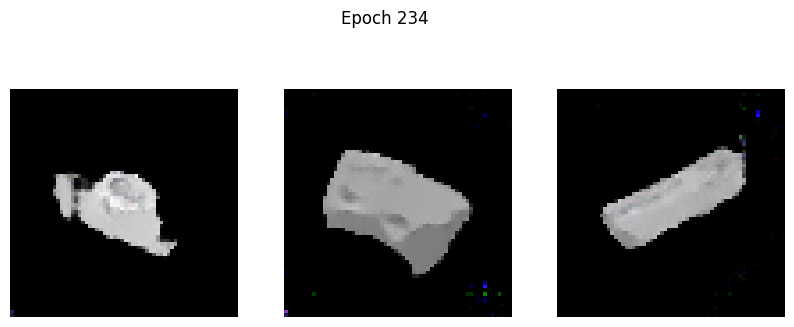

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0993 - g_loss: 3.5951
Epoch 235/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1031 - g_loss: 3.6554

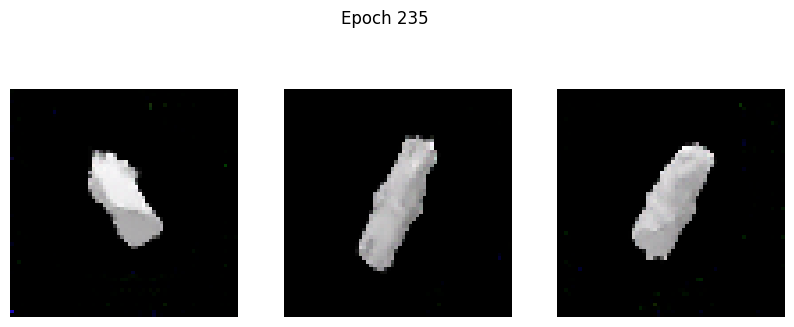

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1029 - g_loss: 3.6556
Epoch 236/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1120 - g_loss: 3.7312

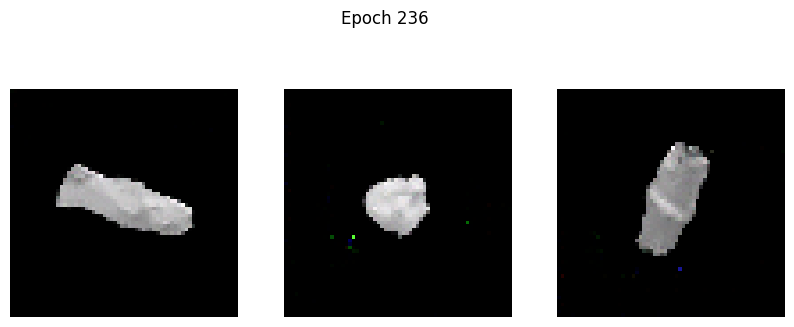

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1120 - g_loss: 3.7312
Epoch 237/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0938 - g_loss: 3.7435

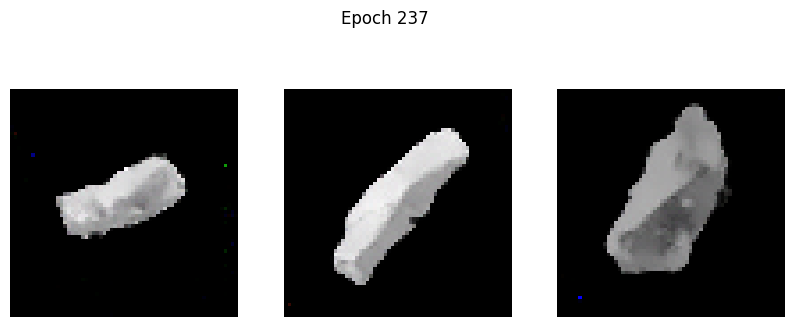

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0938 - g_loss: 3.7438
Epoch 238/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0821 - g_loss: 3.7323

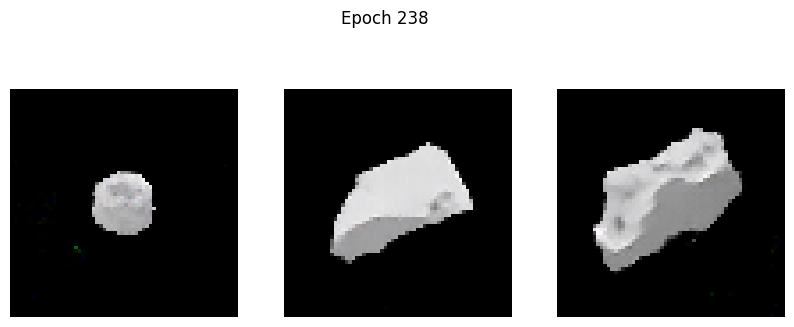

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0823 - g_loss: 3.7325
Epoch 239/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0984 - g_loss: 3.7790

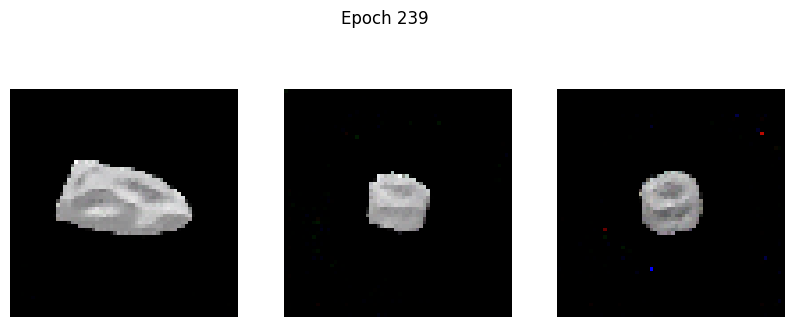

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0986 - g_loss: 3.7792
Epoch 240/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1130 - g_loss: 3.7771

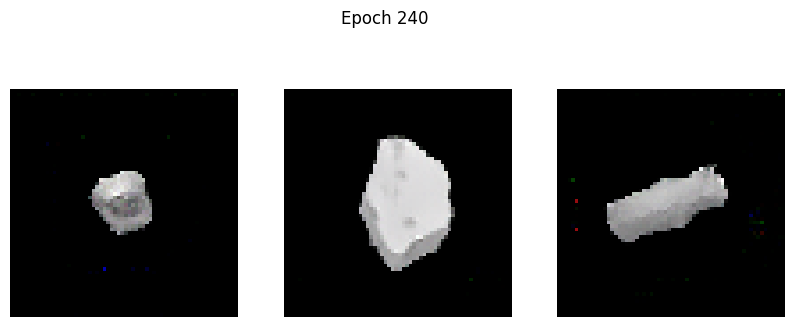

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1131 - g_loss: 3.7774
Epoch 241/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1242 - g_loss: 3.7849

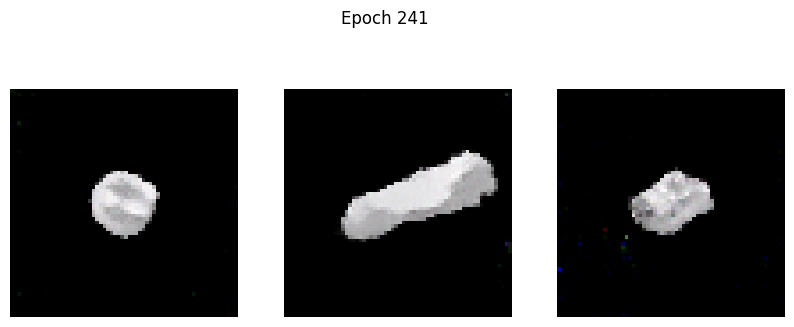

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1243 - g_loss: 3.7856
Epoch 242/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0857 - g_loss: 3.6841

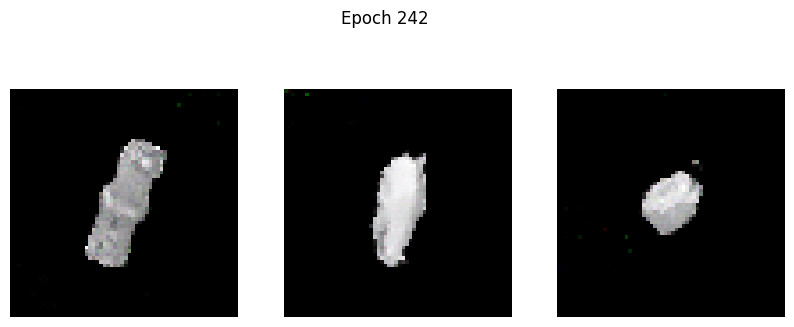

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0856 - g_loss: 3.6849
Epoch 243/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0838 - g_loss: 3.8952

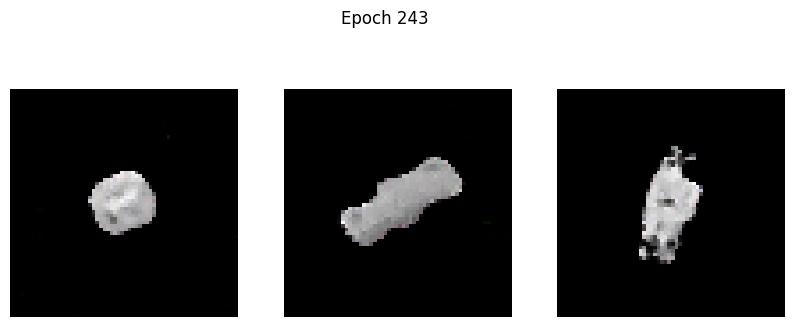

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0846 - g_loss: 3.8956
Epoch 244/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 1.2802 - g_loss: 5.0352

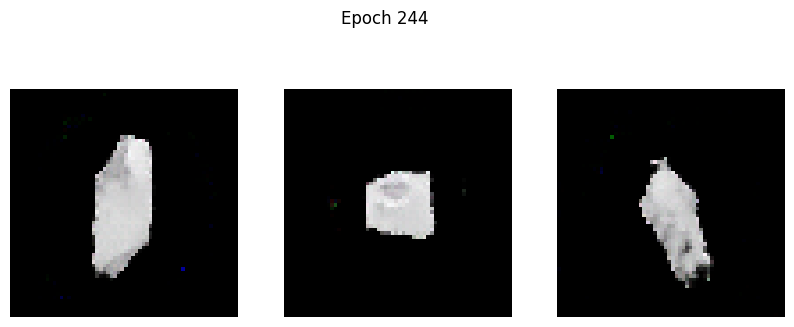

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 1.2739 - g_loss: 5.0232
Epoch 245/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1249 - g_loss: 3.4246

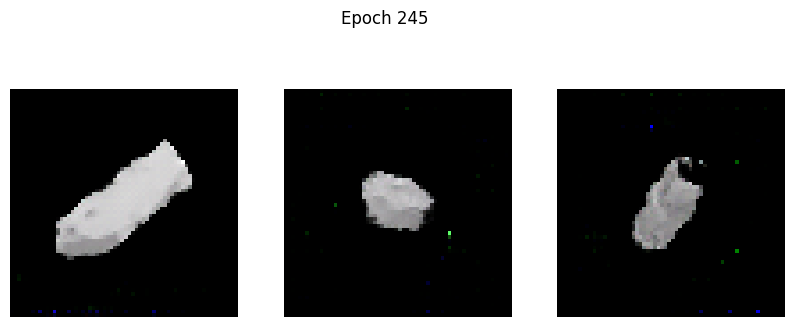

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1249 - g_loss: 3.4249
Epoch 246/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1040 - g_loss: 3.5308

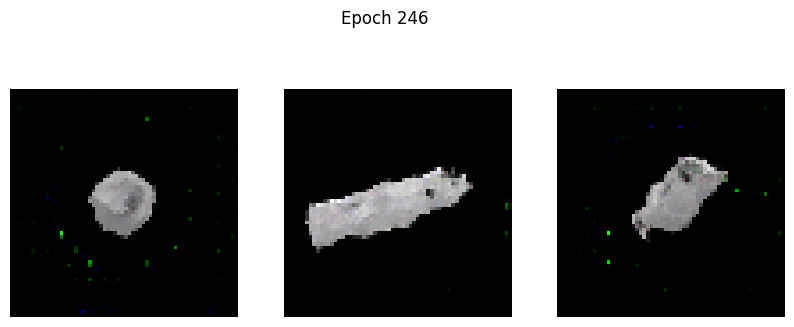

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1040 - g_loss: 3.5308
Epoch 247/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0945 - g_loss: 3.5448

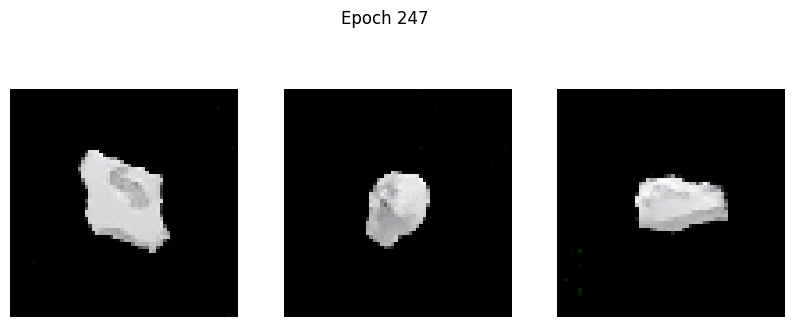

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0945 - g_loss: 3.5448
Epoch 248/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0740 - g_loss: 3.5910

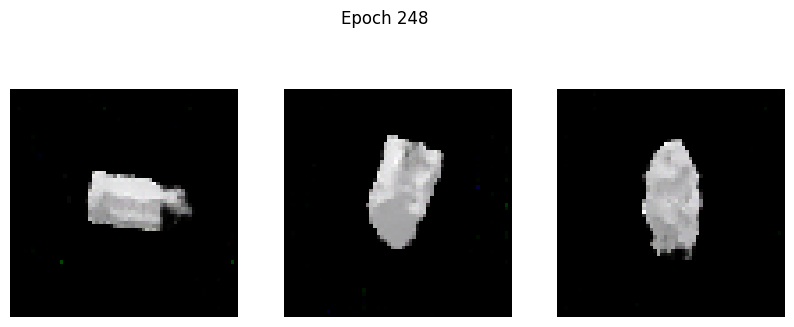

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0742 - g_loss: 3.5914
Epoch 249/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1083 - g_loss: 3.8757

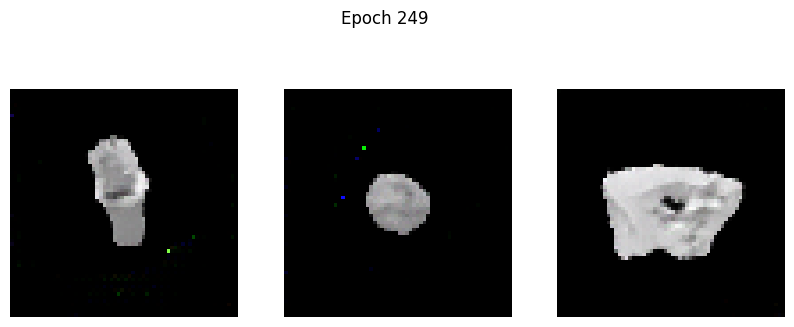

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1082 - g_loss: 3.8751
Epoch 250/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1192 - g_loss: 3.8912

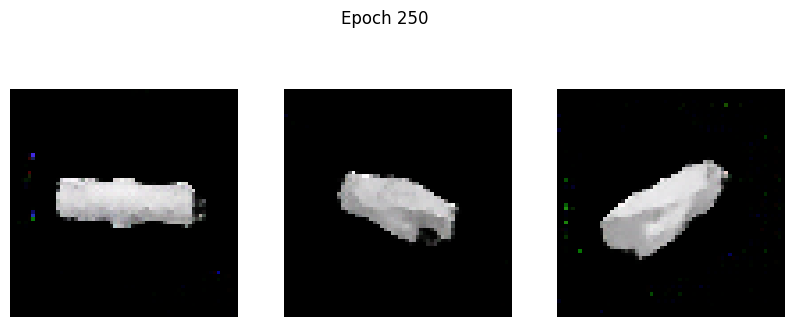

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1195 - g_loss: 3.8909
Epoch 251/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0903 - g_loss: 3.8212

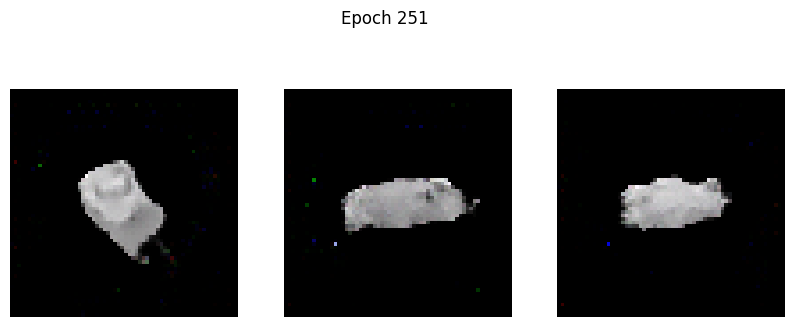

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0903 - g_loss: 3.8208
Epoch 252/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0915 - g_loss: 3.7796

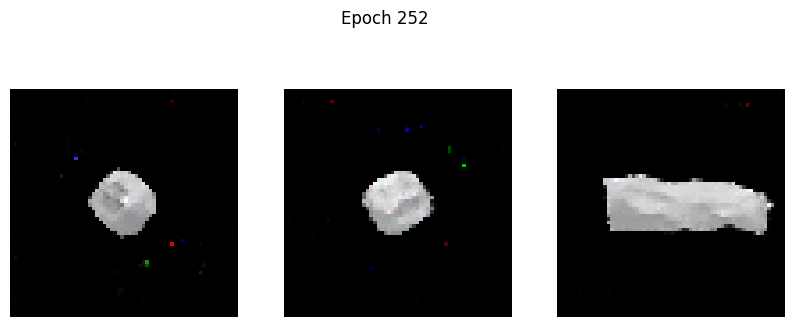

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0916 - g_loss: 3.7799
Epoch 253/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1094 - g_loss: 3.8915

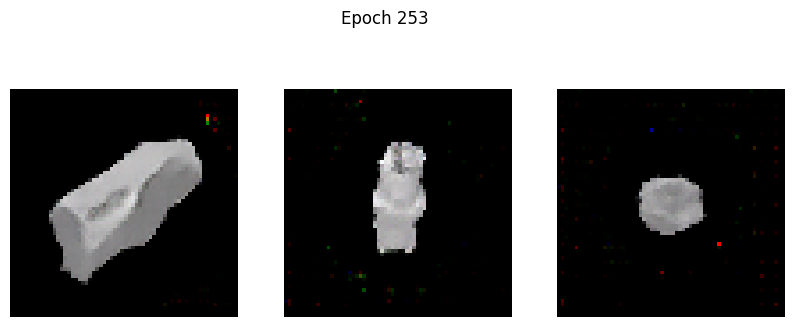

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1104 - g_loss: 3.8929
Epoch 254/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0844 - g_loss: 3.6668

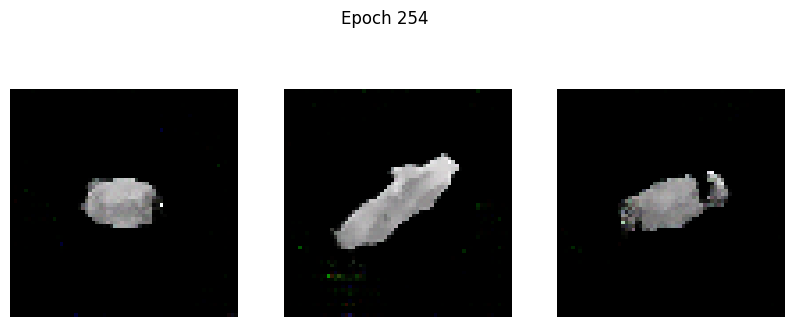

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0844 - g_loss: 3.6677
Epoch 255/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0831 - g_loss: 3.7768

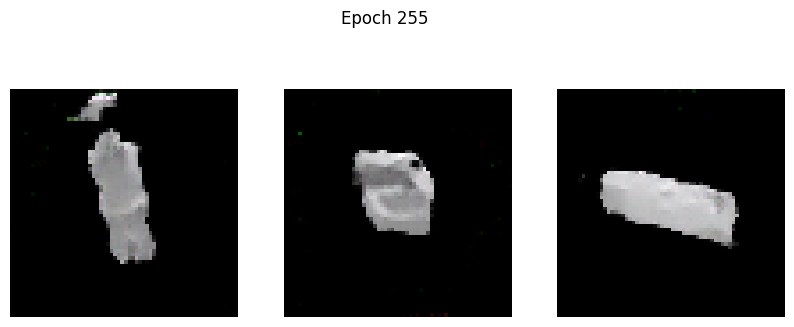

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0831 - g_loss: 3.7768
Epoch 256/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0877 - g_loss: 3.9008

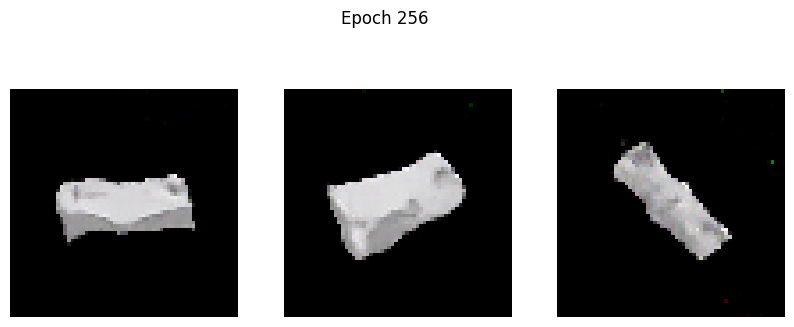

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0876 - g_loss: 3.9006
Epoch 257/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0797 - g_loss: 3.8683

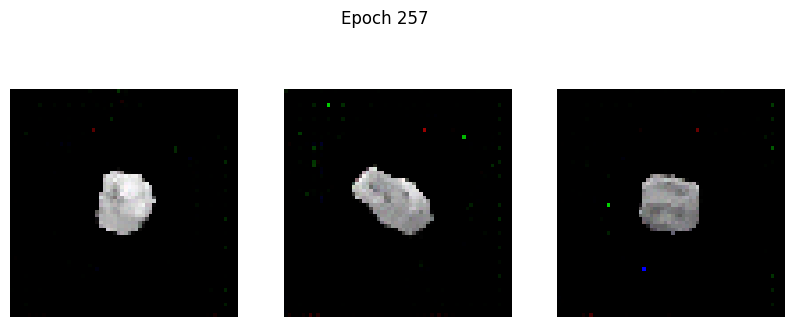

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0797 - g_loss: 3.8683
Epoch 258/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1266 - g_loss: 4.0023

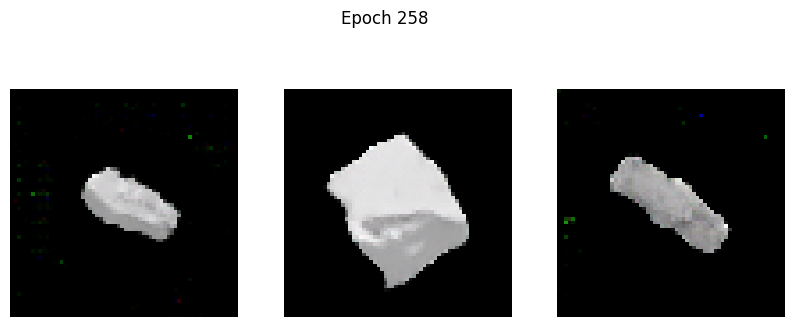

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1268 - g_loss: 4.0025
Epoch 259/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0924 - g_loss: 4.0326

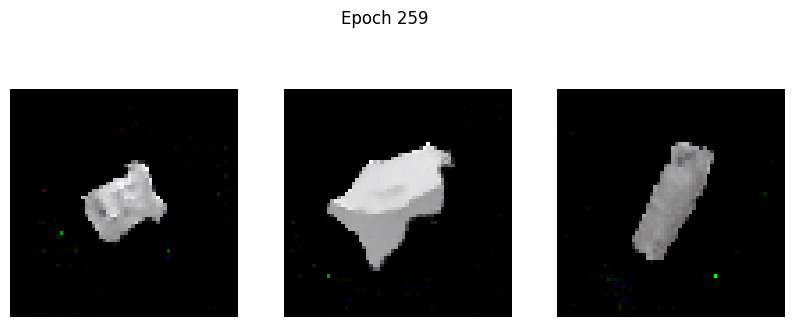

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0924 - g_loss: 4.0323
Epoch 260/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0729 - g_loss: 3.9642

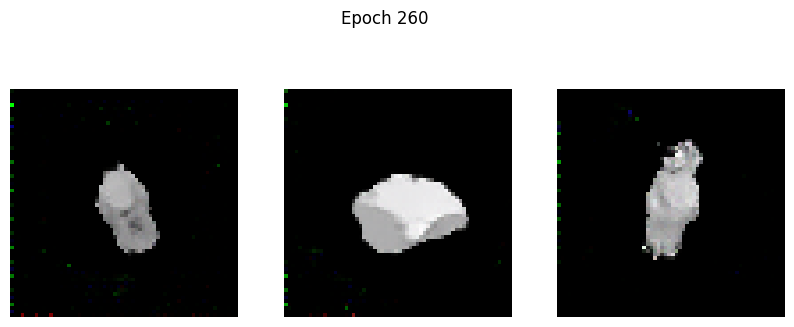

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0729 - g_loss: 3.9635
Epoch 261/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0941 - g_loss: 3.9736

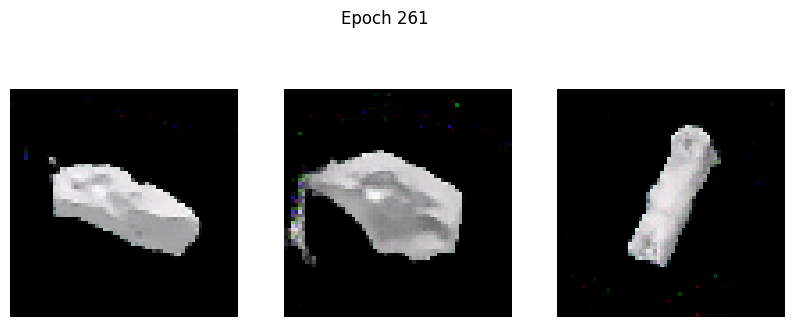

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0942 - g_loss: 3.9744
Epoch 262/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2974 - g_loss: 4.1651

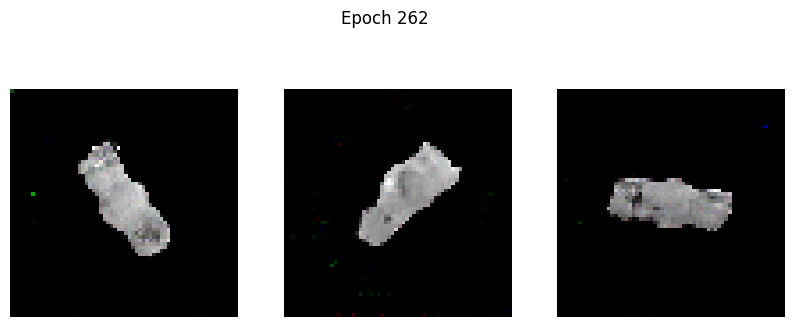

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.2961 - g_loss: 4.1637
Epoch 263/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0806 - g_loss: 3.8218

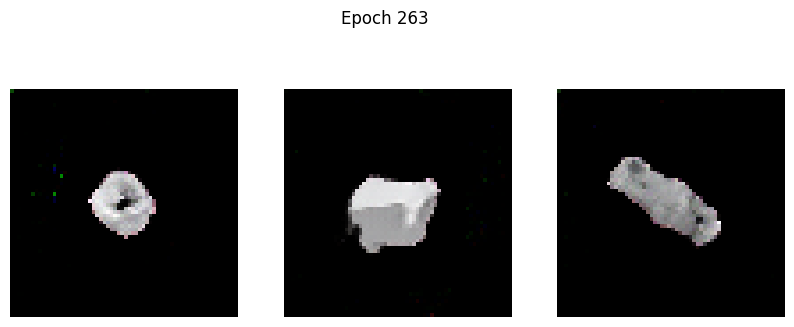

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0810 - g_loss: 3.8231
Epoch 264/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3655 - g_loss: 4.4939

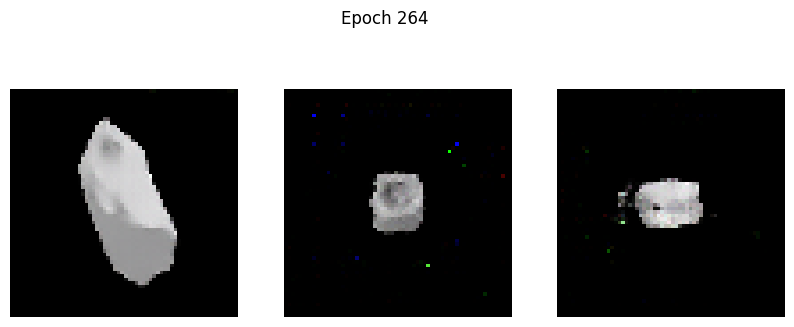

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3636 - g_loss: 4.4887
Epoch 265/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0691 - g_loss: 3.8586

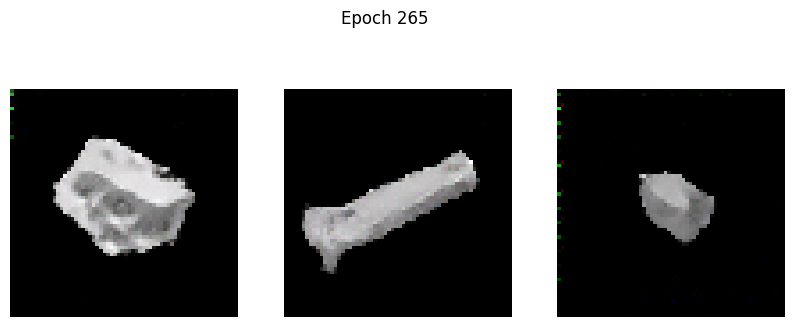

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0691 - g_loss: 3.8586
Epoch 266/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0718 - g_loss: 3.8876

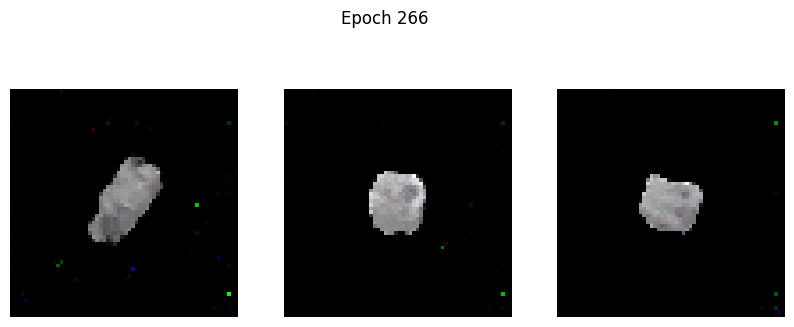

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0719 - g_loss: 3.8878
Epoch 267/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1039 - g_loss: 4.1077

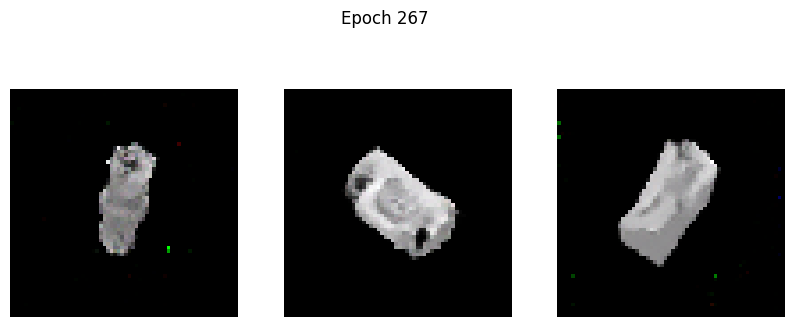

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1041 - g_loss: 4.1080
Epoch 268/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0693 - g_loss: 3.9947

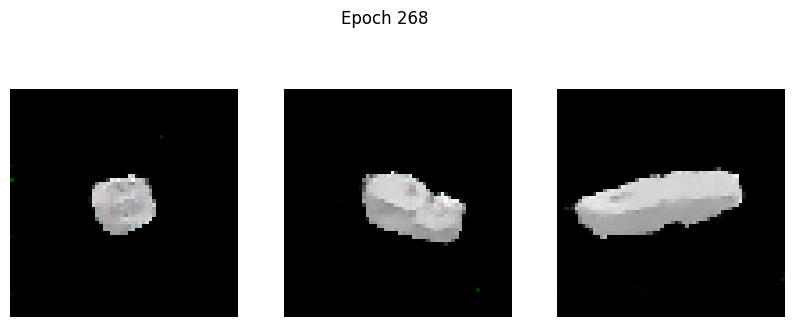

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0695 - g_loss: 3.9951
Epoch 269/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0902 - g_loss: 3.9988

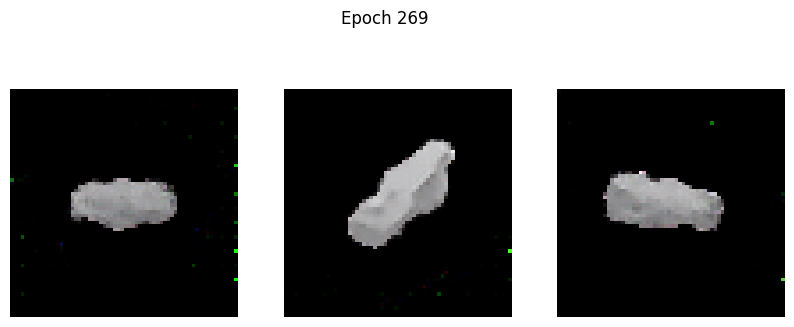

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0904 - g_loss: 3.9995
Epoch 270/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1142 - g_loss: 3.9015

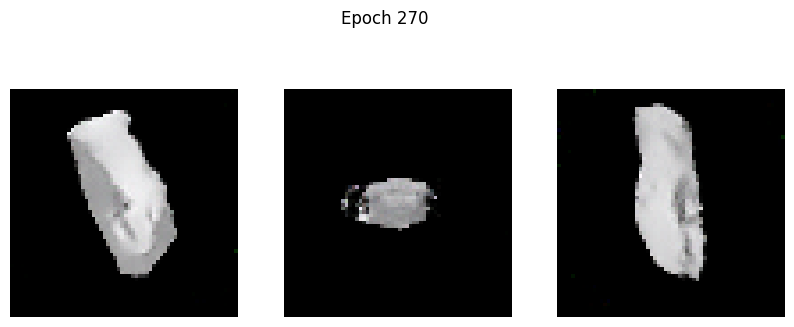

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1138 - g_loss: 3.9016
Epoch 271/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1586 - g_loss: 4.1347

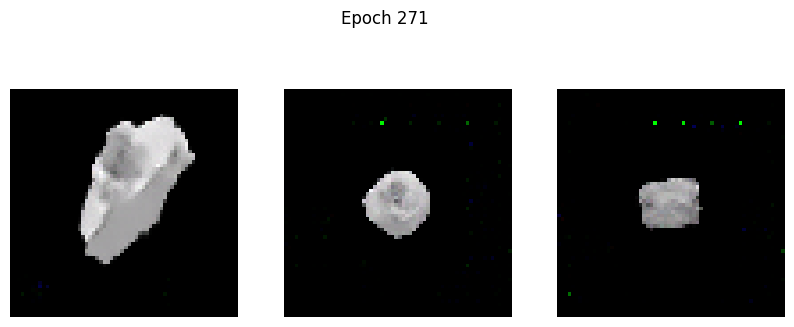

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1584 - g_loss: 4.1339
Epoch 272/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0722 - g_loss: 4.0165

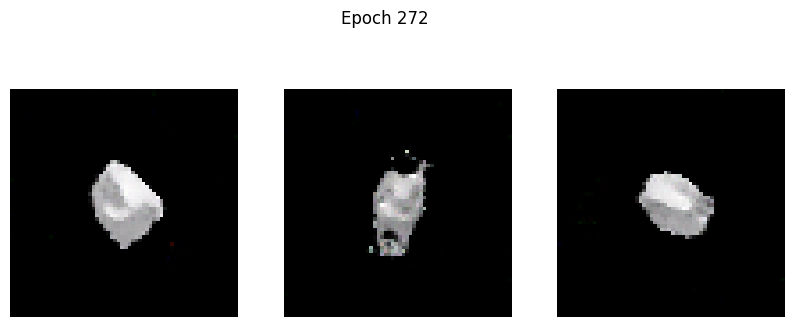

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0729 - g_loss: 4.0179
Epoch 273/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2460 - g_loss: 4.1976

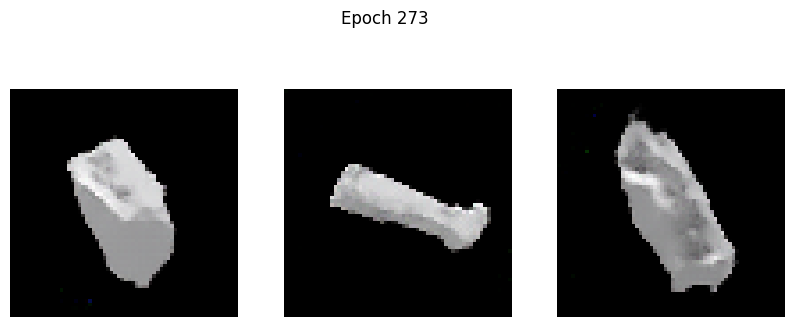

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2449 - g_loss: 4.1957
Epoch 274/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0632 - g_loss: 3.9452

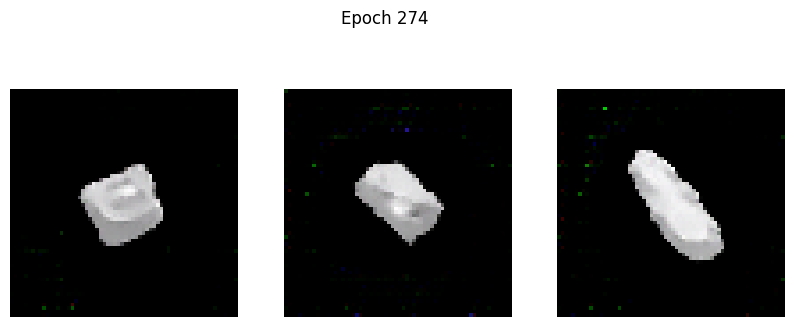

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0633 - g_loss: 3.9455
Epoch 275/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0615 - g_loss: 4.0217

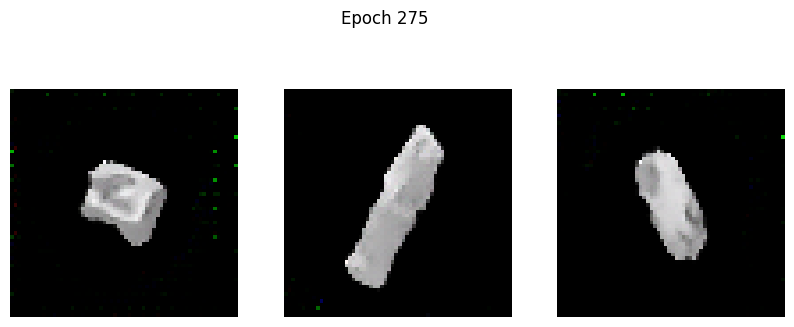

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0617 - g_loss: 4.0221
Epoch 276/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0593 - g_loss: 4.0187

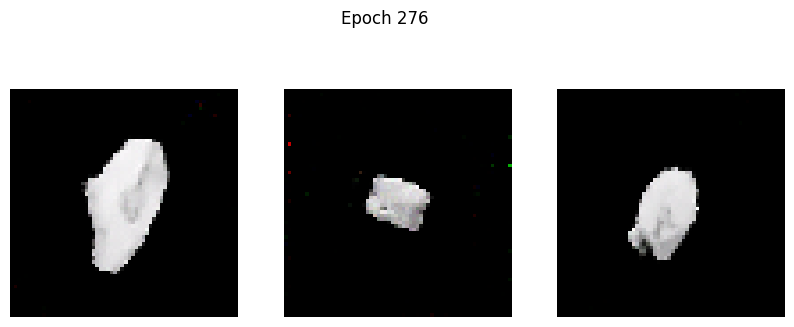

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0594 - g_loss: 4.0191
Epoch 277/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1627 - g_loss: 4.2630

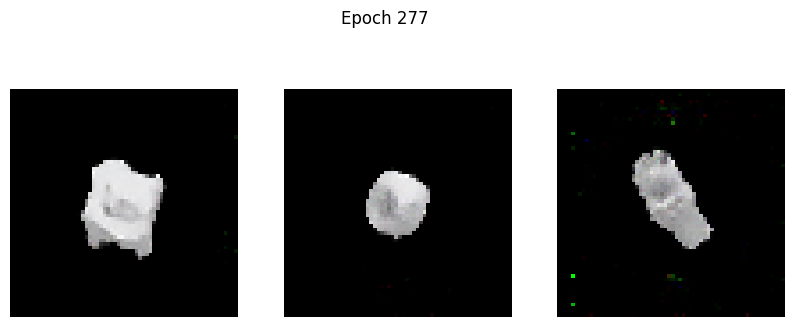

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1629 - g_loss: 4.2626
Epoch 278/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0866 - g_loss: 3.9785

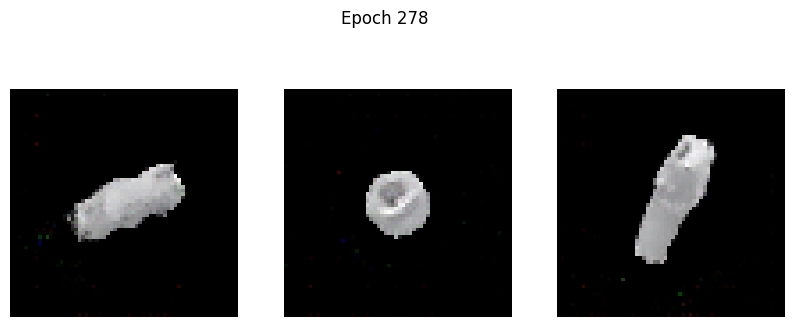

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0867 - g_loss: 3.9793
Epoch 279/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0767 - g_loss: 3.9744

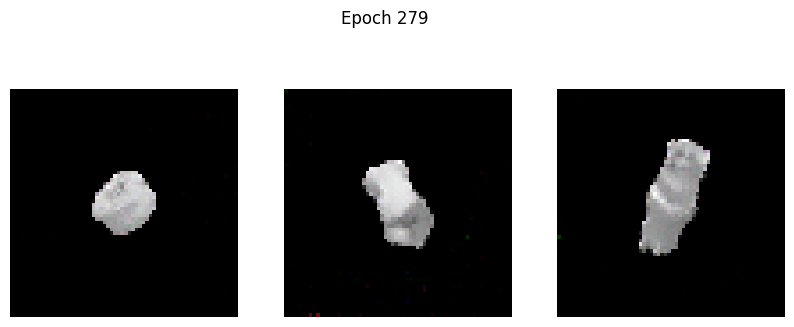

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0766 - g_loss: 3.9749
Epoch 280/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0672 - g_loss: 4.0757

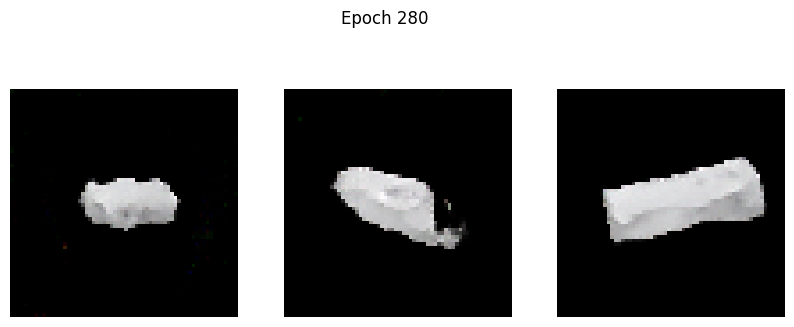

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0674 - g_loss: 4.0761
Epoch 281/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0664 - g_loss: 4.1187

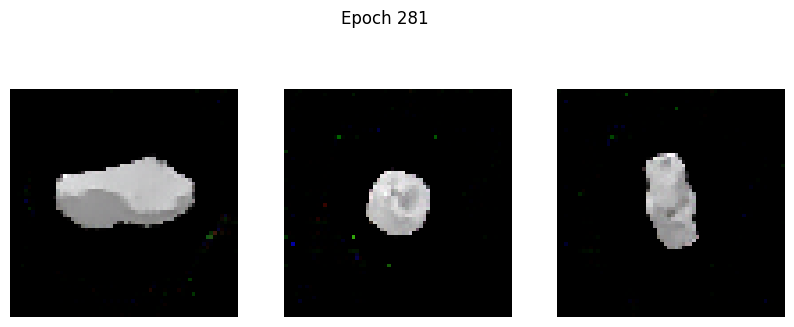

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0667 - g_loss: 4.1186
Epoch 282/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1186 - g_loss: 4.2034

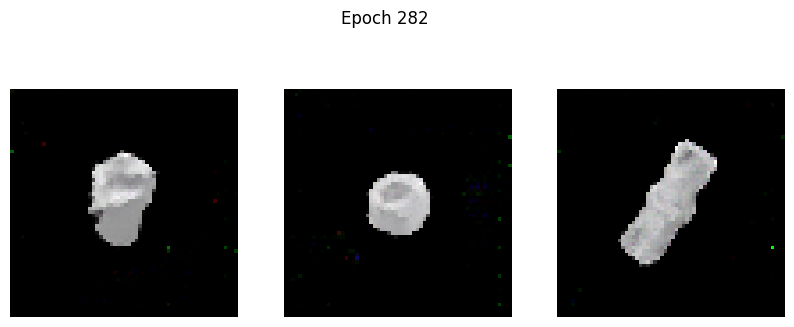

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1183 - g_loss: 4.2022
Epoch 283/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1244 - g_loss: 4.2051

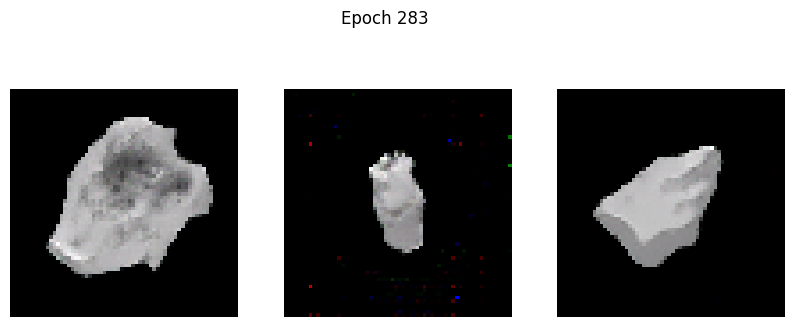

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1244 - g_loss: 4.2057
Epoch 284/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0778 - g_loss: 4.0767

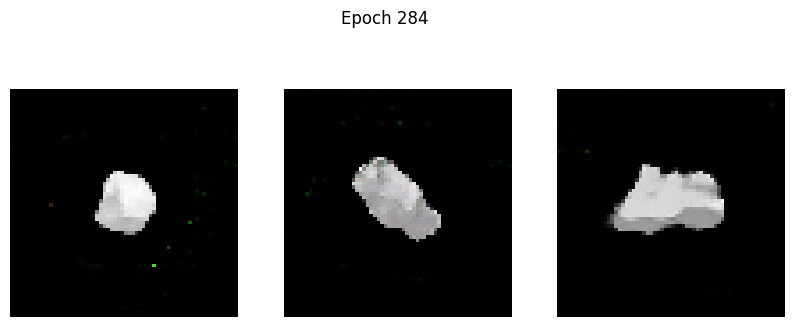

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0779 - g_loss: 4.0766
Epoch 285/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0859 - g_loss: 4.2074

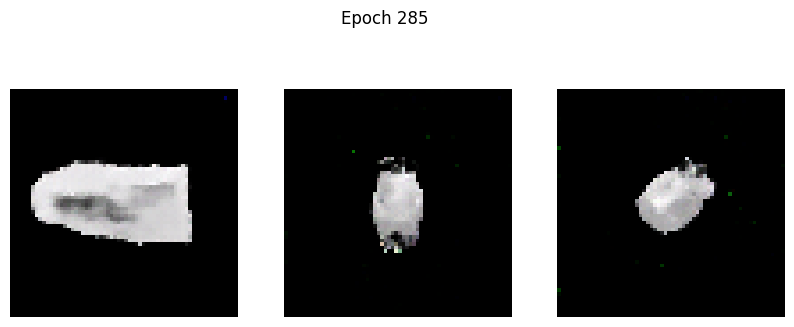

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0861 - g_loss: 4.2074
Epoch 286/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0814 - g_loss: 4.0919

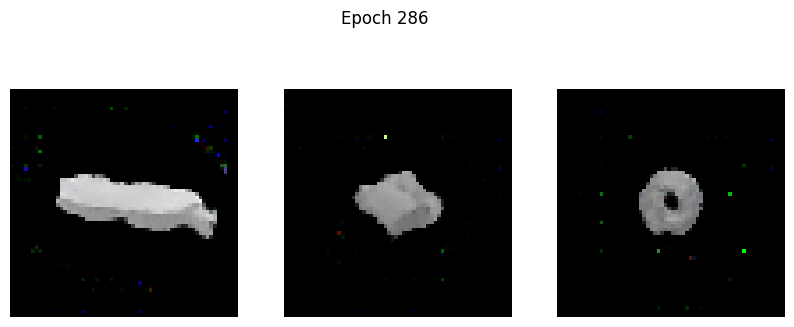

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0816 - g_loss: 4.0931
Epoch 287/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1013 - g_loss: 4.1050

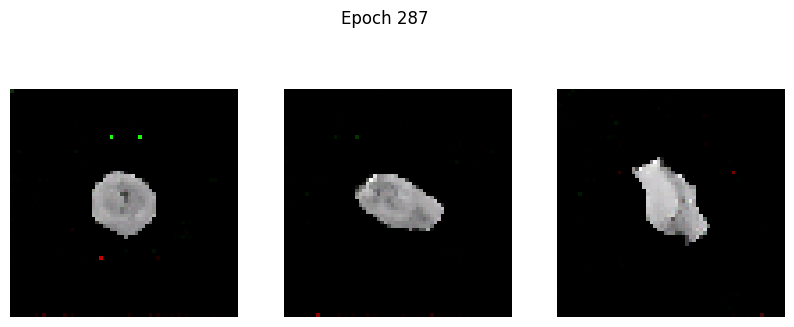

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1011 - g_loss: 4.1059
Epoch 288/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.3969 - g_loss: 4.9431

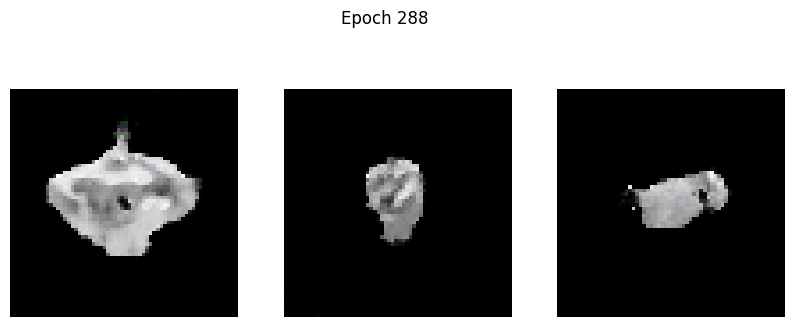

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.3972 - g_loss: 4.9420
Epoch 289/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0784 - g_loss: 4.0173

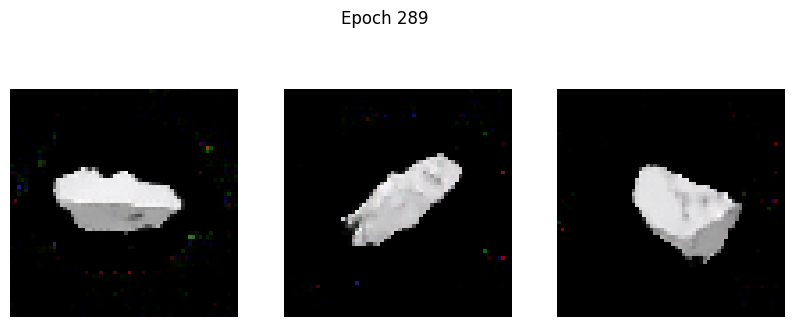

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0784 - g_loss: 4.0167
Epoch 290/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0688 - g_loss: 3.9972

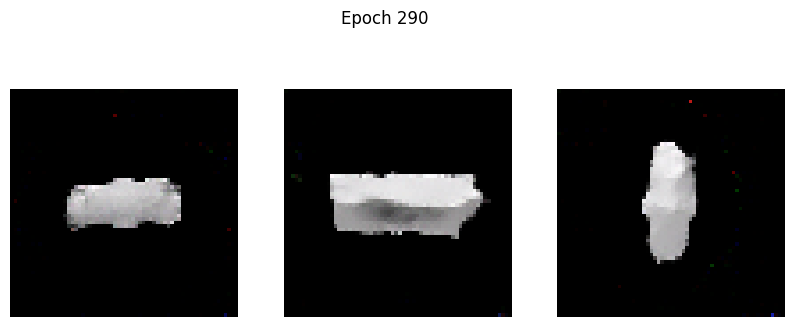

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0688 - g_loss: 3.9971
Epoch 291/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0578 - g_loss: 4.0751

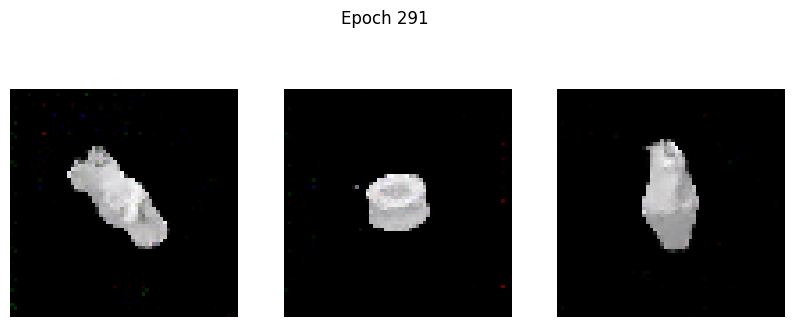

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0578 - g_loss: 4.0753
Epoch 292/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0539 - g_loss: 4.0924

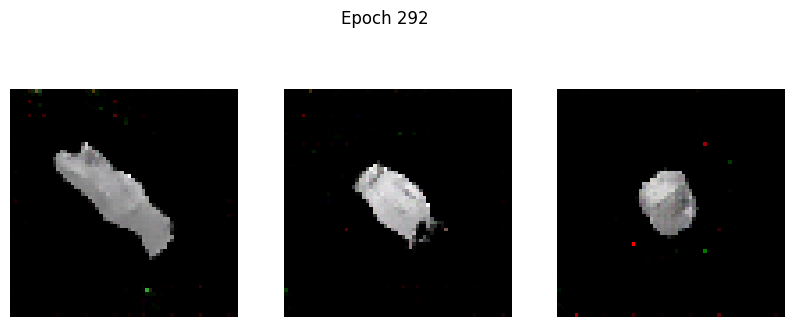

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0539 - g_loss: 4.0922
Epoch 293/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1051 - g_loss: 4.1551

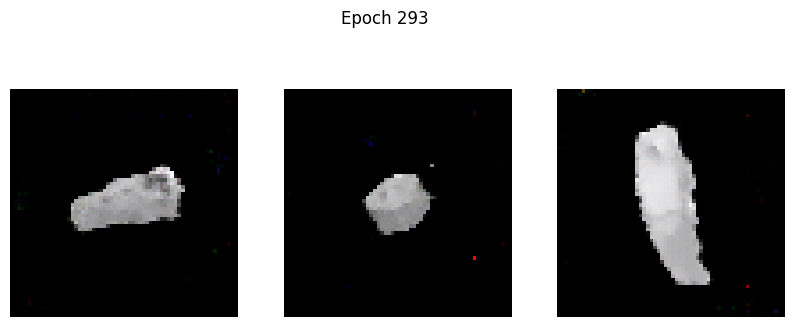

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1050 - g_loss: 4.1551
Epoch 294/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0755 - g_loss: 4.3039

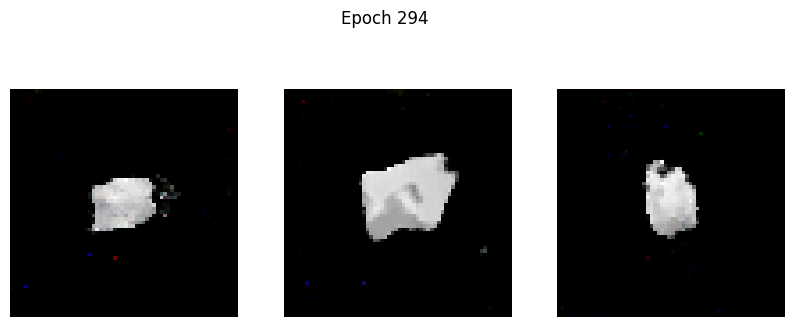

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0760 - g_loss: 4.3050
Epoch 295/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2620 - g_loss: 4.5323

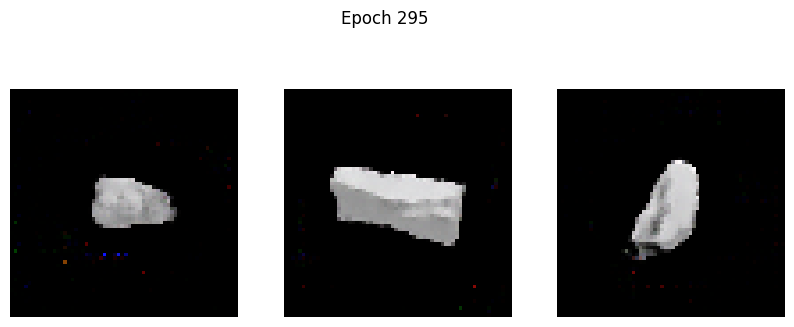

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2607 - g_loss: 4.5295
Epoch 296/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0570 - g_loss: 4.1165

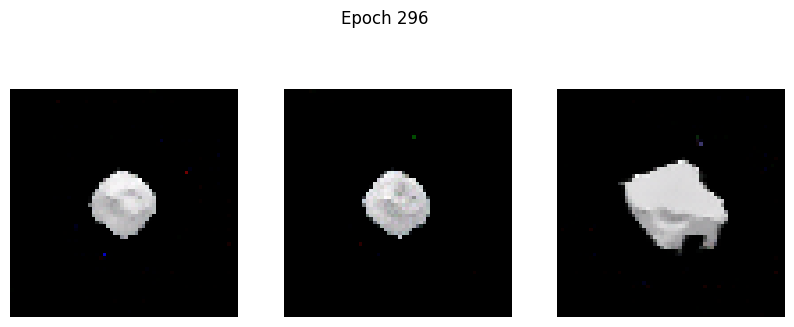

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0570 - g_loss: 4.1168
Epoch 297/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0505 - g_loss: 4.0557

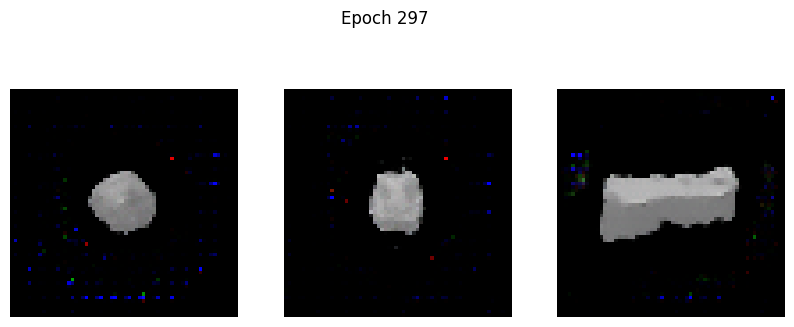

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0508 - g_loss: 4.0572
Epoch 298/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1010 - g_loss: 4.5208

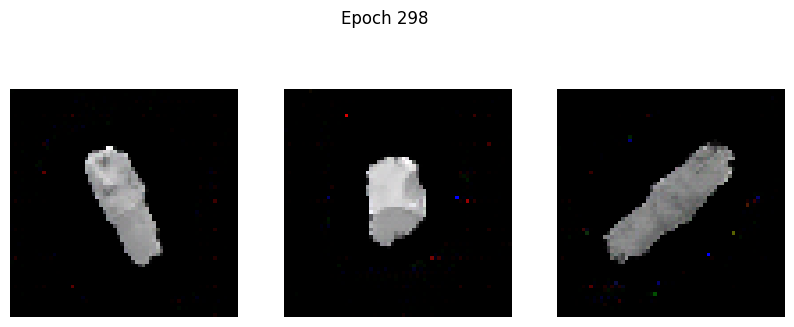

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1008 - g_loss: 4.5186
Epoch 299/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0944 - g_loss: 4.2840

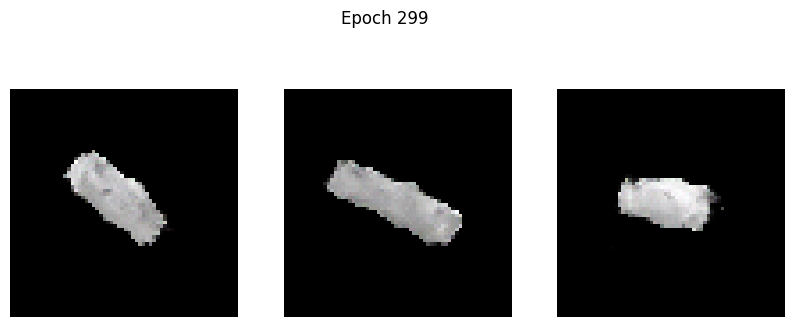

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0951 - g_loss: 4.2846
Epoch 300/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0796 - g_loss: 4.0402

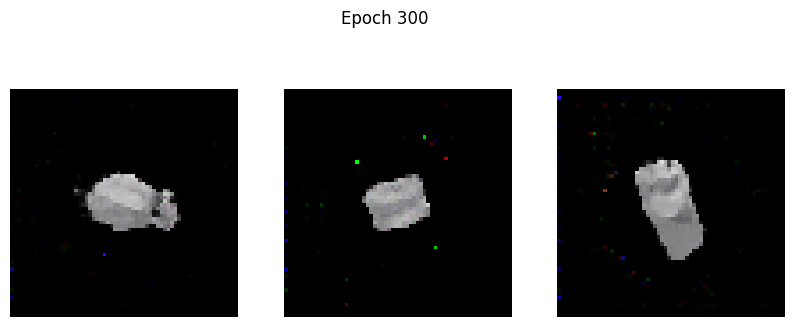

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0796 - g_loss: 4.0408
Epoch 301/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0601 - g_loss: 4.1990

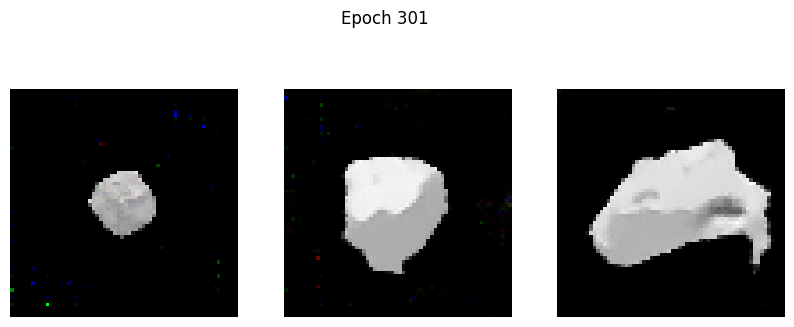

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0601 - g_loss: 4.1987
Epoch 302/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0869 - g_loss: 4.2485

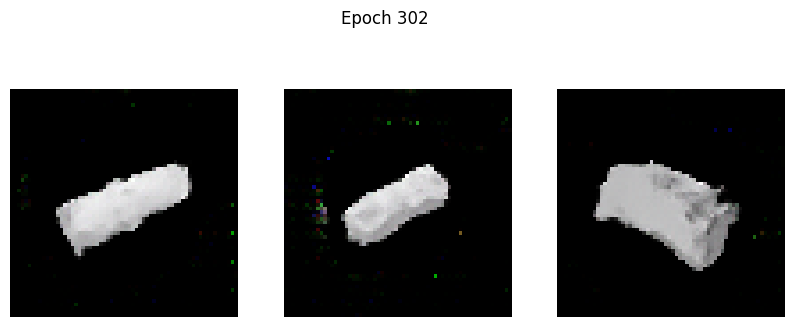

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0876 - g_loss: 4.2488
Epoch 303/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0688 - g_loss: 4.1141

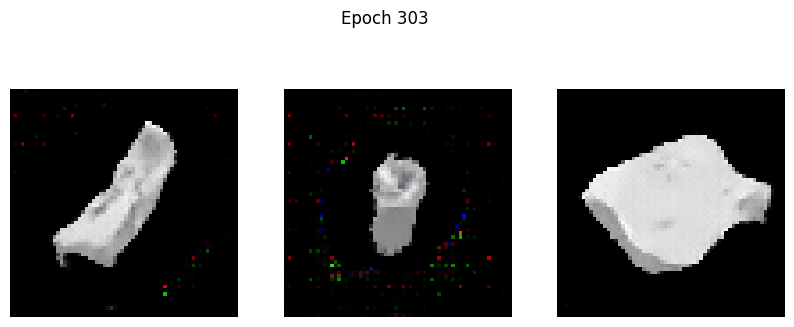

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0691 - g_loss: 4.1150
Epoch 304/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0741 - g_loss: 4.2034

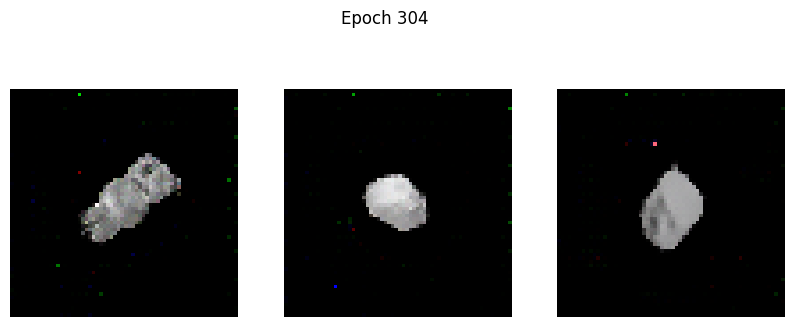

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0741 - g_loss: 4.2031
Epoch 305/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1759 - g_loss: 4.5218

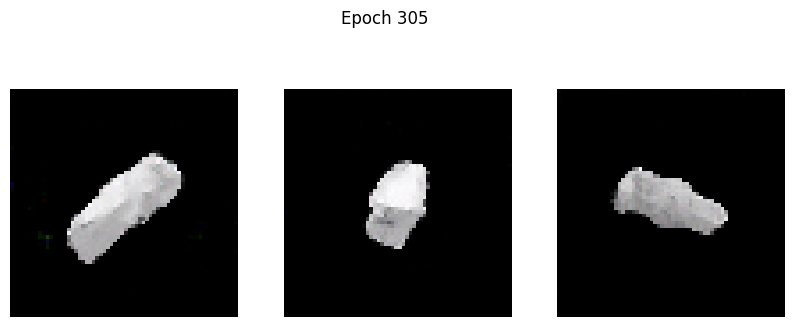

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1751 - g_loss: 4.5193
Epoch 306/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0470 - g_loss: 4.2354

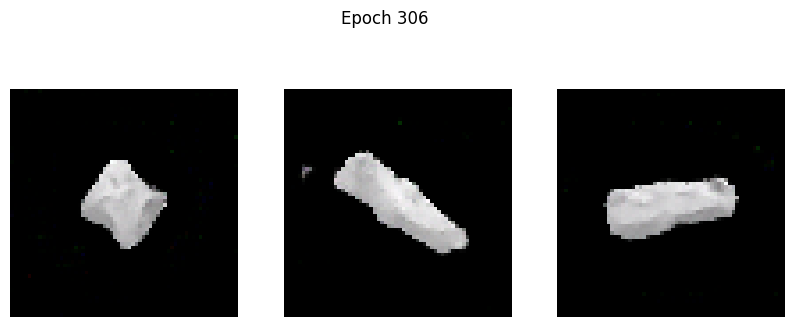

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0470 - g_loss: 4.2345
Epoch 307/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1381 - g_loss: 4.3702

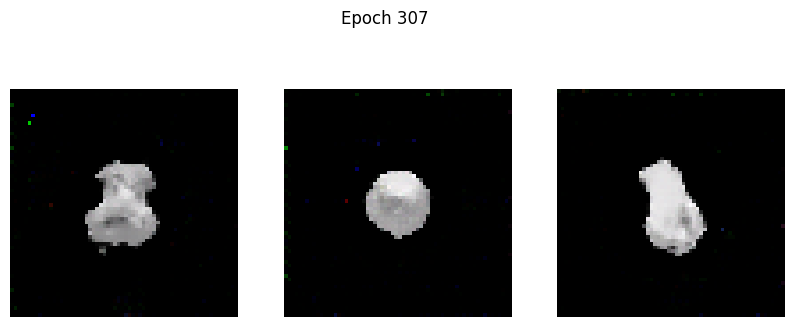

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1379 - g_loss: 4.3691
Epoch 308/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0706 - g_loss: 4.3351

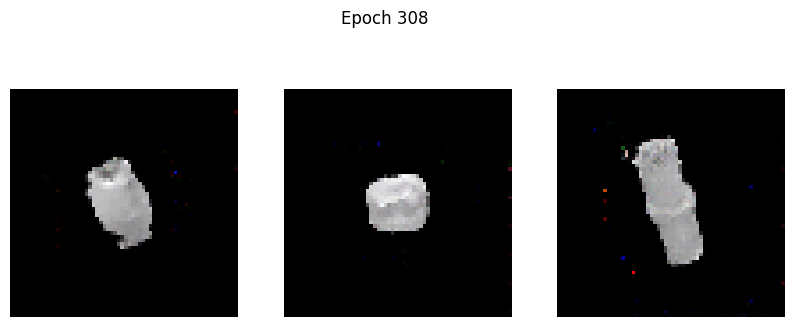

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0706 - g_loss: 4.3347
Epoch 309/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0572 - g_loss: 4.2276

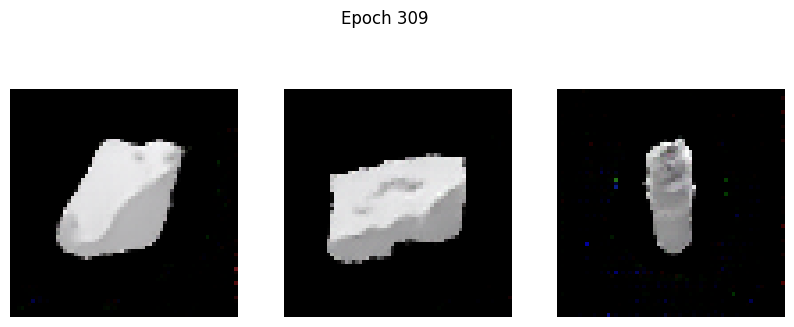

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0574 - g_loss: 4.2286
Epoch 310/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0586 - g_loss: 4.2555

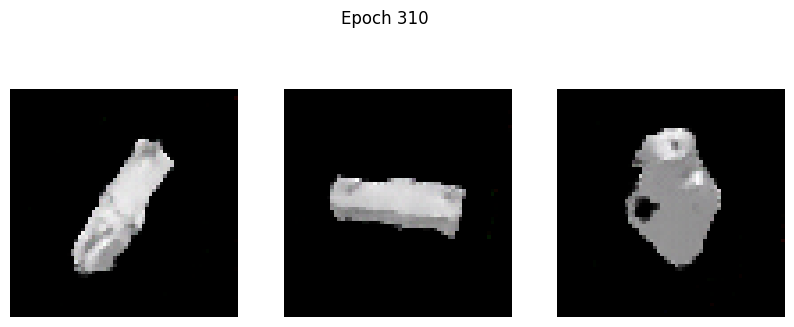

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0587 - g_loss: 4.2567
Epoch 311/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2067 - g_loss: 4.5808

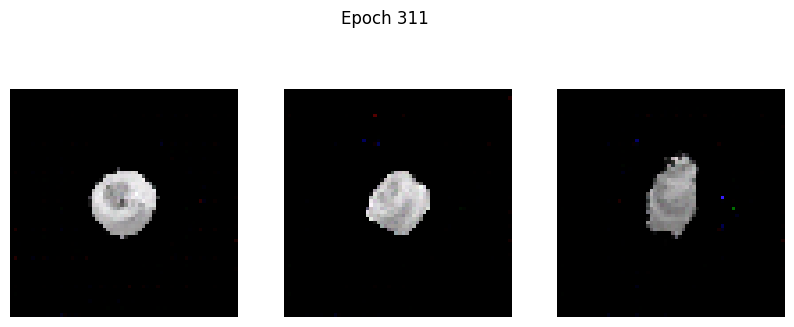

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2058 - g_loss: 4.5789
Epoch 312/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0550 - g_loss: 4.2558

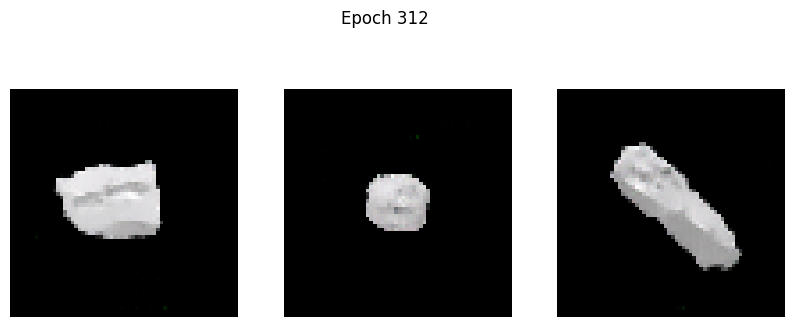

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0552 - g_loss: 4.2565
Epoch 313/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0875 - g_loss: 4.3278

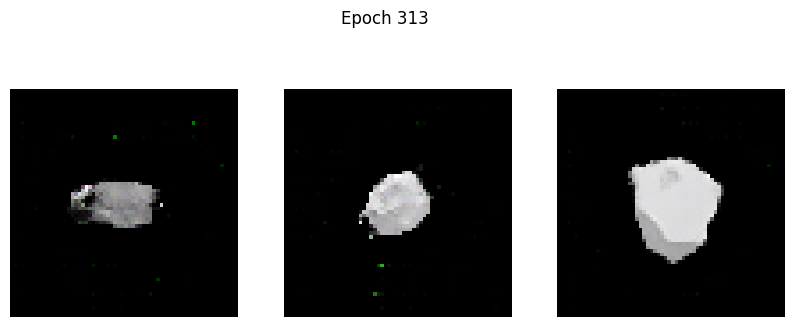

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0875 - g_loss: 4.3277
Epoch 314/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0922 - g_loss: 4.5114

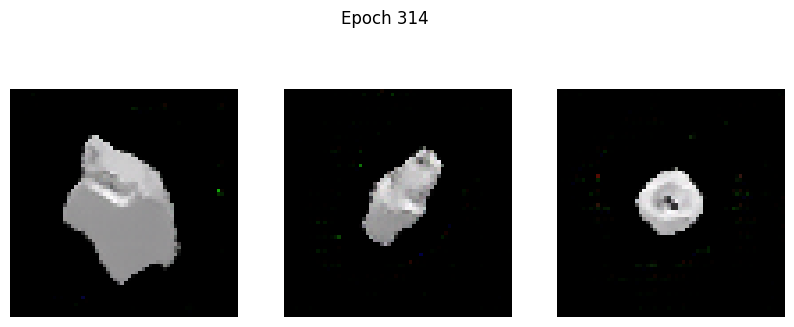

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0924 - g_loss: 4.5101
Epoch 315/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0520 - g_loss: 4.2427

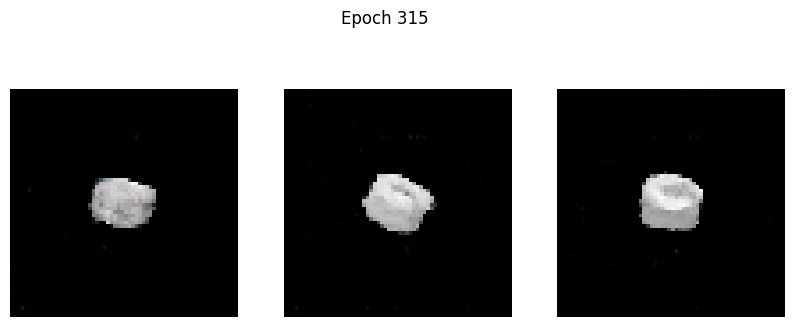

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0522 - g_loss: 4.2437
Epoch 316/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0471 - g_loss: 4.2818

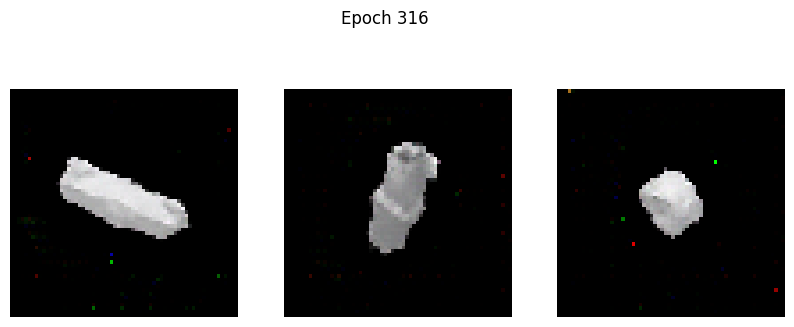

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0471 - g_loss: 4.2819
Epoch 317/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0381 - g_loss: 4.3702

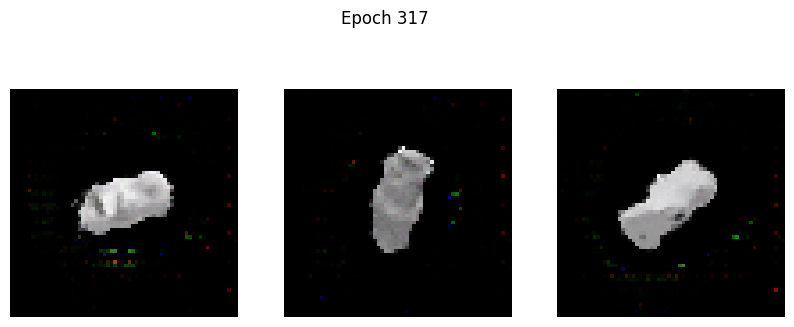

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0385 - g_loss: 4.3715
Epoch 318/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0877 - g_loss: 4.4203

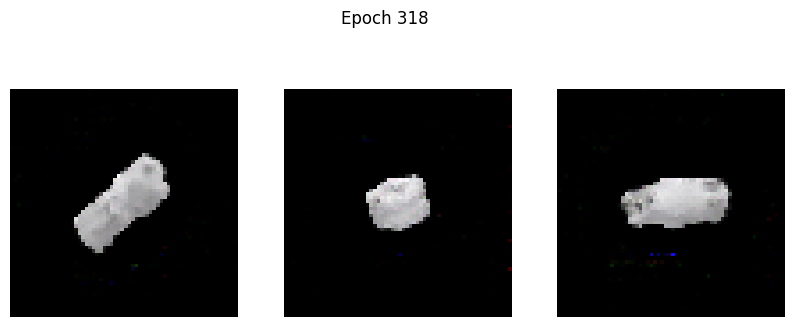

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0876 - g_loss: 4.4203
Epoch 319/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0950 - g_loss: 4.5154

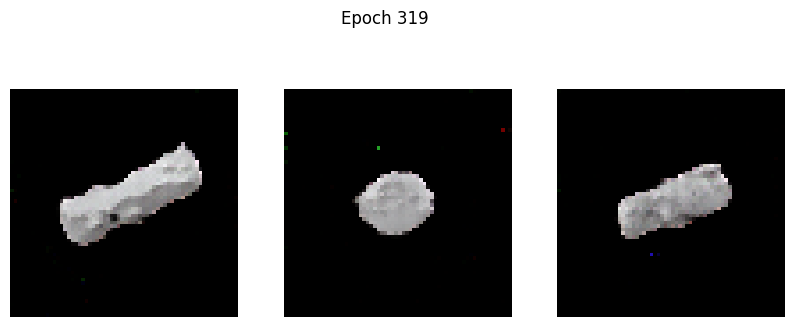

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0971 - g_loss: 4.5189
Epoch 320/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2742 - g_loss: 4.3761

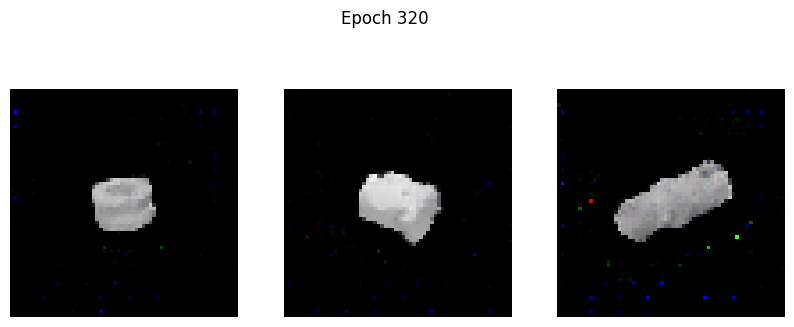

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2729 - g_loss: 4.3740
Epoch 321/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0443 - g_loss: 4.1973

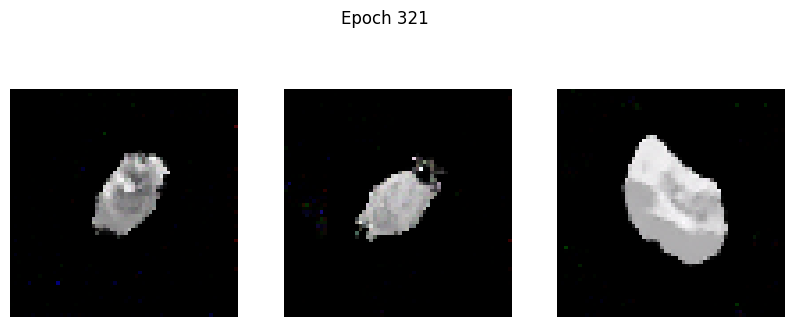

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0443 - g_loss: 4.1966
Epoch 322/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0495 - g_loss: 4.1947

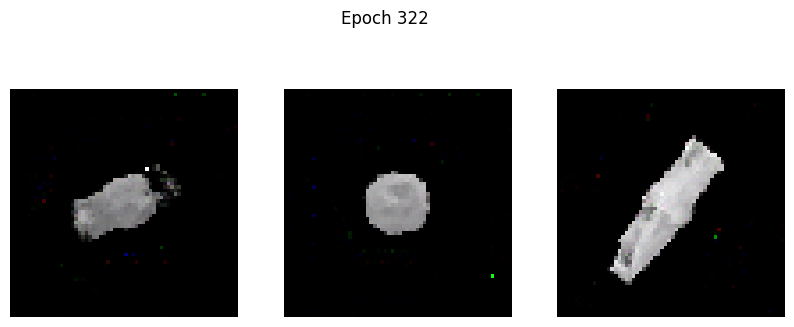

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0495 - g_loss: 4.1946
Epoch 323/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0659 - g_loss: 4.3800

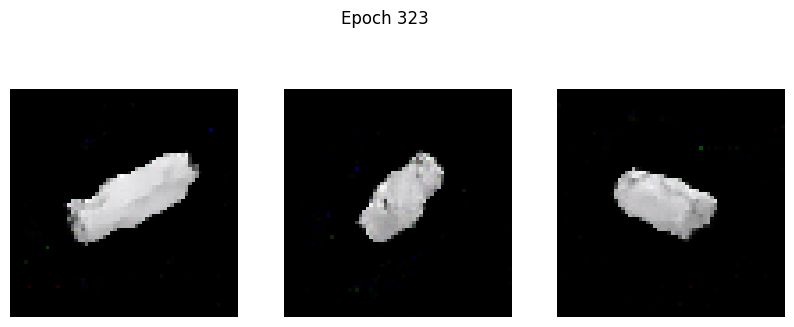

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0661 - g_loss: 4.3800
Epoch 324/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0496 - g_loss: 4.2031

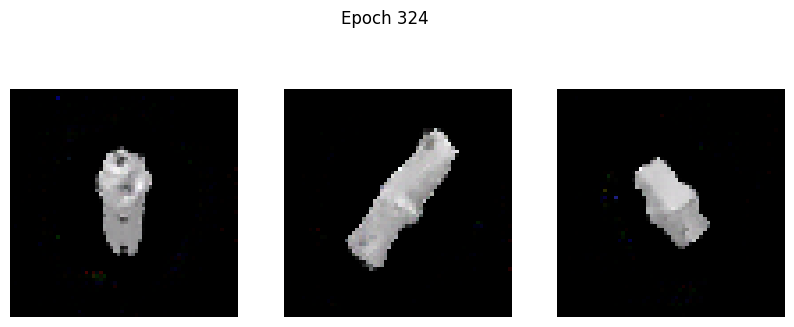

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: 0.0495 - g_loss: 4.2031
Epoch 325/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0328 - g_loss: 4.2095

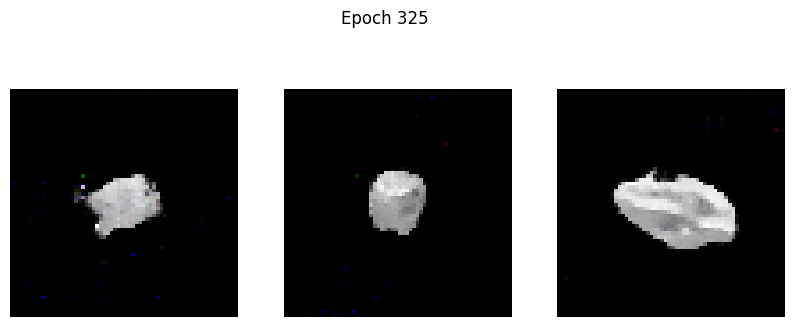

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0328 - g_loss: 4.2099
Epoch 326/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0838 - g_loss: 4.6605

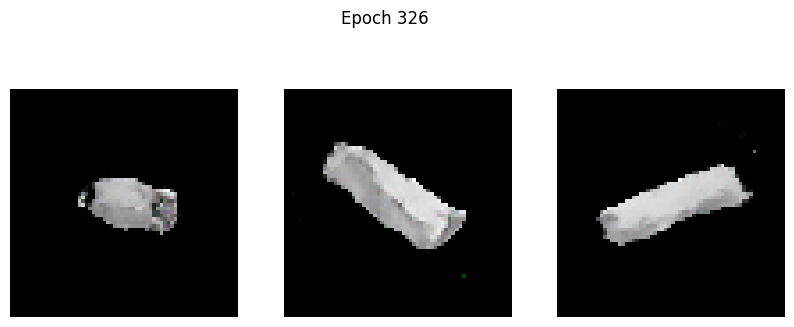

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0838 - g_loss: 4.6599
Epoch 327/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1287 - g_loss: 4.6729

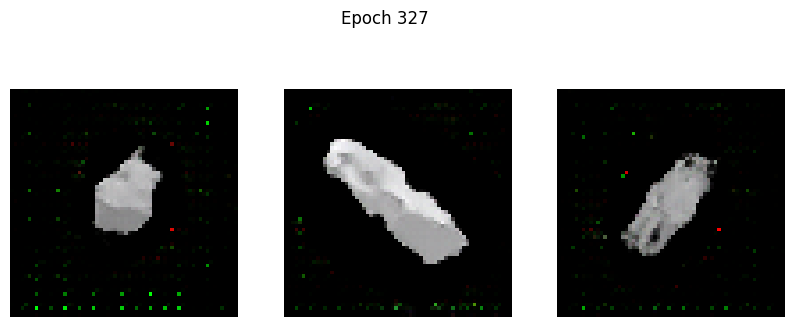

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1295 - g_loss: 4.6754
Epoch 328/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0469 - g_loss: 4.1865

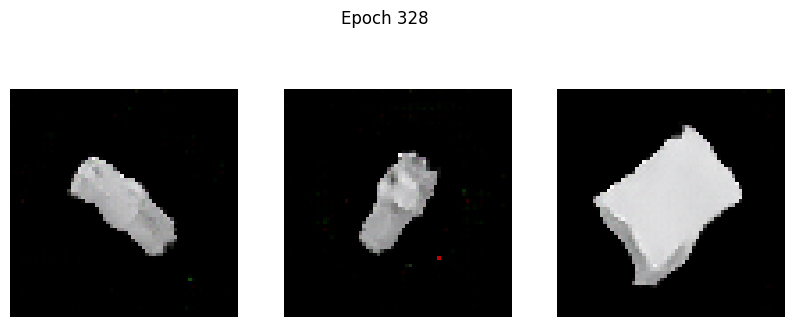

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0469 - g_loss: 4.1868
Epoch 329/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0416 - g_loss: 4.4330

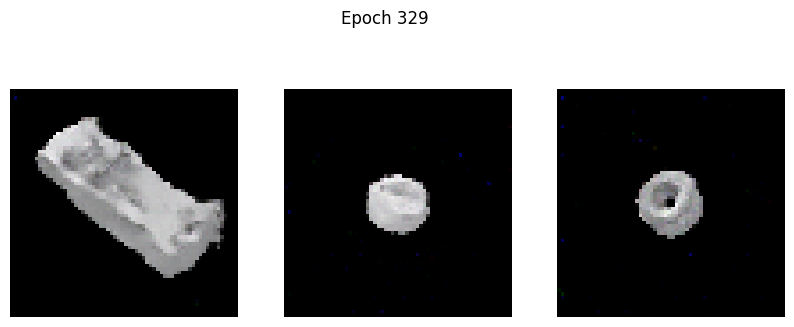

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0416 - g_loss: 4.4327
Epoch 330/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0610 - g_loss: 4.3417

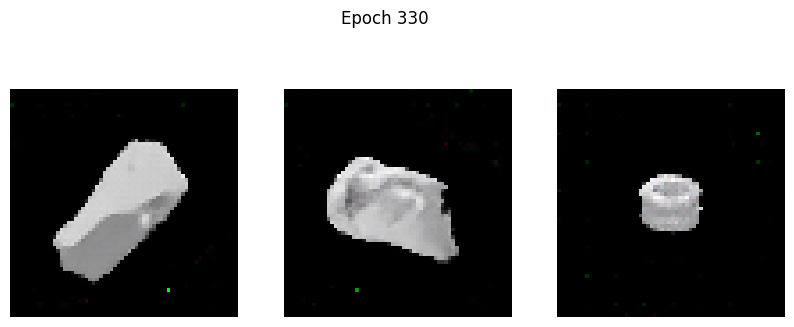

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0610 - g_loss: 4.3421
Epoch 331/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0539 - g_loss: 4.5042

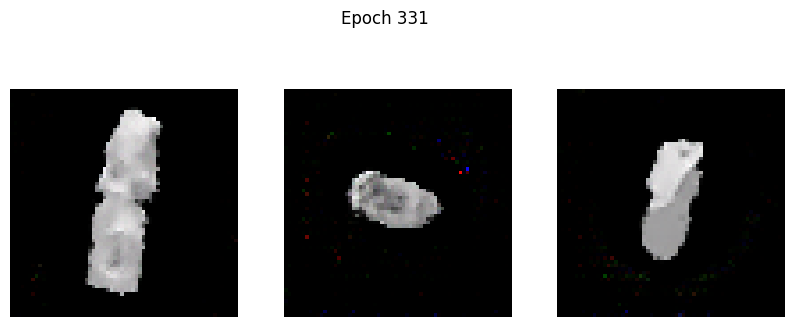

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0540 - g_loss: 4.5039
Epoch 332/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3097 - g_loss: 5.2167

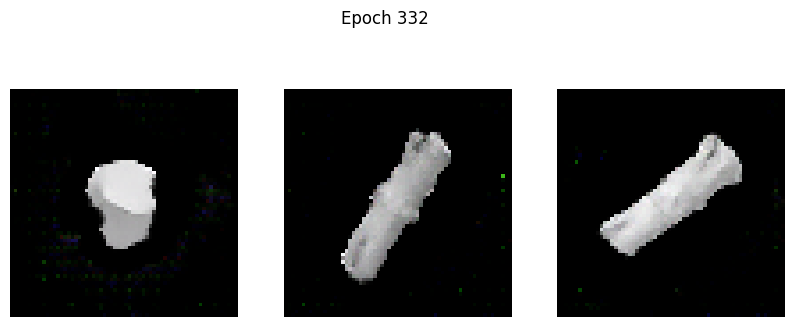

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3085 - g_loss: 5.2120
Epoch 333/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0517 - g_loss: 4.3021

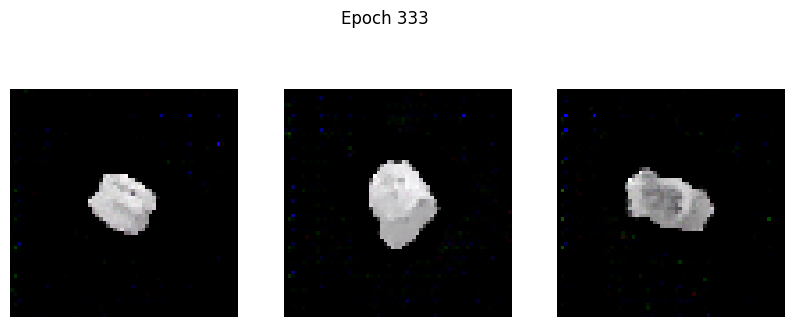

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0517 - g_loss: 4.3021
Epoch 334/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0312 - g_loss: 4.4310

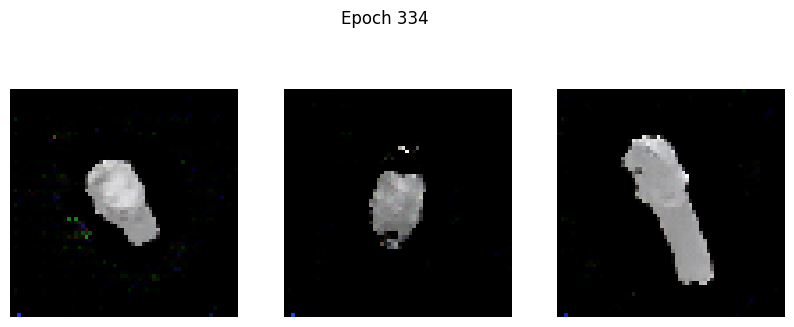

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0313 - g_loss: 4.4321
Epoch 335/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0657 - g_loss: 4.5860

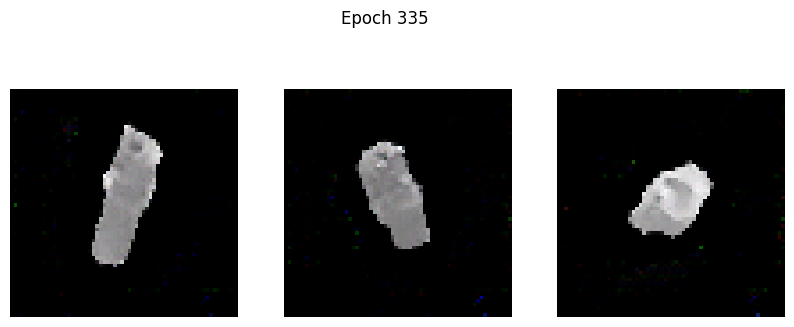

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0656 - g_loss: 4.5853
Epoch 336/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0821 - g_loss: 4.5802

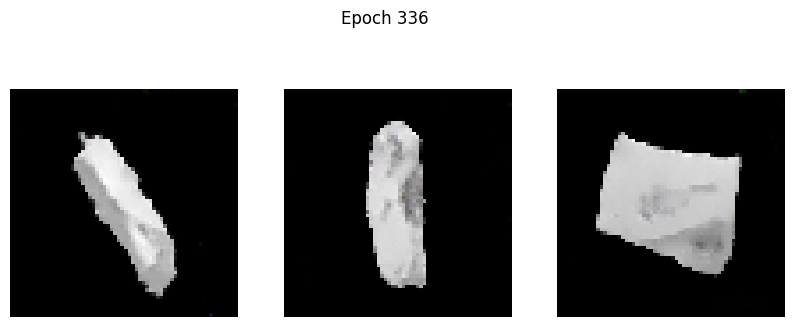

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0825 - g_loss: 4.5813
Epoch 337/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0516 - g_loss: 4.4791

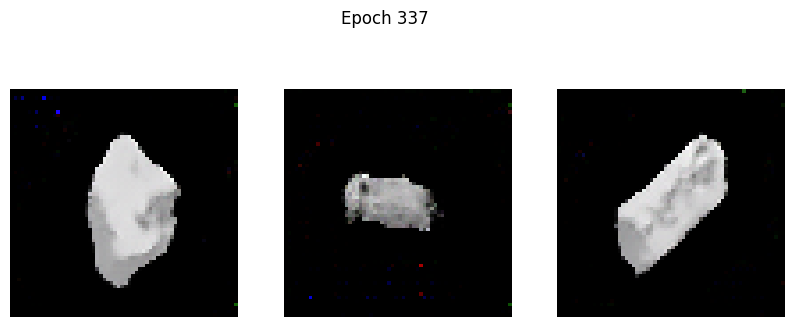

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0518 - g_loss: 4.4797
Epoch 338/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0860 - g_loss: 4.5570

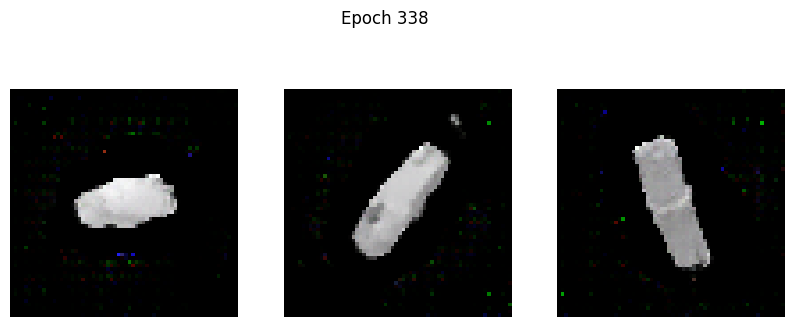

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0863 - g_loss: 4.5586
Epoch 339/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0267 - g_loss: 4.4661

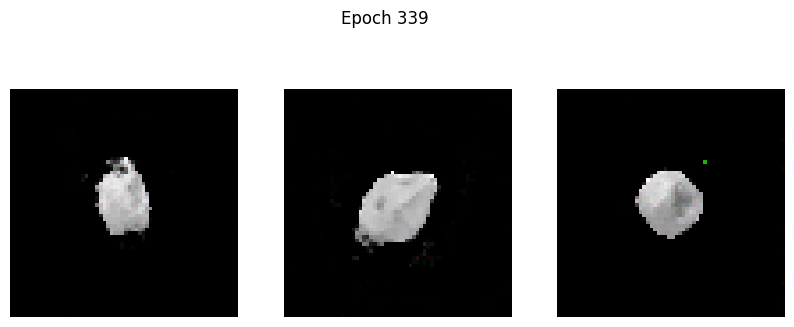

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0268 - g_loss: 4.4655
Epoch 340/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0378 - g_loss: 4.5531

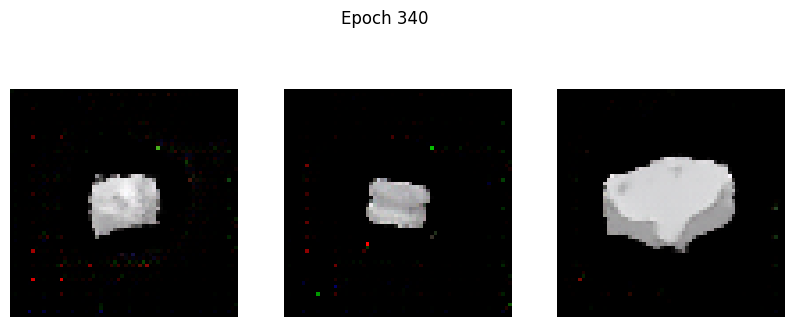

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0379 - g_loss: 4.5536
Epoch 341/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1005 - g_loss: 4.8766

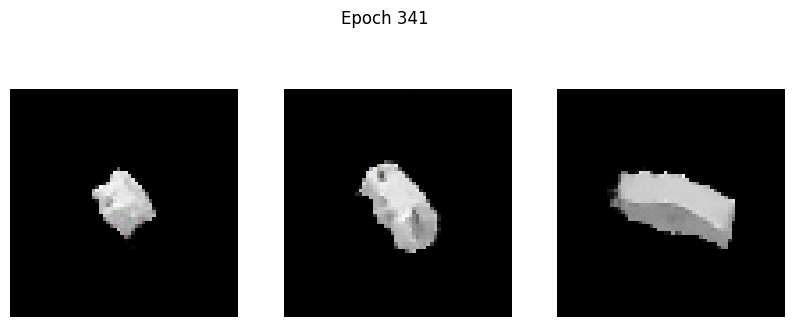

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1007 - g_loss: 4.8776
Epoch 342/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0375 - g_loss: 4.5083

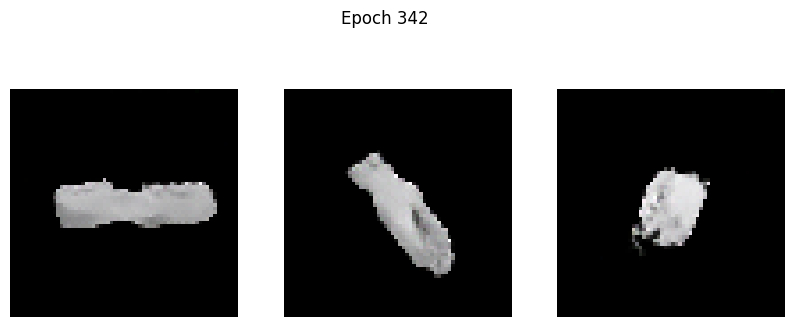

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0374 - g_loss: 4.5079
Epoch 343/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0351 - g_loss: 4.5319

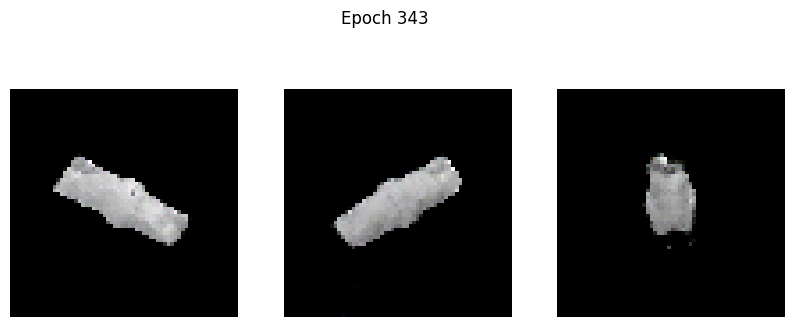

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0351 - g_loss: 4.5327
Epoch 344/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0349 - g_loss: 4.4902

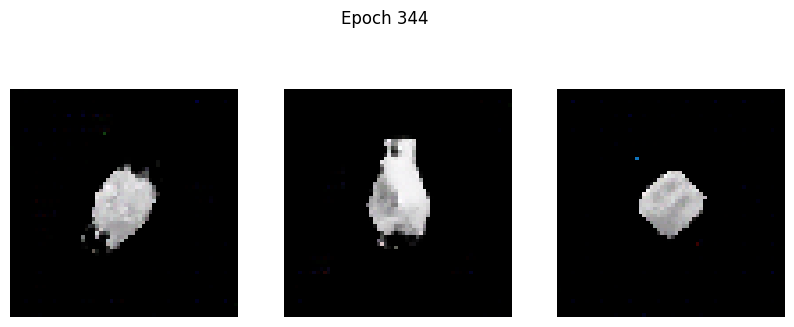

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0350 - g_loss: 4.4907
Epoch 345/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0476 - g_loss: 4.7505

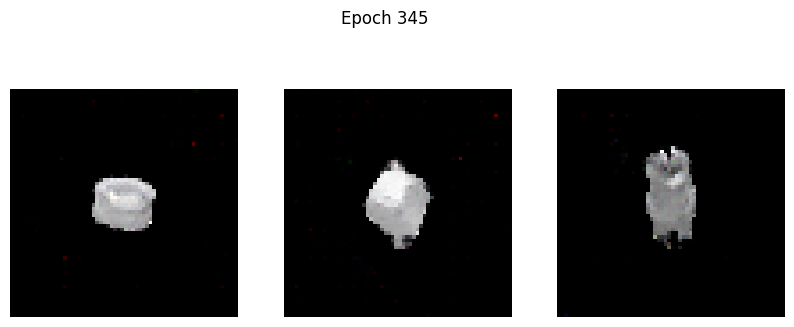

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0475 - g_loss: 4.7498
Epoch 346/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0635 - g_loss: 4.6942

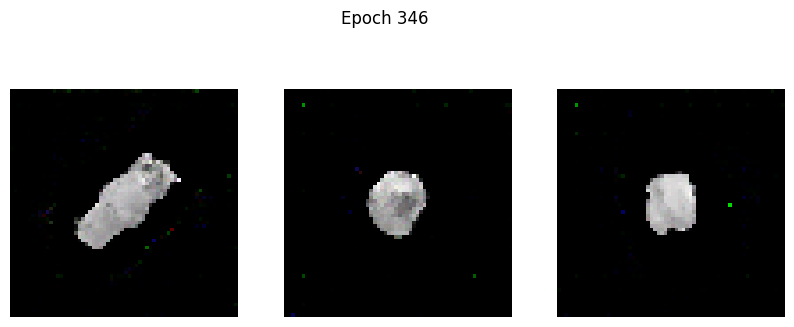

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0642 - g_loss: 4.6960
Epoch 347/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0363 - g_loss: 4.5428

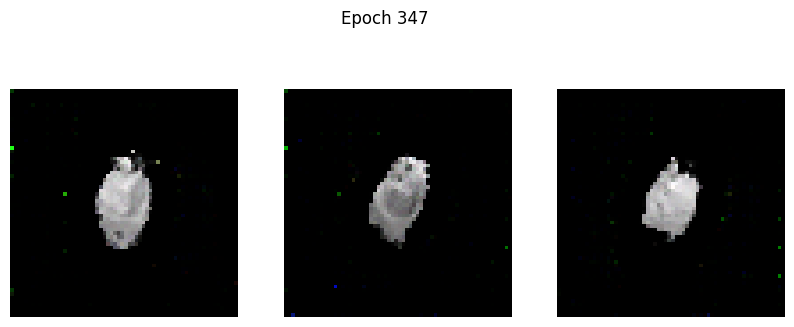

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0366 - g_loss: 4.5439
Epoch 348/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.1078 - g_loss: 4.9479

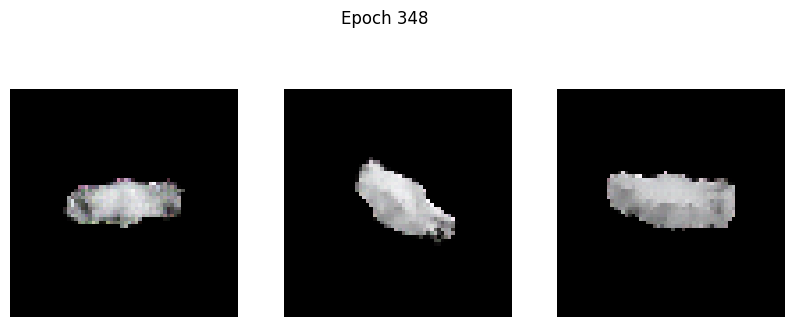

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1087 - g_loss: 4.9549
Epoch 349/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0095 - g_loss: 4.7597

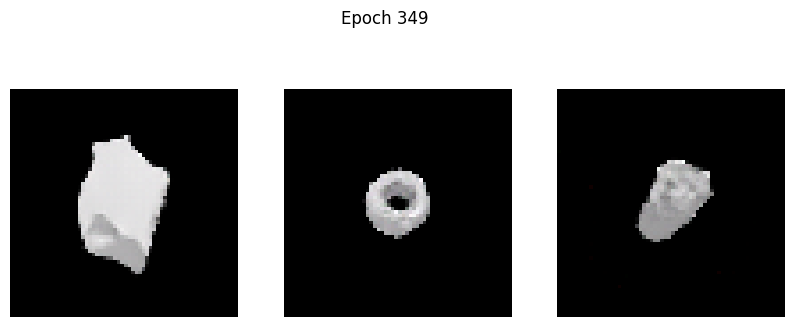

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0095 - g_loss: 4.7587
Epoch 350/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0398 - g_loss: 4.5901

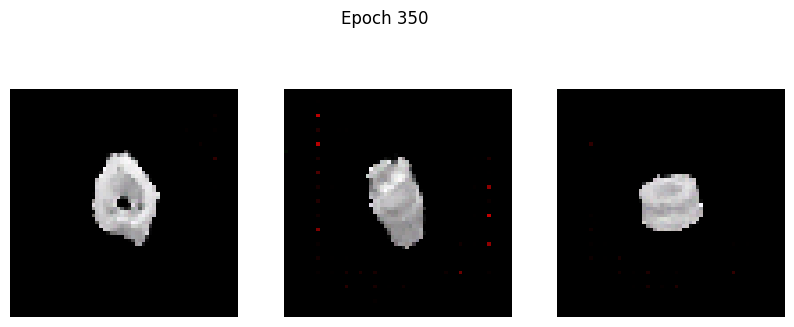

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0399 - g_loss: 4.5901
Epoch 351/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0158 - g_loss: 4.6252

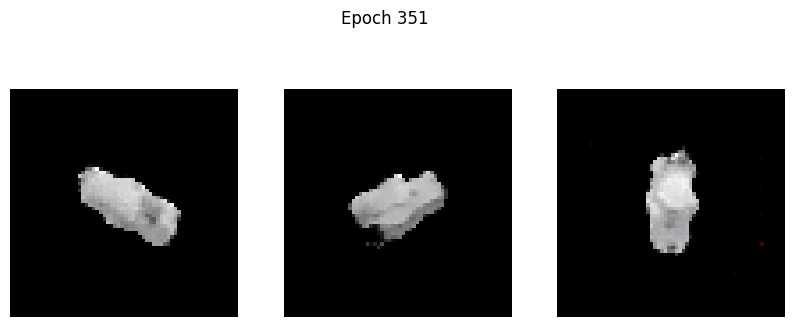

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0158 - g_loss: 4.6245
Epoch 352/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0474 - g_loss: 4.7887

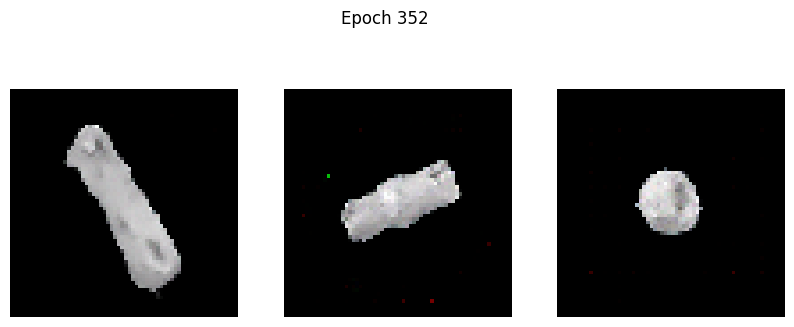

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0476 - g_loss: 4.7896
Epoch 353/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0150 - g_loss: 4.5618

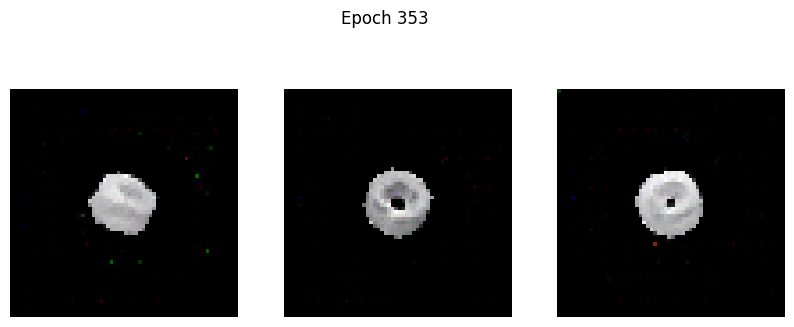

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0152 - g_loss: 4.5627
Epoch 354/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0534 - g_loss: 4.6816

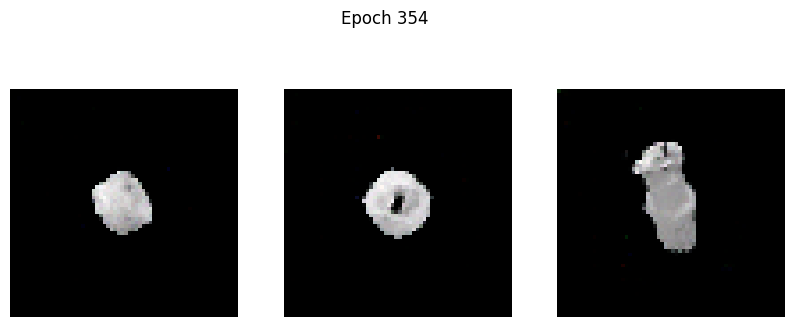

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0539 - g_loss: 4.6836
Epoch 355/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0121 - g_loss: 4.4793

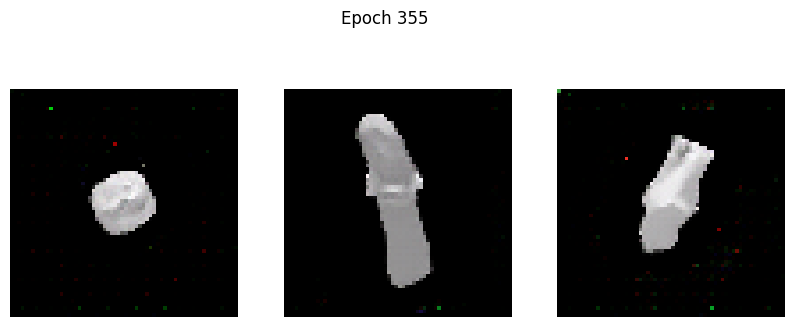

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0122 - g_loss: 4.4805
Epoch 356/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0832 - g_loss: 4.8770

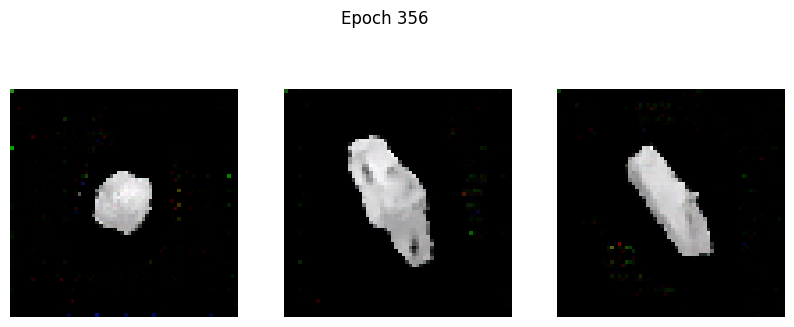

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0829 - g_loss: 4.8754
Epoch 357/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0373 - g_loss: 4.6027

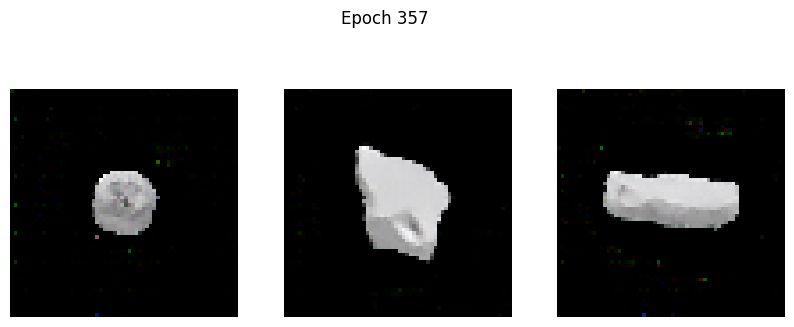

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0375 - g_loss: 4.6041
Epoch 358/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0428 - g_loss: 4.7477

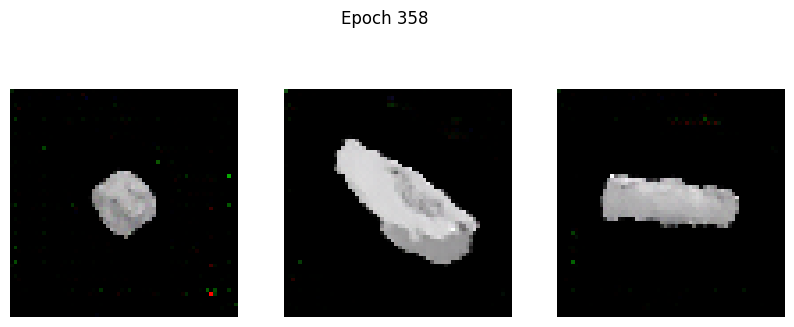

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0428 - g_loss: 4.7483
Epoch 359/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0555 - g_loss: 4.7291

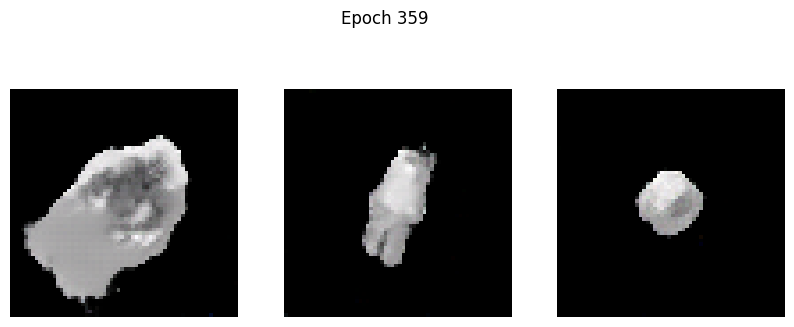

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0556 - g_loss: 4.7287
Epoch 360/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0752 - g_loss: 4.7363

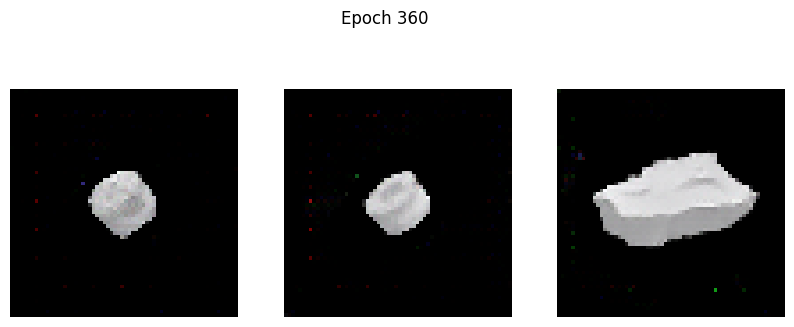

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0757 - g_loss: 4.7381
Epoch 361/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0488 - g_loss: 4.8026

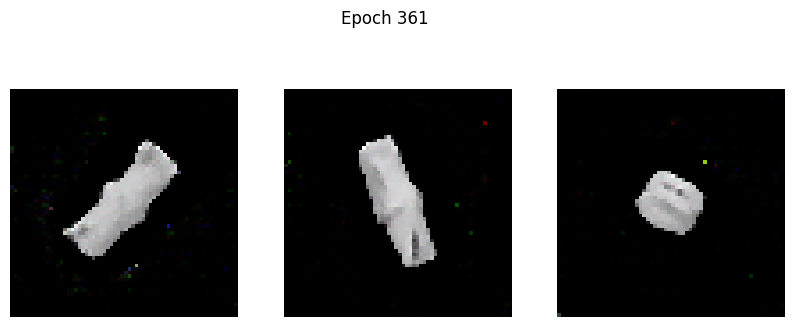

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0487 - g_loss: 4.8026
Epoch 362/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0231 - g_loss: 4.6637

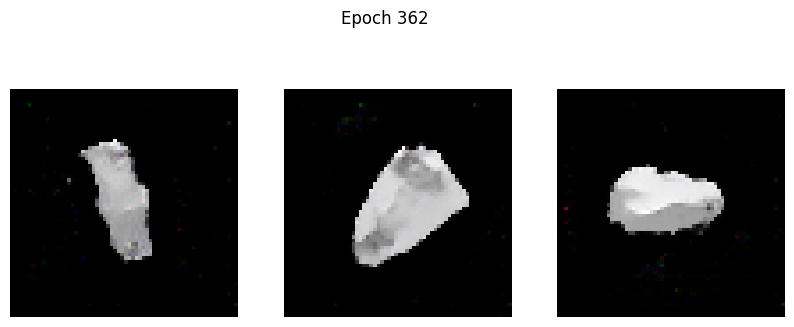

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0231 - g_loss: 4.6641
Epoch 363/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0247 - g_loss: 4.7544

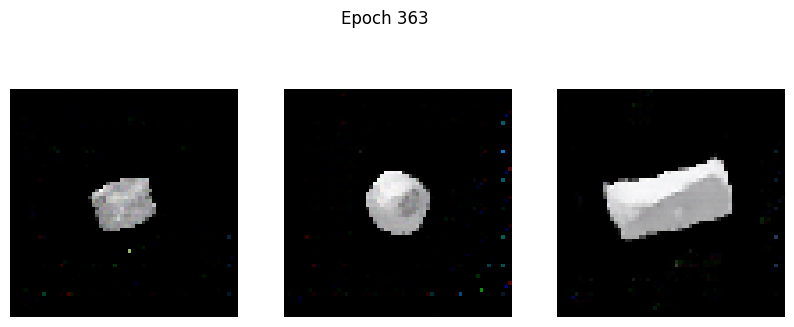

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0248 - g_loss: 4.7555
Epoch 364/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0441 - g_loss: 4.9316

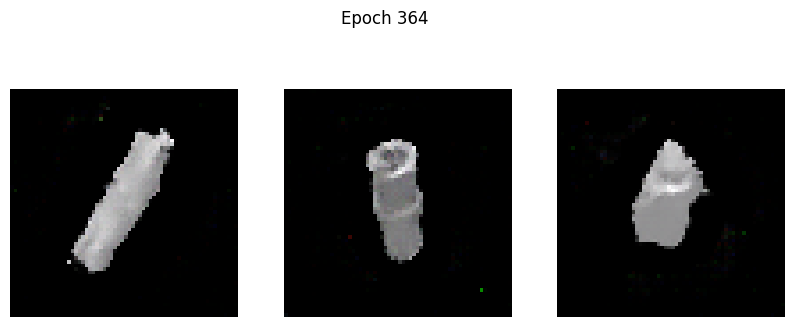

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0441 - g_loss: 4.9311
Epoch 365/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0474 - g_loss: 4.8468

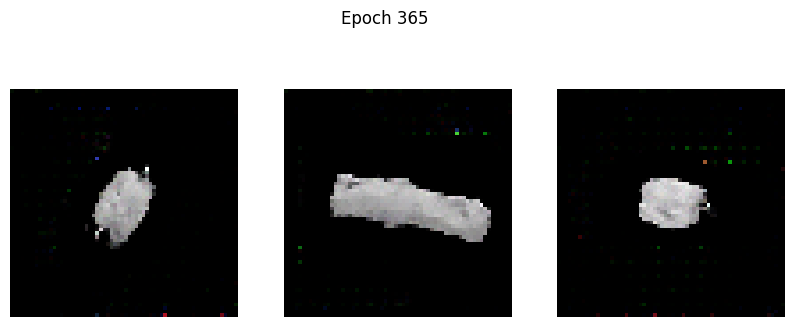

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0476 - g_loss: 4.8470
Epoch 366/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0755 - g_loss: 4.8491

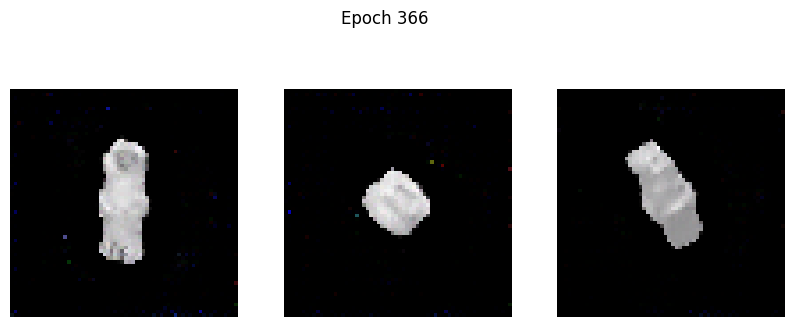

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0754 - g_loss: 4.8497
Epoch 367/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0376 - g_loss: 4.8648

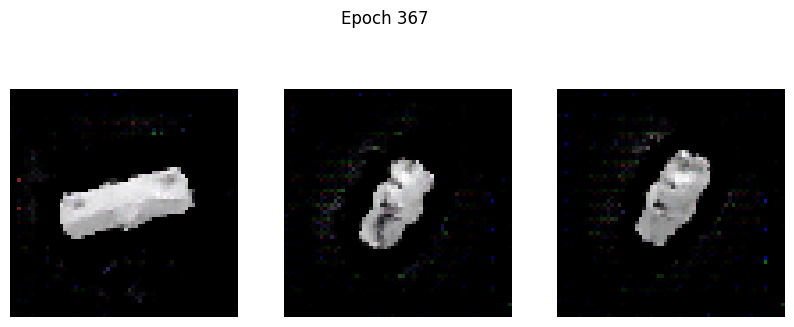

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0378 - g_loss: 4.8655
Epoch 368/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0695 - g_loss: 5.0181

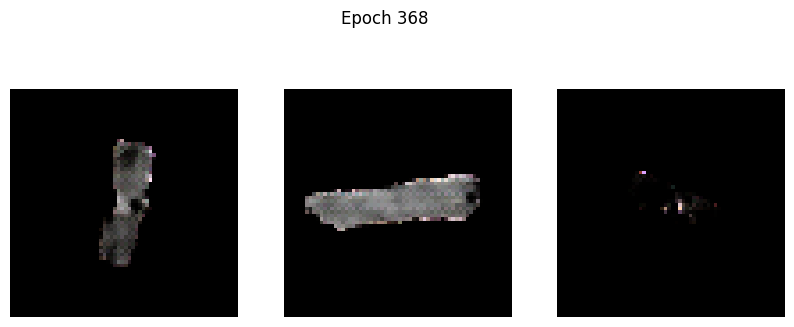

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0714 - g_loss: 5.0241
Epoch 369/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.0247 - g_loss: 5.6307

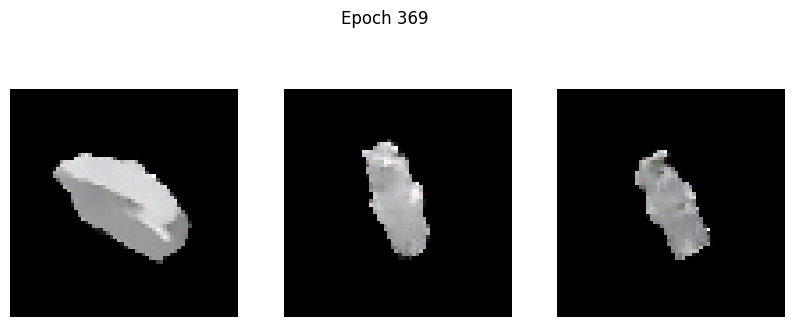

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.0245 - g_loss: 5.6263
Epoch 370/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0134 - g_loss: 4.7627

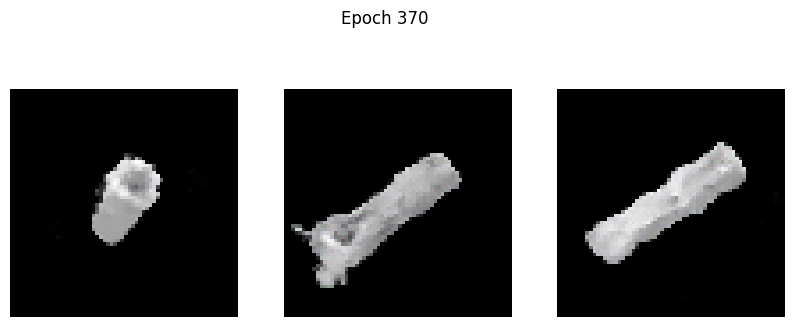

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0133 - g_loss: 4.7629
Epoch 371/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0168 - g_loss: 4.7177

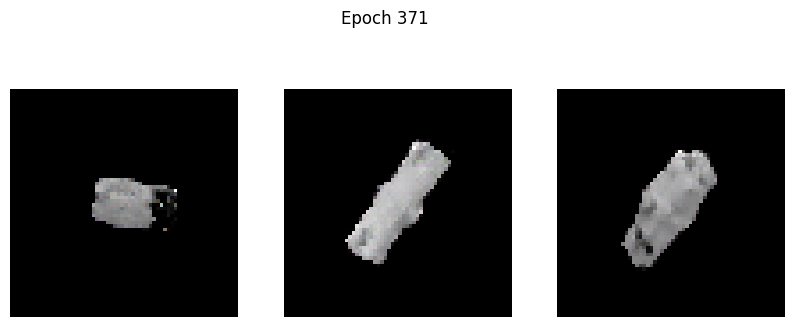

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0170 - g_loss: 4.7187
Epoch 372/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0075 - g_loss: 4.7156

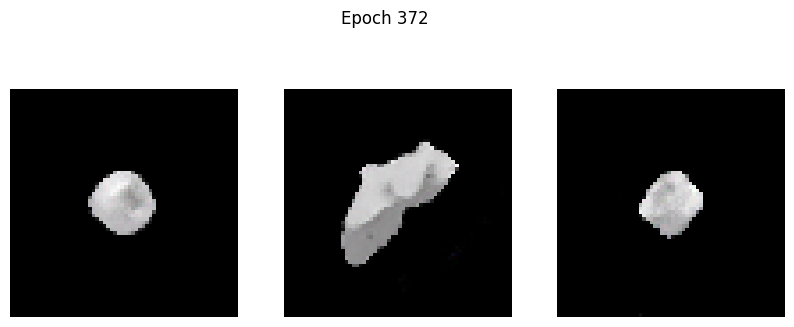

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0074 - g_loss: 4.7151
Epoch 373/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0075 - g_loss: 4.6186

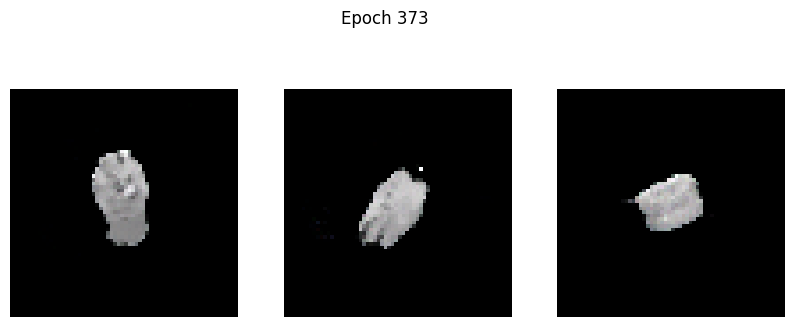

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0077 - g_loss: 4.6207
Epoch 374/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0392 - g_loss: 4.9440

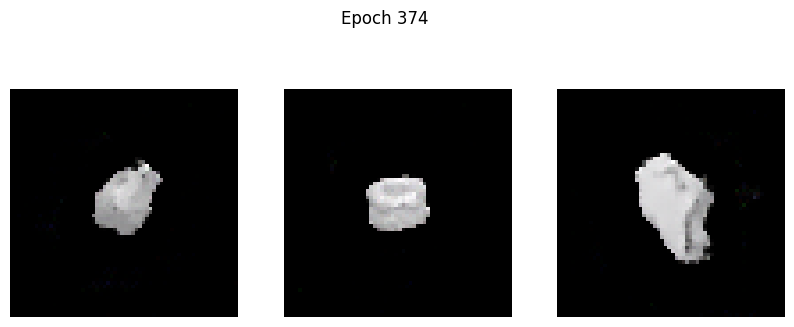

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0392 - g_loss: 4.9445
Epoch 375/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1162 - g_loss: 5.1117

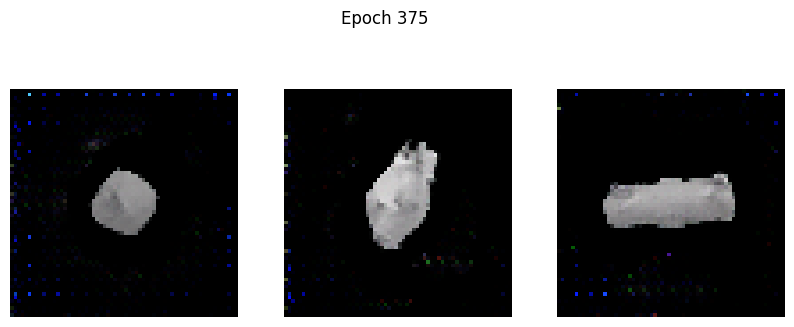

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1162 - g_loss: 5.1117
Epoch 376/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0353 - g_loss: 5.0082

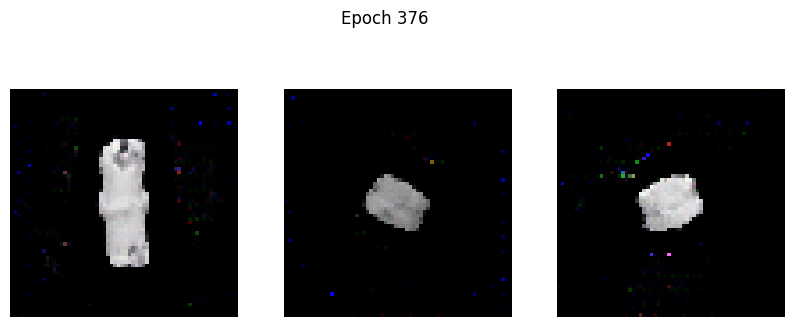

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0352 - g_loss: 5.0070
Epoch 377/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0098 - g_loss: 4.9253

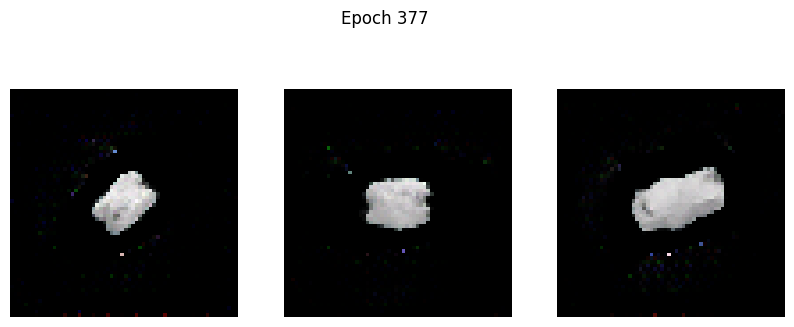

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0100 - g_loss: 4.9261
Epoch 378/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1183 - g_loss: 5.3244

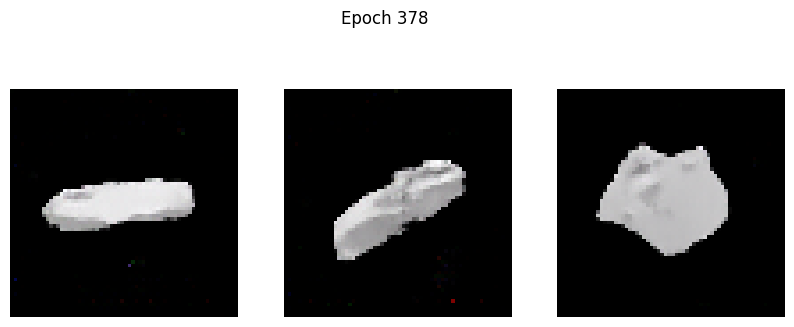

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1178 - g_loss: 5.3221
Epoch 379/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 9.6629e-04 - g_loss: 4.8433

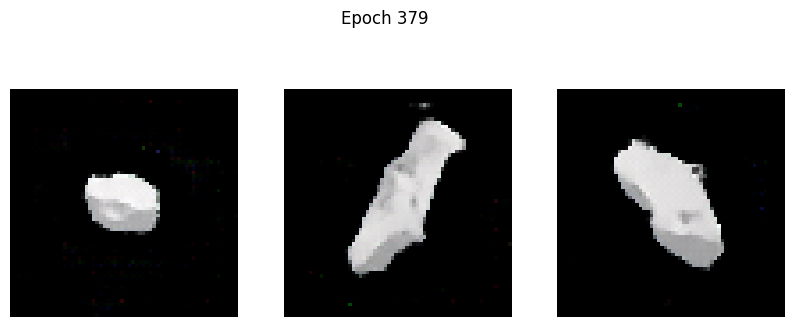

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0011 - g_loss: 4.8427   
Epoch 380/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1330 - g_loss: 5.0056

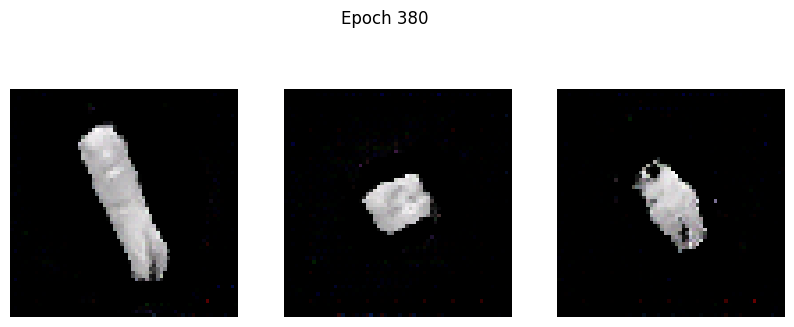

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1328 - g_loss: 5.0062
Epoch 381/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0183 - g_loss: 4.7861

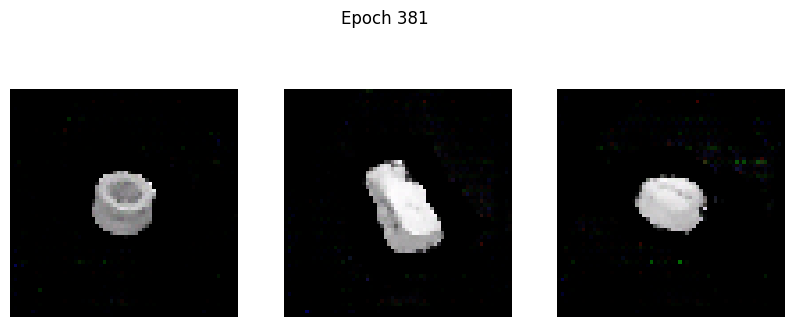

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0183 - g_loss: 4.7873
Epoch 382/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0648 - g_loss: 5.0659

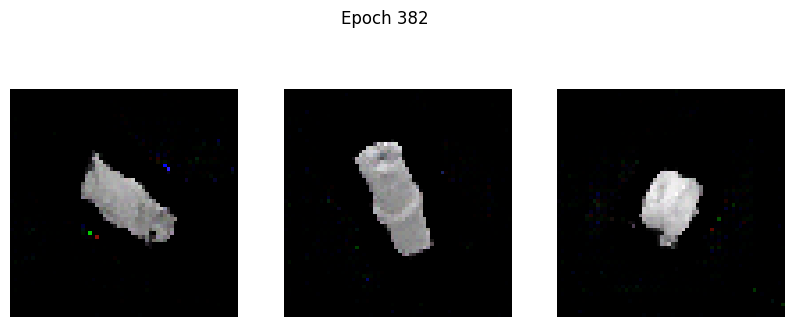

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0651 - g_loss: 5.0665
Epoch 383/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0321 - g_loss: 4.8839

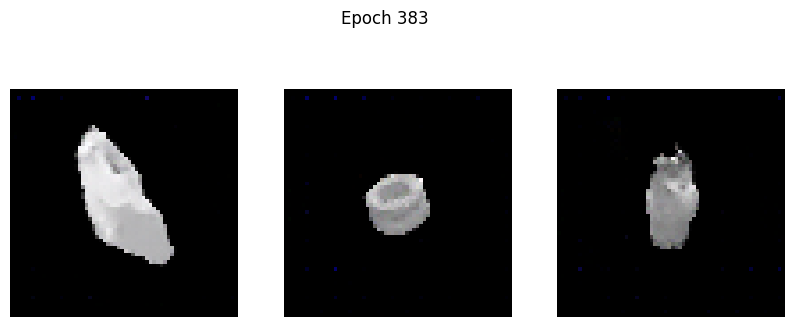

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0320 - g_loss: 4.8837
Epoch 384/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0383 - g_loss: 4.9639

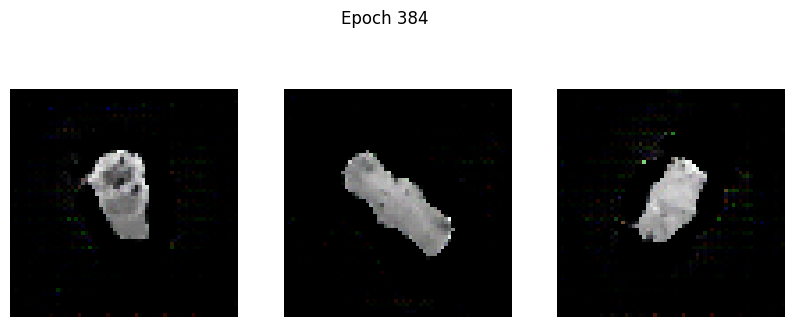

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0386 - g_loss: 4.9651
Epoch 385/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0501 - g_loss: 5.0703

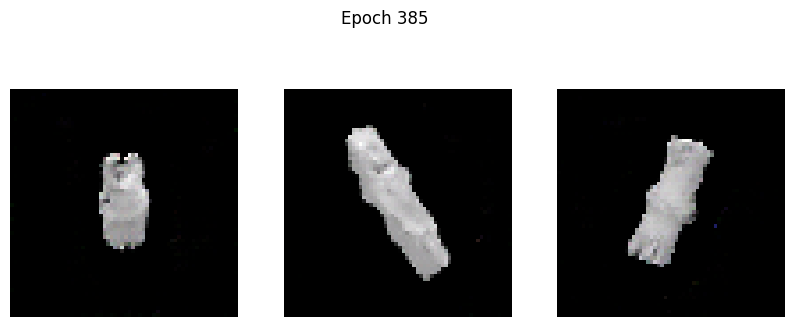

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0503 - g_loss: 5.0719
Epoch 386/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0314 - g_loss: 4.9926

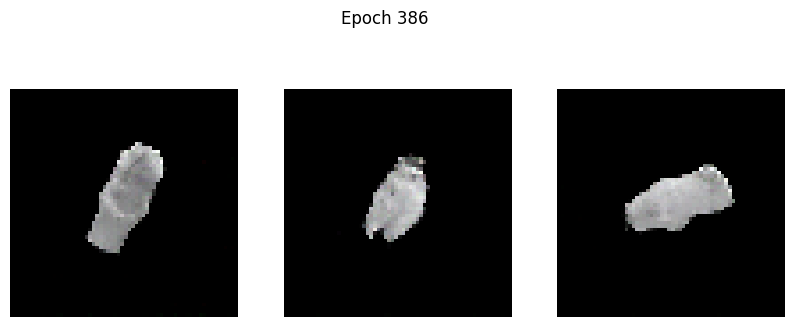

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0315 - g_loss: 4.9945
Epoch 387/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0581 - g_loss: 5.2094

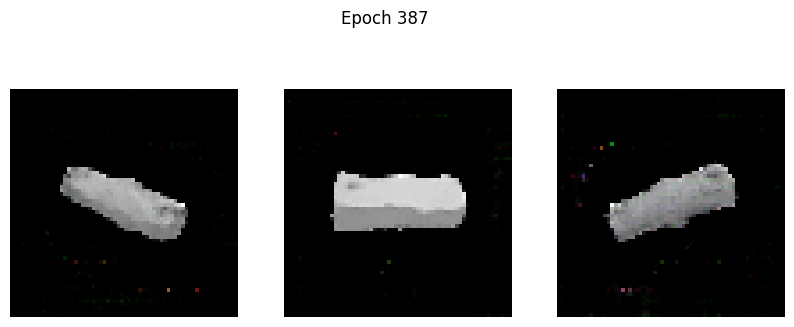

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0580 - g_loss: 5.2083
Epoch 388/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0365 - g_loss: 4.9830

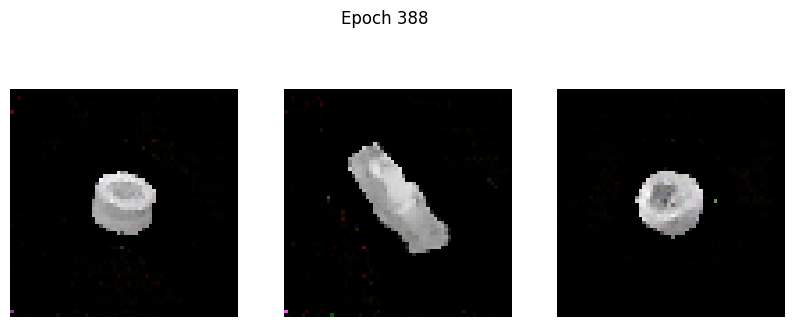

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0365 - g_loss: 4.9839
Epoch 389/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0260 - g_loss: 5.1649

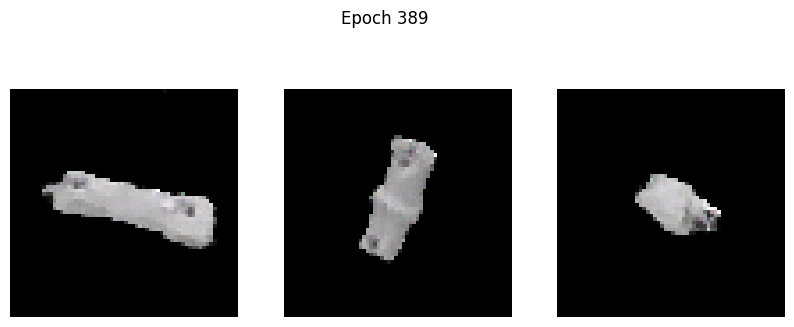

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0261 - g_loss: 5.1665
Epoch 390/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.0016 - g_loss: 5.0290

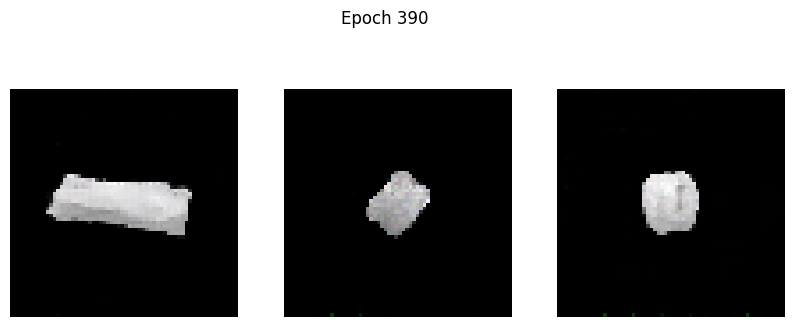

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.0015 - g_loss: 5.0288
Epoch 391/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0470 - g_loss: 5.1545

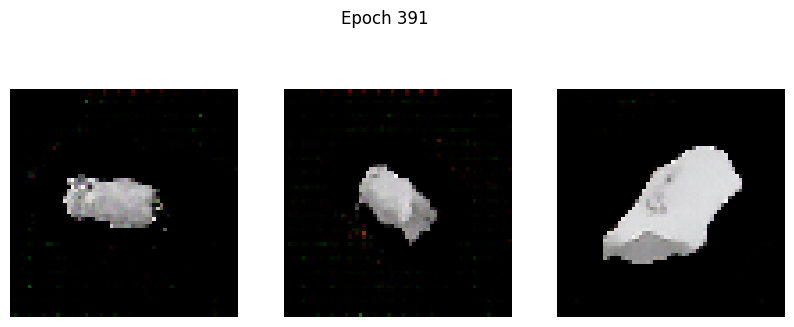

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0472 - g_loss: 5.1542
Epoch 392/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0313 - g_loss: 5.1325

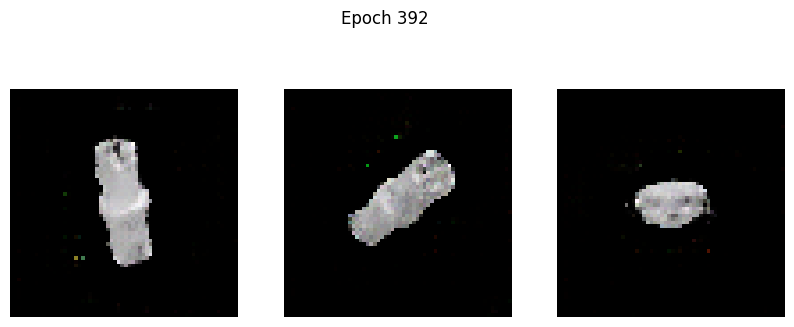

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0313 - g_loss: 5.1313
Epoch 393/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0368 - g_loss: 5.2286

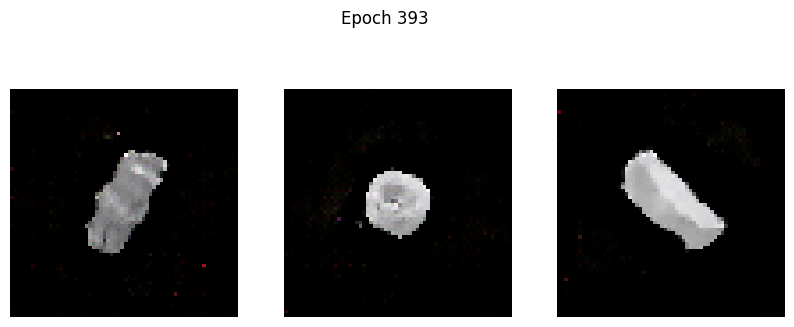

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0373 - g_loss: 5.2279
Epoch 394/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0166 - g_loss: 5.0433

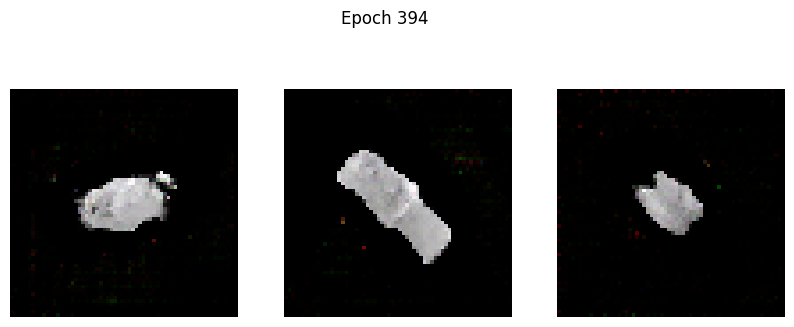

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0166 - g_loss: 5.0433
Epoch 395/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.0043 - g_loss: 4.9503

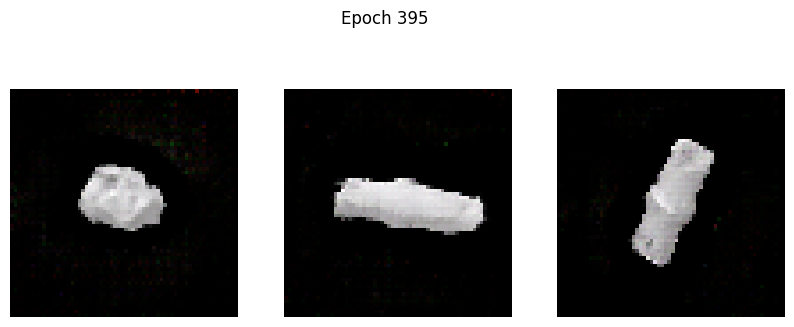

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.0043 - g_loss: 4.9504
Epoch 396/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0706 - g_loss: 5.3027

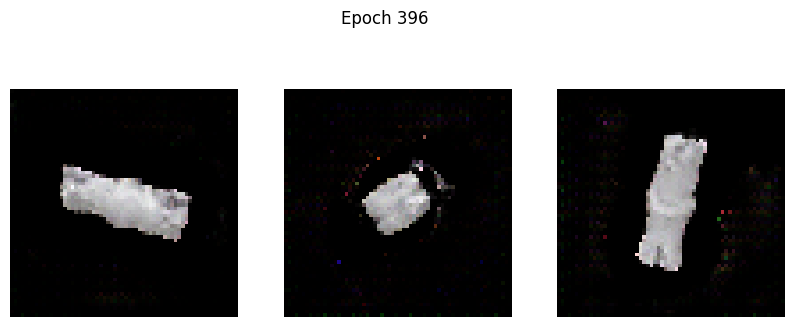

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0710 - g_loss: 5.3030
Epoch 397/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0621 - g_loss: 5.2315

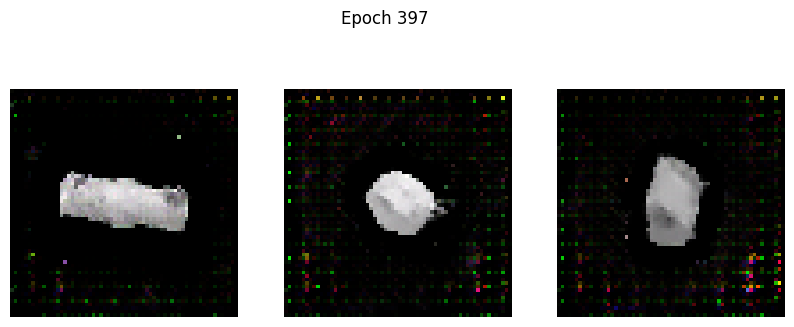

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0620 - g_loss: 5.2293
Epoch 398/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0551 - g_loss: 5.1352

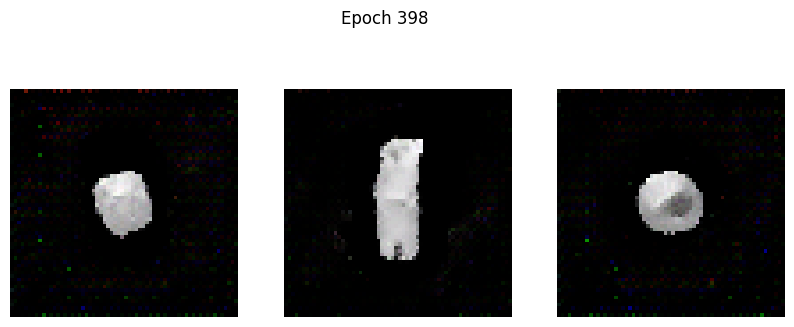

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0550 - g_loss: 5.1353
Epoch 399/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0434 - g_loss: 4.9449

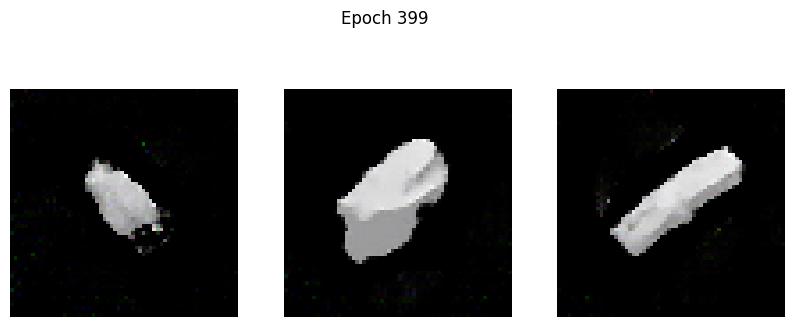

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0432 - g_loss: 4.9452
Epoch 400/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0867 - g_loss: 5.3002

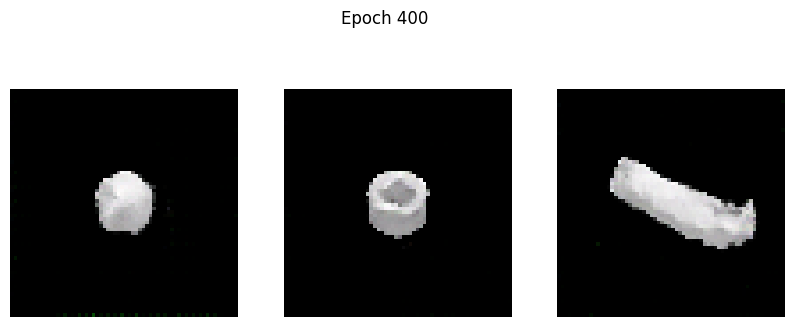

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0864 - g_loss: 5.2987
Epoch 401/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0028 - g_loss: 5.1382

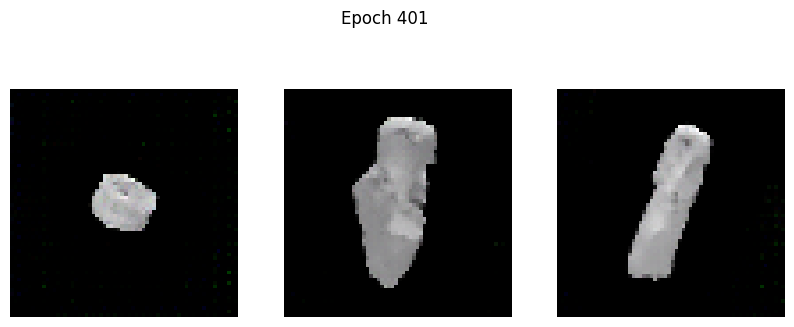

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0027 - g_loss: 5.1381
Epoch 402/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.0116 - g_loss: 4.9911

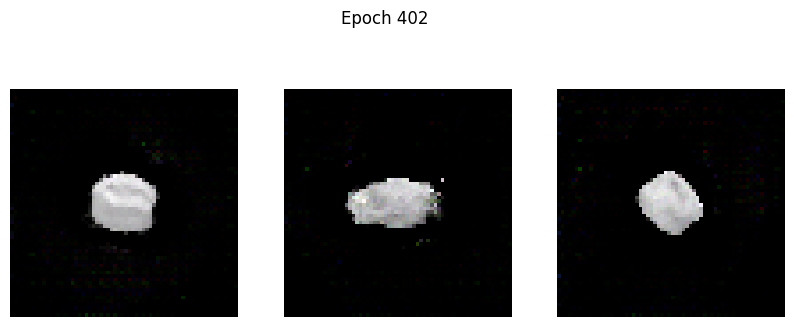

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.0115 - g_loss: 4.9914
Epoch 403/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0381 - g_loss: 5.1656

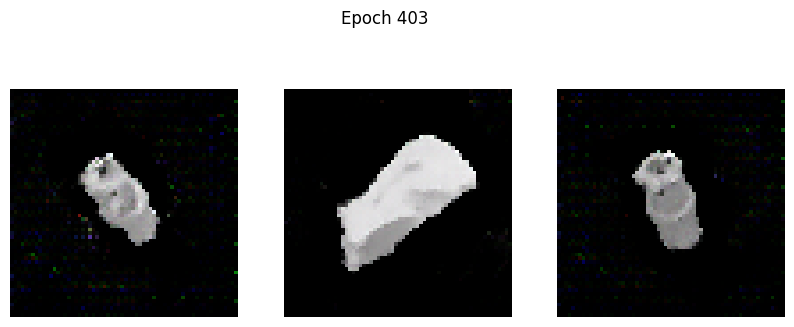

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0384 - g_loss: 5.1663
Epoch 404/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0398 - g_loss: 5.3405

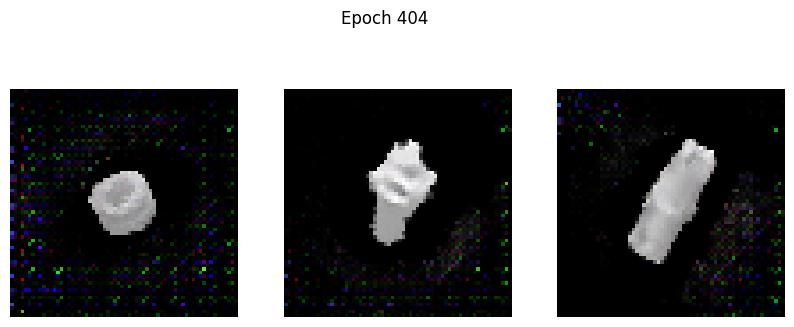

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0399 - g_loss: 5.3400
Epoch 405/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0135 - g_loss: 4.8054

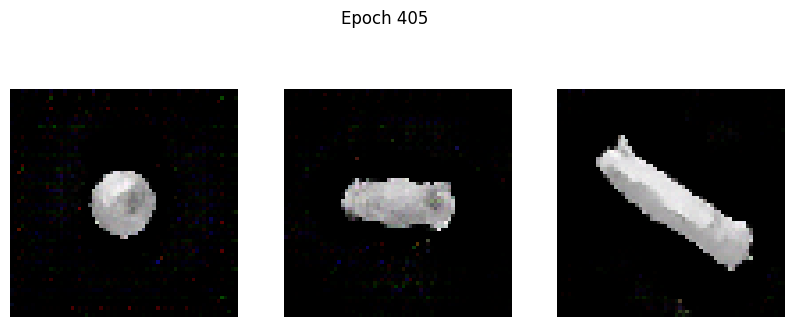

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0134 - g_loss: 4.8059
Epoch 406/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0536 - g_loss: 5.2112

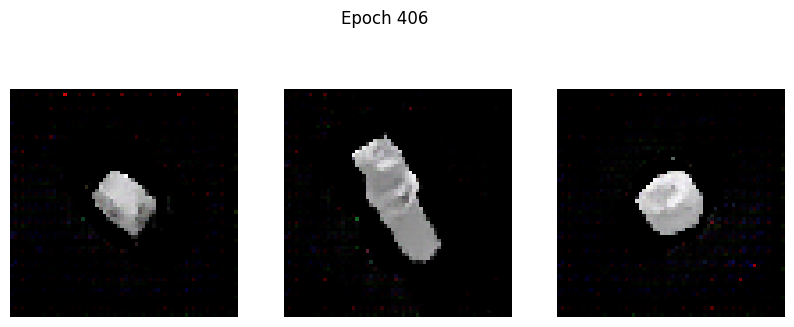

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0539 - g_loss: 5.2131
Epoch 407/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0049 - g_loss: 5.1551

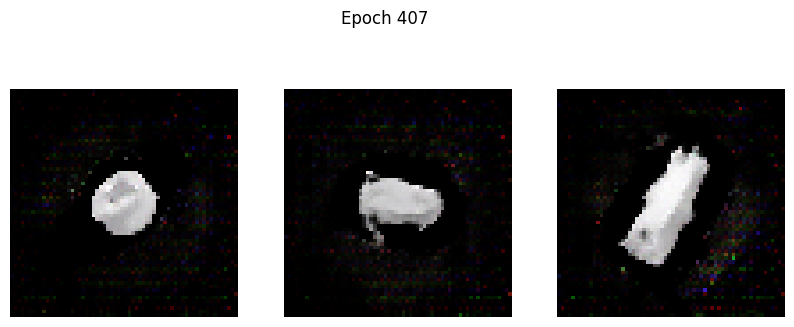

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0053 - g_loss: 5.1558
Epoch 408/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0166 - g_loss: 5.0358

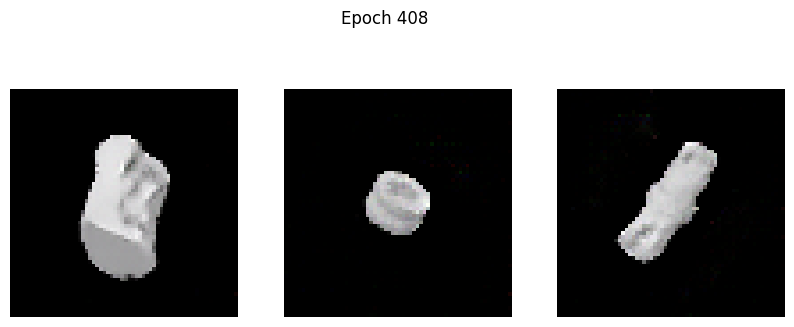

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0165 - g_loss: 5.0364
Epoch 409/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.0024 - g_loss: 4.8838

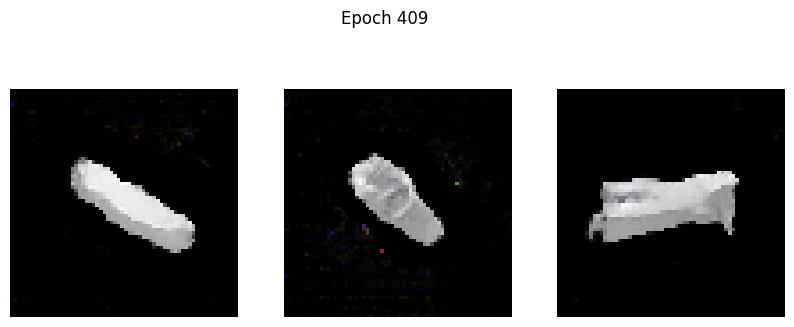

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.0025 - g_loss: 4.8854
Epoch 410/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0172 - g_loss: 5.0844

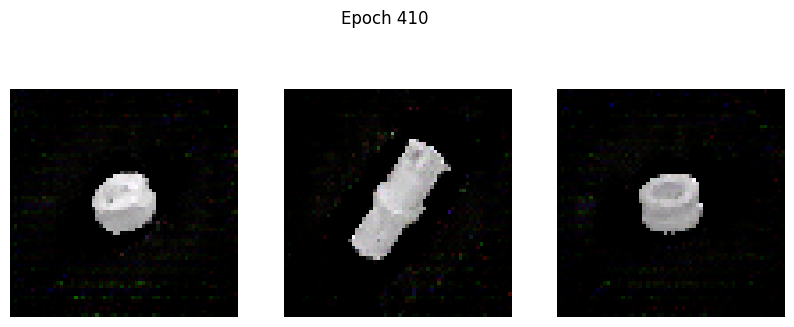

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0172 - g_loss: 5.0856
Epoch 411/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0123 - g_loss: 5.1776

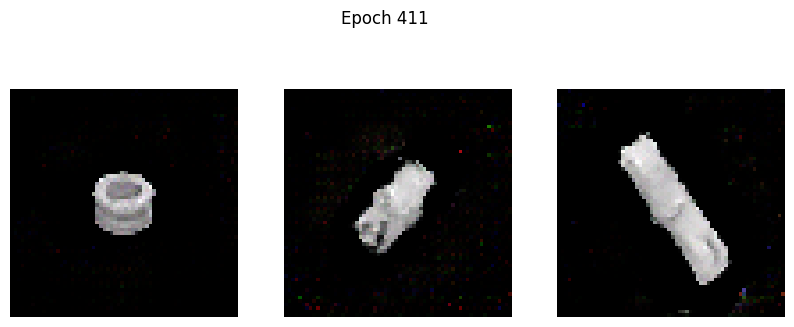

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0125 - g_loss: 5.1788
Epoch 412/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0749 - g_loss: 5.4264

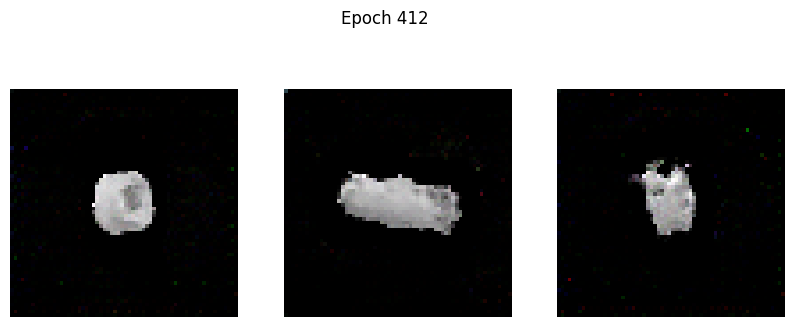

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0748 - g_loss: 5.4263
Epoch 413/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0188 - g_loss: 5.0136

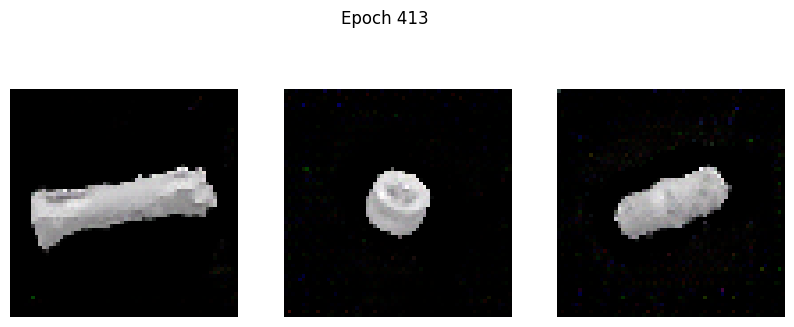

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0187 - g_loss: 5.0141
Epoch 414/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0184 - g_loss: 5.1321

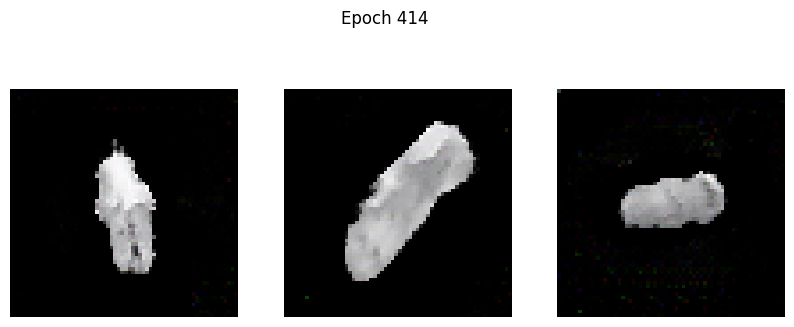

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0182 - g_loss: 5.1337
Epoch 415/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0055 - g_loss: 5.2788

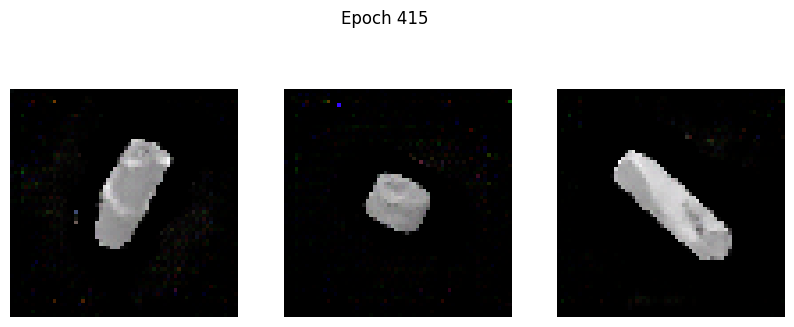

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0058 - g_loss: 5.2804
Epoch 416/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0434 - g_loss: 5.3778

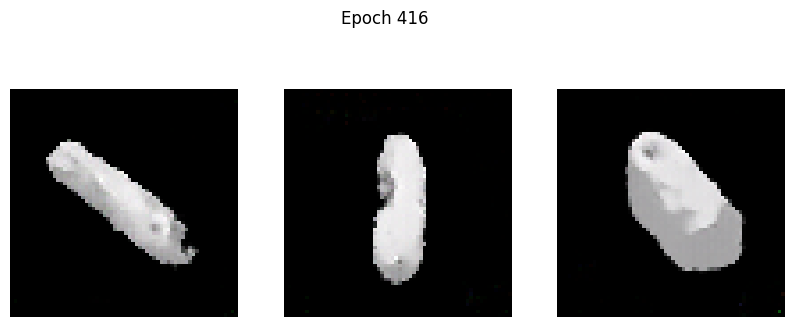

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0432 - g_loss: 5.3776
Epoch 417/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0167 - g_loss: 5.4545

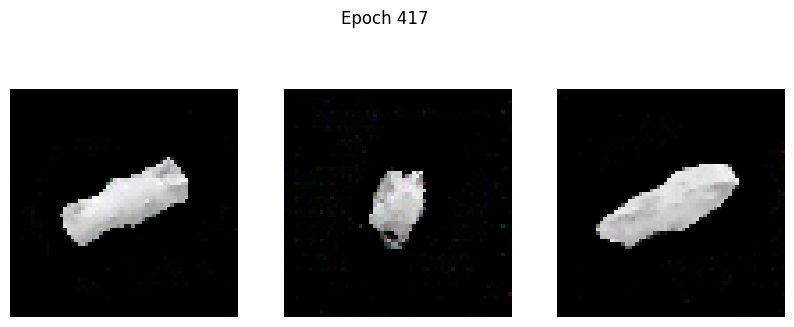

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0166 - g_loss: 5.4538
Epoch 418/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0424 - g_loss: 5.8332

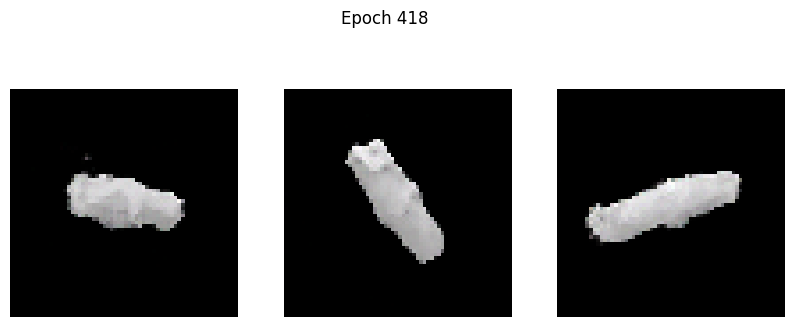

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0423 - g_loss: 5.8303
Epoch 419/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0037 - g_loss: 5.4101

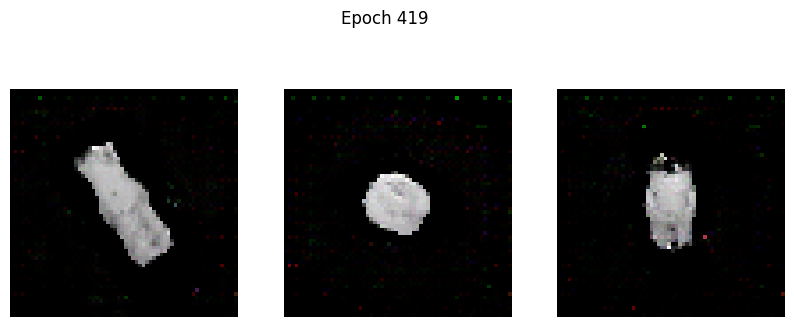

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0037 - g_loss: 5.4104
Epoch 420/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0790 - g_loss: 5.5715

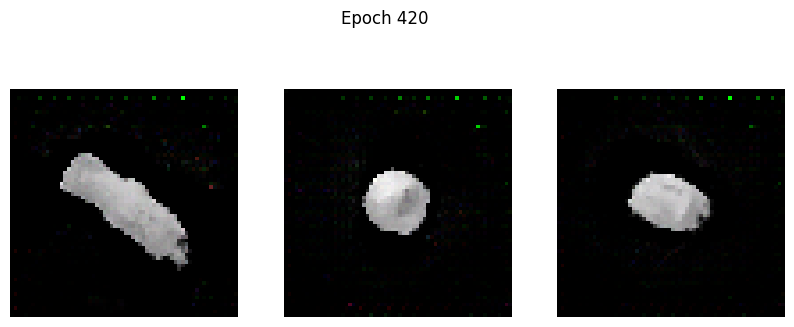

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0792 - g_loss: 5.5718
Epoch 421/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.0327 - g_loss: 5.0560

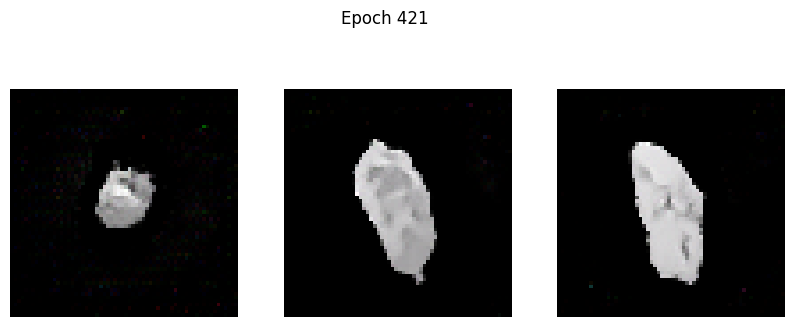

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.0324 - g_loss: 5.0577
Epoch 422/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0051 - g_loss: 5.5775

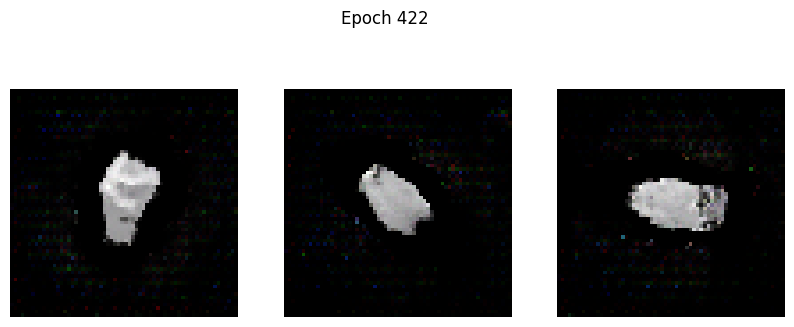

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0050 - g_loss: 5.5758
Epoch 423/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0232 - g_loss: 5.3857

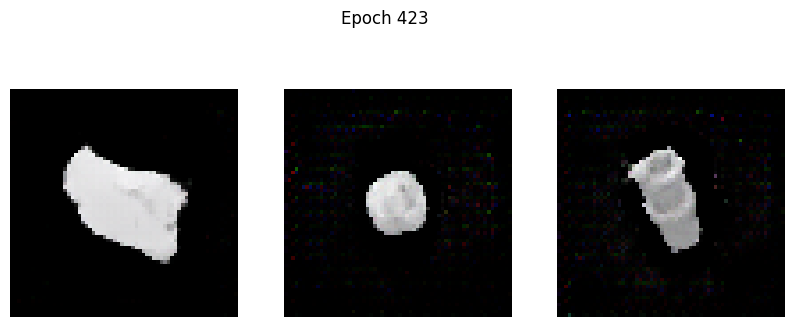

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - d_loss: 0.0232 - g_loss: 5.3848
Epoch 424/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0406 - g_loss: 4.9777

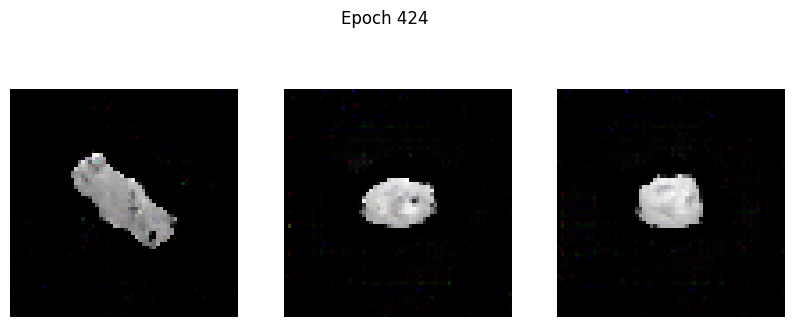

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0403 - g_loss: 4.9804
Epoch 425/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0403 - g_loss: 5.3797

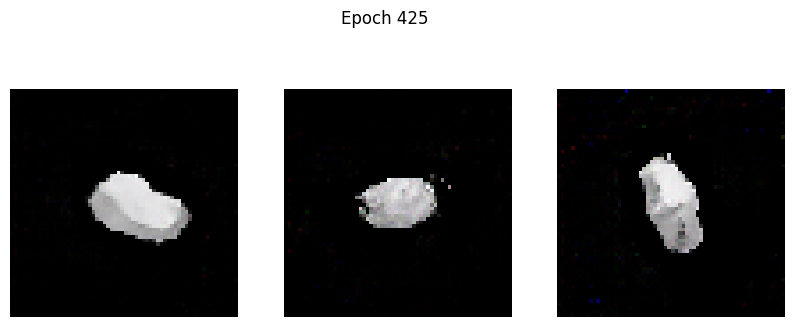

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0403 - g_loss: 5.3787
Epoch 426/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0333 - g_loss: 5.3613

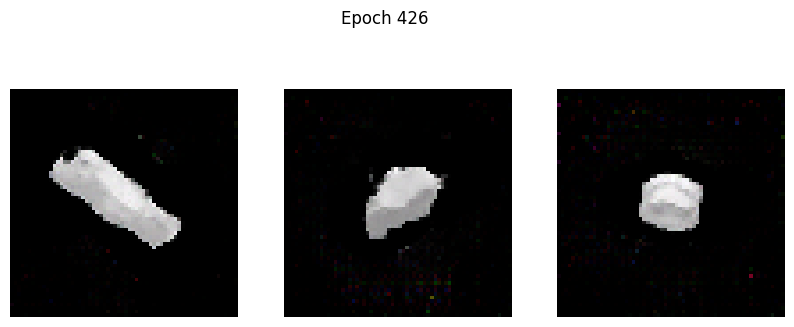

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0330 - g_loss: 5.3607
Epoch 427/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1964 - g_loss: 6.4471

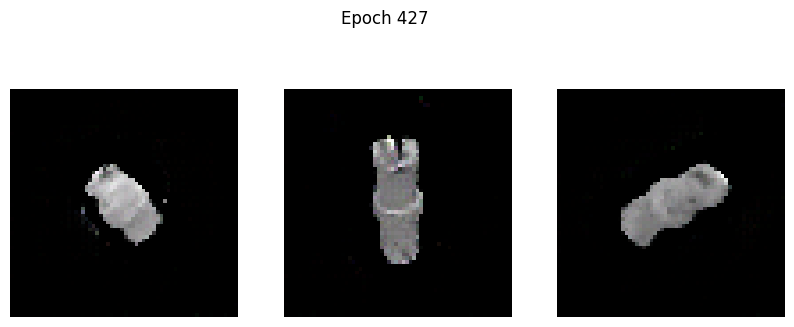

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1956 - g_loss: 6.4420
Epoch 428/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.0123 - g_loss: 5.3988

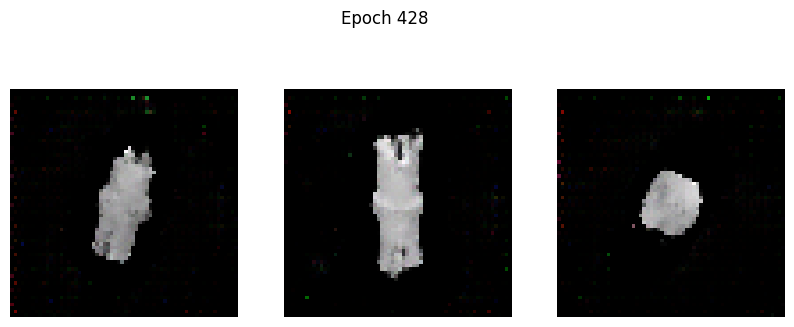

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.0121 - g_loss: 5.4009
Epoch 429/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0068 - g_loss: 5.3889

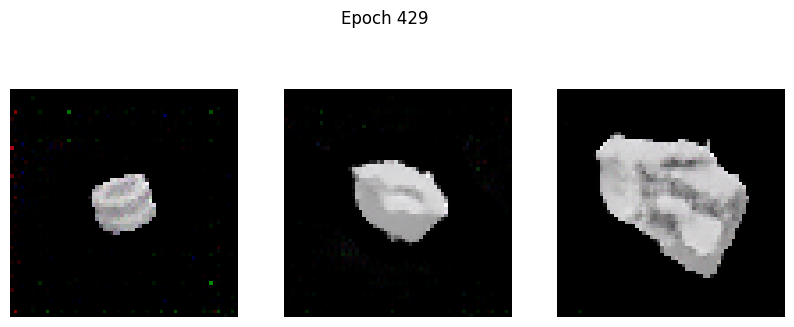

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0070 - g_loss: 5.3899
Epoch 430/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0088 - g_loss: 5.5674

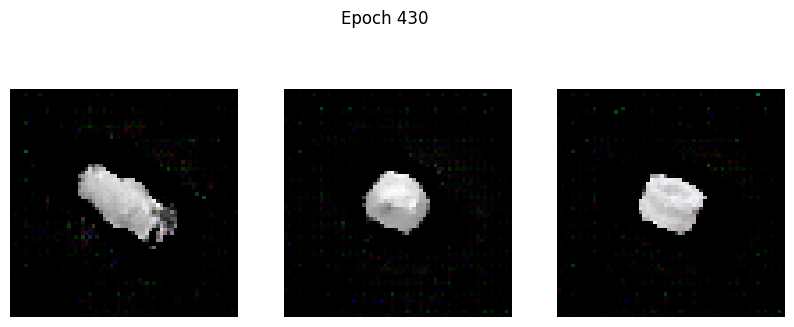

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0089 - g_loss: 5.5672
Epoch 431/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0192 - g_loss: 5.4514

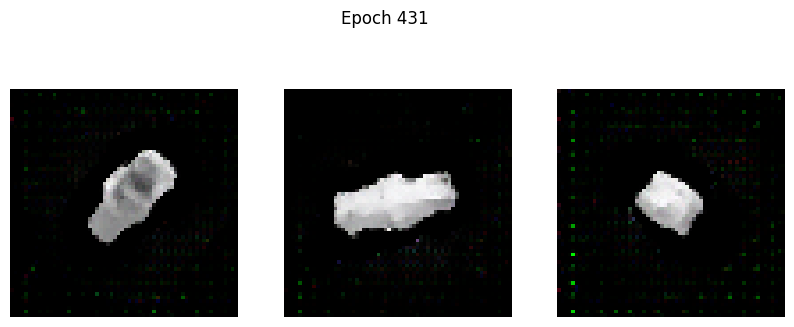

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0190 - g_loss: 5.4526
Epoch 432/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 4.9078e-04 - g_loss: 5.5463

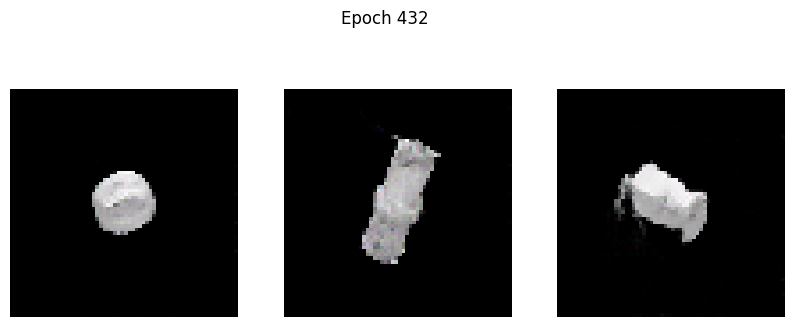

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 6.1584e-04 - g_loss: 5.5466
Epoch 433/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0361 - g_loss: 5.3300

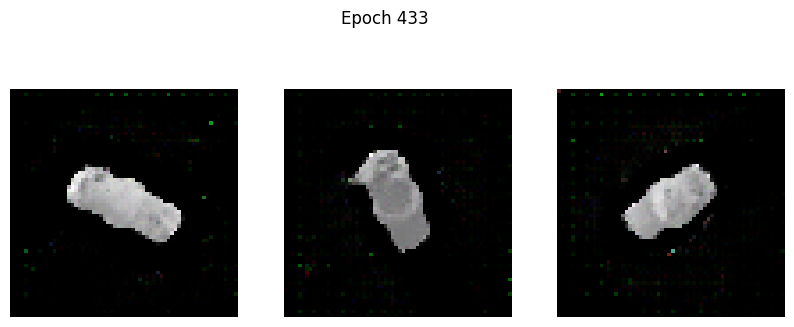

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0357 - g_loss: 5.3311
Epoch 434/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0332 - g_loss: 5.2613

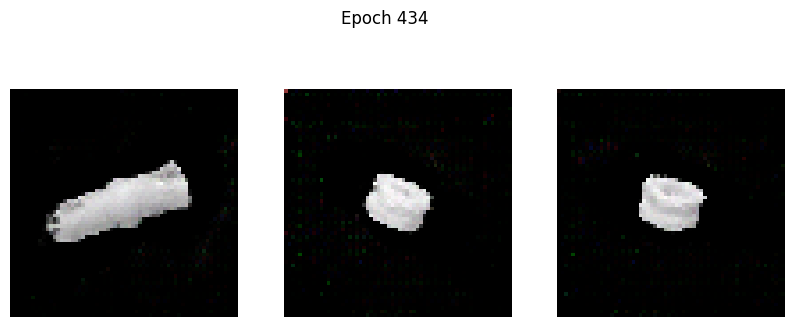

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0331 - g_loss: 5.2623
Epoch 435/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0128 - g_loss: 5.5417

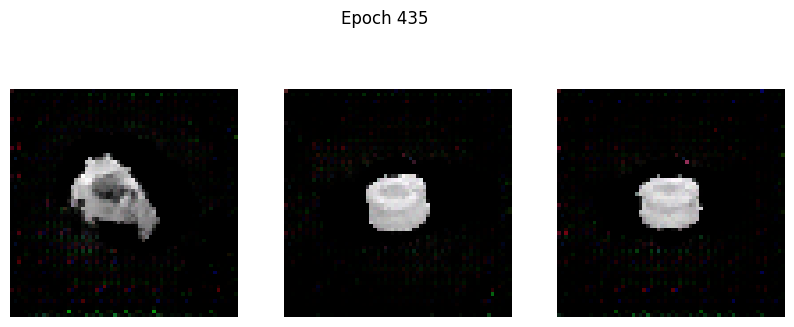

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0123 - g_loss: 5.5424
Epoch 436/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0288 - g_loss: 5.4533

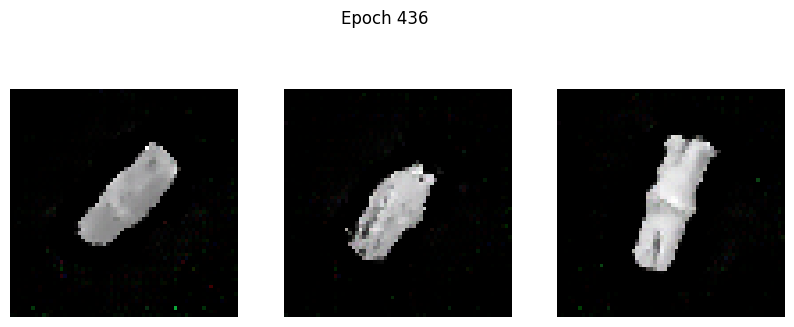

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0287 - g_loss: 5.4528
Epoch 437/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0103 - g_loss: 5.4650

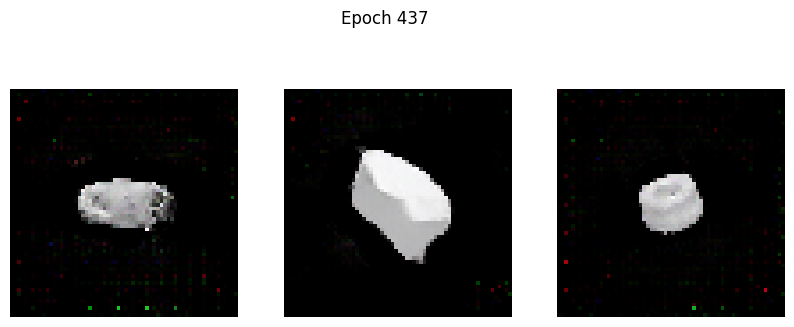

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0107 - g_loss: 5.4664
Epoch 438/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0443 - g_loss: 5.2384

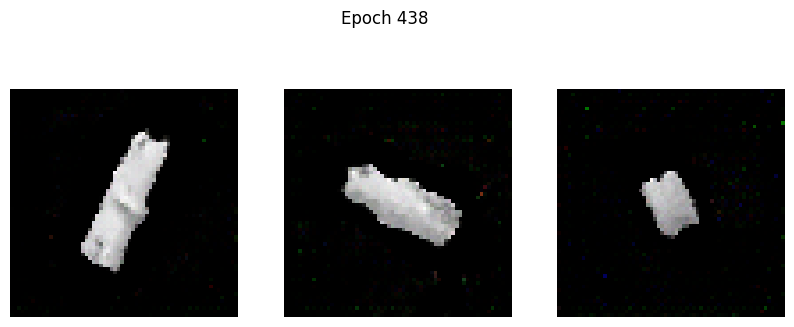

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0442 - g_loss: 5.2394
Epoch 439/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0123 - g_loss: 5.4943

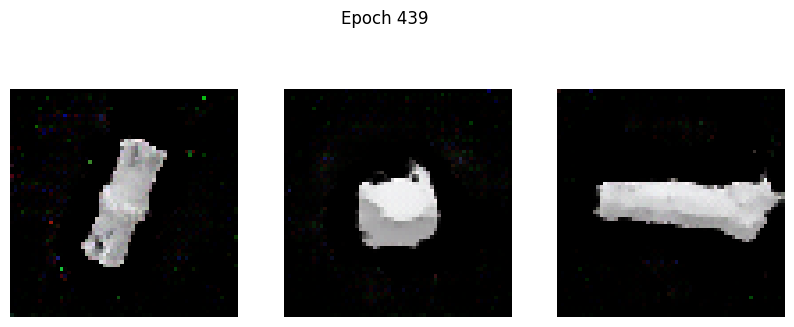

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0124 - g_loss: 5.4949
Epoch 440/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0071 - g_loss: 5.6702

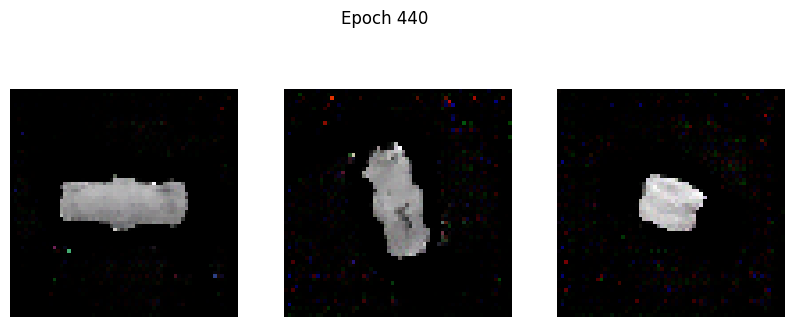

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0073 - g_loss: 5.6712
Epoch 441/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0141 - g_loss: 5.6058

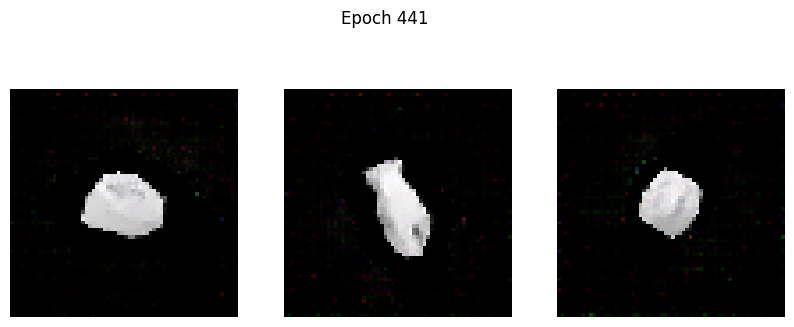

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0139 - g_loss: 5.6061
Epoch 442/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0181 - g_loss: 5.4664

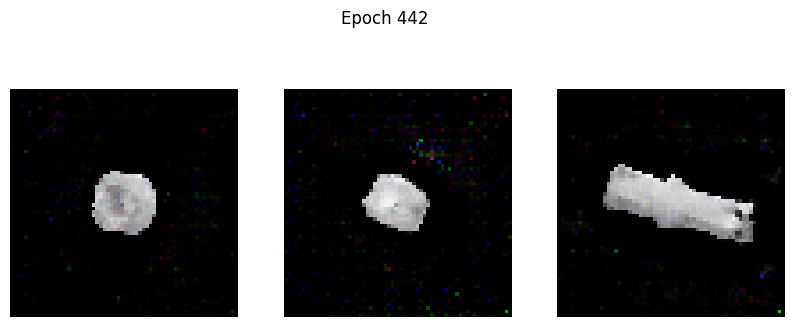

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0179 - g_loss: 5.4679
Epoch 443/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0564 - g_loss: 6.1230

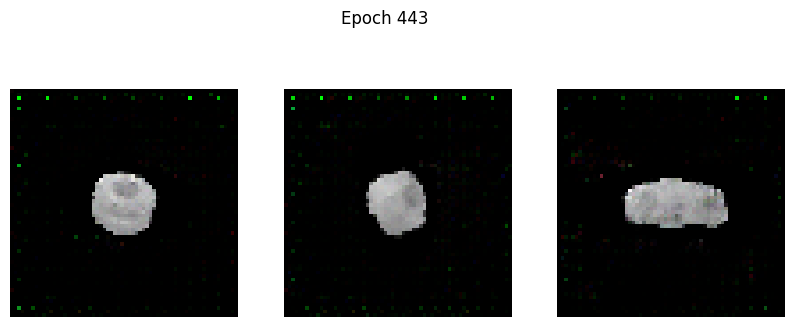

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0561 - g_loss: 6.1184
Epoch 444/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0276 - g_loss: 5.5121

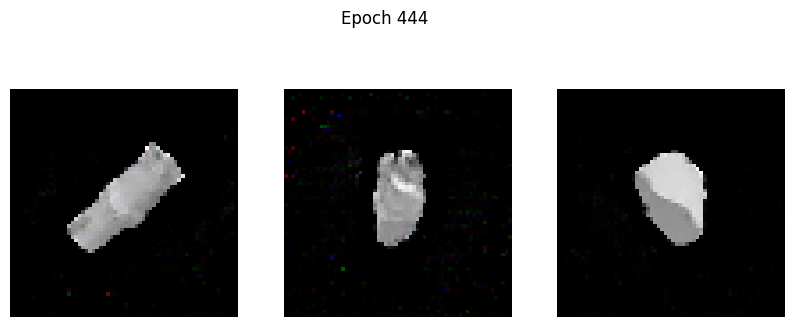

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0276 - g_loss: 5.5128
Epoch 445/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0529 - g_loss: 5.3182

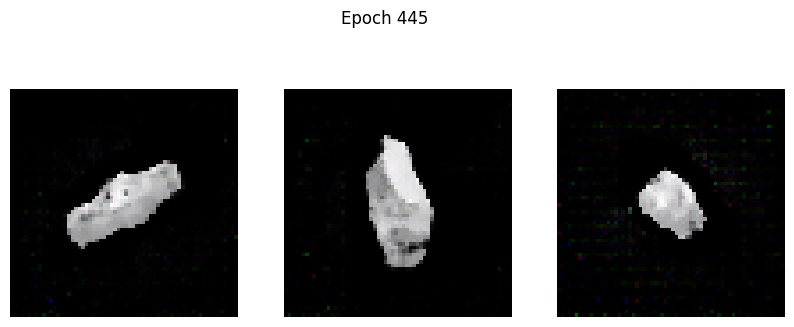

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0529 - g_loss: 5.3201
Epoch 446/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0269 - g_loss: 5.3903

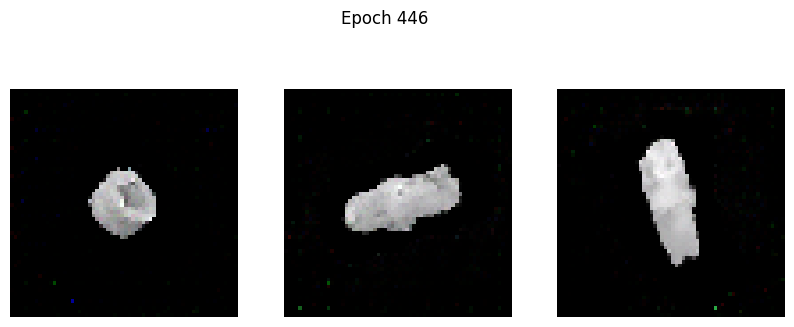

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0269 - g_loss: 5.3919
Epoch 447/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0017 - g_loss: 5.7631

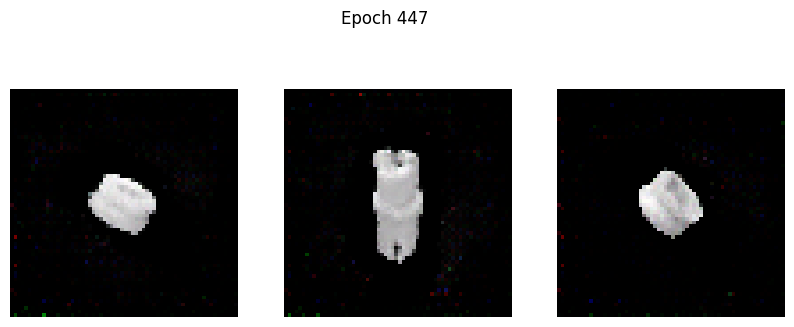

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0017 - g_loss: 5.7636
Epoch 448/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0287 - g_loss: 5.7194

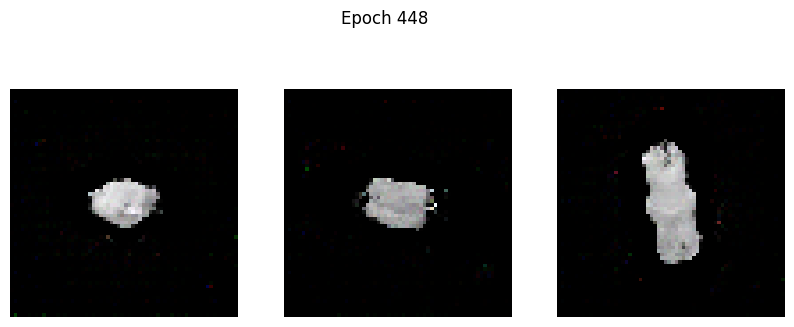

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - d_loss: -0.0286 - g_loss: 5.7199
Epoch 449/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0156 - g_loss: 5.8716

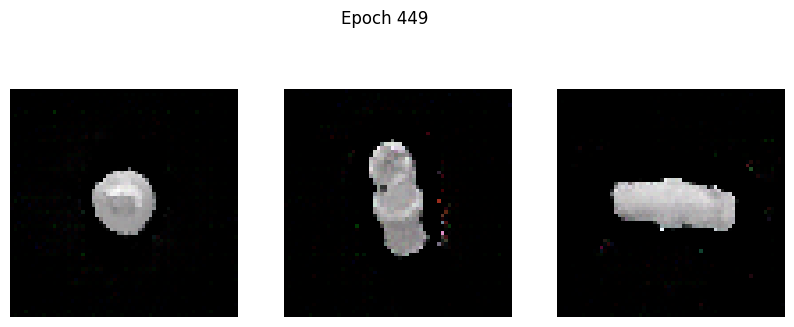

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0155 - g_loss: 5.8713
Epoch 450/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0875 - g_loss: 6.1490

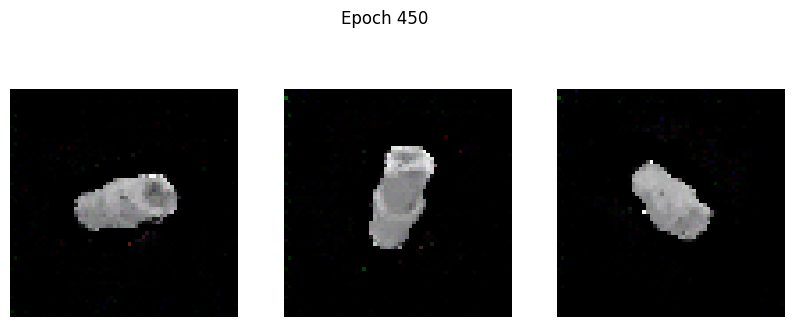

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0866 - g_loss: 6.1454
Epoch 451/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0563 - g_loss: 5.5619

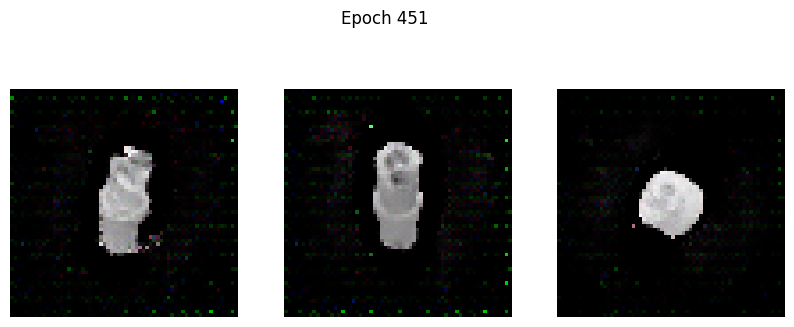

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0559 - g_loss: 5.5642
Epoch 452/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0021 - g_loss: 5.9483

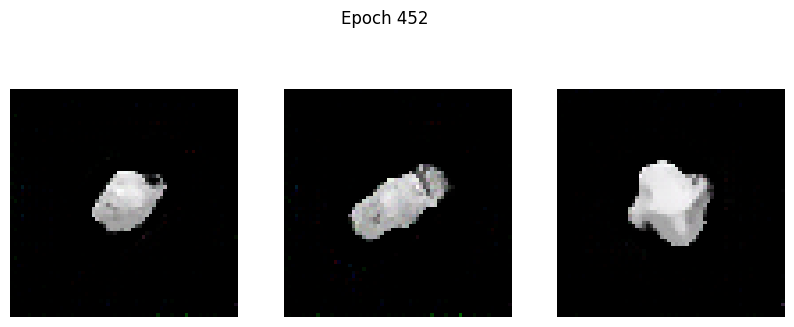

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0020 - g_loss: 5.9491
Epoch 453/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0251 - g_loss: 5.7162

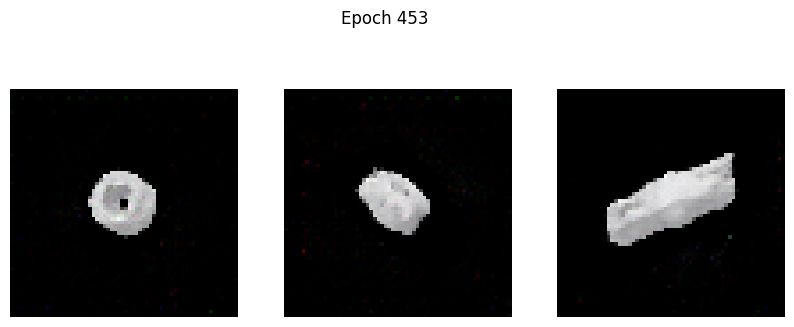

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0251 - g_loss: 5.7174
Epoch 454/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0262 - g_loss: 5.7873

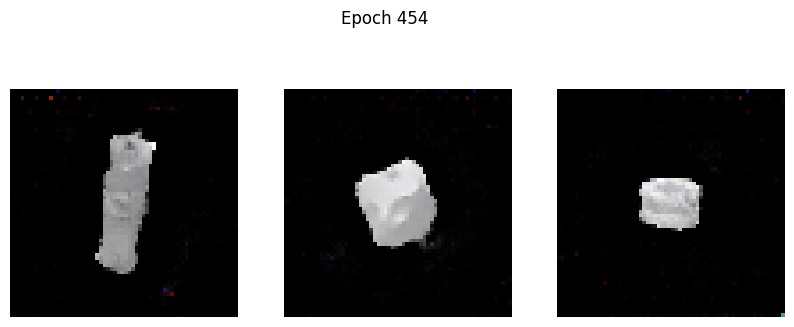

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0264 - g_loss: 5.7865
Epoch 455/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0447 - g_loss: 6.1916

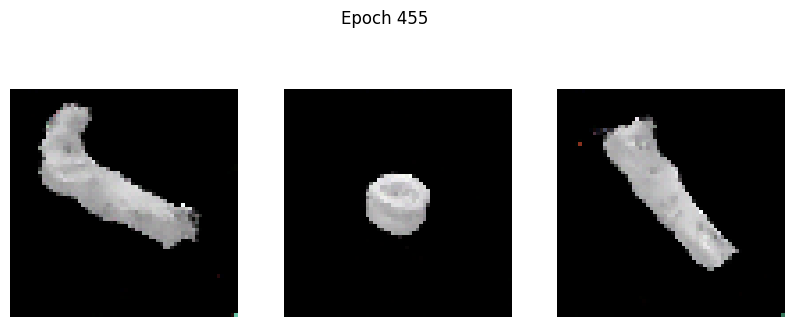

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0449 - g_loss: 6.1935
Epoch 456/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0611 - g_loss: 5.7994

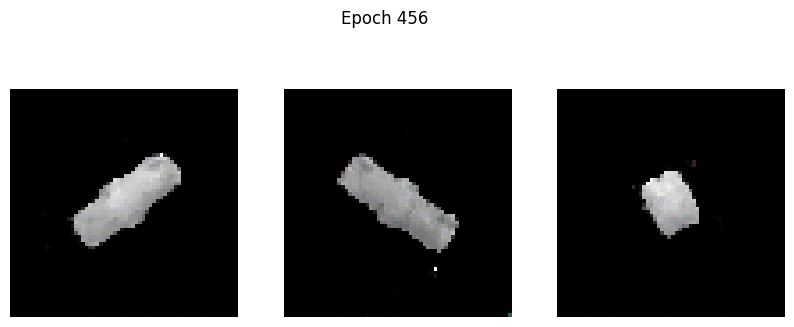

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0609 - g_loss: 5.7997
Epoch 457/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0457 - g_loss: 6.0892

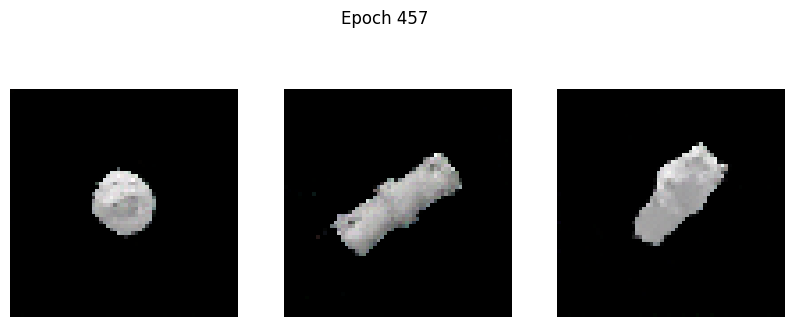

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0465 - g_loss: 6.0923
Epoch 458/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0076 - g_loss: 5.6981

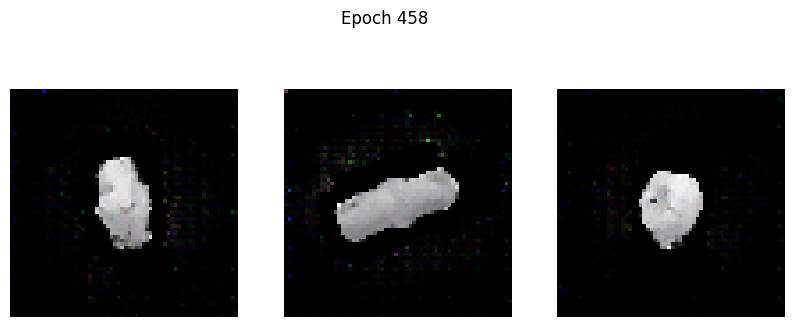

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0078 - g_loss: 5.6984
Epoch 459/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0514 - g_loss: 5.6558

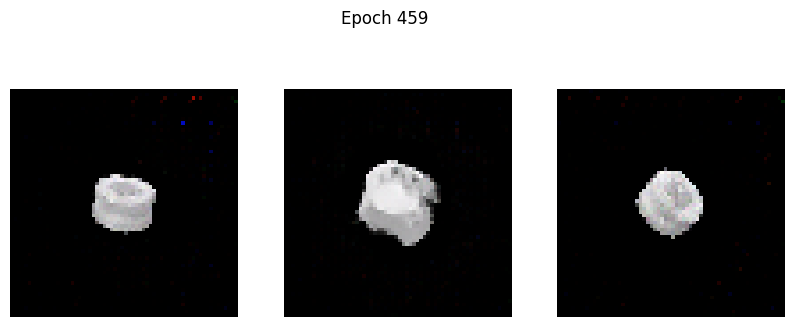

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0515 - g_loss: 5.6545
Epoch 460/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0311 - g_loss: 5.8737

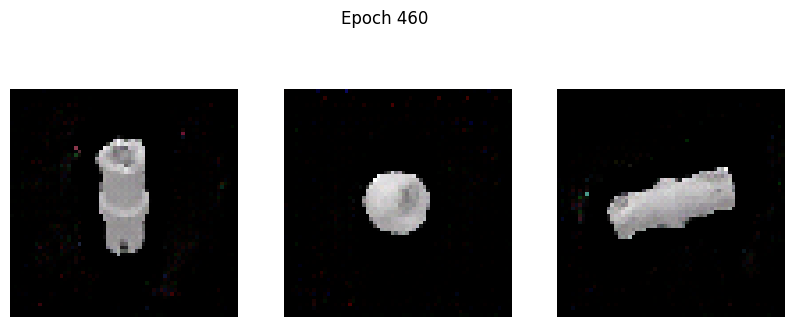

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0314 - g_loss: 5.8711
Epoch 461/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0366 - g_loss: 5.9003

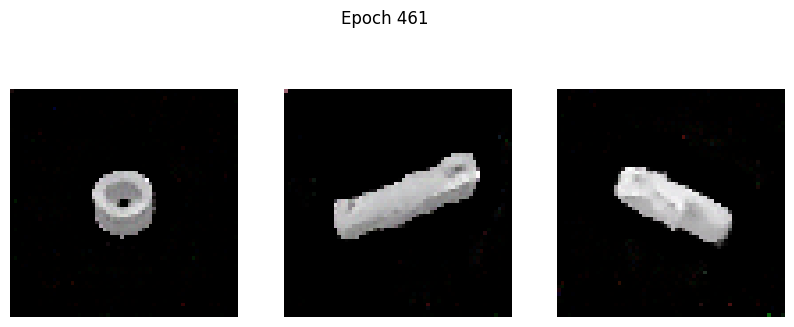

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0366 - g_loss: 5.8994
Epoch 462/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0277 - g_loss: 5.9579

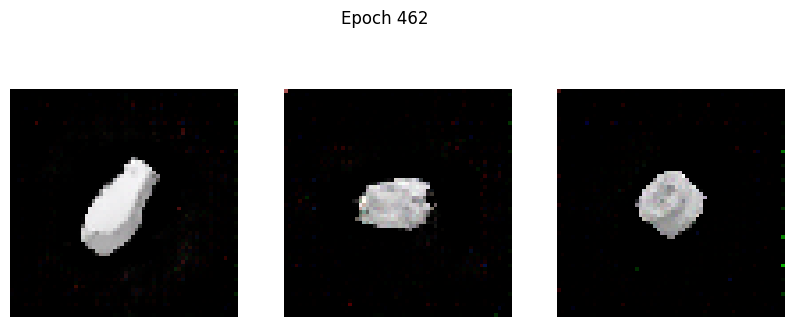

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0276 - g_loss: 5.9585
Epoch 463/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0374 - g_loss: 5.7949

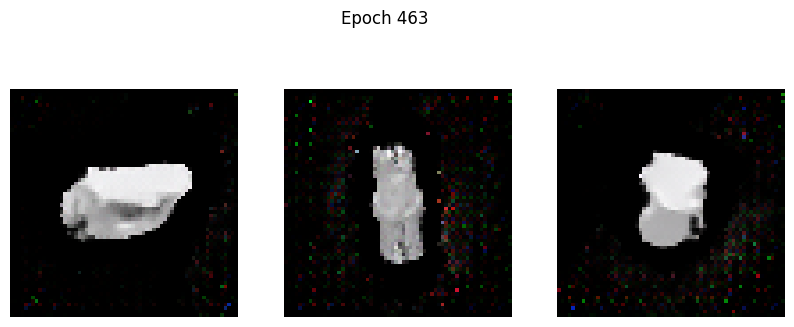

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0371 - g_loss: 5.7957
Epoch 464/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0671 - g_loss: 6.2775

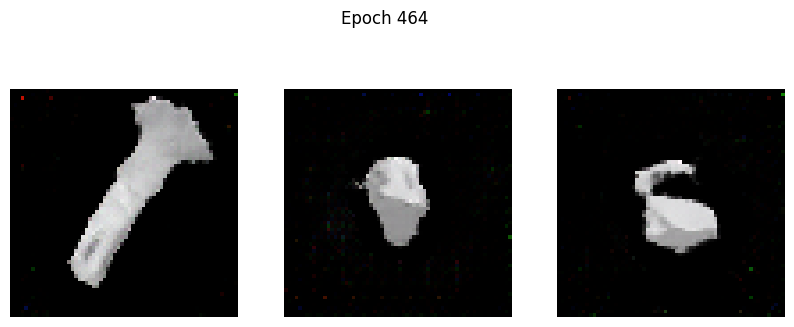

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0668 - g_loss: 6.2772
Epoch 465/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0620 - g_loss: 5.8365

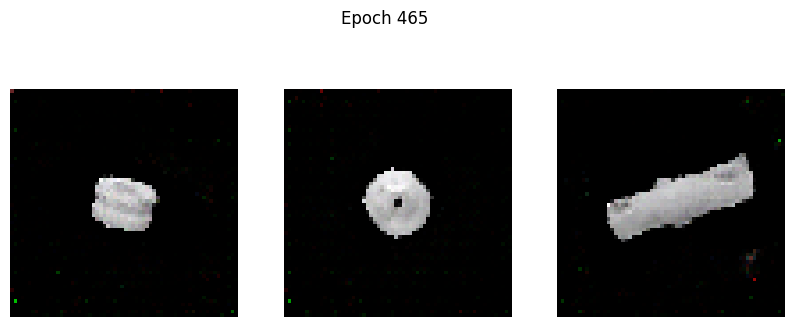

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0618 - g_loss: 5.8388
Epoch 466/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0260 - g_loss: 6.0150

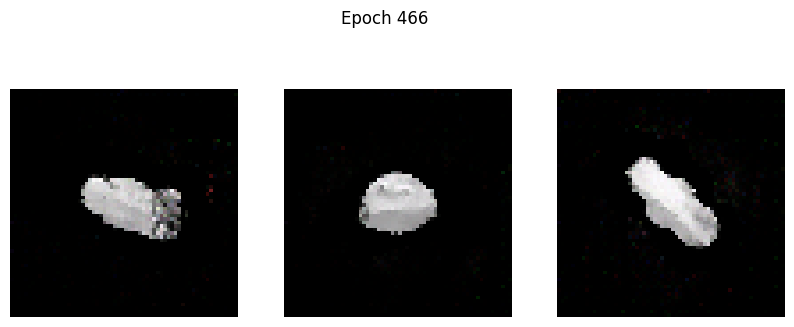

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0259 - g_loss: 6.0154
Epoch 467/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0399 - g_loss: 6.0404

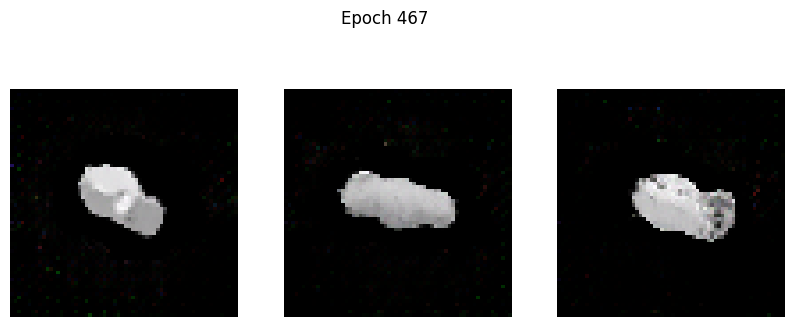

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0399 - g_loss: 6.0391
Epoch 468/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0205 - g_loss: 6.1570

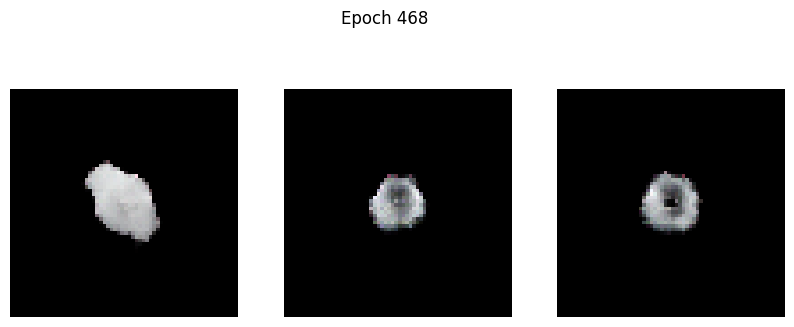

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0195 - g_loss: 6.1697
Epoch 469/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.1736 - g_loss: 7.4933

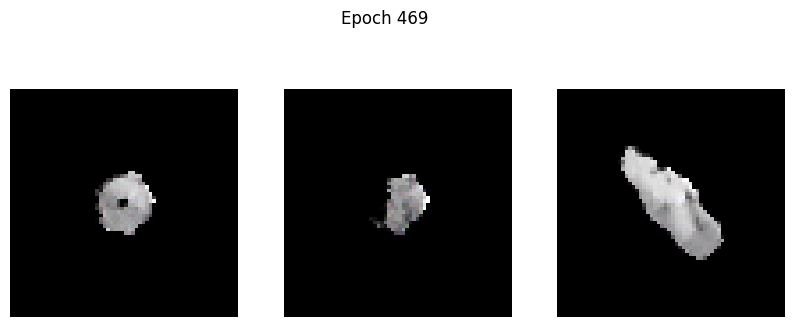

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.1736 - g_loss: 7.4889
Epoch 470/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.1895 - g_loss: 6.8999

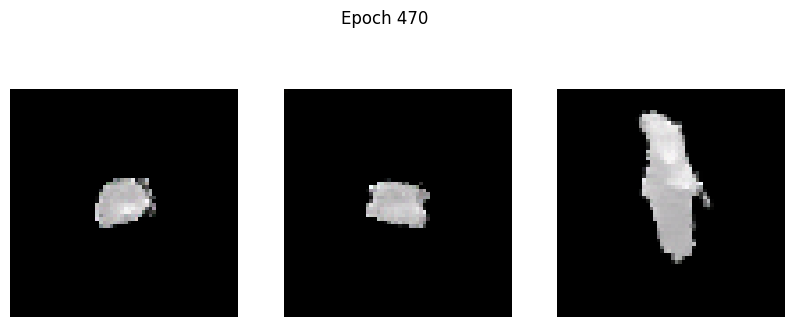

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: -0.1893 - g_loss: 6.8970
Epoch 471/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.1586 - g_loss: 6.6733

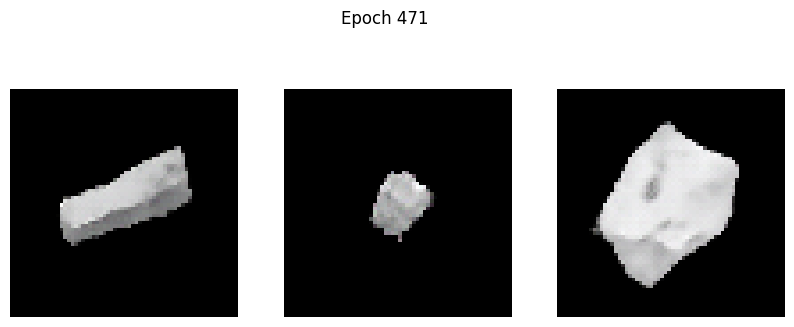

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.1586 - g_loss: 6.6757
Epoch 472/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.1614 - g_loss: 6.3283

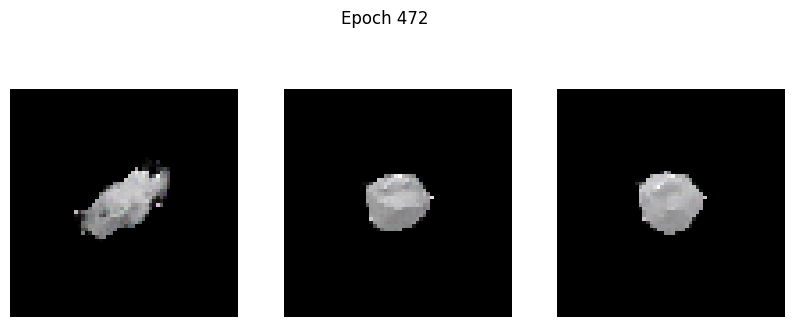

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.1613 - g_loss: 6.3286
Epoch 473/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.1230 - g_loss: 6.4450

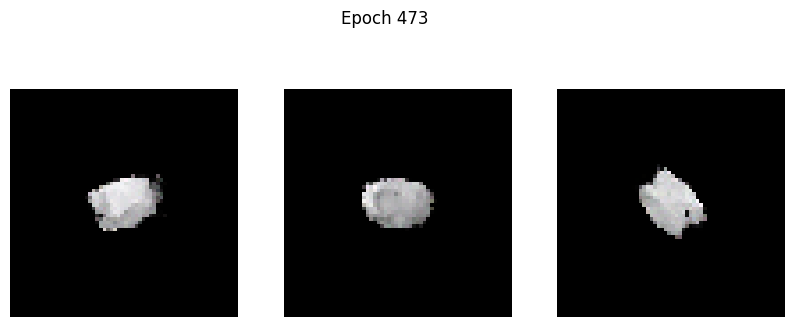

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.1228 - g_loss: 6.4481
Epoch 474/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.1274 - g_loss: 6.5428

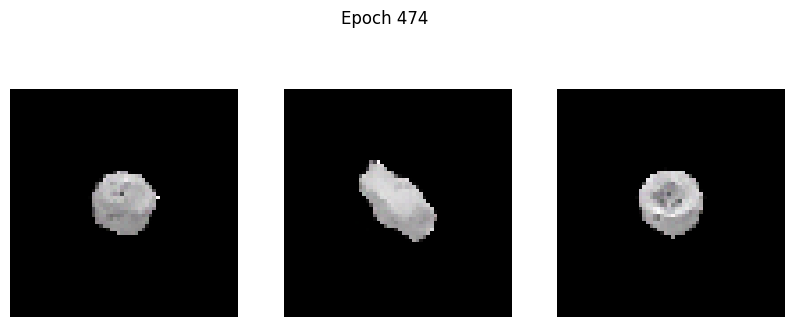

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.1274 - g_loss: 6.5418
Epoch 475/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.1091 - g_loss: 6.7957

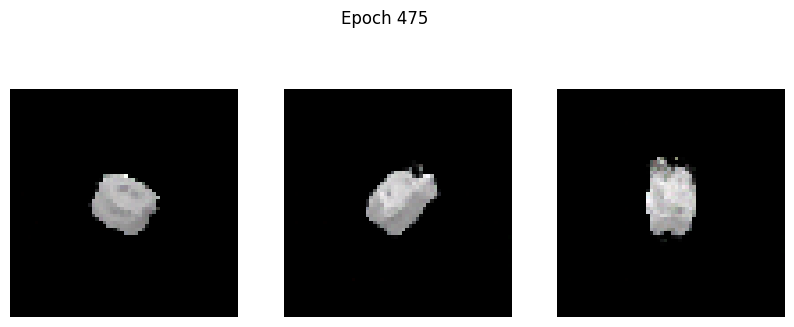

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.1089 - g_loss: 6.7950
Epoch 476/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0109 - g_loss: 7.4157

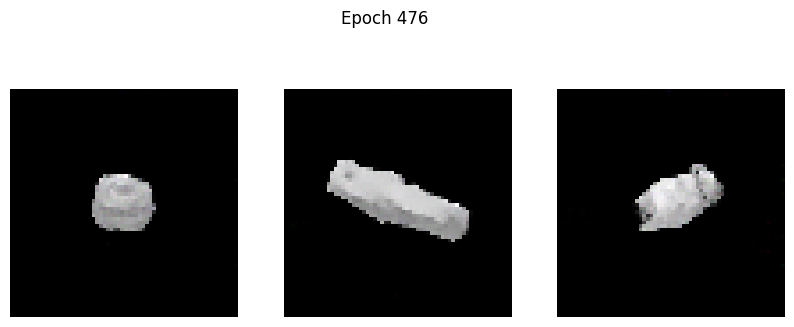

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0108 - g_loss: 7.4121
Epoch 477/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0490 - g_loss: 7.4205

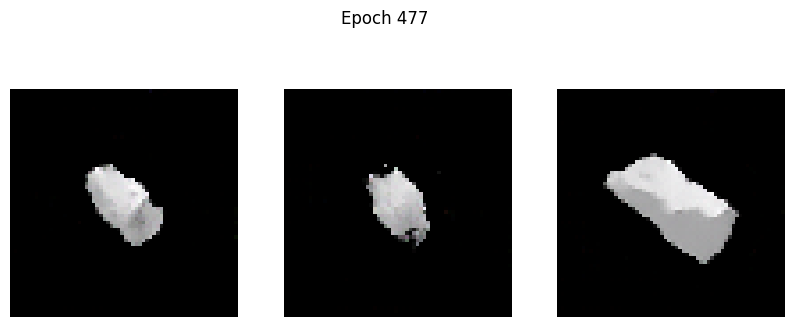

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0485 - g_loss: 7.4171
Epoch 478/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.1050 - g_loss: 6.2410

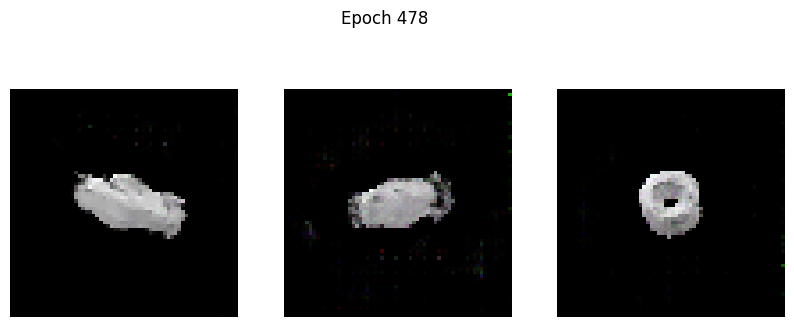

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.1043 - g_loss: 6.2446
Epoch 479/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0430 - g_loss: 6.5596

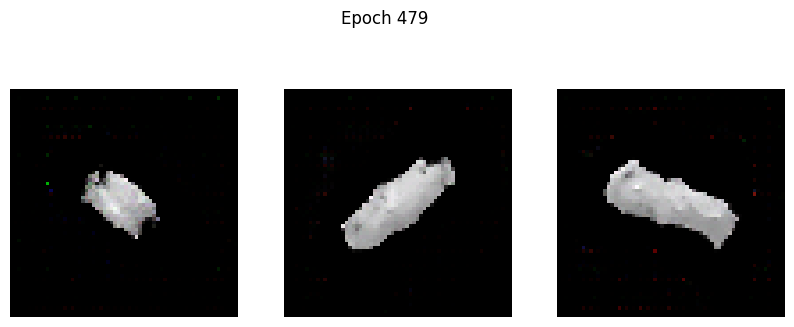

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0420 - g_loss: 6.5567
Epoch 480/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0097 - g_loss: 6.7378

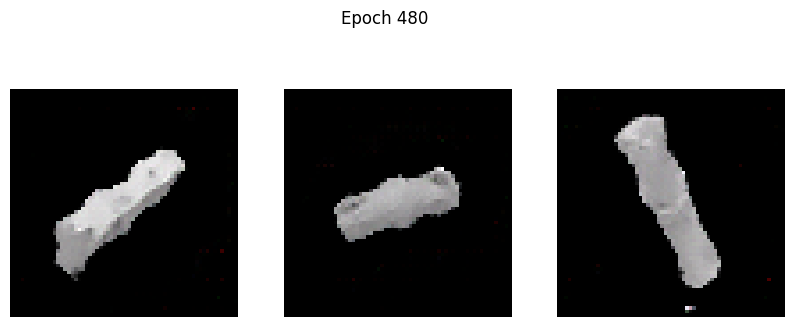

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0095 - g_loss: 6.7362
Epoch 481/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0987 - g_loss: 6.0944

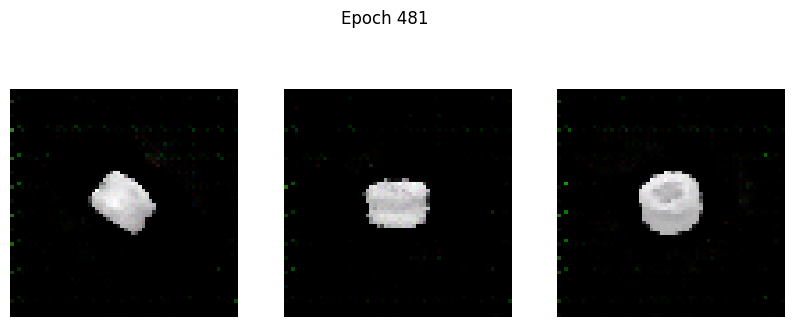

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0986 - g_loss: 6.0947
Epoch 482/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0350 - g_loss: 6.5617

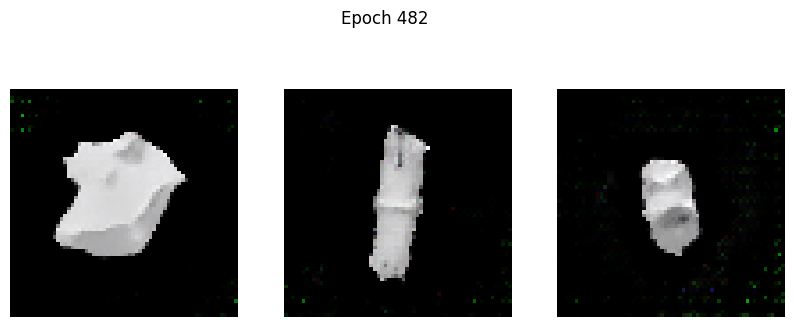

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0348 - g_loss: 6.5628
Epoch 483/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0379 - g_loss: 6.4147

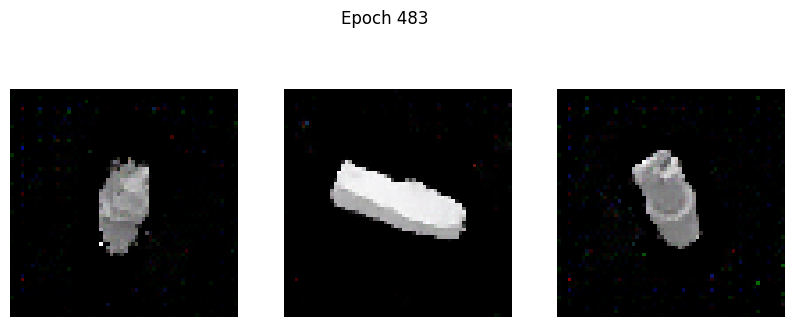

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0378 - g_loss: 6.4174
Epoch 484/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0035 - g_loss: 6.7636

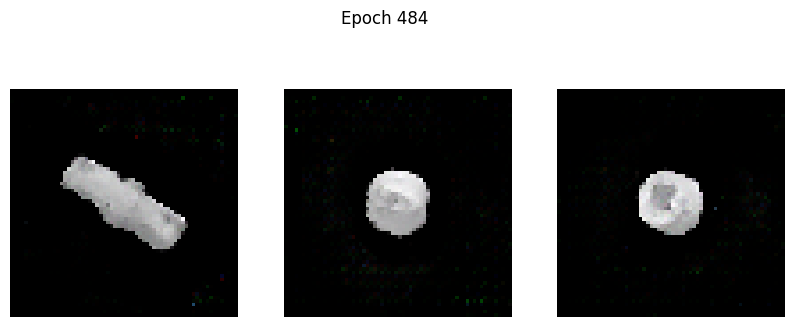

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0032 - g_loss: 6.7624
Epoch 485/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0425 - g_loss: 6.5520

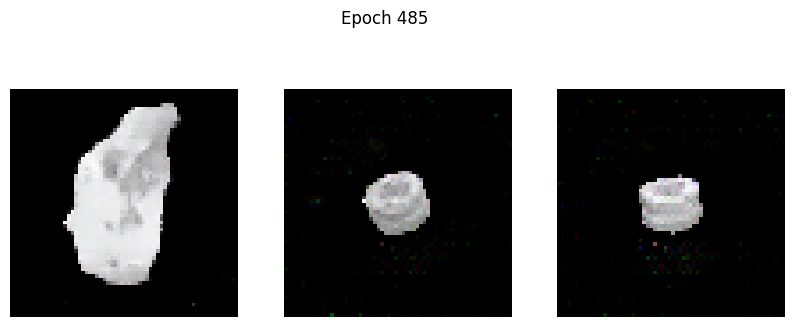

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0428 - g_loss: 6.5499
Epoch 486/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 5.4412e-04 - g_loss: 6.8549

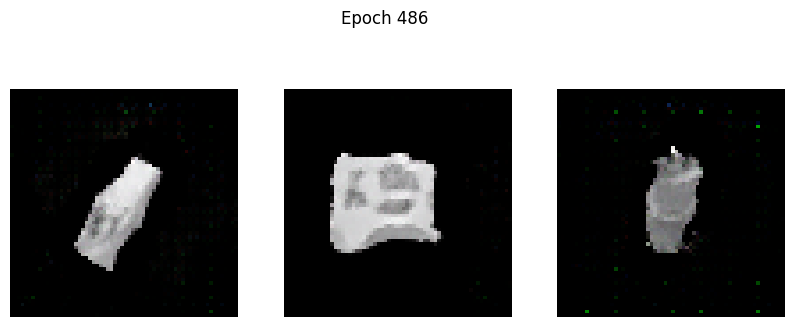

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 7.2343e-04 - g_loss: 6.8554
Epoch 487/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0507 - g_loss: 6.0756

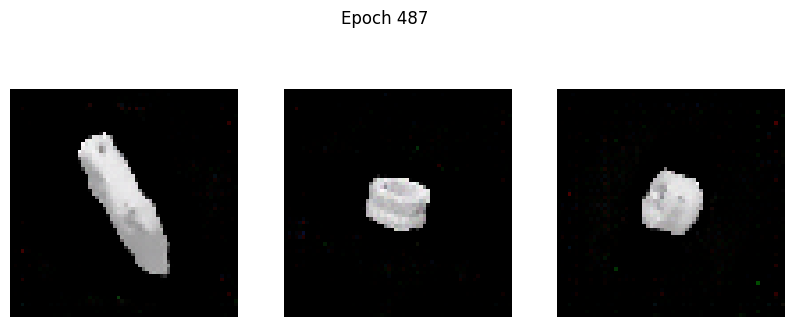

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0509 - g_loss: 6.0763
Epoch 488/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.1024 - g_loss: 6.1368

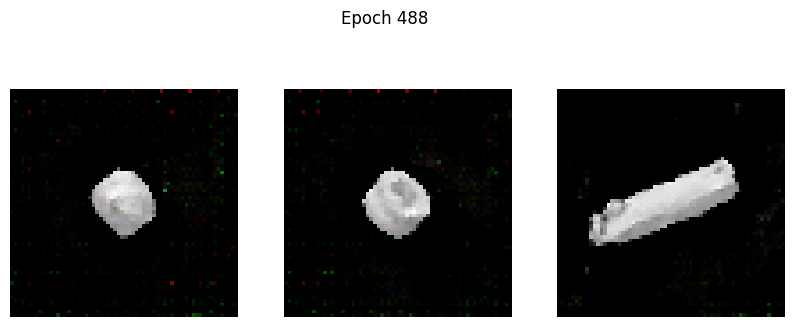

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - d_loss: -0.1020 - g_loss: 6.1395
Epoch 489/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0089 - g_loss: 6.5326

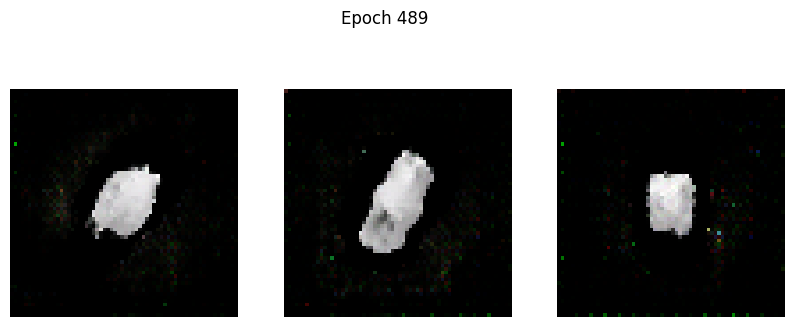

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0091 - g_loss: 6.5331
Epoch 490/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0567 - g_loss: 6.3029

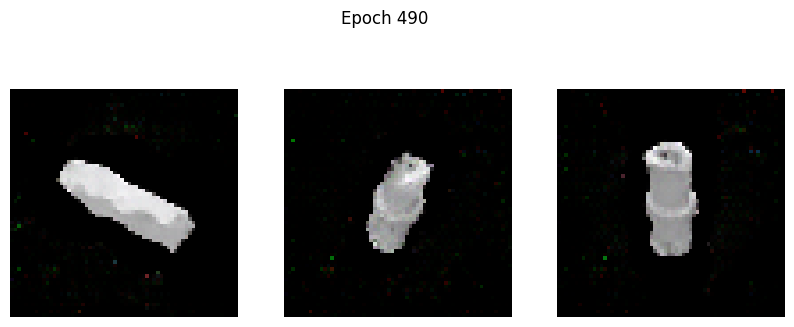

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0566 - g_loss: 6.3035
Epoch 491/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0915 - g_loss: 6.5518

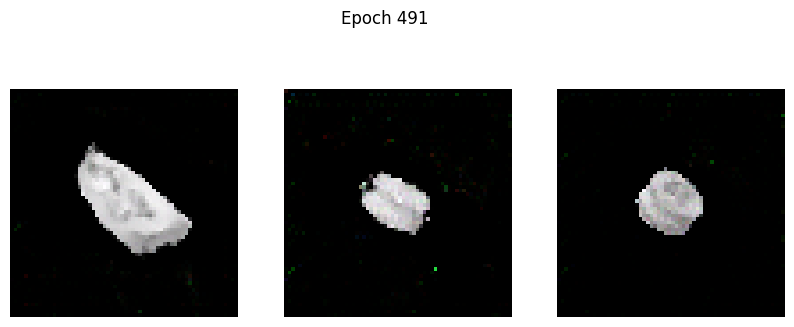

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0913 - g_loss: 6.5517
Epoch 492/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0680 - g_loss: 6.5213

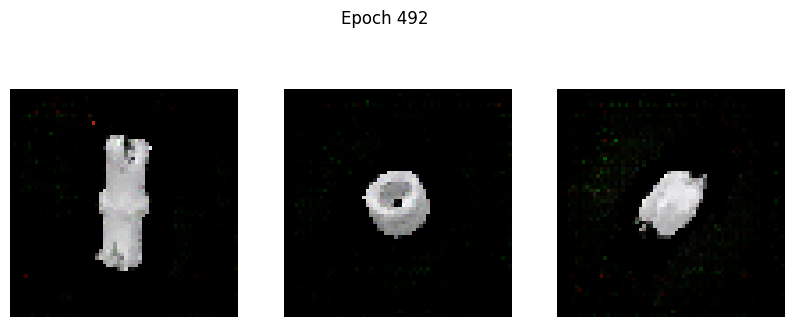

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0677 - g_loss: 6.5213
Epoch 493/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: -0.0673 - g_loss: 6.6696

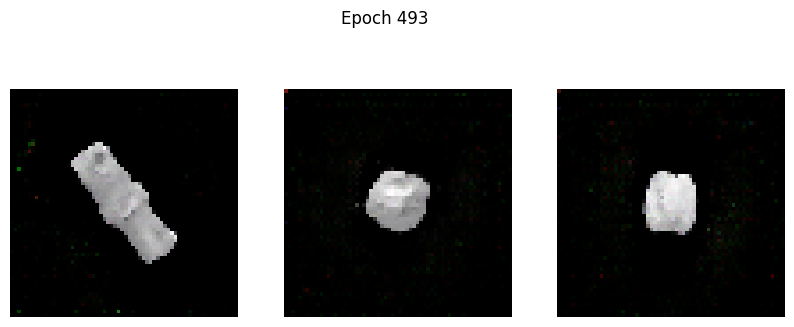

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0673 - g_loss: 6.6702
Epoch 494/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0697 - g_loss: 7.2796

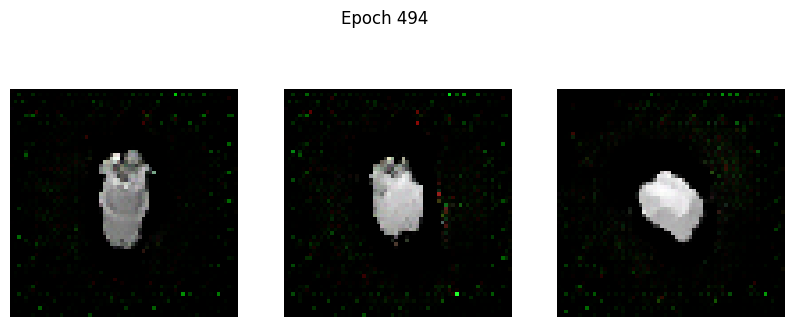

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0690 - g_loss: 7.2748
Epoch 495/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.1057 - g_loss: 6.3665

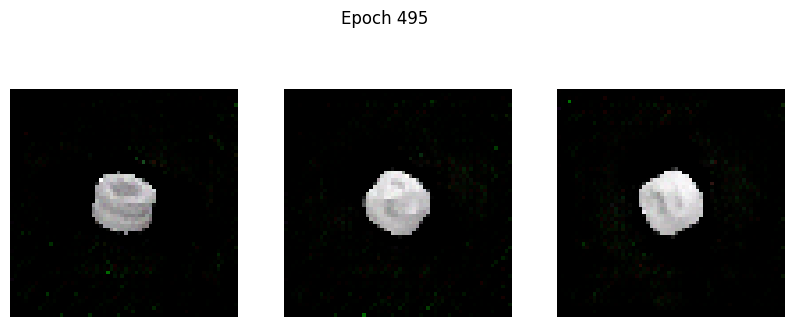

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.1057 - g_loss: 6.3662
Epoch 496/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.1259 - g_loss: 6.1386

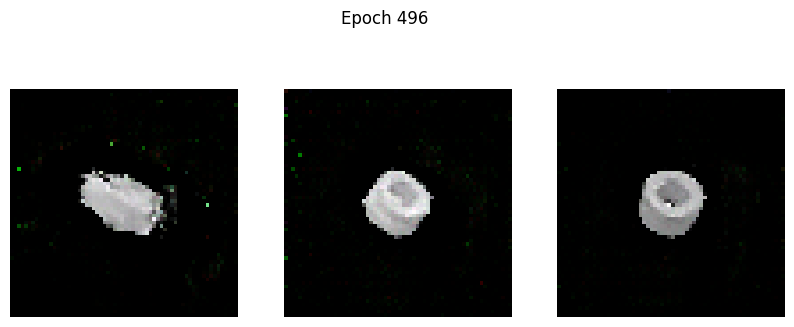

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.1256 - g_loss: 6.1424
Epoch 497/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0536 - g_loss: 6.7084

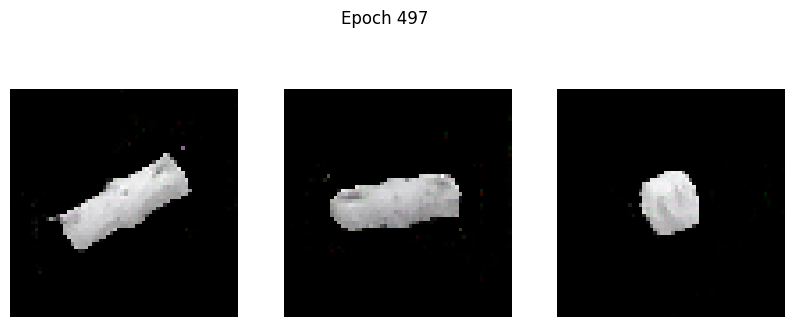

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0527 - g_loss: 6.7136
Epoch 498/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0602 - g_loss: 6.7025

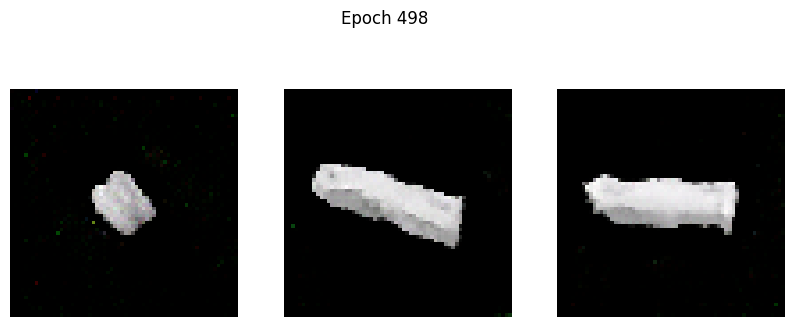

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0606 - g_loss: 6.7006
Epoch 499/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.1074 - g_loss: 6.6483

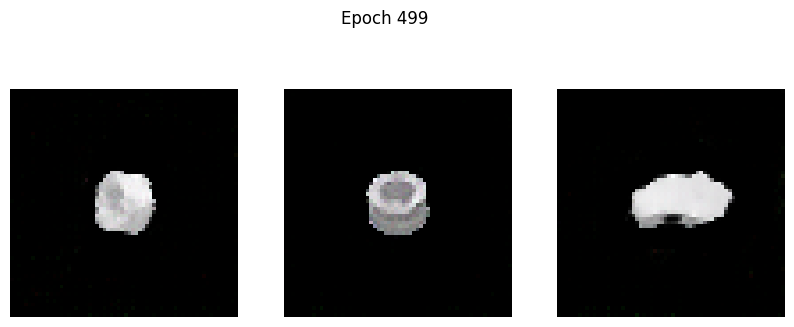

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.1070 - g_loss: 6.6491
Epoch 500/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0625 - g_loss: 6.8175

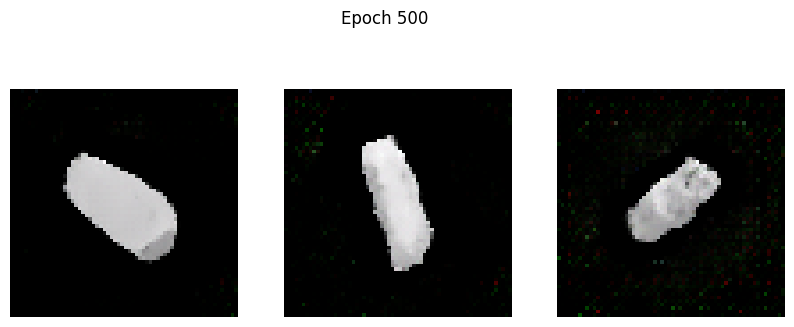

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0628 - g_loss: 6.8141


In [8]:
# Hyperparameters
EPOCHS = 500
lr_generator = 0.0002
lr_discriminator = 0.0002

# Inisialisasi DCGAN
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# Compile
dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=lr_discriminator, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=lr_generator, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

# Jalankan Training
print("Mulai Training...")
dcgan.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor(num_img=3, latent_dim=latent_dim)]
)

# **Simpan Model Generator**

In [9]:
# Simpan Model Generator
save_path = 'generator_model_lego_500_epochs.keras'

# Generator adalah atribut dari objek DCGAN yang sudah diinisialisasi
# Menggunakan format .keras yang merupakan format rekomendasi TensorFlow/Keras terbaru
dcgan.generator.save(save_path)

print(f"\n✅ Model Generator telah berhasil disimpan di: {save_path}")

# --- Opsional: Tampilkan cara memuat kembali model untuk inferensi ---

# from tensorflow import keras
# # Memuat model kembali (untuk pengujian atau penggunaan di masa depan)
# loaded_generator = keras.models.load_model(save_path)
# print("Model Generator berhasil dimuat.")

# # Contoh penggunaan model yang dimuat (Opsional)
# # new_noise = tf.random.normal(shape=(1, latent_dim))
# # generated_image = loaded_generator(new_noise, training=False)
# # generated_image = (generated_image * 127.5) + 127.5
# # plt.imshow(keras.utils.array_to_img(generated_image[0]))
# # plt.title("Generated Image from Saved Model")
# # plt.show()


✅ Model Generator telah berhasil disimpan di: generator_model_lego_500_epochs.keras


# **Menggunakan generaror & generate 5 gambar baru**


✅ Model Generator berhasil dimuat dari: generator_model_lego_500_epochs.keras

Menampilkan 5 Gambar Balok LEGO Baru:


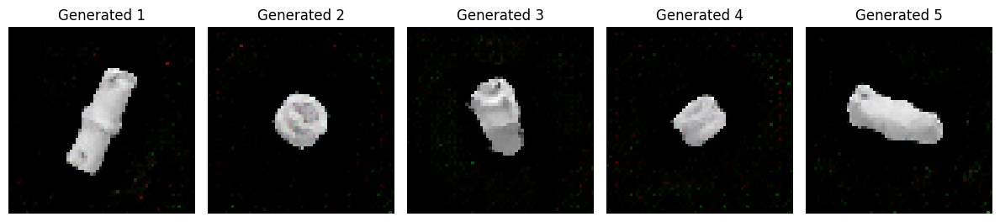

In [10]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt

# --- Konfigurasi yang sama seperti saat training ---
latent_dim = 128
NUM_TO_GENERATE = 5
save_path = 'generator_model_lego_500_epochs.keras'

# 1. Muat kembali model Generator yang telah disimpan
try:
    loaded_generator = keras.models.load_model(save_path)
    print(f"\n✅ Model Generator berhasil dimuat dari: {save_path}")

except Exception as e:
    print(f"\n❌ Gagal memuat model. Pastikan file '{save_path}' ada di direktori yang sama.")
    print(f"Error: {e}")
    # Jika gagal, kita coba buat dummy generator agar kode selanjutnya tidak error (Hanya untuk testing)
    # Anda harus mengganti bagian ini dengan arsitektur build_generator() Anda jika ingin menjalankannya tanpa file tersimpan.
    def build_generator():
        model = keras.Sequential(name="generator_dummy")
        model.add(keras.layers.Dense(8 * 8 * 512, input_shape=(latent_dim,)))
        model.add(keras.layers.Reshape((8, 8, 512)))
        model.add(keras.layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same'))
        model.add(keras.layers.Conv2DTranspose(3, (3, 3), strides=(2, 2), padding='same', activation='tanh'))
        return model
    loaded_generator = build_generator()
    print("Menggunakan dummy generator.")


# 2. Hasilkan vektor noise (latent vector) baru
random_latent_vectors = tf.random.normal(shape=(NUM_TO_GENERATE, latent_dim))

# 3. Gunakan Generator untuk membuat gambar
# Setting training=False penting agar BatchNormalization (jika ada) berjalan dalam mode inferensi.
generated_images = loaded_generator(random_latent_vectors, training=False)

# 4. Denormalisasi gambar
# Gambar di-output oleh tanh dalam rentang [-1, 1]. Kita perlu mengembalikannya ke [0, 255].
generated_images = (generated_images * 127.5) + 127.5
generated_images = generated_images.numpy().astype(np.uint8)

# 5. Tampilkan gambar yang dihasilkan
print(f"\nMenampilkan {NUM_TO_GENERATE} Gambar Balok LEGO Baru:")

fig = plt.figure(figsize=(12, 5))
for i in range(NUM_TO_GENERATE):
    plt.subplot(1, NUM_TO_GENERATE, i + 1)
    img = keras.utils.array_to_img(generated_images[i])
    plt.imshow(img)
    plt.title(f"Generated {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# Opsional: Simpan gambar ke file
# for i in range(NUM_TO_GENERATE):
#     img_to_save = keras.utils.array_to_img(generated_images[i])
#     img_to_save.save(f"generated_lego_final_{i+1}.png")
# print("\nGambar juga telah disimpan sebagai file PNG.")

# **Bukan 5 gambar baru menggunakan metode Latent Space**
# **Interpolation**


✅ Model Generator berhasil dimuat dari: generator_model_lego_500_epochs.keras
Dibuat 7 vektor interpolasi di ruang laten.

Menampilkan Hasil Latent Space Interpolation (Transisi):


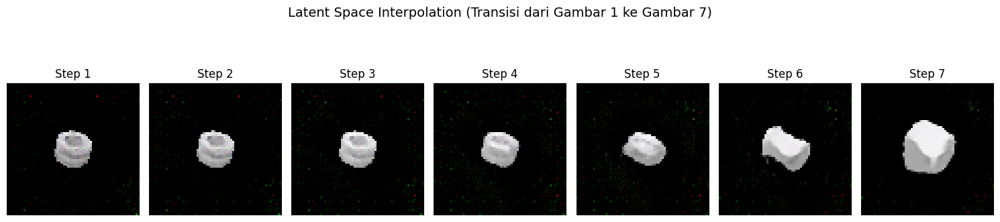


Total 7 gambar ditampilkan, menunjukkan transisi mulus di ruang laten.


In [11]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt

# --- Konfigurasi ---
latent_dim = 128
save_path = 'generator_model_lego_500_epochs.keras'
NUM_STEPS = 7 # Jumlah total gambar dalam sequence (2 endpoint + 5 interpolasi)

# 1. Muat kembali model Generator
try:
    loaded_generator = keras.models.load_model(save_path)
    print(f"\n✅ Model Generator berhasil dimuat dari: {save_path}")
except Exception as e:
    print(f"\n❌ Gagal memuat model. Pastikan file '{save_path}' ada.")
    print(f"Error: {e}")
    # Hentikan eksekusi jika gagal memuat model yang dilatih
    raise SystemExit("Eksekusi dihentikan karena gagal memuat Generator.")

# 2. Hasilkan dua vektor laten acak sebagai titik awal (A) dan akhir (B)
start_vector = tf.random.normal(shape=(1, latent_dim), seed=42) # Vektor A
end_vector = tf.random.normal(shape=(1, latent_dim), seed=123)   # Vektor B

# 3. Lakukan Interpolasi Linier (Latent Space Interpolation)
# Interpolasi linier dari A ke B adalah: (1 - alpha) * A + (alpha) * B
# di mana alpha bergerak dari 0 hingga 1.
interpolation_vectors = []
for i in range(NUM_STEPS):
    # Hitung nilai alpha (0, 0.2, 0.4, 0.6, 0.8, 1.0)
    alpha = i / (NUM_STEPS - 1)

    # Interpolasi vektor laten
    interpolated_vector = (1 - alpha) * start_vector + alpha * end_vector
    interpolation_vectors.append(interpolated_vector)

# Gabungkan semua vektor interpolasi menjadi satu tensor
latent_interpolation_tensor = tf.concat(interpolation_vectors, axis=0)
print(f"Dibuat {NUM_STEPS} vektor interpolasi di ruang laten.")

# 4. Gunakan Generator untuk membuat gambar dari vektor interpolasi
generated_images = loaded_generator(latent_interpolation_tensor, training=False)

# 5. Denormalisasi dan konversi ke tipe data gambar
generated_images = (generated_images * 127.5) + 127.5
generated_images = generated_images.numpy().astype(np.uint8)

# 6. Tampilkan gambar hasil interpolasi
print("\nMenampilkan Hasil Latent Space Interpolation (Transisi):")


fig = plt.figure(figsize=(15, 4))
plt.suptitle(f"Latent Space Interpolation (Transisi dari Gambar 1 ke Gambar {NUM_STEPS})", fontsize=14)

for i in range(NUM_STEPS):
    plt.subplot(1, NUM_STEPS, i + 1)
    img = keras.utils.array_to_img(generated_images[i])
    plt.imshow(img)
    plt.title(f"Step {i+1}")
    plt.axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Atur tata letak agar judul tidak terpotong
plt.show()

print(f"\nTotal {NUM_STEPS} gambar ditampilkan, menunjukkan transisi mulus di ruang laten.")